# Package Installation

In [1]:
import sys
print(sys.version)

3.10.11 (tags/v3.10.11:7d4cc5a, Apr  5 2023, 00:38:17) [MSC v.1929 64 bit (AMD64)]


In [ ]:
# install Rbeast library
!pip install Rbeast


[notice] A new release of pip is available: 23.0.1 -> 24.3.1
[notice] To update, run: C:\Users\Elain\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [ ]:
# install pmdarima library
!pip install pmdarima


[notice] A new release of pip is available: 23.0.1 -> 24.3.1
[notice] To update, run: C:\Users\Elain\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


If any error occurs in installing above packages, install/upgrade the following packages by commenting it out

In [ ]:
# !pip install patsy
# !pip install --upgrade statsmodels pmdarima


[notice] A new release of pip is available: 23.0.1 -> 24.3.1
[notice] To update, run: C:\Users\Elain\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.0.1 -> 24.3.1
[notice] To update, run: C:\Users\Elain\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [109]:
# pip install --upgrade pandas seaborn

# Library Import

In [11]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
# matplotlib.use('TkAgg')
# %matplotlib notebook
import seaborn as sns
import pickle
import os
import pandas as pd
import sklearn
from sklearn import metrics
from sklearn.metrics import mean_squared_error
import time
from pathlib import Path

from statsmodels.tsa.arima.model import ARIMA

from dotenv import load_dotenv

load_dotenv()  # take environment variables

print(f"Pandas version: {pd.__version__}")
print(f"Seaborn version: {sns.__version__}")

Pandas version: 2.3.3
Seaborn version: 0.13.2


In [ ]:
import pmdarima as pm
from pmdarima import auto_arima
import Rbeast as rb


# Extract Datasets through API

In [15]:
import os 
from dotenv import load_dotenv
load_dotenv()

api_key = os.getenv("API_KEY")
data_endpoint = os.getenv("DATA_ENDPOINT")
metadata_endpoint = os.getenv("METADATA_ENDPOINT")

# print(api_key)
# print(data_endpoint)
# print(metadata_endpoint)        


In [ ]:
# Define get_metadata function as mentioned in the final report
def get_metadata(url:str = metadata_endpoint, key:str = api_key):
  df = pd.read_json(url + "?api_key=" + key)
  for k in df.metadata[0].keys():
    df[k] = df.metadata.apply(lambda x: x[k])
  del df['metadata']

  return df

In [ ]:
# Define get_data function to extract time series data
def get_data(
    dataset_ids: list[int],
    url:str = data_endpoint,
    key:str = api_key,
    date_from:str = None
):
    ids = ','.join([str(x) for x in dataset_ids])
    url = url + "?api_key=" + key + "&dataset_id=" + ids
    if date_from:
      url += "&date_from=" + date_from
    print(url)
    df = pd.read_csv(url)
    return df

In [ ]:
# Get metadata and description of every availiable time-series dataset
df_metadata = get_metadata()
df_metadata.to_csv("metadata.csv")

# An example of the product category of invetory of time series datasets
stock_datasets = df_metadata.loc[
  (df_metadata['lifecycle_stage'] == 'actual')
  & (df_metadata['aspect_subtype'] == 'stock_level')
  & (df_metadata['frequency'] == 'monthly'),
  :]

date_from = min(stock_datasets.date_from_min)
df = get_data(stock_datasets.dataset_id, date_from = date_from)
# df.to_csv("inventories.csv")

# Process Data and Run Time Series Datasets by RBEAST

In [ ]:
# Define a minal time points to start RBeast
min_time_points = 5

#Filter out the datasets which are actual
df_actual = df_metadata[df_metadata["lifecycle_stage"] == "actual"]
pred_df_list = []

Download time series data and fit in RBEAST 

In [ ]:
#Define a function to extract the data series and train the model of BEAST
def get_data_and_fit_rbeast(row:pd.Series):
    y = []
    y_pred = []
    time_point = []
    df = get_data(dataset_ids=[row["dataset_id"]], date_from=row["date_from_min"])
    if df.shape[0] < 50:
        return
    
    df = df.set_index("Date")
    series_median = df.median()[0]
    
    df.iloc[df.iloc[:,0]<=(series_median/100),0] = np.nan
    df = df.fillna(method = "bfill").fillna(method ="ffill")
    
    beast = rb.beast(df, season="none")
    
    #Sort the change points (cp) in chronological order
    change_points = sorted(beast.trend.cp) + [df.shape[0]]
    
    for i in range(len(change_points)-1):
        if change_points[i+1] - change_points[i] >= min_time_points:
           start = int(change_points[i] + min_time_points)
           end = int(change_points[i+1]-1)
           y.extend(beast.data[start:end])
           time_point.extend(list(range(start,end)))
           y_pred.extend(beast.trend.Y[start-1:end-1] + beast.trend.slp[start-1:end-1])
    res_df = pd.DataFrame({'y':y,'y_pred':y_pred,'time_point':time_point})
    res_df["description"] = row["description"]
    res_df['category'] =  row['category']
    # global pred_df_list
    pred_df_list.append(res_df)

The next codes cell may take half an hour to run. If there is any interruption, please refer to the file of "prediction_outputs.csv" to carry on the script following it.

In [9]:
# Apply the data process and RBeast across all data series
df_actual.apply(get_data_and_fit_rbeast, axis=1)
pred_df = pd.concat(pred_df_list)

https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=17&date_from=2012-01-01

Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : Fals

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")


-Progress:100.0% done[==============================================================]
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=18&date_from=2012-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 129
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 148
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 120
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 120
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 120
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 120
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 120
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 120
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 120
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 176
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 176
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 176
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 176
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 176
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 176
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 176
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 176
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 176
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 176
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")


/Progress:100.0% done[==============================================================]
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=329&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")


\Progress:100.0% done[==============================================================]
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=339&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")


-Progress:100.0% done[==============================================================]
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=342&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")


|Progress:100.0% done[==============================================================]
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=356&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 62
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=411&date_from=2010-01-01

Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : Fals

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")


/Progress:100.0% done[==============================================================]
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=441&date_from=2010-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")


|Progress:100.0% done[==============================================================]
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=456&date_from=2010-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")


\Progress:100.0% done[==============================================================]
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=459&date_from=2010-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 91
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")


|Progress:100.0% done[==============================================================]
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=518&date_from=2012-01-01

Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Tren

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")


/Progress:100.0% done[==============================================================]
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=519&date_from=2012-01-01

Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Tren

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")


-Progress:100.0% done[==============================================================]
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=520&date_from=2012-01-01

Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Tren

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 151
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")


\Progress:100.0% done[==============================================================]
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=577&date_from=2012-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")


-Progress:100.0% done[==============================================================]
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=588&date_from=2012-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 93
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 93
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 93
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")


/Progress:100.0% done[==============================================================]
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=615&date_from=2013-01-01

Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 140
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Tren

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 140
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 140
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 140
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 140
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 140
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 140
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 140
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 140
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 140
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 140
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")


\Progress:100.0% done[==============================================================]
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=629&date_from=2012-01-01

Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Tren

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")


|Progress:100.0% done[==============================================================]
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=630&date_from=2012-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut

\Progress:100.0% done[==============================================================]
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=637&date_from=2012-01-01

Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Tren

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")


-Progress:100.0% done[==============================================================]
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=648&date_from=2012-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 176
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 176
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")


/Progress:100.0% done[==============================================================]
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=1279&date_from=2000-01-01

Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 176
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Tre

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")


-Progress:100.0% done[==============================================================]
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=1280&date_from=2000-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 176
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 176
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 176
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 176
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 176
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 176
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 176
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 236
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 236
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 236
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 236
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 236
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 236
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 271
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 312
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 188
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 257
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 271
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 252
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 252
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 271
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 187
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 114
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 296
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 235
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 236
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 236
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 236
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 236
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 236
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 236
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 236
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 236
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 236
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 236
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 236
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 236
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 271
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 271
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 271
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 271
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 165
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 165
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 165
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 257
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 257
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 257
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 257
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 271
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 271
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 271
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 271
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 252
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 252
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 252
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 252
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 252
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 252
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 252
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 252
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 272
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 271
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 271
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 271
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 271
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 187
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 187
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 187
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 271
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 776
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 777
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 777
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 777
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 777
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 613
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 776
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 776
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 776
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 351
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 351
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 351
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 351
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 773
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 773
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 773
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 773
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 773
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 773
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 773
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 409
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 409
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 409
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 409
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 1297
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missi

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 1297
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missi

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 1297
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missi

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 1297
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missi

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 1297
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missi

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 1297
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missi

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 245
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 184
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 290
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 184
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 290
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 290
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 250
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 290
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 254
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 283
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 290
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 290
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 290
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 290
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 290
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 206
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 290
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 184
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 290
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 290
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 206
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 279
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 184
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 290
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 290
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 290
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 184
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 271
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 262
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 290
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 290
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 290
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 290
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 184
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 184
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 156
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 156
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 141
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 141
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 156
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 189
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 189
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 189
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 192
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 189
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 189
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 189
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 189
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 189
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 189
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 189
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 189
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 189
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 189
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 189
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 188
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 165
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 165
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 178
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 165
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 164
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 135
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 152
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 154
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: Fut


Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 78
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 78
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 78
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 78
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 78
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 78
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 78
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 78
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 78
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 78
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 78
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 78
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 78
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 79
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 79
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 79
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 79
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 1080
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missi

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 1080
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missi

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 1080
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missi

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 1080
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missi

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 1080
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missi

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 1080
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missi

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 1080
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missi

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 1080
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missi

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 1080
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missi

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 185
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 192
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 84
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 84
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 103
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 189
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 153
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 72
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 72
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 72
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 72
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 72
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 72
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 72
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 72
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 72
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missing

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")



Model fitted:  Y =  trend + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 108
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  1 (unknown unit)
hasSeasonCmpnt: False | no periodic or seasonal component. The model Y=Trend+Error is fitted.
HasOutlierCmpt: False | If true, Y=Trend+Outlier+Error (experimental) is fitted instead of Y=Trend+Error 
Detrend       : False | If true, remove a global trend component before running BEAST & add it back after BEAST
MissingValue  : NaN  flagged as missin

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_median = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3867573598.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method = "bfill").fillna(method ="ffill")
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\3939861441.py:3: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  pred_df = pd.concat(pred_df_list)


In [ ]:
# Save to csv - the previously saved file is as part of the submission where you can export to peek into the data 
pred_df.to_csv("prediction_outputs.csv")

In [ ]:
# Save python list object
with open("prediction_outputs_list", "wb") as fp:   #Pickling
    pickle.dump(pred_df_list, fp)


The "prediction_outputs_list" was included in the submission. If you come across any interruption from the codes above, please comment out the next code cell to read the file and load the data. 

In [ ]:
# with open("prediction_outputs_list", "rb") as fp:   # Unpickling
#     pred_df_list = pickle.load(fp)
# pred_df = pd.concat(pred_df_list)

C:\Users\Elain\AppData\Local\Temp/ipykernel_12360/3940379677.py:3: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  pred_df = pd.concat(pred_df_list)


# Results Analysis and Evaluation

# R square of Prediction - Examples

In [ ]:
# Run R-Squared for the first item from the list as an example of the R-Squared evaluation
r_list = []
r2=metrics.r2_score(pred_df_list[0]['y'],pred_df_list[0]['y_pred'])
descrip = pred_df_list[0]['description'].iloc[0]
result_df = pd.DataFrame({'r2_score':[r2],'description':[descrip]})
r_list.append(result_df)
r2=metrics.r2_score(pred_df_list[1]['y'],pred_df_list[1]['y_pred'])
descrip = pred_df_list[1]['description'].iloc[2]
result_df = pd.DataFrame({'r2_score':[r2],'description':[descrip]})
r_list.append(result_df)
pd.concat(r_list)

,r2_score,description
0,0.266389,Monthly crude oil refinery inventories in Unit...
0,0.760079,Monthly crude oil terminal inventories in Unit...


# Define the function to calculate MAPE

In [ ]:
# Define function to calculate MAPE
def calculate_mape(actual, predicted):
    if not all([isinstance(actual, np.ndarray), isinstance(predicted, np.ndarray)]): 
        actual, predicted = np.array(actual), np.array(predicted)
        
    # Calculate the MAPE value and return 
    return round(np.mean(np.abs((actual - predicted) / actual)), 2)

# RMSPE

In [ ]:
# Define the function to calculate RMSPE
def calculate_rmspe(actual,predicted):
    '''
    Compute Root Mean Square Percentage Error between two arrays.
    '''
    if not all([isinstance(actual, np.ndarray), isinstance(predicted, np.ndarray)]): 
        actual, predicted = np.array(actual), np.array(predicted)
        
    loss = np.sqrt(np.mean(np.square(((actual - predicted) / actual)), axis=0))

    return loss

# Evaluation/Accuracy Measurement Summary

In [ ]:
#Summarize the accuracy scores of all data series and store values in a list of dataframe
accuracy_score_list = []
for i in pred_df_list:
    i = i[i['y']!=0]
    if i.shape[0]>=3:
        r2_score = metrics.r2_score(i['y'], i['y_pred'])
        description = i.description.iloc[0]
        category = i.category.iloc[0]
        MAPE = calculate_mape(i['y'], i['y_pred'])
        MSE = mean_squared_error(i['y'], i['y_pred'])
        RMSPE = calculate_rmspe(i['y'], i['y_pred'])
        output_df = pd.DataFrame({'r2_score':[r2_score],'MAPE':[MAPE],'RMSPE':[RMSPE],'MSE':[MSE],'description':[description], 'category':category})
       
        accuracy_score_list.append(output_df)
accuracy_score_df = pd.concat(accuracy_score_list)
accuracy_score_df = accuracy_score_df[accuracy_score_df['r2_score']!=0]
accuracy_score_df.to_csv("Accuracy_Measurement.csv")

# Histogram of Accuracy Measure by Category

In [15]:
oil_category = accuracy_score_df["category"].unique()
oil_category

array(['crude_oil', 'oil_products', 'NGLs', 'liquids', 'condensate',
       'biofuels', 'power'], dtype=object)

# Crude Oil

275 246


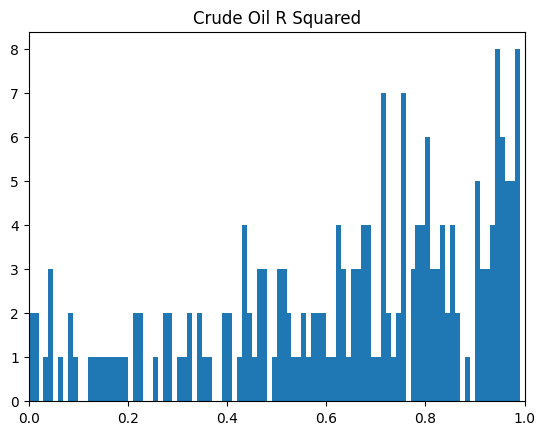

275 250


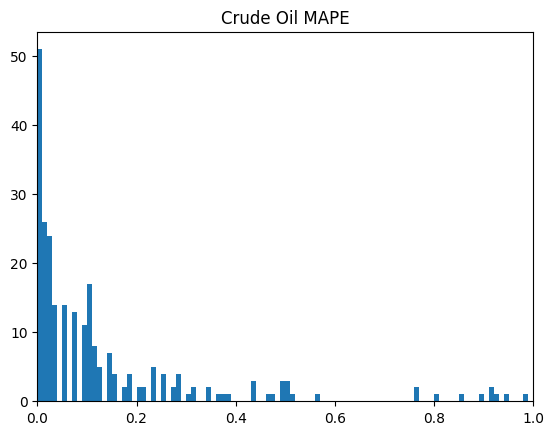

275 238


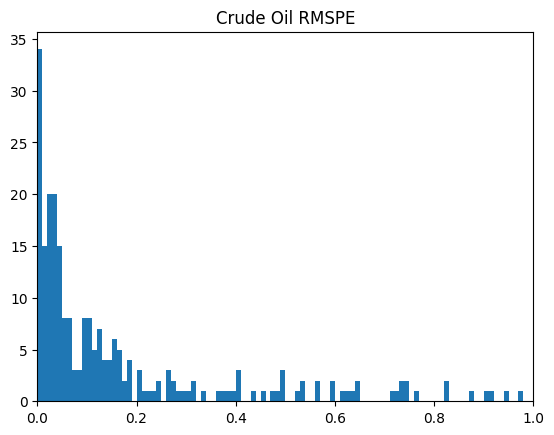

In [ ]:
# Extract all crude oil values by filtering
cat_df = accuracy_score_df[accuracy_score_df['category']=="crude_oil"]
print(cat_df.shape[0],cat_df[(cat_df['r2_score']<=1) & (cat_df['r2_score']>=0)].shape[0])

# Histogram of crude oil of all accuracy measures
plt.hist(cat_df['r2_score'], bins=np.arange(0, 1, 0.01))
plt.title("Crude Oil R Squared") 
plt.xlim(left=0, right = 1)
plt.show()
plt.hist(cat_df['MAPE'], bins = np.arange(0, 1, 0.01))
print(cat_df.shape[0], cat_df[(cat_df['MAPE']<=1) & (cat_df['MAPE']>=0)].shape[0])
plt.title("Crude Oil MAPE") 
plt.xlim(left=0, right = 1)
plt.show()
plt.hist(cat_df['RMSPE'], bins = np.arange(0, 1, 0.01))
print(cat_df.shape[0], cat_df[(cat_df['RMSPE']<=1) & (cat_df['RMSPE']>=0)].shape[0])
plt.title("Crude Oil RMSPE") 
plt.xlim(left=0, right = 1)
plt.show()

# Oil Products

797 728


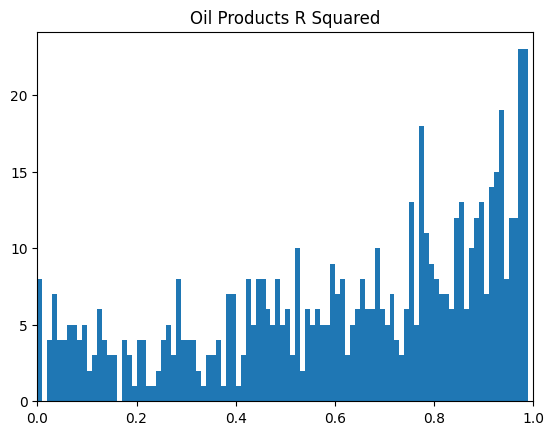

797 685


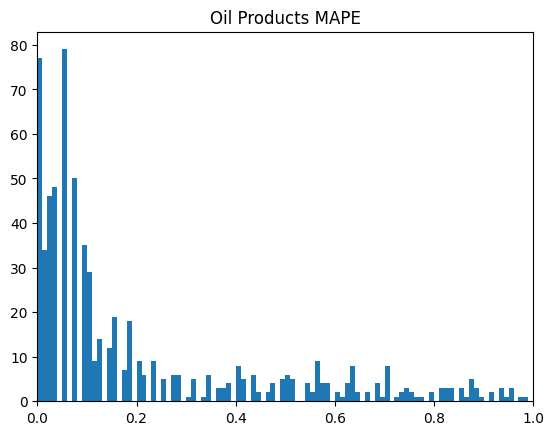

797 581


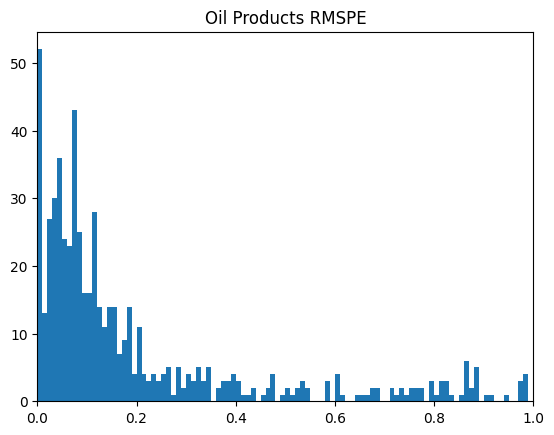

In [ ]:
# Extract all oil products values by filtering
cat_df = accuracy_score_df[accuracy_score_df['category']=="oil_products"]
print(cat_df.shape[0],cat_df[(cat_df['r2_score']<=1) & (cat_df['r2_score']>=0)].shape[0])

# Histogram of all oil products accuracy measures
plt.hist(cat_df['r2_score'], bins=np.arange(0, 1, 0.01))
plt.title("Oil Products R Squared") 
plt.xlim(left=0, right = 1)
plt.show()
plt.hist(cat_df['MAPE'], bins = np.arange(0, 1, 0.01))
print(cat_df.shape[0], cat_df[(cat_df['MAPE']<=1) & (cat_df['MAPE']>=0)].shape[0])
plt.title("Oil Products MAPE") 
plt.xlim(left=0, right = 1)
plt.show()
plt.hist(cat_df['RMSPE'], bins = np.arange(0, 1, 0.01))
print(cat_df.shape[0], cat_df[(cat_df['RMSPE']<=1) & (cat_df['RMSPE']>=0)].shape[0])
plt.title("Oil Products RMSPE") 
plt.xlim(left=0, right = 1)
plt.show()

# NGLs

25 24


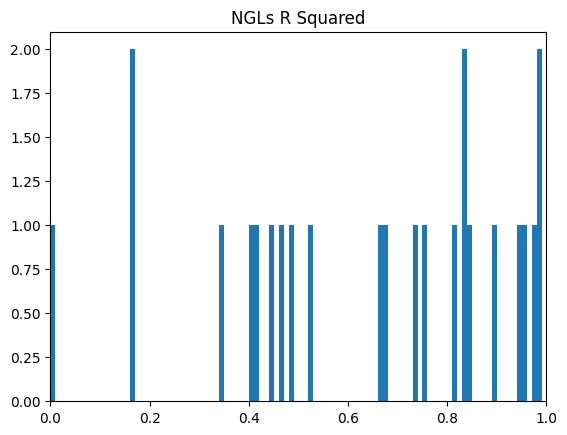

25 24


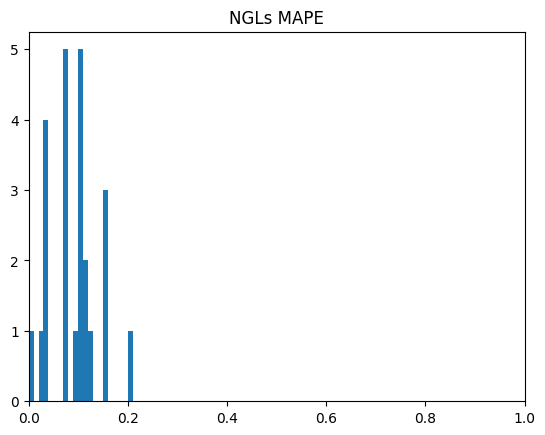

25 24


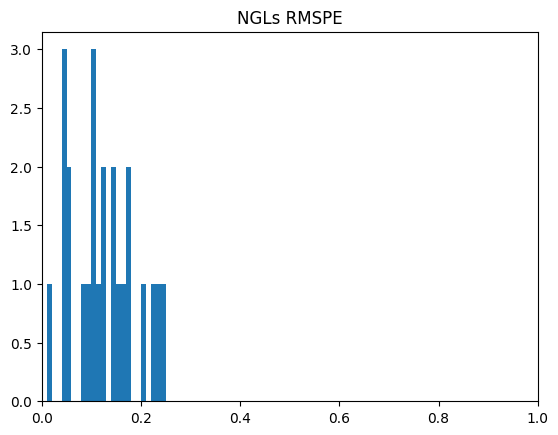

In [ ]:
# Extract all NGLs values by filtering
cat_df = accuracy_score_df[accuracy_score_df['category']=="NGLs"]
print(cat_df.shape[0],cat_df[(cat_df['r2_score']<=1) & (cat_df['r2_score']>=0)].shape[0])

# Histogram of all NGLs accuracy measures
plt.hist(cat_df['r2_score'], bins=np.arange(0, 1, 0.01))
plt.title("NGLs R Squared") 
plt.xlim(left=0, right = 1)
plt.show()
plt.hist(cat_df['MAPE'], bins = np.arange(0, 1, 0.01))
print(cat_df.shape[0], cat_df[(cat_df['MAPE']<=1) & (cat_df['MAPE']>=0)].shape[0])
plt.title("NGLs MAPE") 
plt.xlim(left=0, right = 1)
plt.show()
plt.hist(cat_df['RMSPE'], bins = np.arange(0, 1, 0.01))
print(cat_df.shape[0], cat_df[(cat_df['RMSPE']<=1) & (cat_df['RMSPE']>=0)].shape[0])
plt.title("NGLs RMSPE") 
plt.xlim(left=0, right = 1)
plt.show()

# Liquids

12 11


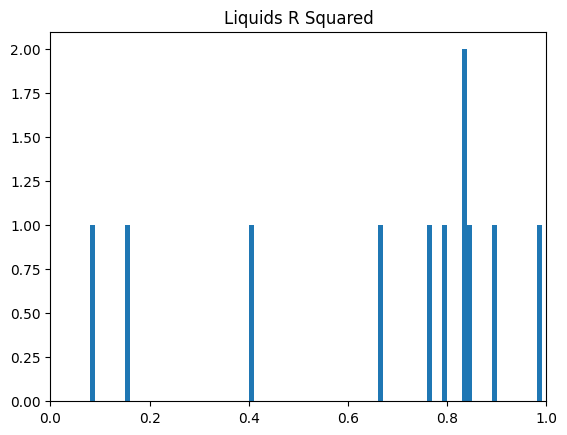

12 12


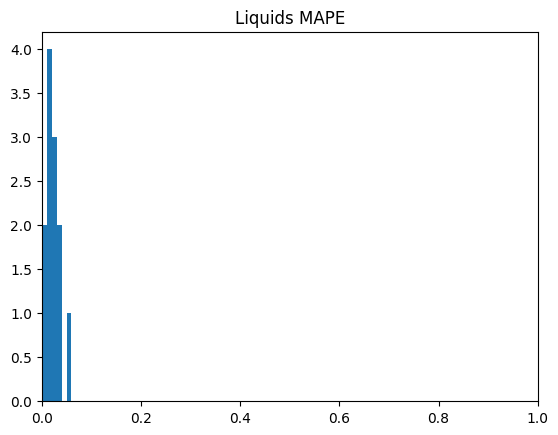

12 12


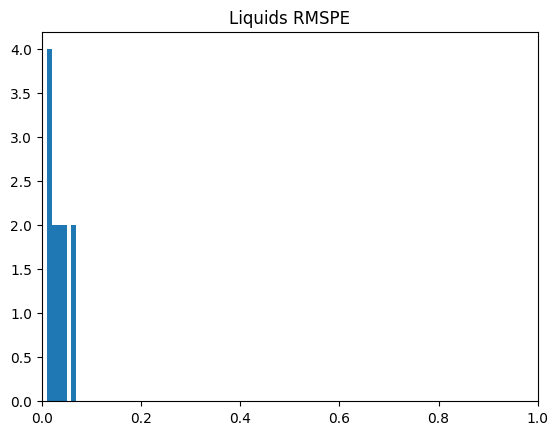

In [ ]:
# Extract all Liquids values by filtering
cat_df = accuracy_score_df[accuracy_score_df['category']=="liquids"]
print(cat_df.shape[0],cat_df[(cat_df['r2_score']<=1) & (cat_df['r2_score']>=0)].shape[0])

# Histogram of all Liquids accuracy measures
plt.hist(cat_df['r2_score'], bins=np.arange(0, 1, 0.01))
plt.title("Liquids R Squared") 
plt.xlim(left=0, right = 1)
plt.show()
plt.hist(cat_df['MAPE'], bins = np.arange(0, 1, 0.01))
print(cat_df.shape[0], cat_df[(cat_df['MAPE']<=1) & (cat_df['MAPE']>=0)].shape[0])
plt.title("Liquids MAPE") 
plt.xlim(left=0, right = 1)
plt.show()
plt.hist(cat_df['RMSPE'], bins = np.arange(0, 1, 0.01))
print(cat_df.shape[0], cat_df[(cat_df['RMSPE']<=1) & (cat_df['RMSPE']>=0)].shape[0])
plt.title("Liquids RMSPE") 
plt.xlim(left=0, right = 1)
plt.show()

# Condensate

3 3


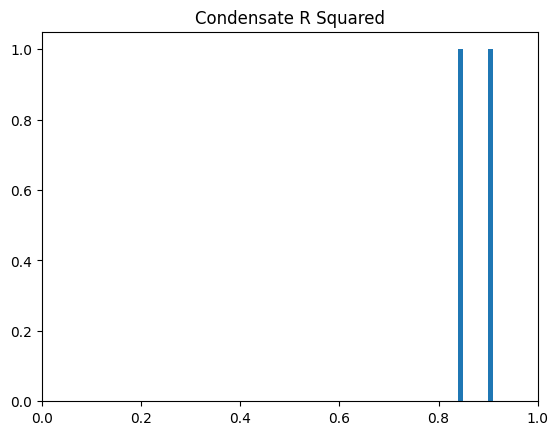

3 3


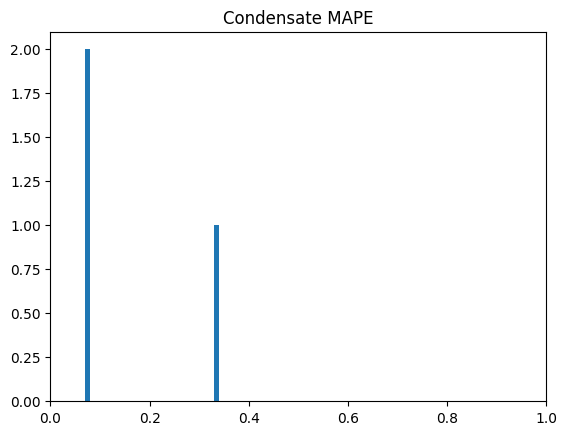

3 3


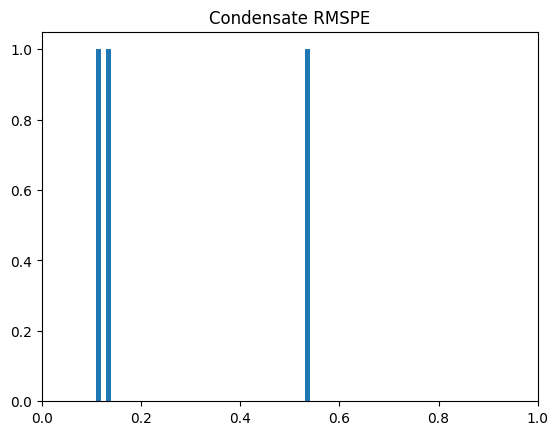

In [ ]:
# Extract all Condensate values by filtering
cat_df = accuracy_score_df[accuracy_score_df['category']=="condensate"]
print(cat_df.shape[0],cat_df[(cat_df['r2_score']<=1) & (cat_df['r2_score']>=0)].shape[0])

# Histogram of all Condensate accuracy measures
plt.hist(cat_df['r2_score'], bins=np.arange(0, 1, 0.01))
plt.title("Condensate R Squared") 
plt.xlim(left=0, right = 1)
plt.show()
plt.hist(cat_df['MAPE'], bins = np.arange(0, 1, 0.01))
print(cat_df.shape[0], cat_df[(cat_df['MAPE']<=1) & (cat_df['MAPE']>=0)].shape[0])
plt.title("Condensate MAPE") 
plt.xlim(left=0, right = 1)
plt.show()
plt.hist(cat_df['RMSPE'], bins = np.arange(0, 1, 0.01))
print(cat_df.shape[0], cat_df[(cat_df['RMSPE']<=1) & (cat_df['RMSPE']>=0)].shape[0])
plt.title("Condensate RMSPE") 
plt.xlim(left=0, right = 1)
plt.show()

# Biofuels

3 3


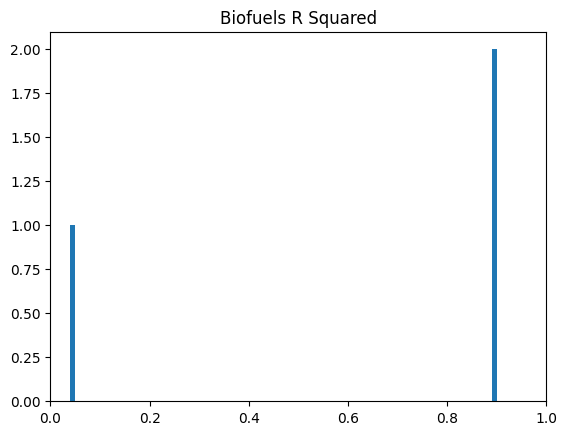

3 2


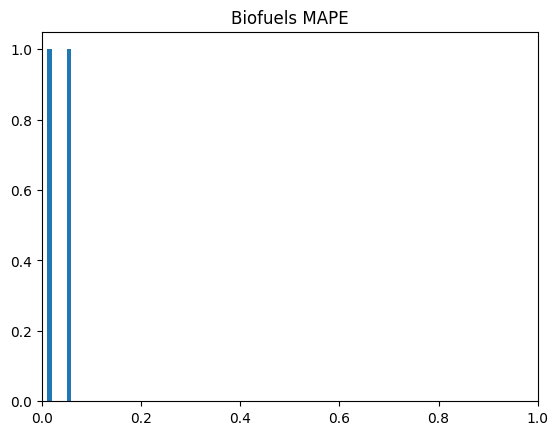

3 2


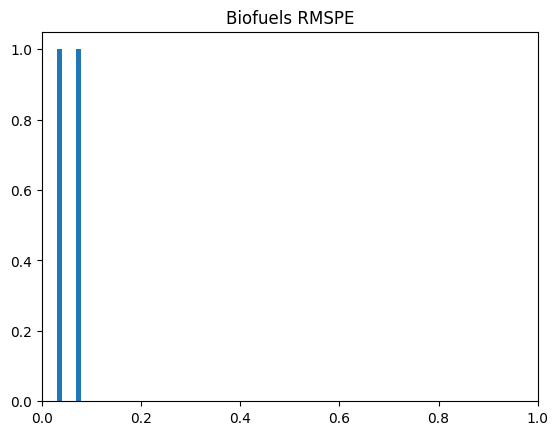

In [ ]:
# Extract all Biofuels values by filtering
cat_df = accuracy_score_df[accuracy_score_df['category']=="biofuels"]
print(cat_df.shape[0],cat_df[(cat_df['r2_score']<=1) & (cat_df['r2_score']>=0)].shape[0])

# Histogram of all Biofuels accuracy measures
plt.hist(cat_df['r2_score'], bins=np.arange(0, 1, 0.01))
plt.title("Biofuels R Squared") 
plt.xlim(left=0, right = 1)
plt.show()
plt.hist(cat_df['MAPE'], bins = np.arange(0, 1, 0.01))
print(cat_df.shape[0], cat_df[(cat_df['MAPE']<=1) & (cat_df['MAPE']>=0)].shape[0])
plt.title("Biofuels MAPE") 
plt.xlim(left=0, right = 1)
plt.show()
plt.hist(cat_df['RMSPE'], bins = np.arange(0, 1, 0.01))
print(cat_df.shape[0], cat_df[(cat_df['RMSPE']<=1) & (cat_df['RMSPE']>=0)].shape[0])
plt.title("Biofuels RMSPE") 
plt.xlim(left=0, right = 1)
plt.show()

# Power

9 9


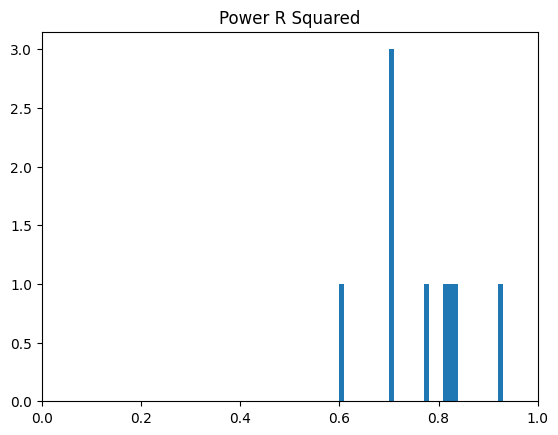

9 9


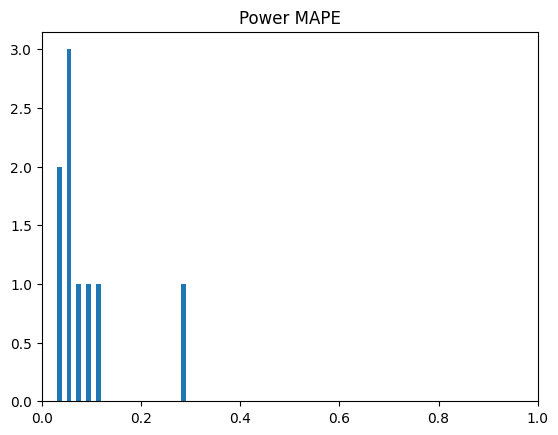

9 9


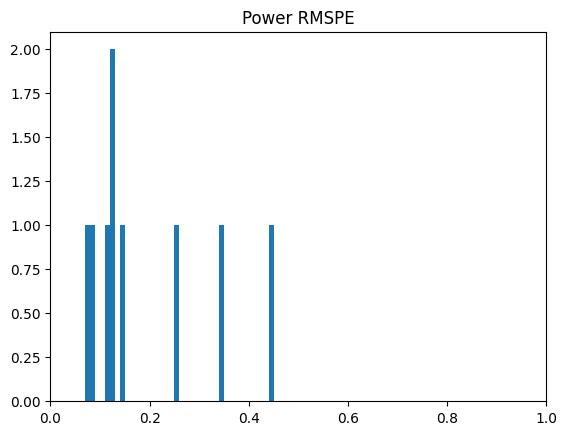

In [ ]:
# Extract all Power values by filtering
cat_df = accuracy_score_df[accuracy_score_df['category']=="power"]
print(cat_df.shape[0],cat_df[(cat_df['r2_score']<=1) & (cat_df['r2_score']>=0)].shape[0])

# Histogram of all Power accuracy measures
plt.hist(cat_df['r2_score'], bins=np.arange(0, 1, 0.01))
plt.title("Power R Squared") 
plt.xlim(left=0, right = 1)
plt.show()
plt.hist(cat_df['MAPE'], bins = np.arange(0, 1, 0.01))
print(cat_df.shape[0], cat_df[(cat_df['MAPE']<=1) & (cat_df['MAPE']>=0)].shape[0])
plt.title("Power MAPE") 
plt.xlim(left=0, right = 1)
plt.show()
plt.hist(cat_df['RMSPE'], bins = np.arange(0, 1, 0.01))
print(cat_df.shape[0], cat_df[(cat_df['RMSPE']<=1) & (cat_df['RMSPE']>=0)].shape[0])
plt.title("Power RMSPE") 
plt.xlim(left=0, right = 1)
plt.show()

# Alternative model of ARIMA to compare with the RBEAST method
The below section of codes are to train the datasets via auto_ARIMA with the 70/30 split ratio.

In [ ]:
#Define the list of predicted values dataframes
pred_df_list_arima = []

In [ ]:
# An example of auto-ARIMA outputs using the series of "Weekly total product inventories in United States in kb"
y_pred_wtpiUS = []
y_wtpiUS = []
time_point_wtpiUS = []

data_from_wtpiUS = "2001-01-01"
df_wtpiUS = get_data(dataset_ids=[1560], date_from=data_from_wtpiUS)
df_wtpiUS = df_wtpiUS.set_index("Date")

print(df_wtpiUS)
    
median_data_wtpiUS = df_wtpiUS.median()[0]
        
min_allowed_wtpiUS = median_data_wtpiUS/100
df_wtpiUS.iloc[(df_wtpiUS.iloc[:,0]<=min_allowed_wtpiUS),0] = np.nan

if df_wtpiUS.iloc[:, 0].isnull().all():
    pass
        
df_wtpiUS = df_wtpiUS.fillna(method='bfill').fillna(method='ffill')
df_lens_wtpiUS = df_wtpiUS.shape[0]

try:
        
    train_end_wtpiUS = int(df_lens_wtpiUS*0.7)
    test_lens_wtpiUS = df_lens_wtpiUS - train_end_wtpiUS
        
    model_wtpiUS = pm.auto_arima(df_wtpiUS[:train_end_wtpiUS], 
                    m=12,               # frequency of series                      
                    seasonal=True,  # TRUE if seasonal series
                    seasonal_test = 'ch',
                    d=None,             # let model determine 'd'
                    test='adf',         # use adftest to find optimal 'd'
                    start_p=0, start_q=0, # minimum p and q
                    max_p=12, max_q=12, # maximum p and q
                    D=None,             # let model determine 'D'
                    trace=True,
                    error_action='ignore',  
                    suppress_warnings=True, 
                    stepwise=True)
    c_wtpiUS, confint_wtpiUS = model_wtpiUS.predict(n_periods=test_lens_wtpiUS, return_conf_int=True)

    y_wtpiUS.extend(df_wtpiUS.iloc[train_end_wtpiUS:,0])
    y_pred_wtpiUS.extend(c_wtpiUS)
    time_point_wtpiUS.extend(list(range(train_end_wtpiUS,df_lens_wtpiUS)))

    res_df_wtpiUS = pd.DataFrame({'y':y_wtpiUS,'y_pred':y_pred_wtpiUS,'time_point':time_point_wtpiUS})
    res_df_wtpiUS["description"] = "Weekly total product inventories in United States in kb"
    res_df_wtpiUS["category"] = "crude_oil"

except Exception as error:
    print("Error occurs: ", error)
    print(df_wtpiUS, c_wtpiUS)

https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=1560&date_from=2001-01-01
            Weekly total product inventories in United States in kb
Date                                                               
2001-01-05                                           911061.0      
2001-01-12                                           906808.0      
2001-01-19                                           908845.0      
2001-01-26                                           906356.0      
2001-02-02                                           907639.0      
...                                                       ...      
2024-10-18                                          1257860.0      
2024-10-25                                          1248367.0      
2024-11-01                                          1247238.0      
2024-11-08                                          1240763.0      
2024-11-15                                          

C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\2444384553.py:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data_wtpiUS = df_wtpiUS.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\2444384553.py:19: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_wtpiUS = df_wtpiUS.fillna(method='bfill').fillna(method='ffill')


 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=17622.243, Time=0.98 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=17618.349, Time=0.07 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=17624.903, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=17622.404, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=17621.288, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=17620.234, Time=0.52 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=17620.234, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=17623.011, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=17620.520, Time=0.19 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=17619.361, Time=0.99 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 4.022 seconds


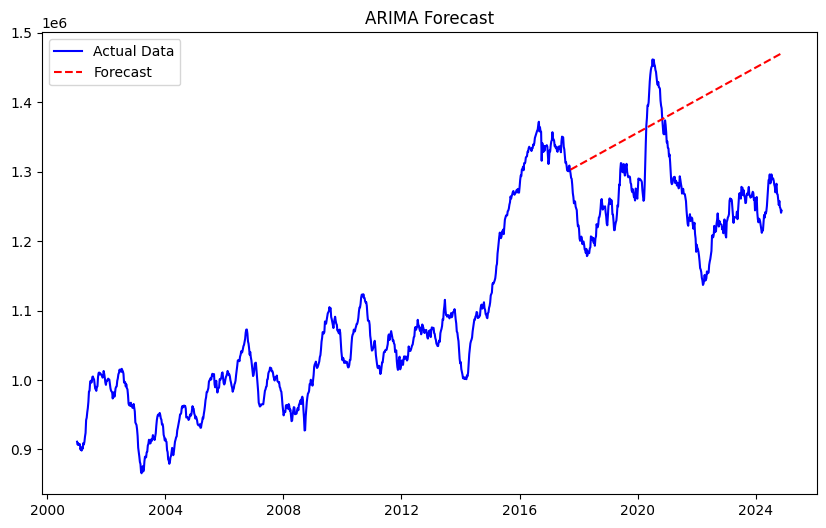

In [ ]:
# Plot the forecasts vs actuals of the example 
import matplotlib.pyplot as plt

# Convert index to time series
df_wtpiUS.index = pd.to_datetime(df_wtpiUS.index)

plt.figure(figsize=(10, 6))
plt.plot(df_wtpiUS.iloc[:,0], label='Actual Data', color='blue')
plt.plot(c_wtpiUS, label='Forecast', color='red', linestyle='--')
plt.title("ARIMA Forecast")
plt.legend()
plt.show()

# c_wtpiUS

Automation of fitting auto-ARIMA to all time series by defining a function to process and train the model. 

In [ ]:
# Define the function to extract and clean the data and model auto - ARIMA across all time series
def get_data_and_fit_arima(row:pd.Series):

    y_pred = []
    y = []
    time_point = []

    df = get_data(dataset_ids=[row["dataset_id"]], date_from=row["date_from_min"])
    df = df.set_index("Date")
    
    median_data = df.median()[0]
        
    min_allowed = median_data/100
    df.iloc[(df.iloc[:,0]<=min_allowed),0] = np.nan

    if df.iloc[:, 0].isnull().all():
        return
        
    df = df.fillna(method='bfill').fillna(method='ffill')
    df_lens = df.shape[0]

    try:
        
        train_end = int(df_lens*0.7)
        test_lens = df_lens - train_end
      
        model = pm.auto_arima(df[:train_end], 
                        m=12,               # frequency of series                      
                        seasonal=True,  # TRUE if seasonal series
                        seasonal_test = 'ch',
                        d=None,             # let model determine 'd'
                        test='adf',         # use adftest to find optimal 'd'
                        start_p=0, start_q=0, # minimum p and q
                        max_p=12, max_q=12, # maximum p and q
                        D=None,             # let model determine 'D'
                        trace=True,
                        error_action='ignore',  
                        suppress_warnings=True, 
                        stepwise=True)
        c, confint = model.predict(n_periods=test_lens, return_conf_int=True)

        y.extend(df.iloc[train_end:,0])
        y_pred.extend(c)
        time_point.extend(list(range(train_end,df_lens)))

        res_df = pd.DataFrame({'y':y,'y_pred':y_pred,'time_point':time_point})
        res_df["description"] = row["description"]
        res_df["category"] = row["category"]

        pred_df_list_arima.append(res_df)
    except Exception as error:
        print("Error occurs: ", error)
        print(df)

Warining: the next code cell can take more than 15 hours to complete given the large amount of data to be processed. The predicted values from the auto ARIMA have been saved as "arima_pred.csv" and submitted. You can read the csv directly to carry on with the rest of the script.

In [ ]:
# Apply the function to train all data series
df_actual.apply(get_data_and_fit_arima, axis=1)

pred_df_arima = pd.concat(pred_df_list_arima)

https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=17&date_from=2012-01-01
Performing stepwise search to minimize aic


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1524.267, Time=0.64 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1524.686, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1486.304, Time=0.37 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1492.410, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2006.239, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1484.332, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1486.318, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1488.298, Time=0.83 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1485.219, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=1483.332, Time=0.25 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=1484.882, Time=0.70 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=1485.290, Time=0.45 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=1484.085, Time=1.24 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1493.022, Time=0.38 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=1482.570, Time=0.58

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1462.005, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1460.162, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1436.946, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1420.464, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1458.169, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1418.741, Time=0.25 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1420.407, Time=0.65 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1422.244, Time=0.87 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1420.602, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1420.621, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1435.518, Time=0.01 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1416.744, Time=0.15 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=1418.409, Time=0.41 sec
 ARIMA(0,1,1)(0,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1267.847, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1264.787, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1253.464, Time=0.47 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1246.991, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1262.830, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1245.040, Time=0.23 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1246.988, Time=0.40 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1240.503, Time=0.26 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1241.669, Time=0.79 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1241.679, Time=0.59 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1251.681, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1242.028, Time=0.58 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1242.298, Time=0.70 sec
 ARIM

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1596.210, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1580.755, Time=0.63 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1574.130, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1594.245, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1573.328, Time=0.19 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1573.939, Time=0.64 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.80 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1573.758, Time=0.42 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1574.376, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1578.901, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1574.957, Time=0.62 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1571.756, Time=0.19 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=1572.401, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12]     

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1241.017, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1237.936, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1239.789, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1239.116, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1238.377, Time=0.04 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1226.286, Time=0.72 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=1224.237, Time=1.71 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.21 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=1225.990, Time=2.06 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=1224.973, Time=1.51 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=1233.155, Time=0.90 sec
 ARIMA(2,1,0)(2,0,1)[12] intercept   : AIC=1226.221, Time=1.89 sec
 ARIMA(1,1,1)(2,0,1)[12] intercept   : AIC=1226.177, Time=1.96 sec
 ARIMA(0,1,1)(2,0,1)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1302.170, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1300.316, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1296.326, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1295.441, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1298.324, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1295.318, Time=0.13 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1295.439, Time=0.33 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1297.095, Time=0.95 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1296.649, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1296.363, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1293.319, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=1293.439, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12]     

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1309.829, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1304.426, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1289.696, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1307.829, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1289.791, Time=0.17 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1291.558, Time=0.92 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1289.743, Time=0.33 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=1292.250, Time=1.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1310.994, Time=0.51 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1289.616, Time=0.53 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1289.302, Time=0.22 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1289.568, Time=0.60 sec
 ARIMA(1,1,1)(1,0,1)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=903.702, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=900.982, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=896.668, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=903.061, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=894.937, Time=0.33 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=896.636, Time=0.29 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=895.220, Time=0.19 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=895.145, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=899.098, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=897.099, Time=0.52 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=897.380, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 4.089 seconds
https://api.energyaspects.com

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1203.639, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1200.606, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1195.838, Time=0.35 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1193.439, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1198.760, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1191.492, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1193.428, Time=0.38 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.18 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1193.368, Time=0.32 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1193.343, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1193.948, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1195.336, Time=0.43 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1189.827, Time=0.12 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=1191.752, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1469.295, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1467.507, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1462.796, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1461.666, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1465.514, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1460.495, Time=0.15 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1461.983, Time=0.30 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1462.467, Time=0.86 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1462.483, Time=0.19 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1462.483, Time=0.32 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1461.392, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1463.360, Time=0.64 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1458.570, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=1460.089, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=1459.777, Time=0.30

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1367.728, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1371.142, Time=0.45 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1371.030, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1366.844, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1369.352, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1369.225, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1369.536, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1369.540, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1369.792, Time=0.59 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.681 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=28&date_from=2012-01-01
Performing stepwise search to minimize aic


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1585.725, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1569.645, Time=0.38 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1557.373, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1583.741, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1556.028, Time=0.18 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1557.113, Time=0.56 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.46 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1556.358, Time=0.66 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1556.573, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1568.065, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1558.496, Time=0.47 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1554.055, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=1555.145, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=1555.405, Time=0.25 sec
 ARIM

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1675.746, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1608.751, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1638.666, Time=0.51 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2310.944, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1606.958, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1608.804, Time=0.39 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1597.809, Time=0.39 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1599.748, Time=0.73 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1599.775, Time=0.30 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=1597.509, Time=0.31 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=1599.497, Time=0.60 sec
 ARIMA(3,0,0)(0,0,1)[12] intercept   : AIC=1599.507, Time=0.50 sec
 ARIMA(3,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1627.933, Time=1.02 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1655.456, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1536.158, Time=0.78 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1566.271, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2094.048, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1566.238, Time=0.01 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1532.270, Time=1.66 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.99 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1520.231, Time=0.89 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1522.028, Time=0.46 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1516.714, Time=1.88 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1514.814, Time=0.94 sec
 ARIMA(0,0,0)(0,0,2)[12] intercept   : AIC=1619.125, Time=0.51 sec
 ARIMA(2,0,0)(0,0,2)[12] intercept   : AIC=1516.300, Time=0.73 sec
 ARIMA(1,0,1)(0,0,2)[12] intercept   : AIC=1516.578, Time=0.79 sec


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1078.955, Time=1.02 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1105.626, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=966.099, Time=1.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1029.876, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1489.439, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1004.334, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=963.282, Time=1.76 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.91 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=964.100, Time=1.98 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1082.709, Time=2.39 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=961.455, Time=2.43 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=964.478, Time=1.03 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.36 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=971.579, Time=1.70 sec
 ARIMA(3,0,0)(2,0,0)[12] intercept 

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=994.938, Time=1.45 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=992.335, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=994.155, Time=0.45 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=993.873, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1120.392, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=992.962, Time=0.19 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=992.996, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=993.586, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=993.168, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=994.520, Time=0.16 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 2.932 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=33&date_from=2012-01-01
Performing stepwise search to minimize aic


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1601.335, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1602.598, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1536.353, Time=0.46 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1555.444, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2074.648, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1547.740, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1537.931, Time=1.02 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1529.178, Time=1.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1527.323, Time=0.53 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1525.946, Time=0.76 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1528.267, Time=2.14 sec
 ARIMA(0,0,0)(0,0,2)[12] intercept   : AIC=1600.388, Time=0.45 sec
 ARIMA(2,0,0)(0,0,2)[12] intercept   : AIC=1525.948, Time=0.95 sec
 ARIMA(1,0,1)(0,0,2)[12] intercept   : AIC=1525.878, Time=0.80 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=1527.403, Time=0.66

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=994.364, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1037.448, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=946.551, Time=0.83 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=956.372, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1397.070, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=975.675, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=948.485, Time=1.76 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=948.422, Time=1.22 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=952.154, Time=0.82 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.84 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=992.578, Time=0.70 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=947.025, Time=0.94 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=946.276, Time=1.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=968.305, Time=0.36 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept 

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=696.450, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=673.074, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=664.797, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=694.451, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=663.128, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=664.836, Time=0.13 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=666.772, Time=0.28 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=664.323, Time=0.16 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=664.647, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=671.092, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=665.140, Time=0.36 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=661.137, Time=0.02 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=662.853, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1042.447, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1039.648, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1020.524, Time=0.97 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1024.717, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1398.763, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1021.142, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1022.502, Time=1.85 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1022.800, Time=0.96 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1020.803, Time=0.36 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1024.503, Time=2.26 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1040.495, Time=0.64 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1022.403, Time=1.24 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=1022.938, Time=1.14 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=1024.476, Time=1.02 sec
 ARIMA(2,0,1)(1,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1394.384, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1400.908, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1295.058, Time=0.91 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1335.520, Time=0.61 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1821.954, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1322.214, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1296.691, Time=1.83 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1304.566, Time=1.22 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1302.375, Time=0.93 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.98 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1402.806, Time=0.19 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1301.521, Time=1.37 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=1305.480, Time=0.78 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=1333.114, Time=0.75 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=1304.099, Time=1.63 sec


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1284.361, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1289.060, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1144.827, Time=0.75 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1208.831, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1562.571, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1178.244, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1146.792, Time=1.60 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1146.789, Time=0.83 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1154.193, Time=0.60 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.93 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1283.076, Time=0.55 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1146.134, Time=0.98 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=1146.176, Time=0.84 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=1207.613, Time=0.70 sec
 ARIMA(2,0,1)(1,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1097.184, Time=1.04 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1165.379, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1066.998, Time=0.79 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1094.619, Time=0.50 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1400.991, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1091.757, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1059.440, Time=1.47 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1064.495, Time=2.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1067.737, Time=1.19 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.73 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1057.634, Time=1.84 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1067.362, Time=1.29 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=1066.706, Time=2.84 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1078.740, Time=1.73 sec
 ARIMA(3,0,0)(2,0,0)[12] intercept   : AIC=1065.818, Time=2.18 sec


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1255.365, Time=1.05 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1269.768, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1232.007, Time=1.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1243.253, Time=0.43 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1654.710, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1235.709, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1233.538, Time=1.79 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1234.685, Time=1.28 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1233.387, Time=0.34 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1235.262, Time=1.83 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1271.528, Time=0.14 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1227.841, Time=1.24 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1231.944, Time=0.21 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1230.340, Time=1.40 sec
 ARIMA(2,0,0)(1,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1346.032, Time=0.97 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1369.066, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1292.638, Time=1.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1315.378, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1780.835, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1331.972, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1312.999, Time=1.59 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1305.598, Time=1.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1306.648, Time=0.68 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.26 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1370.601, Time=0.20 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1312.631, Time=1.25 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=1306.092, Time=2.02 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=1304.730, Time=0.86 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIM

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1227.218, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1228.429, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1214.790, Time=0.43 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1176.964, Time=0.57 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1226.587, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1176.437, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1176.707, Time=0.51 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1178.257, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1178.149, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1213.149, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1182.806, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 3.867 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=818.488, Time=0.52 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=814.667, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=818.122, Time=0.59 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=818.098, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1024.584, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=816.502, Time=0.31 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=816.489, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=816.259, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=816.242, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=818.251, Time=0.06 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 2.236 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=44&date_from=2012-01-01


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=929.559, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=981.342, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=903.678, Time=0.63 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=937.209, Time=0.52 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1221.223, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=957.731, Time=0.19 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.62 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=888.766, Time=1.53 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=930.865, Time=0.76 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.22 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=892.070, Time=2.02 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=917.428, Time=0.77 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=2.00 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=889.520, Time=1.39 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=8

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1512.891, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1509.466, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1512.648, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1512.380, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1507.482, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1511.175, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1511.093, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1510.766, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1510.463, Time=0.21 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1503.302, Time=0.61 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1504.766, Time=0.95 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1504.638, Time=0.98 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.17 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1503.973, Time=0.65 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIM

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=859.360, Time=1.05 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=869.726, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=847.657, Time=1.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=849.820, Time=0.46 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1164.871, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=855.870, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=849.583, Time=0.72 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=848.787, Time=0.87 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=846.861, Time=0.29 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=848.788, Time=0.81 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=850.786, Time=2.02 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=858.813, Time=0.37 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=847.607, Time=0.71 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=846.664, Time=1.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=854.869, Time=0.60 sec
 ARIMA(1,

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=897.882, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=890.676, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=893.904, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=895.949, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=899.029, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=886.198, Time=0.86 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.91 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.21 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=885.558, Time=0.67 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=889.565, Time=0.14 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.69 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=885.946, Time=0.42 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=inf, Time=1.76 sec
 ARIMA(0,1,0)(2,0,0)[12]             : AIC=883.575, Time=0.20 sec
 ARIMA(0,1,0)(1,0,0)[12]      

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=788.989, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=779.049, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=770.258, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=786.997, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=768.492, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=770.300, Time=0.24 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=767.178, Time=0.23 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=769.046, Time=0.41 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=769.017, Time=0.31 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,3)(0,0,0)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(1,1,3)(0,0,0)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=917.254, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=932.107, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=910.456, Time=0.66 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=912.140, Time=0.52 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1404.236, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=916.567, Time=0.01 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=911.260, Time=1.95 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=919.006, Time=1.46 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=908.894, Time=0.49 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=901.629, Time=1.98 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=907.588, Time=2.52 sec
 ARIMA(0,0,0)(0,0,2)[12] intercept   : AIC=905.018, Time=0.68 sec
 ARIMA(2,0,0)(0,0,2)[12] intercept   : AIC=897.679, Time=2.05 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=900.687, Time=0.63 sec
 ARIMA(2,0,0)(1,0,2)[12] intercept   : AIC=901.506, Time=2.34 sec
 ARIMA(2,

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=981.868, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1035.327, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=974.033, Time=0.85 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=993.169, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1395.516, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1004.206, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=971.309, Time=1.36 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=974.346, Time=1.87 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=981.996, Time=0.57 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1013.619, Time=1.40 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=985.849, Time=1.11 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=inf, Time=2.45 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=1013.474, Time=1.33 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=inf, Time=1.92 sec
 ARIMA(1,0,0)(2,0,0)[12]            

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1015.712, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=878.187, Time=0.67 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1196.352, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=932.716, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=863.398, Time=1.73 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=905.674, Time=0.52 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=866.416, Time=1.77 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=865.666, Time=2.05 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=894.447, Time=0.79 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=2.06 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=877.066, Time=1.93 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.56 sec
 ARIMA(0,0,1)(1,0,1)[12] int

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1082.318, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1036.957, Time=0.61 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1026.260, Time=0.89 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1513.749, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1076.605, Time=0.23 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=995.570, Time=0.95 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=1062.921, Time=1.61 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.70 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1084.091, Time=0.12 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=998.095, Time=1.25 sec
 ARIMA(0,0,2)(1,0,0)[12] intercept   : AIC=1036.502, Time=1.45 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=981.805, Time=1.87 sec
 ARIMA(1,0,2)(0,0,

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=891.729, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=902.875, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=889.488, Time=0.68 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=890.954, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1259.537, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=897.831, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=891.435, Time=1.51 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=883.851, Time=1.95 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=890.485, Time=1.39 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.50 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=2.50 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=888.199, Time=1.19 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=3.04 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=887.078, Time=1.40 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=i

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=905.119, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=903.154, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=891.622, Time=0.43 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=896.904, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1088.142, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=889.853, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=891.652, Time=0.59 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=893.335, Time=1.01 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=884.803, Time=0.32 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=886.439, Time=0.70 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=886.514, Time=0.41 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=887.692, Time=1.65 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=883.265, Time=0.29 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=885.135, Time=0.66 sec
 ARIMA(3,0,0)(0,0,1)[12] intercept   : AIC=885.162, Time=0.65 sec
 ARIMA(3,

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=698.188, Time=1.21 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=703.209, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=689.134, Time=0.93 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=692.160, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1038.573, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=693.686, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=690.934, Time=1.48 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=690.950, Time=1.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=689.976, Time=0.67 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=692.910, Time=1.31 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=696.632, Time=0.85 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=689.285, Time=1.52 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=686.298, Time=1.69 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=687.125, Time=0.57 sec
 ARIMA(1,0,1)(2,0,0)[12] interce

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=930.392, Time=1.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=986.808, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=919.693, Time=0.97 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=932.340, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1315.607, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=943.863, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=913.622, Time=0.88 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=910.087, Time=12221.52 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=907.406, Time=0.19 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=929.152, Time=0.08 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=913.661, Time=8.43 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=927.018, Time=7.01 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=3.81 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=913.447, Time=2.05 sec
 ARIMA(1,0,1)(1,0,1)[12] interce

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=563.269, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=568.037, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=558.758, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=555.131, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=566.482, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=558.400, Time=0.06 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=556.214, Time=0.32 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=556.860, Time=0.26 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=555.561, Time=0.29 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=557.973, Time=1.73 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=562.659, Time=0.08 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=554.528, Time=0.20 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=558.209, Time=0.09 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=555.163, Time=0.99 sec
 ARIMA(1,1,1)(0,0,2)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=421.487, Time=1.17 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=465.364, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=303.692, Time=0.64 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=386.239, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=948.038, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=301.696, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=303.692, Time=0.78 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=305.653, Time=1.06 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=285.515, Time=0.49 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=287.475, Time=0.95 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=287.479, Time=1.07 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=289.450, Time=2.32 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=286.031, Time=0.60 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=285.475, Time=0.79 sec
 ARIMA(2,0,1)(1,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=810.254, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=806.274, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=803.460, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=804.795, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=805.075, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=801.476, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=803.460, Time=0.17 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=805.416, Time=0.97 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=802.509, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=802.925, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=802.812, Time=0.14 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=803.942, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=800.755, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=802.755, Time=0.15 sec
 ARIMA(1,1,0)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1204.090, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1200.544, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1198.090, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1187.840, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1198.547, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1186.774, Time=0.21 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1187.643, Time=0.38 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1188.901, Time=0.58 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1183.975, Time=0.22 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1185.469, Time=0.41 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1185.556, Time=0.42 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1187.005, Time=0.92 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1196.171, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1182.861, Time=0.35 sec
 ARIMA(2,1,1)(1,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1234.957, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1239.297, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1226.265, Time=0.38 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1227.857, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1237.319, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1230.878, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1220.451, Time=0.73 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=1222.396, Time=0.97 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1222.919, Time=0.66 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1232.945, Time=0.42 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=1222.300, Time=0.93 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=1222.000, Time=0.95 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1220.131, Time=0.56 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1225.211, Time=0.34 sec
 ARIMA(0,1,1)(2,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1179.939, Time=1.10 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1194.906, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1099.378, Time=0.70 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1129.907, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1299.736, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1101.569, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1093.288, Time=0.74 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1093.435, Time=1.53 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1093.755, Time=0.86 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1182.555, Time=0.85 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1094.568, Time=1.27 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=1094.546, Time=1.21 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=1125.784, Time=1.01 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=1097.241, Time=2.29 sec
 ARIMA(1,0,0)(2,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=886.681, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=894.723, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=809.757, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=814.433, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=892.899, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=811.567, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=811.742, Time=0.50 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=811.746, Time=0.42 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=809.898, Time=0.31 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=813.547, Time=1.80 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=885.293, Time=0.14 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=804.788, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=810.105, Time=0.09 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=806.742, Time=0.63 sec
 ARIMA(2,1,0)(1,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=852.469, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=850.710, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=841.091, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=836.889, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=848.723, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=834.899, Time=1.00 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=836.887, Time=0.24 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=837.883, Time=0.33 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=832.414, Time=0.27 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=834.198, Time=0.36 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=834.222, Time=0.33 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=836.134, Time=0.58 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=839.304, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1537.134, Time=0.97 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1627.784, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1462.612, Time=0.72 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1516.267, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1891.259, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1508.334, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1446.051, Time=2.00 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1443.606, Time=1.73 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1442.623, Time=0.90 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1486.321, Time=0.42 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1442.383, Time=1.49 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1472.914, Time=1.08 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=2.34 sec
 ARIMA(0,0,0)(1,0,2)[12] intercept   : AIC=1486.929, Time=1.26 sec
 ARIMA(2,0,0)(1,0,2)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1107.669, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1107.352, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1082.343, Time=0.57 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1089.095, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1178.298, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1080.710, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1082.268, Time=0.37 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1083.334, Time=0.78 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1081.789, Time=0.21 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=1081.677, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1088.224, Time=0.18 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=1083.583, Time=0.42 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=1097.661, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.939 seconds
https://

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1098.705, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1095.048, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1091.225, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1086.560, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1093.111, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1084.627, Time=0.22 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1086.546, Time=0.39 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.63 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1080.930, Time=0.24 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=1082.930, Time=0.52 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=1082.930, Time=0.60 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.74 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,1,3)(0,0,0)[12] intercept   : 

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1151.861, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1187.251, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1081.200, Time=0.98 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1099.601, Time=0.50 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1711.454, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1106.172, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1087.805, Time=1.90 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1085.154, Time=1.79 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1085.983, Time=0.70 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1084.996, Time=2.38 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1189.122, Time=0.09 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1084.520, Time=1.65 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=1085.442, Time=1.32 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=1118.657, Time=0.84 sec
 ARIMA(2,0,1)(1,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=935.513, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=945.295, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=920.983, Time=0.47 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=924.711, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=943.370, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=941.690, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=922.422, Time=0.69 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=922.054, Time=0.43 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=923.121, Time=0.34 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=924.015, Time=0.88 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=933.698, Time=0.28 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=922.898, Time=0.69 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=922.885, Time=0.67 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=923.051, Time=0.54 sec
 ARIMA(2,1,1)(1,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1075.415, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1109.213, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1061.668, Time=0.99 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1058.970, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1649.101, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1083.818, Time=0.20 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=1060.986, Time=1.46 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=1060.914, Time=0.86 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=1062.456, Time=1.21 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=1062.917, Time=2.11 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=1073.371, Time=0.25 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=1060.184, Time=0.61 sec
 ARIMA(0,0,2)(0,0,1)[12] intercept   : AIC=1060.871, Time=0.66 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1058.766, Time=0.37 sec
 ARIMA(1,0,0)(0,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=916.637, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=912.728, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=898.701, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=880.600, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=910.759, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=880.808, Time=0.06 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=882.379, Time=0.46 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=882.053, Time=0.51 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=880.395, Time=0.26 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=882.359, Time=0.46 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.79 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=914.643, Time=0.13 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=881.479, Time=0.31 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=881.424, Time=0.37 sec
 ARIMA(1,1,2)(1,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1349.115, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1306.174, Time=0.81 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1309.839, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1951.987, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1308.761, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=2.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1305.583, Time=1.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1303.441, Time=0.53 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1305.441, Time=0.92 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.92 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=1344.038, Time=0.26 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1305.620, Time=0.57 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=1305.546, Time=0.57 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=inf, Time=0.24 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=522.117, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=522.781, Time=0.15 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.20 sec
 ARIMA(0,2,0)(1,0,0)[12]             : AIC=524.111, Time=0.17 sec
 ARIMA(0,2,0)(0,0,1)[12]             : AIC=524.112, Time=0.17 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=520.881, Time=0.02 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=522.792, Time=0.22 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=inf, Time=0.78 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=511.510, Time=0.10 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=513.467, Time=0.09 sec
 ARIMA(2,2,0)(0,0,1)[12]             : AIC=513.474, Time=0.10 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=inf, Time=0.62 sec
 ARIMA(3,2,0)(0,0,0)[12]             : AIC=511.744, Time=0.20 sec
 ARIMA(2,2,1)(0,0,0)[12]             : AIC=inf, T

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=329.583, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=326.457, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=324.461, Time=0.36 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=317.164, Time=0.57 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=325.350, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.40 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=319.160, Time=1.10 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=317.100, Time=0.62 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=318.995, Time=0.93 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=2.43 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=327.879, Time=0.31 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=inf, Time=1.26 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=inf, Time=1.48 sec
 ARIMA(1,1,2)(1,0,0)[12] intercept   : AIC=inf, Time=

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=inf, Time=0.76 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=564.910, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=560.244, Time=0.32 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.35 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=564.764, Time=0.02 sec
 ARIMA(1,2,0)(2,0,0)[12]             : AIC=559.510, Time=0.66 sec
 ARIMA(1,2,0)(2,0,1)[12]             : AIC=inf, Time=2.13 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=inf, Time=1.27 sec
 ARIMA(0,2,0)(2,0,0)[12]             : AIC=561.494, Time=0.58 sec
 ARIMA(2,2,0)(2,0,0)[12]             : AIC=553.949, Time=1.22 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=555.733, Time=0.51 sec
 ARIMA(2,2,0)(2,0,1)[12]             : AIC=inf, Time=2.81 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=inf, Time=1.44 sec
 ARIMA(3,2,0)(2,0,0)[12]             : AIC=553.737, Time=1.14 sec
 ARIMA(3,2,0)(1,0,0)[12]             : AIC=552.719, Time=

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=581.069, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=577.988, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=580.856, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=579.089, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=582.796, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=577.060, Time=0.74 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=579.060, Time=1.63 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.23 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=575.385, Time=0.68 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=576.154, Time=0.25 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=577.374, Time=0.65 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=577.008, Time=0.73 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=578.957, Time=1.29 sec
 ARIMA(0,1,0)(2,0,0)[12]             : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=548.467, Time=0.59 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=546.921, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=548.465, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=548.754, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=544.960, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=546.466, Time=0.55 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=546.758, Time=0.64 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=548.918, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=548.917, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=549.306, Time=0.35 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.912 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=334&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=383.521, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=383.567, Time=0.40 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=381.604, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=385.516, Time=0.22 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=385.513, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=381.568, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=383.566, Time=0.40 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=377.286, Time=0.08 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=379.271, Time=0.37 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=379.258, Time=0.44 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.78 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=379.26

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=522.246, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=519.017, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=521.410, Time=0.53 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=520.364, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=517.017, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=520.390, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=520.265, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=520.083, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=518.989, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.492 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=336&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=inf, Time=0.69 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=446.834, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=447.429, Time=0.15 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.28 sec
 ARIMA(0,2,0)(1,0,0)[12]             : AIC=448.039, Time=0.13 sec
 ARIMA(0,2,0)(0,0,1)[12]             : AIC=448.197, Time=0.10 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=445.762, Time=0.02 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=447.511, Time=0.15 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=inf, Time=0.79 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=438.742, Time=0.02 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=439.364, Time=0.22 sec
 ARIMA(2,2,0)(0,0,1)[12]             : AIC=439.722, Time=0.32 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=inf, Time=0.91 sec
 ARIMA(3,2,0)(0,0,0)[12]             : AIC=432.201, Time=0.23 sec
 ARIMA(3,2,0)(1,0,0)[12]             : AIC=431.97

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=355.279, Time=0.67 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=354.978, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=352.379, Time=0.36 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=347.174, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=353.353, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=347.542, Time=0.07 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.64 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=345.590, Time=0.49 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=346.950, Time=1.16 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=inf, Time=1.57 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=347.315, Time=0.71 sec
 ARIMA(0,1,2)(0,0,2)[12] intercept   : AIC=347.079, Time=0.71 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=inf, Time=1.74 sec
 ARIMA(1,1,2)(0,0,2)[12] intercept   : AIC=348.834, Time=1.08 sec
 ARIMA(0,1,1)(0,0,2)[12]             : AIC=34

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.50 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=529.987, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=526.001, Time=0.73 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=528.675, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=527.987, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=531.316, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=520.537, Time=1.05 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.35 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.83 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=521.058, Time=0.67 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=522.500, Time=1.14 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=inf, Time=1.71 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=519.959, Time=0.74 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=525.260, Time=0.65 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=520.82

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=543.173, Time=0.57 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=540.389, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=543.028, Time=0.39 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=541.934, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=538.405, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=541.175, Time=0.27 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=541.244, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=542.213, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=540.589, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.40 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.783 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=340&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=532.244, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=528.299, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=526.523, Time=0.58 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=526.771, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=560.297, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=524.950, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=526.509, Time=0.66 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=528.507, Time=0.56 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=526.707, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=526.817, Time=0.24 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=525.124, Time=0.30 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=522.439, Time=1.84 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=524.079, Time=2.44 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=523.071, Time=2.52 sec
 ARIMA(2,0,1)(1,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=526.051, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=529.683, Time=0.82 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=529.646, Time=0.63 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=524.063, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=527.724, Time=0.23 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=527.756, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=527.941, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=527.794, Time=0.18 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.134 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=342&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=565.277, Time=0.55 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=567.476, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=562.369, Time=0.24 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.41 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=567.388, Time=0.02 sec
 ARIMA(1,2,0)(2,0,0)[12]             : AIC=562.075, Time=0.54 sec
 ARIMA(1,2,0)(2,0,1)[12]             : AIC=inf, Time=1.28 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=562.489, Time=1.08 sec
 ARIMA(0,2,0)(2,0,0)[12]             : AIC=564.378, Time=0.33 sec
 ARIMA(2,2,0)(2,0,0)[12]             : AIC=555.944, Time=0.83 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=557.469, Time=0.47 sec
 ARIMA(2,2,0)(2,0,1)[12]             : AIC=inf, Time=2.29 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=inf, Time=1.25 sec
 ARIMA(3,2,0)(2,0,0)[12]             : AIC=555.427, Time=1.15 sec
 ARIMA(3,2,0)(1,0,0)[12]             : AIC=554.17

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=inf, Time=0.53 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=589.087, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=586.553, Time=0.27 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.19 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=589.701, Time=0.01 sec
 ARIMA(1,2,0)(2,0,0)[12]             : AIC=586.547, Time=0.31 sec
 ARIMA(1,2,0)(2,0,1)[12]             : AIC=587.907, Time=1.72 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=inf, Time=1.38 sec
 ARIMA(0,2,0)(2,0,0)[12]             : AIC=587.661, Time=0.63 sec
 ARIMA(2,2,0)(2,0,0)[12]             : AIC=582.425, Time=0.76 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=581.106, Time=0.52 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=580.950, Time=0.10 sec
 ARIMA(2,2,0)(0,0,1)[12]             : AIC=581.485, Time=0.50 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=inf, Time=1.75 sec
 ARIMA(3,2,0)(0,0,0)[12]             : AIC=578.87

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=500.046, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=503.932, Time=0.40 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=503.910, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=498.128, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=502.041, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=502.040, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=501.932, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=501.911, Time=0.30 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.59 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.170 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=345&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=346&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=347&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=348&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=-178.559, Time=1.23 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-182.556, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-186.285, Time=1.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-197.604, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-184.428, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-199.464, Time=0.53 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=-197.608, Time=0.99 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=-195.783, Time=2.44 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=-196.783, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=-197.625, Time=0.50 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-188.250, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=-195.464, Time=1.22 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=-201.351, Time=0.21 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=-199.554, Time=0.75 sec
 ARIMA(0,1,1)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=433.251, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=434.815, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=436.169, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=431.287, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=432.837, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=434.190, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=435.191, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=435.142, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.338 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=350&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=351&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=352&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=416.825, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=411.417, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=411.315, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=414.826, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=409.327, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=411.319, Time=0.23 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=411.152, Time=0.20 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=409.635, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=413.034, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=407.361, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=409.355, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=40

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=-178.559, Time=1.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-182.556, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-186.285, Time=0.92 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-197.604, Time=1.04 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-184.428, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-199.464, Time=0.29 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=-197.608, Time=0.89 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=-195.783, Time=0.64 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=-196.783, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=-197.625, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-188.250, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=-195.464, Time=0.66 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=-201.351, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=-199.554, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=355&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=433.251, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=434.815, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=436.169, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=431.287, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=432.837, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=434.190, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=435.191, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=435.142, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.348 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=356&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=343.116, Time=0.50 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=339.130, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=342.108, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=339.910, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=337.132, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=341.125, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=341.125, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=340.131, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=338.083, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.070 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=357&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=358&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=359&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=-178.559, Time=1.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-182.556, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-186.285, Time=1.65 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-197.604, Time=1.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-184.428, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-199.464, Time=0.41 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=-197.608, Time=1.46 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=-195.783, Time=2.51 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=-196.783, Time=0.32 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=-197.625, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-188.250, Time=0.14 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=-195.464, Time=1.19 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=-201.351, Time=0.19 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=-199.554, Time=0.61 sec
 ARIMA(0,1,1)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=416.816, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=411.409, Time=0.71 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=411.309, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=414.816, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=409.321, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=411.314, Time=0.28 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.34 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=411.149, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=409.625, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=413.027, Time=0.30 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=407.356, Time=0.02 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=409.349, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=40

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=480.218, Time=0.98 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=476.593, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=462.402, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=469.170, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=620.997, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=461.524, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=461.871, Time=0.48 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=463.896, Time=0.94 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=463.430, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=463.516, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=468.001, Time=0.21 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=463.423, Time=0.36 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=473.313, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.777 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=363&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=45.581, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=48.216, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=47.242, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=43.589, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=47.013, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=46.759, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=46.804, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=46.011, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.43 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.160 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=364&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=114.222, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=111.015, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=112.873, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=112.413, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=109.027, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=112.409, Time=0.39 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=112.525, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=112.135, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=111.593, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.758 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=365&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=434.253, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=418.614, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=413.465, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=602.532, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=413.159, Time=0.03 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=414.230, Time=0.62 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=415.134, Time=0.37 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=415.147, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=416.689, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=415.178, Time=0.49 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.14 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 4.365 seconds
https://api.energyaspects.com/dat

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=495.340, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=493.869, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=494.520, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=494.044, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=491.953, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=494.317, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=494.845, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=495.164, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=494.425, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.39 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.210 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=367&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=463.724, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=460.035, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=461.372, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=459.617, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=458.057, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=461.927, Time=0.20 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=461.945, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=459.647, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=458.250, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.37 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.894 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=368&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=369&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=481.589, Time=0.61 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=480.357, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=477.023, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=472.582, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=478.357, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=472.145, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=472.529, Time=0.27 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=474.524, Time=0.44 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=477.601, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=470.220, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=470.622, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=47

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=434.253, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=418.614, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=413.465, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=602.532, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=413.159, Time=0.03 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=414.230, Time=0.75 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=415.134, Time=0.57 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=415.147, Time=0.33 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=416.689, Time=0.01 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=415.178, Time=0.77 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.18 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 5.058 seconds
https://api.energyaspects.com/dat

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=130.477, Time=0.62 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=128.542, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=121.963, Time=0.88 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=121.835, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=294.953, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=120.387, Time=0.05 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=122.154, Time=1.01 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=123.751, Time=0.77 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=122.043, Time=0.17 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=122.100, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=120.976, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=124.036, Time=0.21 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 4.012 seconds
https://api.energyaspects

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=469.229, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=471.422, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=468.246, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=468.860, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=469.485, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=472.919, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=469.733, Time=0.47 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=469.833, Time=0.77 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=470.098, Time=0.29 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.39 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=467.978, Time=0.31 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=469.036, Time=0.41 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=469.523, Time=0.27 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=351.497, Time=0.47 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=348.340, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=344.176, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=339.287, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=390.751, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=337.852, Time=0.12 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=339.207, Time=0.19 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=341.150, Time=0.51 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=339.794, Time=0.08 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=339.703, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=343.052, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=340.360, Time=0.30 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=363.699, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.355 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=375&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=376&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=433.540, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=418.286, Time=0.55 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=412.752, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=604.847, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=412.471, Time=0.07 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=413.537, Time=0.41 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=414.119, Time=0.76 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=414.419, Time=0.26 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=414.443, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=416.357, Time=0.01 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=414.467, Time=0.68 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.12 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 4.057 seconds
https://api.energyaspects.com

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=484.735, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=488.773, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=481.398, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=476.266, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=486.787, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=478.594, Time=0.36 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=482.825, Time=0.47 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=480.340, Time=0.45 sec
 ARIMA(1,1,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.72

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=483.891, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=483.359, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=484.980, Time=0.56 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=486.189, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=610.674, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=483.674, Time=0.47 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=484.430, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=485.347, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=485.346, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=487.342, Time=0.18 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 2.853 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=379&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=inf, Time=0.27 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=522.343, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=523.036, Time=0.16 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.13 sec
 ARIMA(0,2,0)(1,0,0)[12]             : AIC=524.339, Time=0.16 sec
 ARIMA(0,2,0)(0,0,1)[12]             : AIC=524.339, Time=0.14 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=521.125, Time=0.02 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=523.046, Time=0.18 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=inf, Time=0.86 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=511.673, Time=0.07 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=513.644, Time=0.11 sec
 ARIMA(2,2,0)(0,0,1)[12]             : AIC=513.649, Time=0.20 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=inf, Time=0.96 sec
 ARIMA(3,2,0)(0,0,0)[12]             : AIC=511.885, Time=0.17 sec
 ARIMA(2,2,1)(0,0,0)[12]             : AIC=inf, T

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=329.297, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=326.123, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=324.035, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=325.030, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=323.975, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=324.429, Time=0.24 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=325.537, Time=0.31 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=321.936, Time=0.09 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=322.087, Time=0.30 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=322.145, Time=0.31 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=324.086, Time=0.53 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=320.993, Time=0.18 sec
 ARIMA(3,1,0)(1,0,0)[12] intercept   : AIC=321.974, Time=0.44 sec
 ARIMA(3,1,0)(0,0,1)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=286.496, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=287.501, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=285.673, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=284.521, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=287.392, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=287.834, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=286.903, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=284.255, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=285.324, Time=0.19 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=284.651, Time=0.05 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=283.277, Time=0.14 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=284.885, Time=0.18 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=inf, Time=0.38 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=562.446, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=558.807, Time=0.19 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.19 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=562.883, Time=0.02 sec
 ARIMA(1,2,0)(2,0,0)[12]             : AIC=560.228, Time=0.34 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=560.229, Time=0.54 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=560.368, Time=0.25 sec
 ARIMA(1,2,0)(2,0,1)[12]             : AIC=562.228, Time=0.45 sec
 ARIMA(0,2,0)(1,0,0)[12]             : AIC=560.226, Time=0.11 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=553.510, Time=0.25 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=552.432, Time=0.17 sec
 ARIMA(2,2,0)(0,0,1)[12]             : AIC=553.800, Time=0.21 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=inf, Time=0.88 sec
 ARIMA(3,2,0)(0,0,0)[12]             : AIC=55

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=555.081, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=557.804, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=554.823, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=556.595, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=555.823, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=559.209, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=556.479, Time=0.52 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=556.583, Time=0.62 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=556.688, Time=0.47 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.65 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=553.294, Time=0.19 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=554.986, Time=0.26 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=555.181, Time=0.27 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=549.044, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=547.653, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=548.992, Time=0.36 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=549.427, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=545.691, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=547.058, Time=0.28 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=547.503, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=549.564, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=549.557, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=551.555, Time=0.33 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.283 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=385&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=383.520, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=383.567, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=381.603, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=385.516, Time=0.20 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=385.513, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=381.568, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=383.566, Time=0.31 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=377.286, Time=0.06 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=379.271, Time=0.36 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=379.258, Time=0.31 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=379.26

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=421.220, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=423.192, Time=0.40 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=422.261, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=419.323, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=422.394, Time=0.27 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=422.057, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=421.847, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=420.837, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.157 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=387&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=inf, Time=0.84 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=396.184, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=397.879, Time=0.18 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.45 sec
 ARIMA(0,2,0)(1,0,0)[12]             : AIC=396.456, Time=0.17 sec
 ARIMA(0,2,0)(0,0,1)[12]             : AIC=397.198, Time=0.42 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=397.582, Time=0.01 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=inf, Time=0.09 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=inf, Time=0.29 sec
 ARIMA(0,2,0)(0,0,0)[12] intercept   : AIC=398.182, Time=0.02 sec

Best model:  ARIMA(0,2,0)(0,0,0)[12]          
Total fit time: 2.524 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=388&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=355.092, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=353.963, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=351.834, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=346.836, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=352.342, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=346.640, Time=0.15 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=345.961, Time=0.17 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=345.446, Time=0.35 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=347.423, Time=0.61 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=353.470, Time=0.35 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=347.333, Time=0.53 sec
 ARIMA(0,1,2)(2,0,0)[12] intercept   : AIC=347.223, Time=0.58 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=349.927, Time=0.37 sec
 ARIMA(1,1,2)(2,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=467.739, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=469.186, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=467.591, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=465.748, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=468.557, Time=0.24 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=468.655, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=469.273, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=468.662, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.304 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=390&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=544.935, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=533.858, Time=0.44 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=526.861, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=565.967, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=524.964, Time=0.12 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=526.859, Time=0.44 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=528.844, Time=0.37 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=526.937, Time=0.21 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=526.942, Time=0.32 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=532.279, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=528.794, Time=0.38 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=536.233, Time=0.02 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 3.652 seconds
https://api.energyaspects

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=547.182, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=544.455, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=544.954, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=543.019, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=542.762, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=545.919, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=546.108, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=543.500, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=541.347, Time=0.13 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=542.860, Time=0.34 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=544.236, Time=0.70 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=54

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=526.051, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=529.683, Time=0.56 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=529.646, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=524.063, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=527.724, Time=0.23 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=527.756, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=527.941, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=527.794, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.49 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.109 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=393&date_from=2019-06-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=inf, Time=0.53 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=565.282, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=561.389, Time=0.16 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.23 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=565.674, Time=0.01 sec
 ARIMA(1,2,0)(2,0,0)[12]             : AIC=562.958, Time=0.35 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=562.966, Time=0.39 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=562.949, Time=0.28 sec
 ARIMA(1,2,0)(2,0,1)[12]             : AIC=inf, Time=0.67 sec
 ARIMA(0,2,0)(1,0,0)[12]             : AIC=563.015, Time=0.15 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=555.522, Time=0.27 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=554.300, Time=0.08 sec
 ARIMA(2,2,0)(0,0,1)[12]             : AIC=555.759, Time=0.26 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=556.715, Time=0.54 sec
 ARIMA(3,2,0)(0,0,0)[12]             : AIC=55

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=inf, Time=0.51 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=570.605, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=569.202, Time=0.31 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.42 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=571.275, Time=0.02 sec
 ARIMA(1,2,0)(2,0,0)[12]             : AIC=570.197, Time=0.57 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=570.214, Time=1.08 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=570.330, Time=0.18 sec
 ARIMA(1,2,0)(2,0,1)[12]             : AIC=inf, Time=0.62 sec
 ARIMA(0,2,0)(1,0,0)[12]             : AIC=569.920, Time=0.24 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=560.784, Time=0.41 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=558.828, Time=0.08 sec
 ARIMA(2,2,0)(0,0,1)[12]             : AIC=560.797, Time=0.46 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=inf, Time=0.82 sec
 ARIMA(3,2,0)(0,0,0)[12]             : AIC=558.88

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=580.613, Time=0.01 sec
Total fit time: 0.041 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=396&date_from=2010-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=397&date_from=2010-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=709.542, Time=0.02 sec
Total fit time: 0.023 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=398&date_from=2010-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=399&date_from=2010-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=400&date_from=2010-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=531.002, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=528.850, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=519.761, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=514.306, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=526.883, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=515.381, Time=0.08 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=514.693, Time=0.27 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=513.359, Time=0.41 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=515.268, Time=0.55 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=528.308, Time=0.23 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=inf, Time=1.15 sec
 ARIMA(0,1,2)(0,0,2)[12] intercept   : AIC=514.546, Time=0.84 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=519.779, Time=0.47 sec
 ARIMA(1,1,2)(0,0,2)[12] intercept   : AIC=inf, Time=1.61 sec
 ARIMA(0,1,1)(0,0,2)[12]             : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=704.920, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=701.663, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=688.032, Time=0.62 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=685.640, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=948.967, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=684.983, Time=0.16 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=685.196, Time=0.38 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=687.628, Time=0.54 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=687.346, Time=0.16 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=686.417, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=687.833, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=688.488, Time=0.34 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=877.551, Time=0.07 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 3.201 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=633.232, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=625.860, Time=0.38 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=619.288, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=631.234, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=617.755, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=619.263, Time=0.32 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=625.876, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=616.148, Time=0.03 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=617.437, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=617.458, T

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=642.462, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=639.378, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=622.660, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=606.994, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=637.415, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=605.253, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=607.069, Time=0.36 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=608.519, Time=0.38 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=607.148, Time=0.30 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=607.154, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=621.514, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=605.916, Time=0.06 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 2.760 seconds
https://api.energyaspects

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=516.900, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=516.517, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=508.662, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=497.044, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=514.618, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=495.853, Time=0.12 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=497.018, Time=0.29 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=499.013, Time=0.38 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=507.768, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=495.790, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=495.994, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=49

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=inf, Time=0.48 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=362.092, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=346.226, Time=0.11 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=327.672, Time=0.17 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=325.672, Time=0.08 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=327.672, Time=0.19 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=inf, Time=0.64 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=327.669, Time=0.13 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=327.669, Time=0.12 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=344.226, Time=0.01 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=329.378, Time=0.17 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12]          
Total fit time: 2.425 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&data

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=741.857, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=739.980, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=738.579, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=733.501, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=738.037, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=732.954, Time=0.15 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=733.666, Time=0.26 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=737.347, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=731.289, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=731.885, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=731.69

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=583.931, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=582.492, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=579.595, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=575.935, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=580.850, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=575.140, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=575.847, Time=0.39 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=577.794, Time=0.36 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=576.331, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=575.584, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=580.408, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=577.452, Time=0.25 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=574.433, Time=0.12 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=574.601, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=409&date_from=2010-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=71.287, Time=0.03 sec
Total fit time: 0.031 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=410&date_from=2010-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=697.195, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=693.400, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=689.927, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=682.194, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=691.461, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=680.378, Time=0.12 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=682.223, Time=0.25 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=683.992, Time=0.55 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=679.962, Time=0.07 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=681.869, Time=0.54 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=681.850, Time=0.47 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=683.585, Time=0.62 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=688.032, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=681.962, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=412&date_from=2010-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=709.950, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=706.030, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=702.690, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=698.003, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=704.056, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=696.146, Time=0.13 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=698.011, Time=0.31 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=696.686, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=696.890, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=700.718, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=698.703, Time=0.79 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=694.492, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=696.280, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=531.416, Time=0.51 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=529.403, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=525.577, Time=0.31 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=528.136, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=645.644, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=524.408, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=525.776, Time=0.30 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=527.173, Time=0.89 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=520.529, Time=0.13 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=522.124, Time=0.57 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=522.231, Time=0.33 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=523.747, Time=0.92 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=522.516, Time=0.31 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=522.466, Time=0.27 sec
 ARIMA(1,0,1)(0,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=597.731, Time=0.65 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=595.387, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=579.788, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=574.170, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=593.494, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=573.411, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=573.971, Time=0.21 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=575.965, Time=0.46 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=575.391, Time=0.18 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=575.398, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=579.660, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=577.288, Time=0.41 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=572.635, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=573.198, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=363.423, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=359.423, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=363.423, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=363.423, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=357.433, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=361.423, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=361.423, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=361.423, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=361.423, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=363.423, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.029 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=416&date_from=2010-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=657.573, Time=0.50 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=662.456, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=647.886, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=637.624, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=660.476, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=636.178, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=637.359, Time=0.23 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=638.161, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=638.157, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=650.572, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=639.323, Time=0.31 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=634.303, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=635.396, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=302.362, Time=0.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=298.407, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=294.022, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=294.765, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=296.408, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=292.022, Time=0.01 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=294.022, Time=0.13 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=293.952, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=293.969, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=292.769, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=293.009, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=290.025, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=292.025, Time=0.09 sec
 ARIMA(1,1,0)(0,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=348.695, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=349.068, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=339.954, Time=0.76 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=340.061, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=454.893, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=339.247, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=338.792, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=339.011, Time=0.46 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=336.791, Time=0.38 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=338.607, Time=0.73 sec
 ARIMA(0,0,0)(0,0,2)[12] intercept   : AIC=347.309, Time=0.22 sec
 ARIMA(2,0,0)(0,0,2)[12] intercept   : AIC=338.782, Time=0.73 sec
 ARIMA(1,0,1)(0,0,2)[12] intercept   : AIC=338.786, Time=0.59 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=338.806, Time=0.31 sec
 ARIMA(2,0,1)(0,0,2)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=625.221, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=627.685, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=602.645, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=603.280, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=625.691, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=603.727, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=604.635, Time=0.39 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=604.635, Time=0.59 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=602.720, Time=0.32 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.25 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=623.224, Time=0.47 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=603.582, Time=0.49 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=603.856, Time=0.56 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=603.940, Time=0.30 sec
 ARIMA(2,1,1)(1,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=421&date_from=2010-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=422&date_from=2010-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=397.769, Time=0.64 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=402.994, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=382.649, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=388.097, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=523.587, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=380.816, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=382.692, Time=0.29 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=384.398, Time=0.76 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=381.708, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=380.525, Time=0.17 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=382.092, Time=0.40 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=382.247, Time=0.34 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=382.626, Time=1.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=387.591, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=706.546, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=704.781, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=688.248, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=683.193, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=703.287, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=684.000, Time=0.20 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=685.043, Time=0.53 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=684.979, Time=0.50 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=683.043, Time=0.26 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=685.042, Time=0.62 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.71 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=704.635, Time=0.35 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=685.001, Time=0.59 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=685.021, Time=0.59 sec
 ARIMA(1,1,2)(1,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=632.509, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=629.065, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=624.786, Time=0.43 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=615.346, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=627.065, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=614.772, Time=0.15 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=615.347, Time=0.32 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=617.327, Time=0.59 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=614.766, Time=0.23 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=615.483, Time=0.48 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=615.420, Time=0.51 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=617.420, Time=0.75 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,1,3)(0,0,0)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=865.867, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=865.247, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=852.229, Time=0.56 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=850.614, Time=0.50 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=863.307, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=852.485, Time=0.12 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=852.370, Time=0.56 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=852.371, Time=0.73 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=850.371, Time=0.43 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=852.370, Time=0.65 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.37 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=864.014, Time=0.31 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=851.982, Time=0.52 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=851.975, Time=0.54 sec
 ARIMA(1,1,2)(1,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=715.616, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=711.799, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=702.649, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=709.845, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=701.824, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=702.717, Time=0.39 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=704.642, Time=0.56 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=686.060, Time=0.10 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=681.732, Time=0.32 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=683.305, Time=0.53 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=683.310, Time=0.54 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=682.838, Time=0.53 sec
 ARIMA(2,1,0)(2,0,1)[12] intercept   : AIC=685.286, Time=1.67 sec
 ARIMA(3,1,0)(1,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=550.448, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=547.463, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=533.638, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=528.783, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=545.471, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=526.821, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=528.786, Time=0.17 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=530.748, Time=0.41 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=528.807, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=532.331, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=528.936, Time=0.40 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=524.894, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=526.858, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=429&date_from=2010-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=587.175, Time=0.01 sec
Total fit time: 0.015 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=430&date_from=2010-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=418.038, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=420.409, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=419.180, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=416.062, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=419.627, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=419.670, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=418.561, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=417.199, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=415.572, Time=0.13 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=417.441, Time=0.55 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=417.443, Time=0.60 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.24 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=416.757, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=363.848, Time=0.26 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=365.889, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=346.985, Time=0.25 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.41 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=353.257, Time=0.02 sec
 ARIMA(1,2,0)(2,0,0)[12]             : AIC=348.787, Time=0.20 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=348.783, Time=0.17 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=346.974, Time=0.12 sec
 ARIMA(1,2,0)(0,0,2)[12]             : AIC=348.786, Time=0.28 sec
 ARIMA(1,2,0)(1,0,2)[12]             : AIC=350.782, Time=0.44 sec
 ARIMA(0,2,0)(0,0,1)[12]             : AIC=361.992, Time=0.11 sec
 ARIMA(2,2,0)(0,0,1)[12]             : AIC=342.115, Time=0.12 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=349.577, Time=0.05 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=343.902, Time=0.23 sec
 ARIMA(2,2,0)(0,0,2)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=504.525, Time=0.62 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=501.910, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=471.050, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=462.345, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=539.539, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=461.346, Time=0.12 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=462.857, Time=0.37 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=463.947, Time=0.51 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=460.297, Time=0.17 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=461.879, Time=0.41 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=461.684, Time=0.27 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=463.515, Time=0.53 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=469.102, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=461.427, Time=0.22 sec
 ARIMA(1,0,2)(0,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=493.884, Time=0.02 sec
Total fit time: 0.018 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=434&date_from=2010-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=722.958, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=720.967, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=716.083, Time=0.60 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=720.994, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=714.155, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=716.075, Time=0.37 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=711.123, Time=0.21 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=713.121, Time=0.59 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=713.121, Time=0.38 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,3)(0,0,0)[12] intercept   : AIC=inf, Time=

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=735.262, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=740.945, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=728.905, Time=0.53 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=726.903, Time=0.51 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=778.125, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=734.354, Time=0.17 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=728.792, Time=0.71 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=728.803, Time=0.63 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=728.093, Time=0.42 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=730.806, Time=0.56 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=733.401, Time=0.17 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=728.804, Time=0.87 sec
 ARIMA(0,0,2)(0,0,1)[12] intercept   : AIC=728.879, Time=0.88 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=727.725, Time=0.55 sec
 ARIMA(1,0,2)(0,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=704.242, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=708.236, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=708.237, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=702.297, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=706.236, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=706.237, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=706.242, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=706.242, Time=0.24 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.064 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=437&date_from=2010-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=361.889, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=356.275, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=353.146, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=361.715, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=351.149, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=353.146, Time=0.21 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=353.132, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=353.131, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=354.277, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=350.163, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=352.163, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=35

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=527.480, Time=0.02 sec
Total fit time: 0.021 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=439&date_from=2010-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=872.307, Time=0.96 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=871.240, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=864.468, Time=0.56 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=861.881, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=908.298, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=860.597, Time=0.28 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=861.621, Time=0.48 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=862.690, Time=0.82 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=862.450, Time=0.21 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=862.182, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=863.396, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=863.653, Time=0.37 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=882.061, Time=0.02 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 4.419 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=775.902, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=778.688, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=777.565, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=773.903, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=777.036, Time=0.19 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=776.908, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=777.470, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=776.232, Time=0.18 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=776.086, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.029 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=441&date_from=2010-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=259.720, Time=0.02 sec
Total fit time: 0.019 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=442&date_from=2010-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=545.774, Time=0.56 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=542.205, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=545.068, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=545.020, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=540.205, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=543.861, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=543.865, Time=0.20 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=543.353, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=543.319, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.885 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=443&date_from=2010-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=616.021, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=612.108, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=608.472, Time=0.41 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=609.530, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=713.361, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=606.715, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=608.460, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=610.459, Time=0.30 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=608.249, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=608.097, Time=0.24 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=607.749, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=610.097, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=626.590, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.147 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=541.973, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=542.752, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=539.778, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=540.151, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=537.902, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=539.814, Time=0.28 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=535.970, Time=0.14 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=537.933, Time=0.25 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=537.916, Time=0.45 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=540.947, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=537.903, Time=0.13 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=53

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=844.059, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=840.880, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=842.986, Time=0.43 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=842.822, Time=0.51 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=863.951, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=842.280, Time=0.21 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=842.472, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=841.397, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=841.104, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=842.159, Time=0.15 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 2.284 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=446&date_from=2010-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=413.548, Time=0.71 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=413.363, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=413.296, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=408.983, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=411.385, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=407.026, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=408.942, Time=0.25 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=408.107, Time=0.66 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=407.040, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=405.701, Time=0.14 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=407.146, Time=0.34 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=407.411, Time=0.31 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=407.015, Time=0.26 sec
 ARIMA(0,1,3)(0,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=703.959, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=702.824, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=695.306, Time=0.51 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=698.018, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=754.236, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=694.803, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=695.457, Time=0.46 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=696.884, Time=0.85 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=696.592, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=696.698, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=697.311, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=698.120, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=708.204, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.811 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=76.319, Time=1.31 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=72.351, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=76.330, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=76.329, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=71.359, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=74.347, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=74.347, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=74.334, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=74.333, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.41 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.641 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=449&date_from=2010-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=723.615, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=719.785, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=715.657, Time=0.34 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=714.436, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=759.287, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=712.610, Time=0.20 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=714.461, Time=0.34 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=716.422, Time=0.38 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=714.579, Time=0.25 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=714.570, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=713.809, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=716.561, Time=0.32 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=736.207, Time=0.06 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 3.176 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=642.790, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=635.258, Time=0.39 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=637.818, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=685.617, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=636.972, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=634.684, Time=0.64 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=634.824, Time=0.94 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=636.298, Time=0.52 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=644.881, Time=0.43 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=635.214, Time=0.76 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=635.705, Time=0.80 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=638.813, Time=0.59 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=637.157, Time=0.98 sec
 ARIMA(1,0,0)(2,0,0)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=310.143, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=314.123, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=314.122, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=309.151, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=312.140, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=312.140, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=312.126, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=312.125, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.44 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.935 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=452&date_from=2010-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=524.445, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=520.447, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=508.018, Time=0.37 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=513.737, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=715.320, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=506.006, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=508.005, Time=0.36 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=510.004, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=507.395, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=507.845, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=511.739, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=516.253, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.442 seconds
https://api.energyaspects

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=454&date_from=2010-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=546.344, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=544.772, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=544.339, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=544.356, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=542.892, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=544.475, Time=0.18 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=545.992, Time=0.49 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=544.888, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=544.891, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=543.108, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=546.820, Time=0.32 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=540.897, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=542.475, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=313.293, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=309.293, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=313.196, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=312.634, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=307.358, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=311.293, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=311.293, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=311.196, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=310.634, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=308.245, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.039 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=456&date_from=2010-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=844.368, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=840.570, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=827.116, Time=0.42 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=831.544, Time=0.46 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=895.095, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=825.346, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=827.140, Time=0.45 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=827.344, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=827.357, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=829.649, Time=0.22 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=829.181, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=835.554, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.749 seconds
https://api.energyaspects

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.07 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=665.822, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=665.712, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=662.417, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=663.824, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=660.741, Time=0.15 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=662.232, Time=0.34 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=658.804, Time=0.11 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=660.649, Time=0.41 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=660.694, Time=0.37 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.09 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,1,3)(0,0,0)[12] intercept   : AIC=660.422, T

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=996.127, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=976.255, Time=0.59 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=979.494, Time=0.53 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1079.993, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=987.077, Time=0.01 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=973.391, Time=1.16 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=978.982, Time=1.29 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=981.061, Time=0.82 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=982.383, Time=0.84 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=975.272, Time=1.18 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=975.385, Time=1.76 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=975.593, Time=1.01 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=inf, Time=1.68 sec
 ARIMA(1,0,0)(2,0,0)[12]             : A

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=626.887, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=637.088, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=621.109, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=611.310, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=635.090, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=621.224, Time=0.12 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=613.126, Time=0.42 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=613.103, Time=0.63 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=612.627, Time=0.26 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.59 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=624.918, Time=0.22 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=620.153, Time=0.36 sec
 ARIMA(1,1,2)(0,0,1)[12] intercept   : AIC=in

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=649.624, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=646.045, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=642.654, Time=0.37 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=632.169, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=699.720, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=631.028, Time=0.12 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=632.208, Time=0.33 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=634.162, Time=0.64 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=629.256, Time=0.24 sec
 ARIMA(0,0,2)(1,0,0)[12] intercept   : AIC=630.641, Time=0.66 sec
 ARIMA(0,0,2)(0,0,1)[12] intercept   : AIC=630.616, Time=0.75 sec
 ARIMA(0,0,2)(1,0,1)[12] intercept   : AIC=632.621, Time=0.71 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=630.033, Time=0.43 sec
 ARIMA(0,0,3)(0,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-7.550, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-3.588, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-3.588, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-8.542, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-5.570, Time=0.29 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-5.570, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-5.567, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-5.567, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.50 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.506 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=516&date_from=2012-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=971.907, Time=0.61 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1003.559, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=939.181, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=930.877, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1001.740, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=951.161, Time=0.15 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=931.666, Time=0.35 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=931.147, Time=0.55 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=931.779, Time=0.34 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=932.576, Time=1.19 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=975.369, Time=0.28 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=931.954, Time=0.46 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=932.181, Time=0.39 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=939.796, Time=0.24 sec
 ARIMA(1,1,2)(0,0,1)[12] interc

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1546.656, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1545.560, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1523.033, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1513.536, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1543.575, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1513.086, Time=0.25 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1513.643, Time=0.37 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1515.536, Time=0.71 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1514.838, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1514.923, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1522.061, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1516.661, Time=0.65 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1511.137, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=1511.746, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1472.528, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1472.750, Time=0.41 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1469.781, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1470.682, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1469.413, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1469.143, Time=0.40 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1468.763, Time=0.78 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1465.362, Time=1.75 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=inf, Time=2.62 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.62 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.16 sec
 ARIMA(1,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.94 sec
 ARIMA(0,1,2)(2,0,1)[12] intercept   : AIC=1461.0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1504.597, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1514.992, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1508.505, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1510.603, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1513.393, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1511.272, Time=0.34 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1507.622, Time=0.45 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=1506.572, Time=1.17 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=1506.578, Time=0.96 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=1509.475, Time=0.44 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1506.048, Time=0.75 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.18 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1505.794, Time=0.91 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1504.626, Time=0.82 sec
 ARIMA(1,1,1)(1,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1239.818, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1337.545, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1153.157, Time=0.63 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1207.394, Time=0.48 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1653.839, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1162.411, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1154.344, Time=1.36 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1154.226, Time=0.73 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1156.517, Time=0.32 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1156.205, Time=1.80 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1245.306, Time=0.62 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1155.124, Time=0.90 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=1155.045, Time=0.68 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=1185.829, Time=0.64 sec
 ARIMA(2,0,1)(1,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=840.144, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=836.764, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=821.898, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=813.359, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=834.843, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=811.891, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=813.449, Time=0.22 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=814.573, Time=0.47 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=813.171, Time=0.16 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=813.329, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=819.929, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=810.819, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=812.490, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1402.494, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1429.834, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1341.838, Time=0.92 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1357.734, Time=0.59 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1877.865, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1366.140, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1341.350, Time=1.54 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1344.876, Time=1.78 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1350.087, Time=0.58 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1424.062, Time=1.01 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1353.067, Time=1.80 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=1340.013, Time=1.59 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=1343.562, Time=0.56 sec
 ARIMA(1,0,1)(2,0,1)[12] intercept   : AIC=1341.676, Time=1.64 sec
 ARIMA(1,0,1)(1,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1359.671, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1079.393, Time=0.49 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1705.722, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1097.448, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1078.807, Time=1.10 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1080.505, Time=1.85 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1078.654, Time=0.83 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1083.904, Time=0.44 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1080.367, Time=1.45 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1083.002, Time=0.81 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.86 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1075.811, Time=1.11 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=899.391, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=908.898, Time=0.16 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=901.162, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=901.634, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=907.662, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=900.005, Time=0.24 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=899.349, Time=0.17 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=901.344, Time=0.42 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.73 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=901.048, Time=0.23 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=901.555, Time=0.47 sec
 ARIMA(0,1,0)(1,0,0)[12]             : AIC=897.913, Time=0.11 sec
 ARIMA(0,1,0)(2,0,0)[12]             : AIC=899.902, Time=0.20 sec
 ARIMA(0,1,0)(1,0,1)[12]             : AIC=897.685, Time=0.24 sec
 ARIMA(0,1,0)(0,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1111.736, Time=0.57 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1118.996, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1079.944, Time=0.60 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1085.020, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1539.343, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1079.545, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1080.253, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1082.047, Time=0.68 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1081.348, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=1081.308, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1085.912, Time=0.19 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=1083.511, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.051 seconds
https://api.e

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=754.160, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=713.340, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=715.187, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=754.526, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=730.550, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=707.340, Time=0.40 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.05 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=730.148, Time=0.27 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=703.882, Time=0.67 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=708.022, Time=0.36 sec
 ARIMA(2,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.42 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.31 sec
 ARIMA(3,1,0)(2,0,0)[12] intercept   : AIC=704.816, T

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1292.592, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1289.283, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1284.132, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1290.951, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1283.358, Time=0.16 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1283.265, Time=0.30 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1279.816, Time=0.79 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1281.101, Time=1.14 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.29 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1291.986, Time=0.68 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=1275.267, Time=0.95 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1276.774, Time=0.58 sec
 ARIMA(1,1,1)(2,0,1)[12] intercept   : AIC=1276.946, Time=1.89 sec
 ARIMA(1,1,1)(1,0,1)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1237.541, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1195.114, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1186.319, Time=0.50 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1235.627, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1184.351, Time=0.23 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1186.324, Time=0.48 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1188.025, Time=0.92 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1184.286, Time=0.29 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1186.218, Time=0.66 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1186.210, Time=0.58 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1187.964, Time=0.75 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1193.238, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1184.257, Time=0.30 sec
 ARIMA(2,1,1)(1,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1145.072, Time=1.29 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1200.117, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1091.910, Time=0.73 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1132.586, Time=0.50 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1516.598, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1090.532, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1091.975, Time=0.47 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1093.822, Time=0.70 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1082.905, Time=0.17 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1084.744, Time=0.80 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1084.761, Time=0.67 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1086.690, Time=0.91 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=1073.200, Time=0.56 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=1075.120, Time=0.88 sec
 ARIMA(3,0,0)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=936.421, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=924.253, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=912.595, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=934.421, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=911.291, Time=0.20 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=912.718, Time=0.28 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=912.993, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=912.900, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=922.909, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=914.724, Time=0.48 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=909.293, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=910.718, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1019.817, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1019.190, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1003.453, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=986.319, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1017.257, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=987.567, Time=0.12 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=986.317, Time=0.35 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=985.565, Time=0.26 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=986.578, Time=0.44 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=988.394, Time=0.99 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1018.309, Time=0.22 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=984.042, Time=0.51 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=985.690, Time=0.20 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=985.524, Time=0.71 sec
 ARIMA(1,1,1)(1,0,1)[12] int

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1186.820, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1180.726, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1153.485, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1185.004, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1151.491, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1153.485, Time=0.35 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1155.460, Time=0.44 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1151.561, Time=0.16 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1150.077, Time=0.29 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=1152.054, Time=0.41 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=1152.055, Time=0.54 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1148.988, Time=0.59 sec
 ARIMA(1,1,2)(1,0,0)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=947.687, Time=0.59 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=947.336, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=894.048, Time=0.36 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=878.079, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=945.347, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=878.082, Time=0.17 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=880.130, Time=0.44 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=879.096, Time=0.64 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=878.292, Time=0.37 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=881.897, Time=1.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=946.479, Time=0.22 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=872.416, Time=0.43 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=872.380, Time=0.11 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=872.700, Time=0.26 sec
 ARIMA(1,1,1)(1,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=910.845, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=915.013, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=907.402, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=901.828, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=913.263, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=905.439, Time=0.06 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=903.801, Time=0.29 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=903.767, Time=0.45 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=902.483, Time=0.26 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.53 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=908.889, Time=0.19 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=896.773, Time=0.55 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=898.889, Time=0.18 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=938.619, Time=0.50 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=937.483, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=926.841, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=916.195, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=935.524, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=917.009, Time=0.13 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=918.123, Time=0.31 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=917.982, Time=0.67 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=916.201, Time=0.37 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=914.893, Time=0.92 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=inf, Time=2.11 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=919.743, Time=0.67 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=932.187, Time=0.64 sec
 ARIMA(1,1,1)(1,0,2)[12] intercept   : AIC=914.125, Time=0.77 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=762.908, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=758.956, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=761.274, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=759.796, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=757.884, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=760.909, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=760.911, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=759.586, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=758.432, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=756.717, Time=0.15 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=758.467, Time=0.34 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=758.481, Time=0.25 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=760.467, Time=0.45 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=756.525, Time=0.21 sec
 ARIMA(2,1,1)(1,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=629.226, Time=0.99 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=719.366, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=497.561, Time=0.29 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=584.817, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=930.471, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=497.970, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=498.114, Time=0.50 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=497.820, Time=0.74 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=498.151, Time=0.23 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=499.792, Time=1.65 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=628.645, Time=0.34 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=498.596, Time=0.44 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=497.589, Time=0.36 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=560.287, Time=0.34 sec
 ARIMA(2,0,1)(1,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=671.074, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=674.817, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=655.343, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=648.723, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=672.817, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=648.226, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=648.217, Time=0.20 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=648.369, Time=0.23 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=649.807, Time=0.27 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=648.499, Time=0.52 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=669.677, Time=0.12 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=647.469, Time=0.32 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=649.005, Time=0.20 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=647.540, Time=0.50 sec
 ARIMA(1,1,1)(1,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1087.776, Time=0.66 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1089.310, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1083.117, Time=0.42 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1078.457, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1087.631, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1081.332, Time=0.13 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1080.285, Time=0.32 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1079.840, Time=0.67 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1078.633, Time=0.28 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=1077.781, Time=1.06 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=1081.226, Time=1.48 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1080.062, Time=1.02 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=1081.421, Time=1.08 sec
 ARIMA(1,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.82 sec
 ARIMA(0,1,2)(1,0,2)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=912.148, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=914.043, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=913.908, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=910.580, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=913.778, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=913.803, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=912.402, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=912.241, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.374 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=541&date_from=2012-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=859.869, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=870.941, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=847.944, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=844.656, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=869.265, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=855.703, Time=0.09 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=840.299, Time=0.62 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=843.697, Time=0.23 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.48 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.88 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=846.551, Time=0.75 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=845.387, Time=0.48 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=inf, Time=1.82 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=842.273, Time=0.76 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=84

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=980.662, Time=0.50 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=983.448, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=976.190, Time=0.40 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=976.200, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=981.466, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=979.111, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=978.102, Time=0.60 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=976.637, Time=0.35 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=976.521, Time=0.33 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.79 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=980.462, Time=0.21 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=978.106, Time=0.47 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=976.011, Time=0.48 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=978.816, Time=0.24 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1092.720, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1136.563, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1078.547, Time=0.51 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1078.549, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1134.633, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1113.595, Time=0.04 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1074.740, Time=0.63 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=1076.271, Time=1.68 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1074.386, Time=0.51 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1092.973, Time=0.41 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=1076.251, Time=1.10 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=1084.515, Time=1.26 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.91 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=1062.865, Time=0.72 sec
 ARIMA(2,1,0)(0,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=930.714, Time=0.56 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=936.823, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=859.171, Time=0.35 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=888.952, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1049.822, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=879.994, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=857.678, Time=0.61 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=857.678, Time=1.46 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=858.867, Time=0.67 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=858.651, Time=1.20 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=929.346, Time=1.12 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=857.726, Time=1.97 sec
 ARIMA(1,0,1)(2,0,1)[12] intercept   : AIC=856.793, Time=1.85 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept  

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=-41.180, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-41.497, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-50.090, Time=0.40 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-45.967, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3.502, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-52.078, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=-50.085, Time=0.26 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=-49.467, Time=0.78 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=-56.338, Time=0.18 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=-55.301, Time=0.42 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=-54.918, Time=0.39 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=-52.481, Time=1.11 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=-54.826, Time=0.42 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=-62.083, Time=1.16 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept 

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=600.530, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=598.592, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=597.687, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=592.348, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=596.826, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=590.998, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=592.418, Time=0.20 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=594.148, Time=0.29 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=579.640, Time=0.16 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=581.579, Time=0.32 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=581.580, Time=0.28 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=583.579, Time=0.64 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,1,3)(0,0,0)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=696.317, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=692.641, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=683.332, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=679.435, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=690.642, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=677.726, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=679.421, Time=0.12 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=677.379, Time=0.13 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=679.161, Time=0.18 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=679.177, Time=0.25 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(0,1,3)(0,0,0)[12] intercept   : AIC=674.25

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=666.061, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=665.642, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=653.011, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=638.973, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=663.695, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=638.219, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=638.444, Time=0.18 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=639.816, Time=0.30 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=637.943, Time=0.08 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=638.729, Time=0.19 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=639.100, Time=0.26 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=640.127, Time=0.32 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=656.439, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=638.645, Time=0.56 sec
 ARIMA(1,1,2)(0,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=743.947, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=751.206, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=720.184, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=728.411, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=783.418, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=727.016, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=720.544, Time=0.54 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=721.437, Time=0.40 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=719.620, Time=0.20 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=721.144, Time=0.44 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=722.470, Time=0.81 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=743.615, Time=0.12 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=718.017, Time=0.28 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=723.343, Time=0.05 sec
 ARIMA(2,0,0)(1,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=688.991, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=685.014, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=659.761, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=666.522, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=784.337, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=658.093, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=659.741, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=661.732, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=658.822, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=657.587, Time=0.20 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=659.186, Time=0.31 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=659.180, Time=0.35 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=661.180, Time=0.60 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=664.585, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1225.697, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1226.617, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1193.452, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1171.881, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1224.621, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1172.042, Time=0.10 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1171.004, Time=0.48 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1171.108, Time=0.34 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1171.602, Time=0.85 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=1170.119, Time=0.96 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1169.049, Time=0.63 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=1226.141, Time=0.60 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=1169.297, Time=1.20 sec
 ARIMA(0,1,2)(0,0,2)[12] intercept   : AIC=1169.136, Time=1.02 sec
 ARIMA(1,1,0)(0,0,2

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1059.394, Time=0.95 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1089.383, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1058.417, Time=0.44 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1066.817, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1354.306, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1057.292, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1058.750, Time=0.52 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1059.425, Time=1.22 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1027.526, Time=0.13 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1029.264, Time=0.63 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1029.223, Time=0.39 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1031.099, Time=1.11 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=1025.633, Time=0.58 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=1027.395, Time=1.03 sec
 ARIMA(3,0,0)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1107.157, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1109.154, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1088.483, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1070.425, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1107.169, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1068.425, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1070.425, Time=0.30 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1071.859, Time=0.50 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1070.411, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1070.409, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1087.385, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1072.117, Time=0.27 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1066.438, Time=0.02 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=1068.438, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1141.849, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1172.048, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1098.966, Time=0.48 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1113.721, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1361.996, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1101.682, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1100.209, Time=1.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1100.496, Time=1.19 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1099.908, Time=0.29 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1101.760, Time=1.90 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1139.921, Time=0.39 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1099.678, Time=0.43 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=1091.172, Time=0.85 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=1091.110, Time=0.20 sec
 ARIMA(1,0,1)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=738.318, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=740.222, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=735.054, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=736.319, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=733.103, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=735.064, Time=0.13 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=724.318, Time=0.12 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=726.317, Time=0.21 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=726.316, Time=0.24 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=738.241, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=722.354, Time=0.18 sec
 ARIMA(2,1,1)(1,0,0)[12] intercept   : AIC=72

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=798.158, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=795.261, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=762.514, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=736.793, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=793.263, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=735.018, Time=0.13 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=736.789, Time=0.23 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=737.857, Time=0.47 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=736.998, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=737.002, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=760.582, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=738.833, Time=0.30 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=733.098, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=734.861, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=933.625, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=896.636, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=878.518, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=931.625, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=876.874, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=878.582, Time=0.31 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=876.800, Time=0.18 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=878.394, Time=0.32 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=878.327, Time=0.40 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=894.650, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=878.795, Time=0.31 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=87

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=494.434, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=548.753, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=487.317, Time=0.68 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=519.219, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=916.503, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=547.253, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.56 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=533.126, Time=1.12 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=519.764, Time=0.61 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=484.907, Time=1.85 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=468.613, Time=2.81 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=3.22 sec
 ARIMA(0,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=2.77 sec
 ARIMA(2,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=3.17 sec
 ARIMA(1,0,1)(2,0,2)[12] intercept   : AIC=inf, T

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=891.920, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=930.834, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=891.570, Time=0.81 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=911.180, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1407.781, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=932.677, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=907.588, Time=1.57 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=907.718, Time=0.97 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=911.122, Time=0.62 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.71 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=892.631, Time=0.50 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=900.657, Time=0.94 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=892.071, Time=0.81 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : A

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=988.313, Time=1.12 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=992.353, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=990.710, Time=1.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=992.552, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1523.095, Time=0.01 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=991.170, Time=0.22 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=989.525, Time=0.55 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=988.107, Time=0.85 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=984.802, Time=1.31 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=993.732, Time=1.58 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=996.974, Time=1.22 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=988.799, Time=1.84 sec
 ARIMA(0,0,0)(2,0,0)[12]             : AIC=inf, Time=0.45 sec

Best model:  ARIMA(0,0,0)(2,0,0)[12] intercept
Total fit time: 10.594 seconds
https://api.energyaspec

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=705.689, Time=0.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=712.387, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=697.673, Time=0.96 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=703.890, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1222.870, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=708.052, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=706.490, Time=2.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=698.064, Time=0.95 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=701.418, Time=0.58 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=699.042, Time=1.79 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=704.529, Time=0.38 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=693.979, Time=0.93 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=703.325, Time=0.18 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=699.470, Time=2.03 sec
 ARIMA(2,0,0)(1,0,1)[12] interce

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=707.948, Time=1.16 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=755.847, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=720.718, Time=0.57 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=738.363, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1060.826, Time=0.01 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=737.358, Time=0.18 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=718.731, Time=0.33 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=706.192, Time=1.29 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=704.052, Time=1.53 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=711.788, Time=1.77 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=707.624, Time=1.41 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=inf, Time=1.80 sec
 ARIMA(0,0,0)(2,0,0)[12]             : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,0,0)(2,0,0)[12] intercept
Total fit time: 10.500 seconds
https://api.energyaspects.c

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=842.220, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=919.368, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=800.305, Time=0.54 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=834.413, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1163.136, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=864.574, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.27 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=782.205, Time=0.85 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=836.217, Time=0.30 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=775.166, Time=1.71 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=791.636, Time=2.65 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=777.505, Time=1.78 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=774.105, Time=1.99 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : A

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1129.470, Time=1.15 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1135.188, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1132.104, Time=0.85 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1130.524, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1683.728, Time=0.01 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=1131.332, Time=0.17 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1129.078, Time=0.56 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1145.432, Time=1.72 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=1131.737, Time=1.03 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=1128.428, Time=1.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1134.328, Time=0.12 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=1188.632, Time=1.81 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=1132.519, Time=0.39 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=1131.069, Time=1.97 sec
 ARIMA(1,0,1)(1,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1059.377, Time=0.99 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1091.451, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1059.177, Time=0.61 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1067.369, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1440.056, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1060.741, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1060.267, Time=1.68 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1061.810, Time=0.83 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1061.081, Time=0.64 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1062.442, Time=1.39 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1057.667, Time=0.48 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1059.271, Time=1.25 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=1068.796, Time=0.40 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.21 sec
 ARIMA(0,0,1)(1,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1004.323, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1025.208, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=990.079, Time=0.62 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=998.017, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1277.109, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1000.887, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=991.366, Time=2.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=990.283, Time=1.00 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=992.910, Time=0.49 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=993.496, Time=0.93 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1002.348, Time=0.50 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=988.247, Time=0.84 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1002.223, Time=0.24 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=988.710, Time=2.22 sec
 ARIMA(2,0,0)(1,0,1)[12] in

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1143.095, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1149.377, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1117.285, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1099.409, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1147.391, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1100.762, Time=0.07 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1101.408, Time=0.52 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1101.408, Time=0.53 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1099.568, Time=0.30 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.91 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1141.096, Time=0.22 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1101.395, Time=0.40 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=1101.395, Time=0.43 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1116.671, Time=0.37 sec
 ARIMA(1,1,2)(0,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=840.895, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=841.042, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=822.912, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=810.546, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=839.123, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=809.986, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=809.916, Time=0.19 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=808.014, Time=0.35 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=807.678, Time=0.70 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=810.182, Time=0.42 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=inf, Time=2.14 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=805.315, Time=0.89 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=806.178, Time=0.44 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=837.812, Time=0.83 sec
 ARIMA(1,1,1)(1,0,2)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1148.973, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1146.447, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1126.738, Time=0.38 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1092.419, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1144.455, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1091.007, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1092.430, Time=0.36 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1094.419, Time=0.52 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1092.988, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1092.981, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1126.240, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1093.915, Time=0.49 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1093.249, Time=0.02 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 3.289 seconds
https://

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=891.354, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=906.653, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=846.724, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=830.410, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=904.656, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=832.748, Time=0.14 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=823.160, Time=0.66 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=828.169, Time=0.20 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=823.902, Time=0.78 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=823.891, Time=0.83 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=825.426, Time=0.56 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=823.450, Time=0.47 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=inf, Time=2.13 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=821.613, Time=0.53 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1308.838, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1311.813, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1280.500, Time=0.38 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1257.400, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1309.831, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1260.134, Time=0.10 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1259.376, Time=0.46 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1259.334, Time=0.70 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1258.196, Time=0.37 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.84 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1306.877, Time=0.18 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1259.381, Time=0.42 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=1259.384, Time=0.49 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1278.641, Time=0.34 sec
 ARIMA(1,1,2)(0,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1370.313, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1355.829, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1341.965, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1368.355, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1346.131, Time=0.15 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1332.558, Time=0.77 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=1306.640, Time=1.38 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=inf, Time=2.71 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.70 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.41 sec
 ARIMA(1,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=2.07 sec
 ARIMA(0,1,2)(1,0,2)[12] intercept   : AIC=inf, Time=2.12 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=1319.337, T

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1343.807, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1327.136, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1307.122, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1341.831, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1306.893, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1307.277, Time=0.37 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1308.418, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1308.365, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1325.851, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1309.977, Time=0.35 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1305.011, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=1305.367, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12]     

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1202.075, Time=0.57 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1200.243, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1185.492, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1170.544, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1198.246, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1169.767, Time=0.13 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1170.333, Time=0.35 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1171.274, Time=0.61 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1169.651, Time=0.21 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1170.265, Time=0.50 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1170.479, Time=0.49 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1171.202, Time=0.72 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1183.575, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1171.534, Time=0.21 sec
 ARIMA(1,1,2)(0,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1236.944, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1225.271, Time=0.52 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1201.257, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1234.952, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1199.696, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1201.170, Time=0.35 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1204.403, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1200.712, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1224.419, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1202.111, Time=0.46 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1198.940, Time=0.03 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=1200.075, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12]     

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1147.285, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1145.892, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1141.806, Time=0.83 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1142.548, Time=0.46 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1486.313, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1142.923, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1140.548, Time=1.91 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1144.571, Time=0.99 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1142.151, Time=1.35 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1145.154, Time=1.93 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=1142.355, Time=1.48 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=1141.244, Time=1.11 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=1144.201, Time=2.07 sec
 ARIMA(1,0,0)(2,0,0)[12] 

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1176.131, Time=1.12 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1191.960, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1175.823, Time=0.74 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1183.901, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1422.082, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1191.866, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1165.269, Time=1.61 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1176.806, Time=1.80 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1172.813, Time=0.98 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1174.107, Time=1.18 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1162.350, Time=1.84 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1174.826, Time=1.01 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=1176.136, Time=2.20 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1185.082, Time=1.20 sec
 ARIMA(3,0,0)(2,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=967.318, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=964.146, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=962.728, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=959.084, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=962.147, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=958.181, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=959.071, Time=0.41 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=961.071, Time=0.27 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=955.591, Time=0.14 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=956.551, Time=0.35 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=956.515, Time=0.34 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=958.504, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(0,1,3)(0,0,0)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1036.310, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1038.623, Time=0.50 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1038.852, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1235.553, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1037.875, Time=0.30 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=1037.888, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1037.125, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1037.309, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=1037.721, Time=0.50 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 2.705 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=580&date_from=2012-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1048.319, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1052.045, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1010.502, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=992.694, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1050.045, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=994.795, Time=0.06 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=992.683, Time=0.37 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=991.430, Time=0.22 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=991.868, Time=0.42 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=992.823, Time=0.94 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1048.367, Time=0.17 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=991.144, Time=0.45 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=994.571, Time=0.13 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=991.957, Time=0.63 sec
 ARIMA(1,1,1)(1,0,1)[12] int

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=925.113, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=928.388, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=900.206, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=883.390, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=926.756, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=883.711, Time=0.07 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=883.178, Time=0.49 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=883.085, Time=0.21 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=884.505, Time=0.45 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=885.094, Time=0.78 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=926.111, Time=0.24 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=885.020, Time=0.26 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=885.028, Time=0.33 sec
 ARIMA(1,1,2)(1,0,0)[12] intercept   : AIC=884.036, Time=0.75 sec
 ARIMA(0,1,1)(1,0,0)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1049.970, Time=0.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1138.059, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=999.177, Time=0.38 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1047.050, Time=0.45 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1242.462, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=998.428, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=999.106, Time=0.36 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1001.188, Time=0.39 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=978.897, Time=0.14 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=980.338, Time=0.66 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=980.314, Time=0.44 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=982.228, Time=0.72 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=971.256, Time=0.32 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=972.845, Time=0.66 sec
 ARIMA(3,0,0)(0,0,1)[12] int

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1270.777, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1235.307, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1218.891, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1268.867, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1216.903, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1218.895, Time=0.34 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1218.342, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1218.456, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1233.308, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1220.099, Time=0.70 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1217.966, Time=0.06 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 3.859 seconds
https://api.energy

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1556.964, Time=0.98 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1606.608, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1490.468, Time=0.94 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1535.009, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2038.010, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1508.347, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1491.176, Time=1.40 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1494.495, Time=0.87 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1498.560, Time=0.29 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1489.335, Time=1.22 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=2.10 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1491.229, Time=1.19 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.35 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=1484.301, Time=2.09 sec
 ARIMA(2,0,0)(1,0,1)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1153.421, Time=0.96 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1231.809, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1137.487, Time=1.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1163.189, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1762.054, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1191.893, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1152.784, Time=1.79 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1138.895, Time=0.97 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1151.838, Time=0.28 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1146.932, Time=2.17 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1137.995, Time=0.69 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1148.094, Time=1.09 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=1130.299, Time=1.23 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=1193.023, Time=0.06 sec
 ARIMA(1,0,1)(2,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1177.033, Time=0.99 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1213.364, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1146.877, Time=0.68 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1165.530, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1725.552, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1158.291, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1142.786, Time=1.67 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1142.276, Time=5.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1150.265, Time=1.75 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=1143.776, Time=3.14 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1143.944, Time=2.93 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=1182.311, Time=2.49 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=1145.161, Time=3.02 sec
 ARIMA(1,0,1)(2,0,1)[12] intercept   : AIC=1153.546, Time=3.40 sec
 ARIMA(0,0,1)(2,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1045.928, Time=1.06 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1081.368, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1054.184, Time=0.65 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1063.775, Time=0.62 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1080.217, Time=0.03 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1061.796, Time=0.50 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1052.672, Time=0.43 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=1047.823, Time=1.52 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=1047.762, Time=1.89 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=1058.844, Time=1.12 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1051.195, Time=1.01 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=2.09 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1047.907, Time=0.93 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1047.897, Time=1.06 sec
 ARIMA(1,1,1)(1,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1173.829, Time=1.44 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1299.681, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1065.549, Time=0.77 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1169.819, Time=1.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1371.894, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1073.967, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1056.270, Time=1.40 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1057.716, Time=1.43 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1061.643, Time=1.08 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1167.064, Time=2.28 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1049.657, Time=1.54 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1056.955, Time=1.05 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=1051.001, Time=2.35 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1053.820, Time=0.80 sec
 ARIMA(3,0,0)(2,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.35 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1267.017, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1066.118, Time=1.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1138.876, Time=0.95 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1599.505, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1133.051, Time=0.07 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1066.738, Time=2.61 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1066.192, Time=1.97 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1091.847, Time=0.81 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.95 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1062.609, Time=1.83 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1134.237, Time=0.44 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1059.675, Time=2.96 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=907.194, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=893.542, Time=0.59 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=888.065, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=905.198, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=890.905, Time=0.11 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=880.648, Time=0.82 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=885.798, Time=0.32 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=882.628, Time=1.17 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=882.631, Time=2.90 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=884.715, Time=1.35 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=883.436, Time=1.06 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=884.328, Time=2.28 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=878.758, Time=1.00 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1008.394, Time=1.27 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1053.625, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1041.453, Time=1.82 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1022.743, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1666.326, Time=0.02 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=1020.818, Time=0.41 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1055.587, Time=0.14 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.85 sec
 ARIMA(0,0,0)(1,0,2)[12] intercept   : AIC=1001.331, Time=2.53 sec
 ARIMA(0,0,0)(0,0,2)[12] intercept   : AIC=999.254, Time=0.76 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1000.753, Time=2.61 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=1000.836, Time=1.08 sec
 ARIMA(1,0,1)(0,0,2)[12] intercept   : AIC=1002.806, Time=1.77 sec
 ARIMA(0,0,0)(0,0,2)[12]             : AIC=inf, Time=2.02 sec

Best model:  ARIMA(0,0,0)(0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1062.158, Time=1.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1160.042, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1006.730, Time=2.34 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1064.959, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1562.888, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1086.211, Time=0.06 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=2.52 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1000.956, Time=1.72 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1049.647, Time=0.99 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.96 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1005.214, Time=2.69 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1028.675, Time=1.95 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=1040.474, Time=3.26 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1023.342, Time=2.21 sec
 ARIMA(1,0,1)(1,0,1)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.63 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1663.821, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1399.516, Time=1.92 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1524.663, Time=1.01 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2063.058, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1531.547, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1444.526, Time=3.03 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1435.308, Time=1.29 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1471.785, Time=0.71 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=3.20 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1436.949, Time=2.22 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=1441.555, Time=1.60 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=1588.263, Time=0.82 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1161.901, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1158.671, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1158.633, Time=0.35 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1159.304, Time=0.51 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1619.709, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1157.100, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1158.303, Time=0.29 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1160.272, Time=0.82 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1155.566, Time=0.43 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1156.355, Time=0.64 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1156.144, Time=0.78 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1158.128, Time=0.78 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=1156.427, Time=0.43 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=1157.370, Time=0.47 sec
 ARIMA(1,0,1)(0,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1088.169, Time=1.26 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1152.039, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1008.910, Time=0.90 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1065.032, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1250.364, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1007.281, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1008.847, Time=0.45 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=2.10 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1000.910, Time=0.44 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1001.934, Time=1.02 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1001.895, Time=1.06 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=2.74 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=1001.004, Time=0.34 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=992.555, Time=0.41 sec
 ARIMA(2,0,1)(1,0,0)[12] inter

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=875.798, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=874.613, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=867.233, Time=0.43 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=862.814, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=872.616, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=862.125, Time=0.12 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=862.737, Time=0.40 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=862.577, Time=0.83 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=856.797, Time=0.25 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=856.443, Time=0.50 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=858.413, Time=0.96 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=858.379, Time=1.55 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=856.381, Time=0.73 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=858.380, Time=1.01 sec
 ARIMA(1,1,1)(1,0,2)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=918.517, Time=0.99 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1040.624, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=908.808, Time=0.93 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=943.762, Time=0.64 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1092.745, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=981.470, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=901.796, Time=1.12 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=893.654, Time=3.38 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.88 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=3.16 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=2.72 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.20 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=907.597, Time=3.49 sec
 ARIMA(1,0,1)(2,0,1)[12] intercept   : AIC=892.195, Time=3.03 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=891.

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=589.065, Time=1.27 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=588.970, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=543.020, Time=0.63 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=559.992, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=724.350, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=545.018, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=544.980, Time=0.84 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=544.984, Time=0.92 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=543.250, Time=0.44 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=546.928, Time=2.62 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=587.110, Time=0.22 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=543.245, Time=0.46 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=543.635, Time=0.50 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=560.002, Time=0.34 sec
 ARIMA(2,0,1)(1,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=719.229, Time=0.98 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=717.832, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=712.176, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=695.260, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=715.850, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=693.285, Time=0.13 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=695.255, Time=0.28 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=696.463, Time=0.70 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=688.682, Time=0.49 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=690.161, Time=1.49 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=691.036, Time=0.63 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=692.571, Time=1.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=710.682, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=689.960, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=453.956, Time=2.05 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=450.165, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=447.199, Time=0.87 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=449.461, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=694.604, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=445.205, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=447.200, Time=0.44 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=448.628, Time=2.06 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=440.774, Time=0.26 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=442.752, Time=1.06 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=442.757, Time=0.67 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=2.43 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=440.982, Time=0.57 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=440.070, Time=0.51 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1237.308, Time=1.34 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1245.071, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1216.577, Time=2.83 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1223.460, Time=0.60 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1677.071, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1222.386, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1220.436, Time=2.35 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1219.405, Time=1.84 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1217.604, Time=0.55 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1221.035, Time=2.88 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1246.861, Time=0.20 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1219.068, Time=1.37 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=1219.217, Time=1.87 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=1222.481, Time=1.26 sec
 ARIMA(2,0,1)(1,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1113.442, Time=2.36 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1122.440, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1000.855, Time=1.04 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1055.160, Time=0.95 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1408.291, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1009.161, Time=0.06 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=999.566, Time=2.42 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=998.209, Time=3.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=996.214, Time=1.95 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1003.438, Time=0.68 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=998.099, Time=2.94 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1002.750, Time=1.72 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=3.13 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=998.923, Time=2.02 sec
 ARIMA(1,0,1)(1,0,1)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1018.275, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1015.963, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=991.871, Time=1.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=999.934, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1335.007, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=995.056, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=993.721, Time=2.76 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=993.779, Time=1.59 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=992.665, Time=0.84 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=994.303, Time=2.66 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1015.994, Time=0.55 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=991.986, Time=1.28 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=991.798, Time=2.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=994.809, Time=0.49 sec
 ARIMA(1,0,1)(2,0,0)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1108.206, Time=1.09 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1120.908, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1103.416, Time=0.38 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1098.058, Time=0.66 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1118.923, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1107.958, Time=0.23 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1093.310, Time=0.60 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1094.163, Time=0.41 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1095.093, Time=2.07 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=1095.120, Time=2.28 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1095.721, Time=1.03 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1093.916, Time=1.24 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=inf, Time=3.15 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1092.099, Time=0.95 sec
 ARIMA(1,1,1)(0,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=993.750, Time=1.56 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1042.179, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=963.844, Time=0.85 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=988.544, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1169.999, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=979.833, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=960.922, Time=2.30 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=963.147, Time=2.65 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=961.157, Time=1.54 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=992.950, Time=2.59 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=959.166, Time=3.08 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=962.197, Time=1.26 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=961.856, Time=3.36 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=959.087, Time=1.94 sec
 ARIMA(2,0,0)(0,0,1)[12] interc

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=777.439, Time=1.38 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=792.893, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=751.273, Time=0.70 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=762.811, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=908.197, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=750.770, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=751.773, Time=0.50 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=747.781, Time=1.18 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=747.723, Time=2.18 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=746.489, Time=0.86 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=778.774, Time=0.87 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=747.709, Time=1.10 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=747.652, Time=1.25 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=757.443, Time=1.10 sec
 ARIMA(2,0,1)(2,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=361.927, Time=0.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=358.657, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=361.295, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=361.258, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=356.659, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=359.928, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=359.933, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=359.906, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=359.856, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=361.842, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.930 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=608&date_from=2012-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=777.690, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=789.012, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=737.257, Time=0.54 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=755.490, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1068.672, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=743.244, Time=0.08 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=739.219, Time=1.60 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=2.19 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=737.295, Time=0.64 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.91 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=776.570, Time=0.38 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=733.189, Time=0.58 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=739.958, Time=0.18 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=735.188, Time=1.02 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : A

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1217.108, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1238.764, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1209.112, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1212.383, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1236.764, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1231.796, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1209.746, Time=0.72 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1209.432, Time=0.38 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1215.298, Time=0.32 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=1211.307, Time=0.80 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1216.846, Time=0.21 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=1209.938, Time=0.31 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1207.908, Time=0.53 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1226.988, Time=0.17 sec
 ARIMA(1,1,1)(2,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=630.372, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=620.193, Time=0.60 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=604.073, Time=0.63 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=628.431, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=602.076, Time=0.23 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=604.074, Time=0.38 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=618.270, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=602.799, Time=0.03 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 4.644 seconds
https://api.energyaspects.com/data/timese

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=630.372, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=620.193, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=604.073, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=628.431, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=602.076, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=604.074, Time=0.21 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=618.270, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=602.799, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 3.427 seconds
https://api.energyaspects.com/data/timese

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=570.514, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=580.513, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=541.013, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=530.570, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=578.662, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=535.314, Time=0.13 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=532.561, Time=0.49 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=532.558, Time=0.37 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=531.813, Time=0.24 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.57 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=568.525, Time=0.19 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=528.307, Time=0.34 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=529.728, Time=0.06 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=530.289, Time=0.53 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=570.997, Time=0.53 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=590.343, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=568.906, Time=0.36 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=571.775, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=738.786, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=586.117, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=569.833, Time=0.74 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=570.257, Time=0.89 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=571.063, Time=0.47 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=572.848, Time=1.83 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=570.027, Time=0.37 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=568.526, Time=0.64 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=588.102, Time=0.12 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=569.721, Time=0.97 sec
 ARIMA(2,0,0)(1,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=509.588, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=515.562, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=504.760, Time=0.65 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=508.794, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=666.244, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=502.881, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=504.815, Time=0.30 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=505.360, Time=1.01 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=504.876, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=504.878, Time=0.41 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=507.200, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=506.120, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=517.156, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.217 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=216.923, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=212.972, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=216.876, Time=0.42 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=216.873, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=212.993, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=214.924, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=214.923, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=214.929, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=214.927, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.45 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.749 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=616&date_from=2013-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=957.029, Time=0.62 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=956.866, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=947.559, Time=0.39 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=938.856, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=954.875, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=938.117, Time=0.20 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=939.300, Time=0.38 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=939.483, Time=0.54 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=934.745, Time=0.18 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=935.600, Time=0.56 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=935.120, Time=1.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=946.448, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=654.376, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=652.382, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=645.782, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=637.071, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=650.382, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=635.702, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=637.236, Time=0.13 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=638.648, Time=0.29 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=633.214, Time=0.06 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=634.315, Time=0.28 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=633.949, Time=0.29 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=635.358, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=644.306, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=635.178, Time=0.12 sec
 ARIMA(1,1,2)(0,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=779.417, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=779.589, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=772.292, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=765.164, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=777.605, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=764.679, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=765.670, Time=0.22 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=765.314, Time=0.30 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=760.827, Time=0.14 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=761.688, Time=0.38 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=760.952, Time=0.35 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=760.630, Time=0.57 sec
 ARIMA(1,1,1)(2,0,1)[12] intercept   : AIC=761.114, Time=0.78 sec
 ARIMA(1,1,1)(1,0,2)[12] intercept   : AIC=761.418, Time=0.93 sec
 ARIMA(1,1,1)(0,0,2)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=681.442, Time=0.55 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=698.433, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=642.356, Time=0.31 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=655.311, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1021.851, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=644.631, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=641.279, Time=0.72 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=642.078, Time=1.71 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=640.250, Time=0.84 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=639.904, Time=0.37 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=640.053, Time=0.52 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=642.059, Time=0.76 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=679.824, Time=0.19 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=639.504, Time=0.53 sec
 ARIMA(2,0,0)(0,0,0)[12] interce

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=492.145, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=488.267, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=476.672, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=471.495, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=486.296, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=469.683, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=471.536, Time=0.14 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=470.018, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=470.783, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=474.832, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=471.019, Time=0.42 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=468.006, Time=0.02 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=469.888, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=871.312, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=872.136, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=842.404, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=824.577, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=870.448, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=825.594, Time=0.08 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=826.313, Time=0.34 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=826.373, Time=0.47 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=824.363, Time=0.25 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=826.319, Time=0.50 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.28 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=869.721, Time=0.35 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=826.202, Time=0.37 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=826.231, Time=0.37 sec
 ARIMA(1,1,2)(1,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1047.136, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1050.829, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1036.070, Time=0.36 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1033.272, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1048.842, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1043.009, Time=0.20 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1033.410, Time=0.51 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1034.820, Time=0.45 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1031.956, Time=0.38 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1033.840, Time=0.56 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.62 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1045.141, Time=0.24 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1029.969, Time=0.43 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1039.029, Time=0.11 sec
 ARIMA(1,1,1)(2,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=547.967, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=545.431, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=533.859, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=529.355, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=543.509, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=527.359, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=529.355, Time=0.13 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=531.276, Time=0.35 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=526.535, Time=0.13 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=528.024, Time=0.24 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=528.057, Time=0.37 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=530.009, Time=0.61 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=531.859, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=527.615, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1023.035, Time=0.56 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1077.341, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=950.404, Time=0.43 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=992.628, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1241.724, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=950.291, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=950.335, Time=0.34 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=952.425, Time=0.36 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=951.671, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=951.468, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1012.311, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=949.337, Time=0.46 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=948.280, Time=0.92 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=950.286, Time=2.47 sec
 ARIMA(2,0,1)(1,0,1)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=913.292, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=937.670, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=900.892, Time=0.38 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=882.803, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=935.675, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=911.325, Time=0.13 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=884.716, Time=0.63 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=884.749, Time=0.45 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=886.891, Time=0.17 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.88 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=911.345, Time=0.22 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=882.660, Time=0.34 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=909.182, Time=0.14 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=884.643, Time=0.71 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1313.113, Time=0.58 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1311.466, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1314.156, Time=0.34 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1312.948, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1749.330, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1313.425, Time=0.06 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=1311.115, Time=0.24 sec
 ARIMA(0,0,0)(0,0,2)[12] intercept   : AIC=1311.279, Time=0.35 sec
 ARIMA(0,0,0)(1,0,2)[12] intercept   : AIC=1313.275, Time=0.89 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1313.018, Time=0.16 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=1315.090, Time=0.20 sec
 ARIMA(0,0,0)(0,0,1)[12]             : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,0,0)(0,0,1)[12] intercept
Total fit time: 3.448 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a95

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1221.882, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1220.069, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1208.904, Time=0.36 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1210.426, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1218.129, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1208.106, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1209.030, Time=0.28 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1210.215, Time=0.60 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=1209.950, Time=0.20 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1209.655, Time=0.22 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1209.338, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1211.368, Time=0.46 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=1206.239, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=1207.003, Time=0.18 sec
 ARIMA(1,1,0)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1210.994, Time=0.56 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1208.301, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1172.984, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1172.362, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1206.336, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1170.611, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1172.340, Time=0.33 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1174.323, Time=0.87 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1168.950, Time=0.23 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1170.727, Time=0.42 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1170.734, Time=0.47 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1172.726, Time=0.75 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1171.185, Time=0.18 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1170.930, Time=0.30 sec
 ARIMA(1,1,2)(0,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1170.377, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1167.017, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1131.929, Time=0.39 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1142.454, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1165.133, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1131.353, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1131.458, Time=0.40 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1133.102, Time=0.49 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=1133.176, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1133.236, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1141.382, Time=0.16 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1135.028, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=1129.864, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=1130.199, Time=0.23 sec
 ARIMA(1,1,0)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1479.644, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1447.235, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1428.357, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1477.727, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1428.625, Time=0.20 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1428.809, Time=1.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1427.904, Time=0.39 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1428.644, Time=0.90 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.87 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1479.330, Time=0.34 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1429.527, Time=0.66 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=1429.539, Time=0.62 sec
 ARIMA(1,1,2)(1,0,0)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2064.976, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2044.775, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2036.169, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2063.565, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2034.858, Time=0.13 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=2036.339, Time=0.34 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2036.807, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=2041.765, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2043.388, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=2038.847, Time=0.35 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=2037.959, Time=0.03 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 2.674 seconds
https://api.energy

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1201.332, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1187.904, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1179.187, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1199.383, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1188.928, Time=0.17 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1168.639, Time=0.77 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1173.209, Time=0.26 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1170.486, Time=1.75 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=1170.502, Time=2.04 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1175.848, Time=0.71 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1171.012, Time=0.62 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=1172.464, Time=1.65 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1170.494, Time=0.99 sec
 ARIMA(0,1,2)(1,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1094.572, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1066.063, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1031.360, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1092.773, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1032.123, Time=0.11 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1033.081, Time=0.51 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1033.262, Time=0.66 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1031.024, Time=0.38 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1031.905, Time=0.49 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1034.804, Time=1.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1096.277, Time=0.20 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1031.703, Time=0.49 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=1031.406, Time=0.35 sec
 ARIMA(1,1,2)(1,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=898.371, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=911.426, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=889.612, Time=0.67 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=895.819, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1452.919, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=897.298, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=885.085, Time=1.61 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=890.603, Time=1.63 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=893.144, Time=0.59 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=885.051, Time=1.26 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=888.839, Time=0.88 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.18 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=885.889, Time=2.08 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=884.213, Time=2.57 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept  

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1018.133, Time=0.64 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1054.710, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=896.107, Time=0.46 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=968.738, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1294.861, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=907.879, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=896.290, Time=0.93 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=892.943, Time=0.94 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=899.242, Time=0.27 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=894.612, Time=1.63 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=894.504, Time=1.59 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=899.119, Time=0.58 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=2.39 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=890.938, Time=1.14 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=851.938, Time=1.62 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1039.632, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=841.600, Time=0.48 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=913.838, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1174.987, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=931.441, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=813.708, Time=1.21 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=887.579, Time=0.52 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=812.411, Time=1.91 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=2.37 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=813.037, Time=1.91 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.90 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=840.725, Time=2.35 sec
 ARIMA(1,0,1)(2,0,1)[12] intercept   : AIC=

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=787.359, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=785.751, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=788.569, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=788.103, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=783.802, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=787.327, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=787.230, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=787.064, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=786.758, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=782.804, Time=0.21 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=784.184, Time=0.39 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=784.022, Time=0.29 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=784.413, Time=0.53 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=783.142, Time=0.20 sec
 ARIMA(1,1,2)(0,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=981.703, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=984.285, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=981.291, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=980.804, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=982.370, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=982.535, Time=0.06 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=980.799, Time=0.49 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=980.212, Time=0.25 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=981.600, Time=0.41 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=982.798, Time=1.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=980.374, Time=0.22 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=974.466, Time=0.33 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=975.602, Time=0.17 sec
 ARIMA(0,1,2)(2,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1295.736, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1283.571, Time=0.39 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1281.089, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1293.736, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1293.420, Time=0.15 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1256.388, Time=0.63 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1268.437, Time=0.38 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.26 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.48 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1275.456, Time=0.98 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1261.379, Time=0.69 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=inf, Time=2.56 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1235.995, Time=0.60 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1234.212, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1221.972, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1209.205, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1232.220, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1207.486, Time=0.21 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1209.213, Time=0.37 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1211.205, Time=0.84 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1220.813, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1205.537, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=1207.259, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12]          

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1072.966, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1068.992, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1054.037, Time=0.43 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1046.959, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1066.995, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1045.044, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1046.964, Time=0.25 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1042.872, Time=0.14 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1044.872, Time=0.44 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1044.872, Time=0.37 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1046.872, Time=0.49 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1052.230, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1043.422, Time=0.31 sec
 ARIMA(1,1,2)(0,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1102.400, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1158.133, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1035.978, Time=0.44 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1083.912, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1376.173, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1044.666, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1037.555, Time=0.82 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1036.961, Time=0.85 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1037.351, Time=0.38 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1038.634, Time=1.74 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1100.449, Time=0.37 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1013.701, Time=0.54 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1023.841, Time=0.18 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1014.905, Time=1.10 sec
 ARIMA(2,0,0)(1,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=945.571, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=980.980, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=913.040, Time=0.49 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=935.925, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1229.213, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=918.313, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=912.156, Time=1.20 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=913.860, Time=1.78 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=912.127, Time=1.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=915.143, Time=0.53 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=913.823, Time=1.09 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=913.745, Time=0.86 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=915.868, Time=2.40 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=902.535, Time=1.28 sec
 ARIMA(2,0,0)(0,0,1)[12] interce

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=617.642, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=614.455, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=617.320, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=616.805, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=612.486, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=616.028, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=615.977, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=615.931, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=615.711, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=615.608, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.386 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=645&date_from=2012-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=240.186, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=243.355, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=243.561, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=283.378, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=241.811, Time=0.20 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=241.840, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=241.730, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=241.907, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=238.986, Time=0.36 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=240.669, Time=0.62 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=240.695, Time=0.34 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=242.190, Time=1.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=233.413, Time=0.22 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1283.224, Time=0.46 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1281.155, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1257.236, Time=0.35 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1264.351, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1763.682, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1255.308, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1257.181, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1259.181, Time=0.38 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1256.302, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=1256.637, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1262.699, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=1258.275, Time=0.32 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.479 seconds
https://api.e

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1084.600, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1093.478, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1051.489, Time=0.74 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1065.520, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1452.712, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1050.676, Time=0.01 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1051.168, Time=0.64 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1053.128, Time=1.01 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1049.790, Time=0.12 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1050.631, Time=1.12 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1050.236, Time=0.81 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1051.766, Time=1.23 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=1049.123, Time=0.49 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=1049.942, Time=0.98 sec
 ARIMA(3,0,0)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1141.212, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1142.559, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1122.394, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1127.573, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1632.081, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1122.520, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1123.728, Time=0.86 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1123.329, Time=0.70 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1121.345, Time=0.39 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1123.334, Time=0.61 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1125.311, Time=1.43 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=1139.211, Time=0.30 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1117.564, Time=0.38 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1117.909, Time=0.04 sec
 ARIMA(2,0,0)(1,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1150.882, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1131.345, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1123.133, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1148.888, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1130.385, Time=0.18 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1122.151, Time=0.66 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1122.522, Time=0.24 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.66 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.75 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1125.107, Time=0.61 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1124.423, Time=0.56 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=inf, Time=1.96 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1123.857, Time=1.68 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : 

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=973.113, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=953.233, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=948.286, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=971.113, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=946.478, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=948.301, Time=0.22 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=948.252, Time=0.16 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=948.365, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=951.500, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=950.386, Time=0.31 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=944.480, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=946.304, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=933.473, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=930.960, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=932.613, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=931.199, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=929.067, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=932.540, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=932.592, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=931.089, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=929.566, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=922.820, Time=0.22 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=925.956, Time=0.72 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=924.537, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=894.588, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=809.835, Time=0.48 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=815.526, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=958.853, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=839.049, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=809.707, Time=0.58 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.84 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=806.311, Time=0.87 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=818.465, Time=0.23 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.74 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=813.042, Time=0.49 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.90 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=803.398, Time=0.84 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=807.32

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=926.897, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=923.548, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=904.281, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=891.436, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=921.600, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=889.811, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=891.450, Time=0.20 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=893.432, Time=0.36 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=891.752, Time=0.16 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=891.745, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=903.290, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=893.267, Time=0.27 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=888.742, Time=0.02 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=890.283, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1318.183, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1297.563, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1283.904, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1316.196, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1282.175, Time=0.18 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1283.983, Time=0.36 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1284.058, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1284.070, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1295.718, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1280.236, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=1282.029, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12]          

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.33 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=424.763, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=391.538, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=409.235, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=422.984, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=425.932, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=372.708, Time=0.49 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=360.488, Time=1.86 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=362.548, Time=2.12 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=359.908, Time=1.09 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=371.293, Time=0.27 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=361.884, Time=1.94 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=39

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=458.511, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=481.468, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=404.302, Time=0.74 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=420.307, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1171.498, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=412.949, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=403.556, Time=2.04 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=401.715, Time=1.93 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=400.750, Time=1.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=406.313, Time=0.53 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=403.025, Time=1.69 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=408.125, Time=1.17 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=2.81 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=405.980, Time=1.77 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept  

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=454.811, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=494.346, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=448.713, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=469.072, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=492.356, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=495.773, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=446.428, Time=0.35 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.96 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=444.181, Time=0.35 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=469.949, Time=0.14 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=444.315, Time=1.16 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=457.111, Time=0.47 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=2.10 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=443.571, Time=0.32 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=369.151, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=308.322, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=332.114, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=367.380, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=370.729, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=300.898, Time=0.62 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.06 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=305.614, Time=0.27 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=301.547, Time=0.54 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=301.174, Time=0.84 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=299.457, Time=0.50 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=306.179, Time=0.19 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=in

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=365.802, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=400.053, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=349.441, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=344.831, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=398.189, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=374.452, Time=0.08 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=345.076, Time=0.29 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=344.722, Time=0.27 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=2.01 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=364.704, Time=0.34 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=346.536, Time=0.49 sec
 ARIMA(0,1,2)(0,0,2)[12] intercept   : AIC=346.491, Time=0.41 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=347.782, Time=0.30 sec
 ARIMA(1,1,2)(0,0,2)[12] intercept   : AIC=348.491, Time=0.70 sec
 ARIMA(0,1,1)(0,0,2)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=497.206, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=549.281, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=481.868, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=499.434, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=547.298, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=540.889, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=483.866, Time=0.34 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=483.865, Time=0.31 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=501.939, Time=0.15 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.65 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=495.241, Time=0.14 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=476.440, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=541.606, Time=0.10 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=478.131, Time=0.37 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=476.616, Time=1.11 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=601.852, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=434.060, Time=0.93 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=485.538, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1190.583, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=523.619, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=433.047, Time=1.98 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.75 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=422.150, Time=1.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=468.024, Time=0.58 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=424.189, Time=1.79 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=458.609, Time=0.61 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=2.26 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=427.732, Time=1.23 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : A

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=360.907, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=412.122, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=340.040, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=334.916, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=410.257, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=376.993, Time=0.14 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=331.893, Time=0.33 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=337.514, Time=0.26 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=333.878, Time=1.06 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=2.01 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=331.263, Time=0.41 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=360.069, Time=0.30 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=331.732, Time=0.44 sec
 ARIMA(0,1,2)(0,0,2)[12] intercept   : AIC=331.094, Time=0.39 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=468.757, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=492.999, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=458.179, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=453.840, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=491.457, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=470.150, Time=0.07 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=455.794, Time=0.30 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=455.773, Time=0.32 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=459.401, Time=0.14 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=457.653, Time=1.18 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=466.936, Time=0.20 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=454.443, Time=0.38 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=453.749, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=469.357, Time=0.05 sec
 ARIMA(0,1,2)(1,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=646.276, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=677.201, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=575.531, Time=1.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=614.080, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1387.446, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=624.090, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=583.325, Time=1.64 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=577.561, Time=1.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=591.275, Time=0.97 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.83 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=649.541, Time=0.59 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=568.667, Time=1.03 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=620.919, Time=0.52 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=571.170, Time=2.26 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept  

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=619.207, Time=2.09 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=727.069, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=533.324, Time=1.50 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=598.239, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1324.372, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=637.477, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=533.995, Time=2.35 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.72 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=580.225, Time=0.42 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=526.443, Time=2.91 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=543.406, Time=2.20 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=547.331, Time=2.10 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.67 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=616.245, Time=2.66 sec
 ARIMA(1,0,1)(2,0,1)[12] intercept   : A

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=447.522, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=507.061, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=438.277, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=432.071, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=505.330, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=480.980, Time=0.11 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=429.494, Time=0.31 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=438.736, Time=0.14 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=431.447, Time=0.59 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=2.73 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=429.799, Time=0.26 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=434.860, Time=0.27 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=inf, Time=2.61 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=429.937, Time=0.38 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.16 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1287.623, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1251.271, Time=0.52 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1262.611, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1287.099, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1278.293, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1239.737, Time=0.69 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.95 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1246.494, Time=0.38 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=1237.867, Time=0.80 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=1252.276, Time=0.40 sec
 ARIMA(2,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.68 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=2.33 sec
 ARIMA(3,1,0)(2,0,0)[12] intercept   : AIC=1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1419.465, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1399.923, Time=0.36 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1405.020, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1419.856, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1412.146, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1398.875, Time=0.60 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.75 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.15 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1409.614, Time=0.58 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=1398.791, Time=0.77 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=1400.155, Time=0.48 sec
 ARIMA(2,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.09 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(3,1,0)(2,0,0)[12] intercept   : AIC=1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1220.273, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1216.421, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1197.143, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1194.291, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1214.421, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1192.919, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1194.200, Time=0.27 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1194.645, Time=0.56 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1193.525, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1194.687, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1195.285, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1193.328, Time=0.59 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1190.921, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=1192.202, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1374.053, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1348.121, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1350.792, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1372.101, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1368.588, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1348.147, Time=0.74 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1352.838, Time=0.27 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.11 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1357.286, Time=0.25 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=1347.407, Time=0.46 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=1367.806, Time=0.21 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=1347.282, Time=0.73 sec
 ARIMA(2,1,0)(2,0,1)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1116.579, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1124.127, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1105.523, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1107.215, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1122.299, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1113.493, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1107.322, Time=0.48 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1107.330, Time=0.43 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1106.630, Time=0.30 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=1109.320, Time=0.91 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1114.587, Time=0.19 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=1107.517, Time=0.31 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1107.514, Time=0.43 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1105.995, Time=0.17 sec
 ARIMA(2,1,1)(1,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1398.127, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1423.702, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1231.667, Time=1.04 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1294.994, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2461.084, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1266.892, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1251.346, Time=2.56 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1241.260, Time=1.40 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1242.339, Time=0.59 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.53 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1425.538, Time=0.31 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1241.107, Time=0.88 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=1237.154, Time=1.07 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=1284.845, Time=1.28 sec
 ARIMA(2,0,1)(1,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=3541.506, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=3563.167, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=3437.377, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=3475.271, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=4489.605, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=3450.059, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=3439.332, Time=0.74 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=3437.843, Time=0.98 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=3437.251, Time=0.12 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=3436.661, Time=0.33 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=3438.184, Time=1.42 sec
 ARIMA(0,0,0)(0,0,2)[12] intercept   : AIC=3527.597, Time=0.69 sec
 ARIMA(2,0,0)(0,0,2)[12] intercept   : AIC=3430.301, Time=0.67 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=3433.436, Time=0.26 sec
 ARIMA(2,0,0)(1,0,2

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1757.277, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1760.049, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1755.071, Time=0.36 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1754.827, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1768.510, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1760.155, Time=0.16 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1756.748, Time=0.49 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1756.798, Time=0.69 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1755.050, Time=0.49 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=1758.652, Time=1.51 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1755.641, Time=0.16 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1756.826, Time=0.43 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=1756.826, Time=0.25 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1754.854, Time=0.29 sec
 ARIMA(1,1,2)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2642.899, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2641.073, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2643.120, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2643.215, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2639.238, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=2641.576, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=2641.586, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2642.647, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2642.801, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2632.189, Time=0.45 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=2637.973, Time=0.41 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=2637.871, Time=0.35 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=2635.832, Time=0.67 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=2636.435, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2964.351, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2960.827, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2961.539, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2962.119, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2961.587, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=2962.352, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=2962.354, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2959.955, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=2961.568, Time=0.12 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=2963.516, Time=0.32 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=2960.156, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2956.526, Time=0.30 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=2962.182, Time=0.20 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=2957.338, Time=0.60 sec
 ARIMA(1,1,1)(1,0,1

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=3304.574, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=3302.563, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=3292.219, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=3285.049, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=3300.566, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=3283.195, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=3285.025, Time=0.20 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=3286.862, Time=0.30 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=3277.436, Time=0.15 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=3279.410, Time=0.20 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=3279.411, Time=0.25 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=3280.832, Time=1.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=3290.243, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(1,1,2)(0,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2382.491, Time=0.62 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2392.710, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2322.379, Time=0.44 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2306.724, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2390.728, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2315.330, Time=0.14 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=2308.677, Time=0.55 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=2308.672, Time=1.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=2306.963, Time=0.62 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=2.27 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=2380.971, Time=0.26 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=2305.556, Time=0.65 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2315.371, Time=0.26 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=2307.555, Time=0.85 sec
 ARIMA(1,1,1)(0,0,2)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2994.139, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2983.204, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2980.587, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2992.441, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2978.851, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=2980.544, Time=0.16 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=2978.847, Time=1.14 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=2980.855, Time=0.65 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=2980.656, Time=0.73 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=2978.959, Time=0.34 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=2978.518, Time=0.75 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=2994.600, Time=0.18 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=2978.066, Time=2.13 sec
 ARIMA(1,1,1)(1,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=3546.416, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=3416.062, Time=0.43 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=3471.572, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=4092.165, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=3414.924, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=3416.164, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=3418.061, Time=0.79 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=3416.339, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=3416.435, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=3470.034, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=3418.368, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=3441.187, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.047 seconds
https://api.e

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=2906.665, Time=0.65 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=2907.144, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=2853.117, Time=0.71 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=2871.815, Time=0.51 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3626.337, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=2853.518, Time=0.06 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=2854.001, Time=0.68 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=2854.863, Time=0.54 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=2853.020, Time=0.14 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=2852.710, Time=0.44 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.73 sec
 ARIMA(0,0,0)(0,0,2)[12] intercept   : AIC=2895.215, Time=0.73 sec
 ARIMA(2,0,0)(0,0,2)[12] intercept   : AIC=2846.246, Time=0.44 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=2846.071, Time=0.19 sec
 ARIMA(2,0,0)(0,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=3512.393, Time=1.16 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=3519.820, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=3515.329, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=3514.981, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=3518.040, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=3520.326, Time=0.09 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=3520.190, Time=0.13 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=3513.323, Time=1.19 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=3512.896, Time=1.39 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=3521.768, Time=0.25 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=3521.177, Time=0.33 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=3515.796, Time=1.81 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=3512.957, Time=0.45 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=3514.199, Time=0.38 sec
 ARIMA(1,1,1)(1,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=3350.757, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=3348.858, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=3352.133, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=3352.191, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=3346.974, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=3350.775, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=3350.789, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=3350.200, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=3350.252, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=3344.006, Time=0.46 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=3354.174, Time=0.62 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=3354.185, Time=0.18 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=3347.316, Time=1.50 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=3350.494, Time=0.54 sec
 ARIMA(1,1,2)(0,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=3692.597, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=3691.989, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=3667.699, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=3666.186, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=3689.996, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=3665.306, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=3666.109, Time=0.13 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=3666.206, Time=0.47 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=3664.518, Time=0.19 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=3665.350, Time=0.75 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=3665.410, Time=0.70 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=3666.007, Time=1.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=3666.906, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(1,1,2)(0,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=3388.657, Time=0.62 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=3386.892, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=3373.491, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=3359.132, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=3384.915, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=3357.293, Time=0.12 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=3359.118, Time=0.42 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=3359.502, Time=0.66 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=3342.677, Time=0.48 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=3345.535, Time=0.55 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=3345.551, Time=0.55 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=3371.603, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=3344.607, Time=0.76 sec
 ARIMA(1,1,2)(0,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1808.086, Time=0.69 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1807.522, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1801.391, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1788.847, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1805.586, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1789.370, Time=0.20 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1790.812, Time=0.43 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1790.777, Time=0.79 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1789.098, Time=0.52 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=1792.377, Time=1.70 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1806.088, Time=0.18 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1783.333, Time=0.54 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1783.505, Time=0.29 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1785.287, Time=0.91 sec
 ARIMA(1,1,1)(0,0,2

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=682.182, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=686.164, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=686.166, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=680.187, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=684.164, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=684.166, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=684.182, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=684.182, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=685.601, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.856 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=1460&date_from=2000-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=2547.240, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=2548.809, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=2467.115, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=2483.312, Time=0.52 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2711.596, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=2465.115, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=2467.115, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=2469.108, Time=0.53 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=2466.734, Time=0.23 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=2466.739, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=2482.204, Time=0.23 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=2468.736, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=2491.601, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.289 seconds
https://

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=2112.576, Time=1.33 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=2114.136, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=2084.549, Time=0.84 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=2087.564, Time=0.52 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2281.133, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=2086.404, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=2086.440, Time=1.77 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=2086.456, Time=0.56 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=2084.466, Time=0.34 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=2086.460, Time=0.67 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=2088.455, Time=1.08 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=2110.919, Time=0.56 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=2086.421, Time=0.40 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=2086.442, Time=0.41 sec
 ARIMA(2,0,1)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1233.420, Time=1.07 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1362.777, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1070.640, Time=0.84 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1166.217, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2296.745, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1156.781, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1061.892, Time=2.11 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1070.330, Time=2.42 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1059.109, Time=1.19 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1106.617, Time=0.75 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1058.586, Time=1.98 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1090.915, Time=0.91 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=2.23 sec
 ARIMA(0,0,0)(1,0,2)[12] intercept   : AIC=1239.323, Time=1.96 sec
 ARIMA(2,0,0)(1,0,2)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1080.940, Time=0.57 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1136.014, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1102.579, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1110.111, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1134.043, Time=0.02 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1116.734, Time=0.26 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1104.272, Time=0.16 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=1082.857, Time=0.59 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=1082.849, Time=0.62 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=1106.931, Time=0.44 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1093.792, Time=0.26 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=1083.490, Time=2.13 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1081.008, Time=0.33 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1080.688, Time=0.41 sec
 ARIMA(0,1,1)(1,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=723.941, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=726.262, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=721.209, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=714.735, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=724.531, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=717.616, Time=0.07 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=716.507, Time=0.26 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=716.028, Time=0.38 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=715.861, Time=0.13 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=716.982, Time=0.62 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=722.643, Time=0.21 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=711.676, Time=0.27 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=715.673, Time=0.22 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=713.274, Time=0.39 sec
 ARIMA(1,1,1)(0,0,2)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1283.919, Time=0.50 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1359.257, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1314.134, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1326.116, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1357.792, Time=0.02 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1329.653, Time=0.13 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1314.434, Time=0.26 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=1285.796, Time=0.92 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=1285.711, Time=0.79 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=1323.247, Time=0.53 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1308.398, Time=0.51 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=1287.919, Time=0.93 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1285.767, Time=0.56 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1285.731, Time=0.52 sec
 ARIMA(1,1,1)(1,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1057.591, Time=1.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1198.289, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=860.657, Time=0.74 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=983.047, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1987.434, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=929.790, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=857.844, Time=2.09 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=864.589, Time=2.32 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=858.530, Time=1.38 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1133.582, Time=2.38 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=861.918, Time=2.67 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=859.027, Time=2.29 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=1005.927, Time=1.55 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=858.941, Time=2.37 sec
 ARIMA(1,0,0)(2,0,0)[12]    

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1198.581, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1167.365, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1173.813, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1196.613, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1199.987, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1168.696, Time=0.53 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1174.126, Time=0.28 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.13 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1166.384, Time=0.17 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1167.841, Time=0.39 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1172.783, Time=0.16 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.65 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : 

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=822.170, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=818.389, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=815.124, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=810.753, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=817.645, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=808.755, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=810.753, Time=0.18 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=812.755, Time=0.33 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=809.514, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=808.094, Time=0.10 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=810.081, Time=0.19 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=810.081, Time=0.33 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=812.063, Time=1.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=808.918, Time=0.40 sec
 ARIMA(0,1,3)(0,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.57 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1308.687, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1272.041, Time=0.51 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1278.267, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1306.785, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1310.471, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1272.749, Time=0.56 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.71 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1280.005, Time=0.41 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.95 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1272.573, Time=0.18 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=1261.843, Time=0.33 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=1297.264, Time=0.17 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=1263.468, Time=0.54 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=575.825, Time=0.58 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=616.098, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=1.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=535.776, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1528.996, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=563.139, Time=0.10 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=537.644, Time=1.30 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=537.704, Time=0.47 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=539.794, Time=1.11 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=inf, Time=2.45 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=574.016, Time=0.19 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=517.763, Time=0.65 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=543.461, Time=0.41 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=517.185, Time=1.19 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : A

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1013.218, Time=1.57 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1101.551, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=921.720, Time=1.73 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=959.287, Time=0.51 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1852.755, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=966.875, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=912.950, Time=2.35 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=921.272, Time=2.80 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=925.608, Time=1.96 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1082.049, Time=2.18 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=912.561, Time=3.31 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=919.123, Time=1.70 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=921.606, Time=2.91 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=928.427, Time=1.56 sec
 ARIMA(3,0,0)(2,0,0)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=601.670, Time=1.09 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=668.745, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=511.182, Time=1.02 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=550.137, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1470.791, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=529.016, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=513.112, Time=1.70 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=512.998, Time=1.19 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=512.616, Time=0.91 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=513.821, Time=2.13 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=600.158, Time=0.63 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=512.841, Time=1.15 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=512.746, Time=1.19 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=541.228, Time=1.18 sec
 ARIMA(2,0,1)(1,0,0)[12] interce

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1173.074, Time=1.08 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1269.540, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1063.755, Time=1.33 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1115.462, Time=0.62 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2173.388, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1122.846, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1067.042, Time=2.44 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1074.962, Time=1.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1083.698, Time=0.74 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1067.586, Time=2.44 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1165.169, Time=0.88 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1065.232, Time=1.67 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=1061.302, Time=1.24 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=1114.145, Time=0.64 sec
 ARIMA(1,0,1)(2,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2850.175, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2859.419, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2851.412, Time=0.47 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2852.412, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2857.423, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=2851.602, Time=0.22 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=2850.418, Time=0.25 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=2851.520, Time=1.81 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=2851.401, Time=2.00 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=2853.087, Time=0.52 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=2851.629, Time=0.56 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=2852.554, Time=1.77 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=2851.236, Time=0.58 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=2850.936, Time=0.54 sec
 ARIMA(1,1,1)(1,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=3194.174, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=3200.835, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=3196.536, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=3197.609, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=3198.913, Time=0.02 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=3197.466, Time=0.10 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=3196.357, Time=0.17 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=3196.625, Time=0.51 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=3196.578, Time=0.55 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=3196.314, Time=0.28 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=3195.323, Time=0.26 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=2.56 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=3193.942, Time=0.65 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=3197.773, Time=0.18 sec
 ARIMA(1,1,0)(2,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2650.486, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2646.713, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2641.241, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2627.601, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2644.842, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2628.098, Time=0.22 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=2628.258, Time=0.71 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=2628.892, Time=1.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=2627.294, Time=0.69 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=2628.543, Time=1.36 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=2630.197, Time=1.78 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=2648.520, Time=0.08 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=2611.390, Time=0.79 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2610.139, Time=0.30 sec
 ARIMA(1,1,1)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=3393.514, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=3390.906, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=3393.587, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=3393.632, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=3388.945, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=3392.084, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=3392.134, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=3392.466, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=3392.448, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=3392.069, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.224 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=1479&date_from=2000-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=611.221, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=612.208, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=612.999, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=613.055, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=610.298, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=612.069, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=612.514, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=612.386, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=612.042, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=613.883, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.418 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=1480&date_from=2000-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=702.592, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=788.259, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=720.371, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=752.462, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=786.545, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=754.081, Time=0.18 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=718.694, Time=0.21 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=704.537, Time=0.52 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=704.545, Time=0.54 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=730.802, Time=0.39 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=705.619, Time=0.31 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=706.371, Time=0.72 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=704.234, Time=0.46 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=704.267, Time=0.41 sec
 ARIMA(1,1,1)(1,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=768.372, Time=0.61 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=824.333, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=771.875, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=789.806, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=823.448, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=798.695, Time=0.15 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=778.525, Time=0.18 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=770.372, Time=0.59 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=770.372, Time=0.64 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=788.621, Time=0.31 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=772.086, Time=0.37 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=772.286, Time=0.72 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=762.416, Time=0.32 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=787.921, Time=0.22 sec
 ARIMA(1,1,0)(2,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=3866.048, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=3933.152, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=3225.507, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=4332.332, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=inf, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=3227.255, Time=0.70 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=3225.448, Time=0.22 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=3227.162, Time=0.42 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=3228.716, Time=1.45 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=3845.053, Time=0.47 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=3225.644, Time=0.22 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=3225.554, Time=0.27 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=3350.943, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=3348.836, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=3351.449, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=3351.319, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=3347.372, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=3349.622, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=3349.439, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=3350.706, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=3350.749, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=3351.225, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.119 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=1484&date_from=2000-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=3183.182, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=3179.731, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=3169.295, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=3157.534, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=3177.748, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=3155.666, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=3157.548, Time=0.16 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=3159.054, Time=0.40 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=3154.408, Time=0.14 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=3156.321, Time=0.28 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=3156.307, Time=0.17 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=3157.710, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=3167.340, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=3154.250, Time=0.21 sec
 ARIMA(2,1,1)(1,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=3570.098, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=3566.128, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=3568.605, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=3568.902, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=3565.247, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=3568.098, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=3568.099, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=3566.647, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=3566.940, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=3564.272, Time=0.20 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=3566.175, Time=0.32 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=3566.145, Time=0.37 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.24 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=3563.151, Time=0.39 sec
 ARIMA(2,1,1)(1,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=2804.029, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=2811.867, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=2447.318, Time=0.39 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=2648.587, Time=0.46 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3039.164, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=2446.534, Time=0.01 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=2447.571, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=2447.108, Time=0.81 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=2448.272, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=2448.342, Time=0.21 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=2655.889, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=2449.257, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.429 seconds
https://api.e

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=3182.729, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=3209.015, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=2792.815, Time=0.75 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=3038.324, Time=0.53 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3278.212, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=2796.745, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=2793.489, Time=2.26 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=2793.099, Time=1.57 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=2793.361, Time=0.57 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=2796.012, Time=2.70 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=3201.908, Time=0.12 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=2787.106, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=2787.115, Time=0.22 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=2788.549, Time=0.82 sec
 ARIMA(2,0,0)(1,0,1

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2335.970, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2332.487, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2335.562, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2335.537, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2330.513, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=2333.977, Time=0.19 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=2333.971, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2334.091, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2334.073, Time=0.20 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2336.022, Time=0.41 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.715 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=1489&date_from=2000-01-01


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=3164.899, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=3166.261, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=3163.145, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=3162.667, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=3165.183, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=3164.843, Time=0.07 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=3164.576, Time=0.24 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=3164.245, Time=0.34 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=3162.760, Time=0.15 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=3157.529, Time=2.32 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=3160.002, Time=1.47 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=3165.613, Time=0.47 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=3156.833, Time=1.14 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=3164.226, Time=0.31 sec
 ARIMA(0,1,0)(2,0,2

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2549.619, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2557.581, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2550.641, Time=0.35 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2552.660, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2555.623, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=2550.757, Time=0.27 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=2548.667, Time=0.32 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=2549.210, Time=0.55 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=2550.829, Time=1.04 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=2550.633, Time=0.27 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=2550.770, Time=0.88 sec
 ARIMA(0,1,0)(1,0,0)[12]             : AIC=2546.671, Time=0.23 sec
 ARIMA(0,1,0)(2,0,0)[12]             : AIC=2547.204, Time=0.28 sec
 ARIMA(0,1,0)(1,0,1)[12]             : AIC=2547.620, Time=0.33 sec
 ARIMA(0,1,0)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=3014.568, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=2754.220, Time=1.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=2835.469, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3310.952, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=2784.613, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=2752.516, Time=2.05 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=2753.169, Time=1.99 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=2747.695, Time=1.30 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=2763.673, Time=0.52 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=2750.186, Time=2.09 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=2757.977, Time=1.22 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=2.74 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=2749.211, Time=1.43 sec
 ARIMA(1,0,1)(1,0,1)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=2720.292, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=2609.388, Time=0.41 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=2646.395, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3197.319, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=2607.611, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=2609.422, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=2611.388, Time=0.60 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=2609.366, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=2609.397, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=2644.741, Time=0.20 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=2611.380, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=2639.967, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.746 seconds
https://api.e

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2990.995, Time=0.64 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=3002.876, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2992.970, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2995.619, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=3001.027, Time=0.02 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=2997.867, Time=0.12 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=2995.159, Time=0.17 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=2992.317, Time=1.32 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=2992.669, Time=1.12 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=2992.266, Time=0.83 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=2990.627, Time=0.63 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=2985.154, Time=0.79 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=2987.099, Time=1.87 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=2986.511, Time=0.93 sec
 ARIMA(2,1,0)(2,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2542.858, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2537.020, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2523.092, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2541.155, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2521.118, Time=0.19 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=2523.094, Time=0.54 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2518.618, Time=0.29 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=2520.616, Time=0.69 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=2520.616, Time=0.67 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2535.121, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=2509.130, Time=0.50 sec
 ARIMA(2,1,1)(1,0,0)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2360.025, Time=0.63 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2356.761, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2344.360, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2324.147, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2354.861, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2322.147, Time=0.27 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=2324.147, Time=0.39 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=2325.264, Time=0.62 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2316.183, Time=0.31 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=2318.170, Time=0.71 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=2318.172, Time=0.79 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=2319.700, Time=1.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2342.404, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=2317.328, Time=0.50 sec
 ARIMA(1,1,2)(0,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2043.125, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2039.122, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2032.817, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2018.355, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2037.277, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2016.637, Time=0.17 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=2018.374, Time=0.43 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=2019.916, Time=0.72 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2003.748, Time=0.27 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=2005.719, Time=0.60 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=2005.715, Time=0.72 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=2007.479, Time=1.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2031.044, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=2003.652, Time=0.59 sec
 ARIMA(2,1,1)(1,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2723.477, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2715.599, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2700.871, Time=0.61 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2721.671, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2700.215, Time=0.22 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=2701.018, Time=0.55 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2695.459, Time=0.34 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=2696.586, Time=0.75 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=2696.472, Time=0.79 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2715.769, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=2688.336, Time=0.30 sec
 ARIMA(2,1,1)(1,0,0)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2560.960, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2558.468, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2538.874, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2532.826, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2556.597, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2533.272, Time=0.30 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=2534.617, Time=0.70 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=2532.664, Time=0.57 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=2534.555, Time=0.65 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=2536.624, Time=2.46 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=2558.987, Time=0.16 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=2533.035, Time=0.82 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=2533.760, Time=0.77 sec
 ARIMA(1,1,2)(1,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2840.870, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2837.669, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2808.965, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2791.315, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2835.857, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2789.607, Time=0.19 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=2791.235, Time=0.62 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2791.228, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=2791.154, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2807.448, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=2789.256, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=2790.876, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12]     

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=2569.213, Time=0.94 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=2676.768, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=2387.836, Time=0.43 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=2512.938, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3032.138, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=2388.575, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=2389.692, Time=0.46 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=2389.854, Time=0.45 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=2387.969, Time=0.14 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=2391.661, Time=0.76 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=2576.006, Time=0.65 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=2384.053, Time=0.29 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=2383.666, Time=0.11 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=2383.841, Time=0.22 sec
 ARIMA(2,0,0)(1,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=3264.779, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=3266.435, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=3266.474, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=3263.064, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=3266.248, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=3266.324, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=3264.986, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=3264.960, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=3266.915, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.578 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=1502&date_from=2000-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.07 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2948.729, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2944.110, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2944.560, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2946.750, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2948.792, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=2938.836, Time=0.74 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.45 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=2938.281, Time=0.63 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=2944.279, Time=0.08 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.81 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=2938.160, Time=0.27 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=2942.655, Time=0.15 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : 

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=3181.971, Time=0.48 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=3180.937, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=3049.983, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=3082.913, Time=0.45 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3763.631, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=3047.984, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=3049.975, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=3051.957, Time=0.51 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=3047.459, Time=0.07 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=3049.439, Time=0.24 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=3049.455, Time=0.35 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=3051.412, Time=0.95 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=3049.264, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=3049.375, Time=0.24 sec
 ARIMA(1,0,1)(0,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2986.720, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2987.131, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2987.146, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2987.052, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2985.186, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=2986.374, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=2986.833, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2987.883, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2987.406, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2983.040, Time=0.21 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=2981.864, Time=0.47 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=2981.904, Time=0.99 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=2982.246, Time=0.60 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=2982.405, Time=0.43 sec
 ARIMA(1,1,1)(2,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=3365.025, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=3366.544, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=3282.171, Time=0.81 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=3296.898, Time=0.43 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=4116.779, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=3281.175, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=3282.220, Time=0.37 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=3284.131, Time=1.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=3282.802, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=3282.895, Time=0.25 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=3304.953, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=3284.822, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.610 seconds
https://api.e

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=2652.921, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=2657.392, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=2547.329, Time=0.44 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=2574.315, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3270.083, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=2545.424, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=2547.341, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=2549.329, Time=0.38 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=2546.651, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=2546.541, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=2576.303, Time=0.18 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=2548.292, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=2579.264, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.276 seconds
https://

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=2788.351, Time=0.61 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=2828.971, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=2656.708, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=2709.322, Time=0.49 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3438.428, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=2655.231, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=2656.810, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=2658.695, Time=0.37 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=2655.362, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=2652.876, Time=0.45 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=2655.931, Time=0.18 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=2655.632, Time=0.24 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.25 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=2721.893, Time=0.41 sec
 ARIMA(2,0,1)(0,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=2538.178, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=2568.527, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=2436.120, Time=0.29 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=2475.917, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3062.282, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=2435.380, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=2436.362, Time=0.63 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=2438.045, Time=0.53 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=2430.898, Time=0.11 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=2432.367, Time=0.50 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=2432.480, Time=0.16 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=2434.326, Time=0.58 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=2427.746, Time=0.14 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=2429.090, Time=0.56 sec
 ARIMA(3,0,0)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2868.112, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2865.219, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2864.669, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2861.764, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2863.461, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2859.702, Time=0.18 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=2861.765, Time=0.13 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=2863.738, Time=0.38 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=2840.966, Time=0.35 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=2842.700, Time=0.77 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=2842.718, Time=0.72 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.47 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=2837.735, Time=0.55 sec
 ARIMA(1,1,2)(1,0,0)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=3057.094, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=3058.009, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=3055.262, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=3054.562, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=3056.592, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=3057.945, Time=0.06 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=3056.878, Time=0.32 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=3056.339, Time=0.80 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=3055.117, Time=0.37 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=3058.616, Time=1.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=3055.239, Time=0.12 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=3056.593, Time=1.11 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=3057.226, Time=0.10 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=3054.769, Time=0.13 sec
 ARIMA(1,1,2)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=3259.963, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=3257.583, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=3234.209, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=3237.562, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=3256.042, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=3233.913, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=3234.327, Time=0.16 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=3235.367, Time=0.49 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=3235.691, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=3235.539, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=3236.806, Time=0.14 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=3237.446, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=3232.536, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=3232.933, Time=0.10 sec
 ARIMA(1,1,0)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=3440.139, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=3436.516, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=3439.663, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=3439.663, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=3434.576, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=3438.166, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=3438.181, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=3438.023, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=3438.006, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=3438.765, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.374 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=1513&date_from=2000-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=4022.496, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=4016.454, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=4012.416, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=4020.514, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=4010.489, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=4012.415, Time=0.14 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=4013.478, Time=0.51 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=4010.953, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=4010.494, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=4014.504, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=4012.364, Time=0.28 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=4008.453, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=4010.369, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=2715.640, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=2635.382, Time=0.41 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=2656.828, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3239.332, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=2633.814, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=2635.406, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=2637.373, Time=0.87 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=2635.801, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=2635.791, Time=0.27 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=2654.913, Time=0.23 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=2637.829, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=2675.022, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.137 seconds
https://api.e

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=3046.043, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=3070.391, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=2869.395, Time=0.47 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=2930.388, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3493.587, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=2868.189, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=2869.571, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=2871.351, Time=0.29 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=2868.110, Time=0.11 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=2869.145, Time=0.70 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=2869.382, Time=0.21 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=2871.083, Time=0.49 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=2869.988, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=2870.061, Time=0.21 sec
 ARIMA(1,0,1)(0,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=2905.441, Time=0.65 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=2904.637, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=2875.898, Time=0.35 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=2881.031, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3324.865, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=2874.428, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=2875.627, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=2877.627, Time=1.05 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=2875.282, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=2875.364, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=2880.376, Time=0.31 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=2877.013, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=2936.837, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.379 seconds
https://

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=3326.476, Time=0.46 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=3356.471, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=3182.326, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=3241.537, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3913.026, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=3180.900, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=3182.461, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=3184.284, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=3180.569, Time=0.12 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=3182.096, Time=0.23 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=3182.170, Time=0.27 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=3184.075, Time=0.61 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=3178.273, Time=0.14 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=3180.234, Time=0.37 sec
 ARIMA(3,0,0)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=3171.997, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=3168.119, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=3172.056, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=3172.105, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=3166.211, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=3170.111, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=3170.112, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=3170.079, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=3170.122, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=3172.163, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.247 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=1519&date_from=2000-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2775.157, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2756.501, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2762.019, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2773.211, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2754.838, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=2756.474, Time=0.11 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=2755.137, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2755.498, Time=0.43 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2760.253, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=2755.891, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=2752.944, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=2754.604, Time=0.14 sec
 ARIMA(1,1,0)(0,0,1)[12]     

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2752.848, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2749.335, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2752.806, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2752.802, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2747.340, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=2750.853, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=2750.848, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2751.334, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2751.328, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2751.716, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.169 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=1521&date_from=2000-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=3327.220, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=3328.052, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=3326.386, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=3326.436, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=3326.084, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=3325.999, Time=0.11 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=3327.753, Time=0.22 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=3325.720, Time=0.15 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=3327.552, Time=0.34 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=3329.077, Time=0.94 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=3325.994, Time=0.18 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=3327.095, Time=0.27 sec
 ARIMA(0,1,0)(0,0,1)[12]             : AIC=3324.472, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12]             : AIC=3325.499, Time=0.25 sec
 ARIMA(0,1,0)(0,0,2

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=4003.148, Time=0.64 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=4002.291, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=3982.798, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=3979.803, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=4000.294, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=3977.930, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=3979.749, Time=0.10 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=3979.099, Time=0.37 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=3979.894, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=3980.022, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=3981.015, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=3982.020, Time=0.27 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=3975.930, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=3977.749, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=3942.789, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=3941.979, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=3923.127, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=3920.364, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=3939.982, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=3918.574, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=3920.286, Time=0.10 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=3919.525, Time=0.44 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=3920.552, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=3920.678, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=3921.475, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=3922.697, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=3916.573, Time=0.03 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=3918.285, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2949.262, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2947.160, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2908.727, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2900.849, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2945.162, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2898.976, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=2900.942, Time=0.12 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=2902.400, Time=0.73 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2900.919, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=2900.942, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2906.929, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=2901.902, Time=0.41 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=2896.963, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=2898.933, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=4336.221, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=4335.245, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=4316.281, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=4313.612, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=4333.248, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=4311.680, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=4313.584, Time=0.13 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=4312.853, Time=0.42 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=4313.581, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=4313.698, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=4314.395, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=4315.668, Time=0.26 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=4309.680, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=4311.584, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1703.284, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1700.637, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1685.519, Time=0.44 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1675.457, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1698.638, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1674.606, Time=0.19 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1675.382, Time=0.33 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1676.087, Time=0.58 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1669.903, Time=0.20 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1670.490, Time=0.46 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1670.446, Time=0.50 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1672.443, Time=1.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1684.652, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1671.691, Time=0.69 sec
 ARIMA(1,1,2)(0,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1816.291, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1813.208, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1812.714, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1809.364, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1811.250, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1809.985, Time=0.17 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1810.671, Time=0.67 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1810.189, Time=0.55 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1808.929, Time=0.49 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1810.444, Time=0.80 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.25 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1814.731, Time=0.43 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1796.181, Time=0.69 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1795.667, Time=0.43 sec
 ARIMA(1,1,1)(0,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1711.512, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1707.765, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1682.116, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1689.241, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2156.504, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1680.119, Time=0.01 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1682.113, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1684.110, Time=0.70 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1680.261, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=1680.138, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1687.456, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=1681.707, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=1721.082, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.962 seconds
https://

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2706.828, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2705.042, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2698.657, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2693.831, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2703.049, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2694.777, Time=0.15 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=2695.403, Time=0.58 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=2694.656, Time=0.82 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=2693.518, Time=0.37 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=2695.217, Time=0.72 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=2696.891, Time=1.00 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=2704.992, Time=0.28 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=2676.337, Time=0.80 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2676.617, Time=0.30 sec
 ARIMA(1,1,1)(2,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=7348.369, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=6357.939, Time=1.42 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=6842.144, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=8949.347, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=6356.459, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=6358.008, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=6359.898, Time=1.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=6350.700, Time=0.18 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=6352.639, Time=1.07 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=6352.653, Time=0.52 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=6354.610, Time=1.69 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=6349.185, Time=0.18 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=6351.181, Time=1.70 sec
 ARIMA(3,0,0)(0,0,1)[12]

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=6687.606, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=6687.123, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=6689.410, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=6689.542, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=6685.126, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=6687.979, Time=0.19 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=6688.047, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=6688.196, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=6688.325, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=6688.097, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.942 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=1532&date_from=2000-01-01


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=5801.559, Time=0.59 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=5798.834, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=5775.897, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=5765.068, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=5796.835, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=5763.495, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=5765.083, Time=0.54 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=5766.474, Time=1.41 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=5759.202, Time=0.34 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=5760.606, Time=0.63 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=5760.590, Time=0.71 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=5762.025, Time=1.63 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=5774.233, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=5760.455, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=5987.606, Time=1.53 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=6509.519, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=5432.250, Time=1.63 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=5912.369, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=7326.246, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=5431.952, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=5431.848, Time=0.65 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=5431.993, Time=1.02 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=5429.888, Time=1.71 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=5431.876, Time=2.45 sec
 ARIMA(0,0,0)(0,0,2)[12] intercept   : AIC=6157.871, Time=1.02 sec
 ARIMA(2,0,0)(0,0,2)[12] intercept   : AIC=5395.450, Time=2.07 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=5396.456, Time=1.02 sec
 ARIMA(2,0,0)(1,0,2)[12] intercept   : AIC=5397.448, Time=3.92 sec
 ARIMA(2,0,0)(1,0,1

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=7343.935, Time=1.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=7489.477, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=6840.671, Time=0.87 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=7111.883, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=8970.431, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=6838.673, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=6840.669, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=6842.667, Time=1.79 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=6825.959, Time=0.20 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=6827.680, Time=0.80 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=6827.703, Time=0.50 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=6829.664, Time=1.82 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=6813.215, Time=0.20 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=6814.810, Time=1.47 sec
 ARIMA(3,0,0)(0,0,1

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=7883.340, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=7881.533, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=7870.713, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=7866.294, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=7879.584, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=7864.996, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=7866.345, Time=0.30 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=7867.178, Time=0.59 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=7856.018, Time=0.31 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=7857.588, Time=0.66 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=7857.512, Time=0.60 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=7869.355, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=7856.641, Time=0.38 sec
 ARIMA(1,1,2)(0,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=2070.182, Time=2.03 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=2213.651, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1375.170, Time=2.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1756.184, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=4241.481, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1372.993, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1374.991, Time=0.28 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=3.33 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1348.444, Time=0.22 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1349.921, Time=2.12 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1349.847, Time=0.77 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=2.38 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=1344.577, Time=0.28 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=1347.675, Time=3.21 sec
 ARIMA(3,0,0)(0,0,1)[12] inte

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1565.189, Time=0.69 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1561.310, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1545.910, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1537.524, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1559.310, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1535.564, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1537.522, Time=0.31 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.50 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1517.534, Time=0.43 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1519.453, Time=0.67 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1519.455, Time=0.87 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1521.456, Time=1.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1543.953, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1517.375, Time=0.74 sec
 ARIMA(2,1,1)(1,0,0)[12]

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2040.160, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2019.300, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2013.762, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2038.192, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2011.823, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=2013.770, Time=0.28 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1995.272, Time=0.54 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1997.158, Time=0.69 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1997.139, Time=0.67 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=2.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2017.309, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1993.492, Time=0.44 sec
 ARIMA(2,1,1)(1,0,0)[12] intercept

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=3851.451, Time=0.63 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=3850.325, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=3828.439, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=3825.191, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=3848.435, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=3825.358, Time=0.07 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=3827.132, Time=0.38 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=3827.175, Time=0.31 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=3825.114, Time=0.47 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=3827.228, Time=0.32 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=2.45 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=3849.672, Time=0.15 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=3826.575, Time=0.58 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=3827.096, Time=0.23 sec
 ARIMA(1,1,2)(1,0,0)[12]

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=3838.560, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=3852.904, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=3572.987, Time=0.54 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=3701.123, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=4615.820, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=3574.127, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=3573.484, Time=3.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.32 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=3573.283, Time=0.26 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=3574.575, Time=3.61 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=3854.012, Time=0.20 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=3561.483, Time=0.85 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=3562.565, Time=0.13 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(2,0,0)(1,0,1)[12] inter

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=3309.632, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=3306.821, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=3000.309, Time=1.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=3157.094, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=4026.909, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=2998.593, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=3000.301, Time=0.63 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=3003.652, Time=1.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=2995.531, Time=0.79 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=2997.261, Time=2.15 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=2997.250, Time=0.65 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=2999.248, Time=1.45 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=2997.405, Time=0.68 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=2998.146, Time=0.26 sec
 ARIMA(1,0,1)(0,0,0

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=3266.007, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=3278.345, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=3185.477, Time=0.48 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=3209.705, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3964.508, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=3184.837, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=3185.166, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=3187.150, Time=0.34 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=3182.177, Time=0.06 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=3183.387, Time=0.41 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=3183.251, Time=0.29 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=3185.250, Time=0.50 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=3180.997, Time=0.14 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=3182.582, Time=0.78 sec
 ARIMA(3,0,0)(0,0,1

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=14755.835, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=14975.705, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=13503.713, Time=1.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=14572.622, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=17169.203, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=13503.468, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=13503.597, Time=0.26 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=13505.573, Time=1.04 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=13505.475, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=13505.478, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=14622.939, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=13507.488, Time=0.61 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.802 seconds
h

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.57 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=14772.172, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=14168.013, Time=1.34 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=14514.822, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=17025.815, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=14167.334, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=14168.303, Time=0.43 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=14169.948, Time=1.38 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=14144.044, Time=0.26 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=14145.317, Time=1.24 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=14145.448, Time=0.45 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=14147.261, Time=1.61 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=14139.748, Time=0.20 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=14141.381, Time=2.31 sec
 ARIMA(3,0,

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=14131.006, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=14223.365, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=13335.415, Time=0.96 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=13900.178, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=16385.032, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=13333.415, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=13335.414, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=13337.407, Time=1.22 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=13329.239, Time=0.20 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=13331.155, Time=1.29 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=13331.140, Time=0.35 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=13333.133, Time=1.70 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=13324.446, Time=0.15 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=13326.211, Time=2.35 sec
 ARIM

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=14762.067, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=14823.953, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=13946.771, Time=0.80 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=14488.866, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=17043.530, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=13944.973, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=13946.755, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=13948.755, Time=1.15 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=13945.943, Time=0.23 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=13945.965, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=14505.545, Time=0.18 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=13947.931, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.086 seconds
h

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=15854.674, Time=1.00 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=15971.028, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=14055.660, Time=0.58 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=15567.050, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=17345.625, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=14053.811, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=14055.148, Time=0.31 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=14038.139, Time=0.96 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=13977.706, Time=1.91 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=2.88 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=4.25 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=14005.174, Time=2.23 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=15750.769, Time=1.84 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=13899.919, Time=2.68 sec
 ARIMA(2,0,0)(1,0

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1726.227, Time=1.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=2183.212, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=605.593, Time=1.89 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1435.289, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=4413.511, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=603.734, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=605.576, Time=0.39 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=2.22 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=605.593, Time=0.43 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=605.569, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1604.719, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=607.729, Time=0.76 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 8.174 seconds
https://api.energyaspect

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=16761.861, Time=1.02 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=16930.499, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=15966.956, Time=1.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=16602.593, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=19383.235, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=15974.301, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=15968.268, Time=5.33 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=15968.436, Time=1.62 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=15968.240, Time=0.20 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=15969.991, Time=4.40 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=16929.690, Time=0.19 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=15898.152, Time=1.63 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=15900.871, Time=0.24 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=15900.067, Time=5.28 sec
 ARIM

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=1552&date_from=2000-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=667.614, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=640.189, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=640.933, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=665.627, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=638.795, Time=0.04 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=640.046, Time=0.21 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=640.132, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=640.185, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=639.591, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=642.132, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=636.809, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=638.207, Time=0.26 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=838.755, Time=0.59 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=880.185, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=425.848, Time=0.59 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=652.227, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1500.439, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=424.186, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=425.927, Time=0.39 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=425.317, Time=1.24 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=408.746, Time=0.44 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=410.376, Time=0.90 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=410.450, Time=0.65 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.97 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=405.621, Time=0.32 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=406.537, Time=1.03 sec
 ARIMA(3,0,0)(0,0,1)[12] intercept  

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1275.355, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1313.614, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=868.983, Time=0.60 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1085.556, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2169.725, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=867.559, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=868.960, Time=0.33 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=857.550, Time=0.24 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=859.510, Time=0.87 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=859.507, Time=0.39 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.99 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=859.076, Time=0.20 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=859.332, Time=0.33 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1044.821, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1044.267, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1018.093, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1017.653, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1042.281, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1017.522, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1017.928, Time=0.17 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1019.341, Time=0.34 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1018.329, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1017.037, Time=0.09 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=1017.449, Time=0.20 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=1017.147, Time=0.20 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=1018.740, Time=0.52 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1017.113, Time=0.25 sec
 ARIMA(0,1,3)(0,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=19705.122, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=19824.771, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=16823.695, Time=0.40 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=18634.652, Time=1.38 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=24836.132, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=16849.952, Time=0.08 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=16825.326, Time=1.41 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=16825.539, Time=0.84 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=16823.962, Time=0.38 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=16827.330, Time=1.72 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=19826.079, Time=0.19 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=16654.209, Time=0.78 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=16654.185, Time=0.21 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=16654.419, Time=0.70 sec
 ARIM

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=20373.098, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=18805.941, Time=1.50 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=23968.614, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=19220.450, Time=0.69 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=19634.962, Time=3.15 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=inf, Time=3.06 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=19721.376, Time=0.63 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=19600.545, Time=1.86 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=20034.258, Time=0.42 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=16414.727, Time=0.62 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=16415.917, Time=0.26 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=25072.687, Time=3.91 sec
 ARIMA(1,0,1)(0,0,2)[12

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=2.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=16862.351, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=14746.061, Time=1.42 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=15824.434, Time=1.05 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=21842.030, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=14744.137, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=14746.049, Time=0.46 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=14748.041, Time=2.16 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=14743.857, Time=0.24 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=14745.838, Time=2.10 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=14745.833, Time=0.51 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=14747.826, Time=2.51 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=14745.841, Time=0.49 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=14745.850, Time=0.41 sec
 ARIMA(1,0,

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=16934.533, Time=2.56 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=17174.826, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=15060.211, Time=1.67 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=16083.938, Time=0.98 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=21690.090, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=15058.238, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=15060.213, Time=0.41 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=15062.211, Time=1.92 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=15058.693, Time=0.25 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=15058.639, Time=0.24 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=16268.584, Time=0.60 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=15060.751, Time=1.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 10.108 seconds


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=18316.014, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=18312.298, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=18317.839, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=18315.624, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=18315.635, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=18314.010, Time=0.24 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=18314.013, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=18316.179, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=18313.923, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=18321.611, Time=0.51 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.389 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=1561&date_from=2000-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=17550.747, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=17548.131, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=17542.315, Time=0.47 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=17541.556, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=17550.306, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=17540.921, Time=0.20 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=17541.555, Time=0.35 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=17543.546, Time=0.55 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=17541.952, Time=0.42 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=17539.490, Time=0.24 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=17540.120, Time=0.45 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=17540.114, Time=0.39 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=17542.151, Time=0.57 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=17543.941, Time=0.80 sec
 ARIM

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1099.311, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1151.954, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1010.056, Time=0.47 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1061.015, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1467.224, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1011.046, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1011.757, Time=1.32 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1011.635, Time=0.97 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1009.741, Time=0.33 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1011.641, Time=0.55 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1013.675, Time=1.14 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=1110.428, Time=0.31 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1009.191, Time=0.57 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1010.987, Time=0.04 sec
 ARIMA(2,0,0)(1,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1207.427, Time=0.67 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1210.654, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1208.937, Time=0.50 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1209.734, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1209.875, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1209.479, Time=0.31 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1208.564, Time=0.36 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=1209.873, Time=1.77 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=1209.426, Time=2.28 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=1209.828, Time=0.43 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1208.859, Time=0.42 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1841.54 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1207.646, Time=0.50 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1206.676, Time=3.17 sec
 ARIMA(0,1,1)(1,0,0)[

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1269.109, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1272.447, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1247.125, Time=0.42 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1243.901, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1270.537, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1244.200, Time=0.10 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1245.763, Time=0.69 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1245.741, Time=1.88 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1243.767, Time=0.58 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1245.763, Time=0.81 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.41 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1267.130, Time=0.34 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1245.751, Time=0.75 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=1245.760, Time=0.55 sec
 ARIMA(1,1,2)(1,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1010.634, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1008.438, Time=0.35 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1006.659, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1009.405, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1009.092, Time=0.10 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1002.791, Time=0.71 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1005.219, Time=0.22 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1007.963, Time=0.78 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.97 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1007.085, Time=0.40 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1005.651, Time=0.40 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=inf, Time=1.20 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1001.208, Time=1.07 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=799.040, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=876.533, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=695.062, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=786.745, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1120.122, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=693.797, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=695.267, Time=0.36 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=694.026, Time=0.89 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=680.617, Time=0.21 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=680.232, Time=0.45 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=678.712, Time=0.72 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=679.936, Time=1.47 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=678.346, Time=0.79 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=680.903, Time=0.46 sec
 ARIMA(2,0,0)(1,0,2)[12] interce

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=967.127, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=966.550, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=968.770, Time=0.36 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=966.974, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=965.466, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=967.864, Time=0.24 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=968.077, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=967.026, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=964.978, Time=0.13 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=966.971, Time=0.16 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=966.923, Time=0.46 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=959.422, Time=0.20 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=961.421, Time=0.37 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=961.421, Time=0.45 sec
 ARIMA(1,1,1)(1,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=985.464, Time=1.08 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1000.031, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=974.655, Time=0.59 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=980.202, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1513.457, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=983.669, Time=0.01 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=974.060, Time=1.87 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=977.279, Time=2.04 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=980.345, Time=1.43 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1003.073, Time=1.48 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=974.496, Time=2.11 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=inf, Time=1.79 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=988.750, Time=1.69 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=962.891, Time=2.10 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=689.548, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=686.037, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=685.339, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=690.566, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=684.512, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=684.793, Time=0.17 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=685.306, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=685.957, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=685.449, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=686.477, Time=0.29 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=688.192, Time=0.19 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 3.841 seconds
https://api.energyaspects.com

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1112.219, Time=0.61 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1113.139, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1097.872, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1093.494, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1111.160, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1094.126, Time=0.20 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1094.834, Time=0.46 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1095.240, Time=0.51 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1093.184, Time=0.20 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1095.064, Time=0.64 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1096.713, Time=1.18 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1110.518, Time=0.24 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1092.581, Time=0.68 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1093.304, Time=0.18 sec
 ARIMA(1,1,1)(2,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=713.442, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=715.327, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=713.299, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=712.034, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=715.385, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=715.355, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=713.431, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=711.649, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=713.417, Time=0.24 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=709.639, Time=0.12 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=711.391, Time=0.32 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=711.259, Time=0.32 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=883.567, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=879.899, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=882.587, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=881.533, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=878.119, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=881.854, Time=0.21 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=881.866, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=880.668, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=879.557, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=876.815, Time=0.21 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=878.815, Time=0.27 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=878.815, Time=0.39 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=880.737, Time=0.65 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=877.856, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1151.909, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1174.985, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1091.677, Time=0.59 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1127.905, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1370.828, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1102.299, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1093.557, Time=0.95 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1093.430, Time=0.85 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1093.066, Time=0.52 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1095.642, Time=1.20 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1153.642, Time=0.65 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1067.397, Time=0.73 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1076.778, Time=0.23 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1068.316, Time=1.68 sec
 ARIMA(2,0,0)(1,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=747.662, Time=0.50 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=758.388, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=748.946, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=750.746, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=756.393, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=751.515, Time=0.18 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=748.430, Time=0.16 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=749.466, Time=0.30 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=749.454, Time=0.46 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=751.720, Time=0.32 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=749.089, Time=0.27 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=751.449, Time=0.75 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=748.497, Time=0.47 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=747.860, Time=0.34 sec
 ARIMA(1,1,1)(1,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1205.951, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1190.872, Time=0.47 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1185.662, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1204.026, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1186.478, Time=0.14 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1183.310, Time=0.76 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=2.08 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=1206.253, Time=0.43 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=1184.401, Time=0.81 sec
 ARIMA(0,1,2)(0,0,2)[12] intercept   : AIC=1185.063, Time=0.96 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=1186.414, Time=0.72 sec
 ARIMA(1,1,2)(0,0,2)[12] intercept   : AIC=inf, Time=2.05 sec
 ARIMA(0,1,1)(0,0,2)[12]             : 

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=939.231, Time=0.61 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=937.658, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=927.475, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=924.452, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=935.673, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=926.865, Time=0.09 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=923.077, Time=0.31 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=923.158, Time=0.31 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=925.050, Time=0.59 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=925.045, Time=0.80 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=924.743, Time=0.43 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=923.619, Time=0.48 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=inf, Time=1.96 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=920.752, Time=0.65 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=958.476, Time=0.62 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=955.616, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=946.213, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=939.816, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=953.702, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=939.523, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=939.693, Time=0.25 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=939.101, Time=0.15 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=939.610, Time=0.53 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=939.674, Time=0.37 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.20 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=946.010, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=942.964, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=792.446, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=791.252, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=786.957, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=790.477, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=785.252, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=786.942, Time=0.25 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=783.634, Time=0.13 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=785.493, Time=0.22 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=785.498, Time=0.26 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.22 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=789.469, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=785.308, Time=0.54 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=78

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.20 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1275.978, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1267.632, Time=0.48 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1269.952, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1274.139, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1274.556, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1262.156, Time=0.81 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.16 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1264.240, Time=0.46 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=1264.116, Time=1.20 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=inf, Time=1.89 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1261.731, Time=0.79 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1266.545, Time=0.46 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : 

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1037.178, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1133.096, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1011.940, Time=0.36 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1056.800, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1357.059, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1011.803, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1012.733, Time=0.50 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1010.130, Time=0.98 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1005.448, Time=1.59 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1007.173, Time=1.05 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=2.34 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1010.735, Time=1.72 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.34 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=987.404, Time=1.77 sec
 ARIMA(2,0,0)(1,0,1)[12] inter

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1032.311, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1018.554, Time=0.57 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1015.491, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1030.390, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1014.463, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1015.231, Time=0.27 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.17 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1016.310, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1016.342, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1018.406, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1018.235, Time=0.43 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1012.774, Time=0.02 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=1013.417, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12]     

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1085.442, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1083.920, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1077.327, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1075.166, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1086.603, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1074.152, Time=0.19 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1075.379, Time=0.34 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1077.465, Time=0.54 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1076.127, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1076.120, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1076.087, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1077.456, Time=0.28 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1082.374, Time=0.06 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 3.302 seconds
https://

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.07 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=820.058, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=820.336, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=818.858, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=820.610, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=817.261, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=818.775, Time=0.23 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.23 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=813.728, Time=0.23 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=815.651, Time=0.45 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=815.658, Time=0.38 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=817.638, Time=0.82 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=818.640, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=815.706, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=532.589, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=529.483, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=533.169, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=533.233, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=532.013, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=531.472, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=531.475, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=531.173, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=531.236, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=530.468, Time=0.33 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.450 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=1703&date_from=2012-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1314.024, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1316.579, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1306.281, Time=0.51 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1306.649, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1818.578, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1306.943, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1307.519, Time=1.96 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1310.788, Time=1.18 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1305.008, Time=0.51 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1307.090, Time=0.28 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1308.848, Time=1.74 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=1312.028, Time=0.20 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1305.060, Time=0.27 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=1305.049, Time=0.24 sec
 ARIMA(2,0,1)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1008.710, Time=0.64 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1006.107, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=984.339, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=972.380, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1004.222, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=971.293, Time=0.13 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=972.435, Time=0.26 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=974.252, Time=0.40 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=973.150, Time=0.18 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=973.123, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=983.130, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=974.694, Time=0.22 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=970.514, Time=0.03 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=971.743, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12]      

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=830.122, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=826.122, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=829.542, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=829.433, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=824.946, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=828.122, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=828.122, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=827.542, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=827.434, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=827.292, Time=0.33 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.379 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=1706&date_from=2012-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=770.331, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=771.249, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=771.212, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=778.043, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=772.307, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=772.305, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=769.257, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=771.248, Time=0.22 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=773.083, Time=0.68 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=771.086, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=771.185, Time=0.23 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=769.235, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=771.215, Time=0.29 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=inf, Time=0.85 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=819.521, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=796.222, Time=0.15 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=764.571, Time=0.10 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=763.818, Time=0.04 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=764.454, Time=0.17 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=inf, Time=0.98 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=765.480, Time=0.17 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=765.304, Time=0.15 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=795.654, Time=0.02 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=765.315, Time=0.24 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=765.715, Time=0.09 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12]          
Total fit time: 2.997 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=598.527, Time=0.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=595.451, Time=0.14 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=594.146, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=594.303, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=606.427, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=592.506, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=594.118, Time=0.16 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=595.967, Time=0.47 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=594.505, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=594.504, Time=0.20 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=592.621, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=596.505, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=598.265, Time=0.02 sec

Best model:  ARIMA(1,1,0)(0,0,0)[12] intercept
Total fit time: 2.488 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=495.388, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=492.985, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=489.544, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=486.402, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=496.313, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=484.969, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=486.309, Time=0.18 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=488.219, Time=0.27 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=485.429, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=485.362, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=488.325, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=487.312, Time=0.21 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=486.069, Time=0.02 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 1.750 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=419.904, Time=0.62 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=416.462, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=416.796, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=414.675, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=423.789, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=412.838, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=414.696, Time=0.22 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=416.582, Time=0.43 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=413.630, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=412.616, Time=0.06 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=414.612, Time=0.17 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=414.612, Time=0.23 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=416.559, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=414.470, Time=0.18 sec
 ARIMA(0,1,3)(0,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=452.827, Time=0.29 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=449.491, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=439.520, Time=0.09 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=414.372, Time=0.14 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=412.585, Time=0.06 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=414.430, Time=0.13 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=415.369, Time=0.29 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=411.340, Time=0.12 sec
 ARIMA(1,2,1)(1,0,0)[12]             : AIC=413.249, Time=0.15 sec
 ARIMA(1,2,1)(0,0,1)[12]             : AIC=413.220, Time=0.17 sec
 ARIMA(1,2,1)(1,0,1)[12]             : AIC=414.325, Time=0.49 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=437.644, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[12]             : AIC=412.763, Time=0.09 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=410.517, Time=0.23 sec
 ARIMA(1,2,2)(1,0,0)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=334.731, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=331.993, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=321.248, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=322.223, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=337.549, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=319.286, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=321.209, Time=0.17 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=322.381, Time=0.39 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=321.261, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=319.496, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=320.529, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=323.232, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=320.196, Time=0.02 sec

Best model:  ARIMA(1,1,0)(0,0,0)[12] intercept
Total fit time: 2.140 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=579.887, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=583.546, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=583.479, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=577.923, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=581.815, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=581.805, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=581.618, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=581.561, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=583.243, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.815 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=1714&date_from=2012-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=171.533, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=167.551, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=171.151, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=171.147, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=171.400, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=169.371, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=169.329, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=169.336, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=169.375, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=169.394, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.482 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=1715&date_from=2000-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1103.416, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1101.821, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1101.713, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1091.121, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1099.889, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1089.121, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1091.121, Time=0.17 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1092.682, Time=0.48 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1074.672, Time=0.15 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=1073.294, Time=0.21 sec
 ARIMA(0,1,2)(2,0,0)[12] intercept   : AIC=1070.460, Time=0.42 sec
 ARIMA(0,1,2)(2,0,1)[12] intercept   : AIC=1072.355, Time=0.91 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=1072.978, Time=0.48 sec
 ARIMA(0,1,1)(2,0,0)[12]

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.30 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=396.968, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=253.605, Time=0.88 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=294.333, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=526.983, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=251.608, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=253.605, Time=0.36 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=255.605, Time=0.31 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=253.476, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=253.518, Time=0.23 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=292.334, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=242.503, Time=0.40 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=244.471, Time=0.66 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=244.474, Time=0.72 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1905.959, Time=0.56 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1902.190, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1888.015, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1870.883, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1900.271, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1869.027, Time=0.21 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1870.882, Time=0.36 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1870.894, Time=0.57 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1855.247, Time=0.24 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1857.233, Time=0.48 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1857.233, Time=0.59 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1858.337, Time=0.63 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1886.135, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1857.247, Time=0.44 sec
 ARIMA(1,1,2)(0,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Error occurs:  Encountered exception in stationarity test ('adf'). This can occur in seasonal settings when a large enough `m` coupled with a large enough `D` difference the training array into too few samples for OLS (input contains 128 samples). Try fitting on a larger training size (raised from LinAlgError: Singular matrix)
            Monthly super-light crude refinery runs in Mexico: Salina Cruz in kb/d
Date                                                                              
2003-08-01                                              4.307                     
2004-07-01                                              8.538                     
2009-01-01                                              7.450                     
2009-02-01                                              7.450                     
2009-03-01                                              7.450                     
...                                                       ...                     
2023-10

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2023.432, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2009.992, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1984.671, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2021.565, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1982.929, Time=0.17 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1984.649, Time=0.36 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1986.053, Time=0.55 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1964.342, Time=0.26 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1966.230, Time=0.45 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1966.239, Time=0.49 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1968.174, Time=0.73 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2008.099, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1965.793, Time=0.42 sec
 ARIMA(1,1,2)(0,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1551.436, Time=0.65 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1549.001, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1538.158, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1517.868, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1547.137, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1516.156, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1517.776, Time=0.27 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1517.904, Time=0.44 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1510.316, Time=0.21 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1511.984, Time=0.30 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1512.063, Time=0.39 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1511.679, Time=0.64 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1536.963, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1509.038, Time=0.33 sec
 ARIMA(2,1,1)(1,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1286.905, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1283.144, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1278.002, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1275.306, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1281.145, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1273.381, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1275.300, Time=0.21 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1277.191, Time=0.66 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1271.740, Time=0.10 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1273.382, Time=0.20 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1273.399, Time=0.34 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1275.319, Time=0.91 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1276.054, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(1,1,2)(0,0,0)[12]

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1920.166, Time=1.12 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1922.386, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1861.438, Time=0.82 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1881.513, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2677.490, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1859.614, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1861.477, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1863.446, Time=1.06 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1855.939, Time=0.20 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1857.925, Time=0.68 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1857.930, Time=0.42 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1859.923, Time=1.51 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=1856.803, Time=0.43 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=1857.524, Time=0.26 sec
 ARIMA(1,0,1)(0,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=902.209, Time=0.56 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=900.424, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=887.251, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=888.983, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=898.445, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=886.216, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=887.308, Time=0.19 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=888.465, Time=0.64 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=886.982, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=884.205, Time=0.19 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=885.728, Time=0.21 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=885.755, Time=0.18 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=887.073, Time=0.64 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=888.014, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=934.352, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=932.146, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=931.549, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=923.564, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=930.189, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=921.788, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=923.521, Time=0.20 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=925.259, Time=0.47 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=910.305, Time=0.49 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=910.790, Time=1.02 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=911.012, Time=1.31 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=912.489, Time=1.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=930.093, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=902.963, Time=0.63 sec
 ARIMA(2,1,1)(1,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1748.459, Time=1.14 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1749.365, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1691.739, Time=0.65 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1710.672, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2422.146, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1689.784, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1691.737, Time=0.32 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1693.731, Time=1.02 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1686.443, Time=0.20 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1688.414, Time=0.99 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1688.422, Time=0.46 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.22 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=1686.460, Time=0.32 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=1683.066, Time=0.77 sec
 ARIMA(2,0,1)(1,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=2010.487, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=2010.084, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1961.350, Time=0.62 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1967.457, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2867.526, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1959.757, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1961.427, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1963.346, Time=1.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1961.687, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=1961.641, Time=0.17 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1966.422, Time=0.19 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=1963.564, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.949 seconds
https://api.e

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1721.148, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1719.662, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1585.277, Time=0.75 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1627.275, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2581.328, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1583.448, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1585.290, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1587.228, Time=1.24 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1585.122, Time=0.42 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=1584.988, Time=0.52 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1625.607, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=1586.047, Time=0.70 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 5.391 seconds
https://api.e

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1323.228, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1324.102, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1297.635, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1281.090, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1322.104, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1279.903, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1281.117, Time=0.27 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1281.415, Time=0.47 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1279.718, Time=0.18 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1281.210, Time=0.25 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1281.191, Time=0.27 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1281.610, Time=0.48 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1296.912, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1281.714, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1766.244, Time=0.94 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1780.674, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1662.135, Time=0.42 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1693.743, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2697.644, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1660.519, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1662.151, Time=0.46 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1664.151, Time=1.19 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1661.774, Time=0.34 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=1661.385, Time=0.23 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1693.224, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=1660.948, Time=0.62 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.791 seconds
https://api.e

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=1732&date_from=2000-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1584.325, Time=0.59 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1580.676, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1576.834, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1566.276, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1579.038, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1564.898, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1566.140, Time=0.25 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1563.848, Time=0.61 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1564.805, Time=1.12 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=1564.604, Time=1.25 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1566.449, Time=0.88 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1565.569, Time=0.69 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=inf, Time=2.61 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1552.385, Time=0.69 sec
 ARIMA(1,1,1)(0,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Error occurs:  Encountered exception in stationarity test ('adf'). This can occur in seasonal settings when a large enough `m` coupled with a large enough `D` difference the training array into too few samples for OLS (input contains 128 samples). Try fitting on a larger training size (raised from LinAlgError: Singular matrix)
            Monthly super-light crude refinery runs in Mexico: Minatitlan in kb/d
Date                                                                             
2003-08-01                                              2.621                    
2004-07-01                                              5.027                    
2009-01-01                                              4.343                    
2009-02-01                                              4.343                    
2009-03-01                                              4.343                    
...                                                       ...                    
2023-10-01     

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1694.850, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1683.378, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1676.125, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1692.992, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1680.311, Time=0.11 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1668.304, Time=0.56 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=1669.878, Time=1.03 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=1690.817, Time=0.64 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=1655.067, Time=1.02 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1660.498, Time=0.71 sec
 ARIMA(1,1,1)(1,0,2)[12] intercept   : AIC=1657.063, Time=1.63 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.17 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1637.926, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1648.501, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1635.066, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1633.205, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1646.529, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1641.700, Time=0.10 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1631.638, Time=0.46 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1630.084, Time=0.26 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1631.096, Time=0.52 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1631.552, Time=0.95 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1635.997, Time=0.21 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1616.929, Time=0.48 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1627.083, Time=0.22 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=1618.444, Time=0.76 sec
 ARIMA(1,1,1)(1,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=1737&date_from=2000-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1445.882, Time=0.52 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1508.904, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1287.915, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1371.413, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1556.447, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1285.960, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1287.919, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1289.000, Time=0.34 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1285.876, Time=0.10 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1287.804, Time=0.31 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1287.810, Time=0.27 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1288.812, Time=0.50 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=1283.940, Time=0.28 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=1285.922, Time=0.49 sec
 ARIMA(3,0,0)(0,0,1

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Error occurs:  Encountered exception in stationarity test ('adf'). This can occur in seasonal settings when a large enough `m` coupled with a large enough `D` difference the training array into too few samples for OLS (input contains 128 samples). Try fitting on a larger training size (raised from LinAlgError: Singular matrix)
            Monthly super-light crude refinery runs in Mexico: Madero in kb/d
Date                                                                         
2003-08-01                                              0.881                
2004-07-01                                              4.645                
2009-01-01                                              3.277                
2009-02-01                                              3.277                
2009-03-01                                              3.277                
...                                                       ...                
2023-10-01                                     

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1797.024, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1793.811, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1778.671, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1765.391, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1791.817, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1763.483, Time=0.15 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1765.377, Time=0.32 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1766.438, Time=0.48 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1758.694, Time=0.15 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1760.652, Time=0.36 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1760.659, Time=0.44 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1761.698, Time=0.77 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1776.671, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1760.616, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1479.035, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1480.979, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1448.534, Time=0.35 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1427.510, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1479.348, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1430.679, Time=0.11 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1429.421, Time=0.36 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1429.435, Time=0.58 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1427.837, Time=0.28 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=2.62 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1477.045, Time=0.14 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1428.083, Time=0.35 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=1428.001, Time=0.31 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1448.183, Time=0.19 sec
 ARIMA(1,1,2)(0,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1810.052, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1795.931, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1784.284, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1808.133, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1782.331, Time=0.19 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1784.282, Time=0.39 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.41 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1775.753, Time=0.34 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1777.732, Time=0.36 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1777.733, Time=0.39 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1779.124, Time=0.92 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1793.936, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1777.424, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Error occurs:  Encountered exception in stationarity test ('adf'). This can occur in seasonal settings when a large enough `m` coupled with a large enough `D` difference the training array into too few samples for OLS (input contains 128 samples). Try fitting on a larger training size (raised from LinAlgError: Singular matrix)
            Monthly super-light crude refinery runs in Mexico: Cadereyta in kb/d
Date                                                                            
2003-08-01                                              1.783                   
2004-07-01                                              6.515                   
2009-01-01                                              5.570                   
2009-02-01                                              5.570                   
2009-03-01                                              5.570                   
...                                                       ...                   
2023-10-01             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1344.662, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1342.279, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1330.259, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1305.723, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1340.302, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1304.245, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1305.608, Time=0.24 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1307.410, Time=0.26 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1301.038, Time=0.17 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1301.601, Time=0.31 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1301.829, Time=0.39 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1303.478, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1328.562, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1298.727, Time=0.33 sec
 ARIMA(2,1,1)(1,0,0

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=466.491, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=496.787, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=415.207, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=434.666, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=696.634, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=415.448, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=415.009, Time=0.64 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=417.009, Time=1.01 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.45 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=459.319, Time=0.49 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=414.980, Time=1.06 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=414.305, Time=0.79 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=414.374, Time=0.15 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.18 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1937.587, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1936.271, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1911.561, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1888.685, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1934.271, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1887.328, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1888.558, Time=0.27 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1890.299, Time=0.37 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1888.466, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1888.063, Time=0.20 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1910.790, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1889.365, Time=0.40 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1885.334, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=1886.566, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1701.915, Time=0.15 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1679.770, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1669.028, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1699.926, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1667.118, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1669.006, Time=0.33 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1670.625, Time=0.51 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1665.823, Time=0.21 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1667.532, Time=0.40 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1667.589, Time=0.36 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.81 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1677.873, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1665.225, Time=0.33 sec
 ARIMA(2,1,1)(1,0,0)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1889.772, Time=1.01 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1897.235, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1746.103, Time=0.92 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1809.484, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2428.701, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1744.134, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1746.106, Time=0.53 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1748.109, Time=0.65 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1736.489, Time=0.23 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1738.392, Time=1.01 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1738.403, Time=0.59 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1739.493, Time=1.53 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=1730.835, Time=0.52 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=1732.726, Time=1.35 sec
 ARIMA(3,0,0)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2168.887, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2202.947, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2183.779, Time=0.54 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2188.184, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2201.271, Time=0.02 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=2189.510, Time=0.35 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=2183.875, Time=0.33 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.70 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.70 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=2186.444, Time=0.44 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=2179.531, Time=0.81 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=2.47 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=2166.276, Time=0.81 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=2190.111, Time=0.22 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.21 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1822.319, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1815.111, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1816.143, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1820.321, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1814.982, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1815.439, Time=0.14 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=1816.996, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1817.024, Time=0.16 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1815.542, Time=0.25 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1818.994, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=1812.995, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=1813.098, Time=0.09 sec
 ARIMA(1,1,0)(0,0,1)[12]     

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1811.467, Time=1.11 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1879.381, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1713.505, Time=0.42 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1772.827, Time=0.53 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2360.244, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1734.131, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1697.493, Time=2.46 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1705.570, Time=1.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1700.548, Time=1.16 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1875.952, Time=0.50 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1702.389, Time=2.35 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=1694.387, Time=2.03 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=1707.159, Time=1.05 sec
 ARIMA(1,0,1)(2,0,1)[12] intercept   : AIC=1709.277, Time=2.22 sec
 ARIMA(1,0,1)(1,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1571.200, Time=1.15 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1645.832, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1548.941, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1583.003, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1913.194, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1546.965, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1548.892, Time=0.51 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1550.876, Time=0.80 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1529.769, Time=0.30 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1531.774, Time=0.21 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1531.766, Time=0.40 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1533.762, Time=0.86 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=1529.211, Time=0.33 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=1531.114, Time=0.25 sec
 ARIMA(3,0,0)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1664.774, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1723.252, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1551.885, Time=0.68 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1609.883, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2015.871, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1597.902, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1527.141, Time=1.76 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1537.923, Time=1.94 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1532.092, Time=0.98 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.77 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1528.881, Time=2.46 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=1536.814, Time=1.81 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=1622.282, Time=1.24 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=inf, Time=1.86 sec
 ARIMA(1,0,0)(2,0,0)[12]     

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=907.283, Time=0.50 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=906.943, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=901.005, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=896.695, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=905.624, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=897.349, Time=0.07 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=898.668, Time=0.67 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=898.689, Time=0.43 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=896.715, Time=0.29 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=900.693, Time=0.53 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=905.284, Time=0.21 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=896.452, Time=0.27 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=897.135, Time=0.13 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=898.359, Time=0.69 sec
 ARIMA(1,1,1)(0,0,2)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=807.080, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=811.046, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=775.181, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=776.949, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=809.050, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=780.714, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=774.498, Time=0.43 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=776.351, Time=0.62 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=774.639, Time=0.38 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=806.152, Time=0.21 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=773.266, Time=0.62 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=775.064, Time=0.25 sec
 ARIMA(2,1,0)(2,0,1)[12] intercept   : AIC=775.091, Time=0.76 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=773.569, Time=0.41 sec
 ARIMA(3,1,0)(2,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1207.734, Time=1.30 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1220.031, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1208.835, Time=1.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1211.809, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1517.864, Time=0.01 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=1212.011, Time=0.28 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1208.643, Time=0.42 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=1205.186, Time=1.23 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1203.505, Time=1.20 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1204.430, Time=1.47 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=1204.781, Time=1.08 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=1189.821, Time=1.96 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(1,0,1)(2,0,1)[12] intercept   : AIC=inf, Time=2.34 sec
 ARIMA(1,0,1)(1,0,1)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=2749&date_from=2009-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1318.506, Time=0.58 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1325.260, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1279.109, Time=0.45 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1248.095, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1323.413, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1253.427, Time=0.14 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1245.233, Time=0.62 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1245.955, Time=0.33 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1246.650, Time=1.17 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=1246.507, Time=1.35 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1246.629, Time=0.72 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1244.827, Time=0.71 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1318.732, Time=0.48 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=1245.789, Time=0.88 sec
 ARIMA(0,1,2)(2,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1448.359, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1435.406, Time=0.36 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1439.675, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1446.371, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1445.061, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1422.672, Time=0.51 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=1422.229, Time=1.57 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1421.759, Time=0.73 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1440.140, Time=0.28 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=1422.360, Time=1.63 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=1431.275, Time=0.82 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=1424.190, Time=1.54 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=1417.722, Time=0.88 sec
 ARIMA(2,1,0)(0,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1397.105, Time=0.60 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1527.649, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1420.881, Time=0.48 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1460.462, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1525.799, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1470.503, Time=0.33 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1421.117, Time=0.34 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.07 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=1397.400, Time=1.16 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=1457.653, Time=0.96 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1413.126, Time=0.79 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=2.29 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1397.565, Time=0.75 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1397.625, Time=0.82 sec
 ARIMA(1,1,1)(1,0,1)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1920.536, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1989.064, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1806.315, Time=0.39 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1871.383, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2547.950, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1828.182, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1804.597, Time=1.26 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1804.755, Time=1.78 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1808.131, Time=0.53 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1983.055, Time=0.52 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1803.394, Time=2.55 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1806.332, Time=0.72 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.32 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1807.720, Time=0.99 sec
 ARIMA(3,0,0)(2,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=881.884, Time=0.62 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=880.481, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=877.120, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=874.320, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=878.731, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=873.959, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=874.324, Time=0.21 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=876.311, Time=0.49 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=873.440, Time=0.16 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=873.875, Time=0.47 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=873.879, Time=0.28 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=875.869, Time=0.75 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=877.119, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=874.764, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1169.851, Time=0.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1167.400, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1142.871, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1140.282, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1165.445, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1139.300, Time=0.13 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1140.501, Time=0.29 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1141.930, Time=0.60 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1140.166, Time=0.18 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1139.907, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1141.939, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1141.888, Time=0.33 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1137.442, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=1138.627, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1401.058, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1414.733, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1381.127, Time=0.95 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1389.824, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1833.924, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1388.965, Time=0.15 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1372.779, Time=2.10 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1377.296, Time=2.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1382.299, Time=1.10 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1376.753, Time=1.67 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1374.970, Time=2.40 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=1377.516, Time=1.90 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=1383.571, Time=1.74 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=1376.218, Time=1.84 sec
 ARIMA(1,0,0)(2,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1811.467, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1879.381, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1713.505, Time=0.39 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1772.827, Time=0.57 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2360.244, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1734.131, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1697.493, Time=2.55 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1705.570, Time=1.64 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1700.548, Time=1.22 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1875.952, Time=0.73 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1702.389, Time=2.44 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=1694.387, Time=1.90 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=1707.159, Time=1.09 sec
 ARIMA(1,0,1)(2,0,1)[12] intercept   : AIC=1709.277, Time=2.23 sec
 ARIMA(1,0,1)(1,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1339.257, Time=0.60 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1339.222, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1332.874, Time=0.35 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1330.910, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1337.642, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1331.526, Time=0.15 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1332.549, Time=0.67 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1332.619, Time=0.65 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1330.701, Time=0.31 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1332.555, Time=0.56 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1334.546, Time=1.49 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1337.753, Time=0.31 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1332.095, Time=0.47 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=1331.892, Time=0.36 sec
 ARIMA(1,1,2)(1,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=877.816, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=880.737, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=839.263, Time=0.84 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=853.514, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1584.520, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=837.556, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=838.789, Time=0.72 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=840.858, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=835.195, Time=0.12 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=837.078, Time=0.98 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=837.003, Time=1.00 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=839.033, Time=0.82 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=836.414, Time=0.44 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=831.161, Time=0.44 sec
 ARIMA(2,0,1)(1,0,0)[12] interce

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1365.630, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1362.472, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1359.227, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1360.235, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1361.481, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1357.257, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1359.222, Time=0.24 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1360.986, Time=0.55 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=1358.941, Time=0.23 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1359.100, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1358.284, Time=0.10 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1360.737, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=1356.931, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=1358.820, Time=0.19 sec
 ARIMA(1,1,0)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1291.702, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1296.936, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1289.725, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1284.425, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1294.974, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1287.440, Time=0.12 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1286.383, Time=0.43 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1286.290, Time=0.43 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1284.629, Time=0.23 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1289.737, Time=0.36 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=1272.941, Time=0.45 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1274.358, Time=0.20 sec
 ARIMA(0,1,2)(1,0,1)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1558.199, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1479.888, Time=0.50 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1499.187, Time=0.48 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2143.937, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1477.924, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1479.816, Time=0.41 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1481.755, Time=1.02 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1479.767, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=1479.756, Time=0.36 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1498.110, Time=0.22 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=1481.807, Time=0.50 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.283 seconds
https://api.energy

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1904.934, Time=1.11 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1982.011, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1805.345, Time=1.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1865.253, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2627.225, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1836.572, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1806.030, Time=1.30 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1809.090, Time=0.80 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1819.236, Time=0.42 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1804.940, Time=1.82 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=2.40 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.86 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.41 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=1799.297, Time=1.92 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1091.694, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1099.806, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1082.893, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1085.187, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1097.807, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1096.237, Time=0.04 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1084.009, Time=0.61 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1082.638, Time=0.43 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1085.650, Time=0.17 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=1082.763, Time=1.19 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=1085.377, Time=0.89 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.41 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=1084.637, Time=0.76 sec
 ARIMA(1,1,1)(1,0,1)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=852.007, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=923.592, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=852.105, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=884.880, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=925.462, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=882.935, Time=0.14 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=850.109, Time=0.13 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=851.894, Time=0.31 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.30 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=852.105, Time=0.47 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=854.108, Time=0.47 sec
 ARIMA(0,1,0)(1,0,0)[12]             : AIC=848.801, Time=0.07 sec
 ARIMA(0,1,0)(2,0,0)[12]             : AIC=850.542, Time=0.18 sec
 ARIMA(0,1,0)(1,0,1)[12]             : AIC=850.676, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1120.456, Time=1.23 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1123.945, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1114.851, Time=0.89 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1113.297, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1814.214, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1112.640, Time=0.15 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=1114.666, Time=0.47 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=1115.317, Time=0.49 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=1114.833, Time=0.14 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=1114.556, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1115.161, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=1116.508, Time=0.33 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.10 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 4.512 seconds
https://api.e

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1476.362, Time=0.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1476.813, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1441.713, Time=0.48 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1436.116, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1475.015, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1436.104, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1436.372, Time=0.36 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1437.931, Time=0.57 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1438.103, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1438.104, Time=0.32 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1443.725, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1434.408, Time=0.61 sec
 ARIMA(1,1,2)(1,0,0)[12] intercept   : AIC=1434.971, Time=1.00 sec
 ARIMA(1,1,2)(0,0,1)[12] intercept   : AIC=1434.940, Time=1.12 sec
 ARIMA(1,1,2)(1,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1378.831, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1377.476, Time=0.40 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1376.074, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1377.031, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1378.468, Time=0.16 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1377.149, Time=0.90 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1375.163, Time=0.24 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1375.719, Time=0.51 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.87 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1377.284, Time=0.25 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=1360.717, Time=0.42 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : 

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1674.286, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1670.287, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1651.267, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1637.424, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1668.778, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1635.425, Time=0.20 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1637.424, Time=0.48 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1637.285, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1637.261, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1649.298, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1637.165, Time=0.37 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1636.815, Time=0.08 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 3.414 seconds
https://api.e

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1334.041, Time=0.66 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1335.373, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1324.108, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1321.929, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1334.046, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1320.080, Time=0.13 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1321.850, Time=0.34 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1322.225, Time=0.64 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1321.824, Time=0.19 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1321.938, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1322.289, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1323.953, Time=0.47 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1320.281, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 3.314 seconds
https://

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1377.576, Time=0.67 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1385.130, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1373.724, Time=0.45 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1369.369, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1383.440, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1377.342, Time=0.17 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1371.195, Time=0.54 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1371.235, Time=0.76 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1370.424, Time=0.34 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=1373.188, Time=1.64 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1375.577, Time=0.16 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1368.717, Time=0.47 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1377.223, Time=0.21 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1370.661, Time=0.68 sec
 ARIMA(1,1,1)(0,0,2

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1786.243, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1786.763, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1768.197, Time=0.44 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1762.759, Time=0.50 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1785.257, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1764.287, Time=0.22 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1761.459, Time=0.76 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1761.638, Time=0.45 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1762.586, Time=0.94 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=1762.217, Time=0.84 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1760.981, Time=1.01 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=1783.750, Time=0.47 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=1762.828, Time=0.94 sec
 ARIMA(0,1,2)(0,0,2)[12] intercept   : AIC=1762.811, Time=1.20 sec
 ARIMA(1,1,0)(0,0,2

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1782.686, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1781.875, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1765.263, Time=0.39 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1760.407, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1780.706, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1760.682, Time=0.20 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1759.598, Time=1.12 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1759.718, Time=0.72 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1760.556, Time=0.95 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=1759.949, Time=0.91 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1758.882, Time=0.63 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=1780.126, Time=0.51 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=1760.727, Time=1.16 sec
 ARIMA(0,1,2)(0,0,2)[12] intercept   : AIC=1760.744, Time=0.88 sec
 ARIMA(1,1,0)(0,0,2

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=613.982, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=609.990, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=613.551, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=613.554, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=610.012, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=611.578, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=611.582, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=611.957, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=611.956, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.54 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.642 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=2774&date_from=2009-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1295.756, Time=1.33 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1407.845, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1226.417, Time=0.89 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1284.351, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1702.056, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1251.081, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1227.845, Time=1.34 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1227.870, Time=1.18 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1233.231, Time=0.74 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1229.899, Time=1.49 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1294.567, Time=0.73 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1220.100, Time=0.61 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1243.305, Time=0.24 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1221.495, Time=2.03 sec
 ARIMA(2,0,0)(1,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1211.686, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1219.462, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1185.939, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1149.583, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1217.463, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1151.625, Time=0.13 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1148.944, Time=0.56 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1148.293, Time=0.34 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1147.953, Time=0.62 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1149.494, Time=1.00 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1211.094, Time=0.61 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=1149.724, Time=1.27 sec
 ARIMA(0,1,2)(2,0,0)[12] intercept   : AIC=1149.683, Time=1.21 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1182.706, Time=0.84 sec
 ARIMA(1,1,2)(2,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=-580.117, Time=1.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-579.547, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-603.243, Time=0.90 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-606.734, Time=0.53 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=-444.572, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=-608.037, Time=0.15 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=-606.601, Time=0.64 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=-607.487, Time=1.71 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=-606.213, Time=0.34 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=-606.149, Time=0.47 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-604.324, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=-604.462, Time=0.51 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=-525.025, Time=0.09 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 7.173 seconds
https://

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1116.479, Time=0.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1141.981, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1093.861, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1099.929, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1140.018, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1117.572, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1095.417, Time=0.81 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1095.326, Time=0.62 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1095.953, Time=0.36 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=1097.066, Time=2.22 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1114.489, Time=0.26 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=1095.516, Time=0.65 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1095.622, Time=0.62 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1097.174, Time=0.47 sec
 ARIMA(2,1,1)(1,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1718.957, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1469.288, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2118.368, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1469.474, Time=0.01 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1466.223, Time=1.46 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1468.124, Time=1.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1469.971, Time=0.55 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1704.626, Time=0.76 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1468.369, Time=1.06 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=1468.406, Time=1.08 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=1610.756, Time=0.91 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=1469.943, Time=1.99 sec
 ARIMA(1,0,0)(2,0,0)[12]     

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1644.467, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1640.735, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1622.811, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1620.743, Time=0.54 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1757.989, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1618.749, Time=0.19 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=1620.744, Time=0.60 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=1622.734, Time=0.68 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=1620.656, Time=0.42 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=1620.696, Time=0.31 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1620.834, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=1622.375, Time=0.35 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=1689.158, Time=0.03 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 4.140 seconds
https://

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1972.288, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=2113.230, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1769.004, Time=0.60 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1928.112, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2466.928, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1781.801, Time=0.06 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1763.404, Time=2.32 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1764.977, Time=1.80 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1763.625, Time=1.00 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=2079.726, Time=1.42 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1751.910, Time=2.29 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1754.589, Time=0.94 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=1754.356, Time=2.10 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1752.027, Time=1.08 sec
 ARIMA(3,0,0)(2,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1835.654, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1881.777, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1716.886, Time=0.51 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1776.482, Time=0.89 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2530.126, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1722.803, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1714.121, Time=1.20 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1711.622, Time=1.43 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1710.207, Time=0.97 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1708.565, Time=0.52 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1710.504, Time=0.32 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1711.439, Time=0.86 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=1833.484, Time=0.56 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1698.300, Time=0.88 sec
 ARIMA(2,0,0)(0,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1780.298, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1474.963, Time=0.45 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1610.129, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2102.169, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1484.537, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1476.899, Time=1.60 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1476.863, Time=0.85 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1475.191, Time=0.27 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.04 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1443.842, Time=0.70 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1455.070, Time=0.51 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1445.364, Time=1.81 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1637.223, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1635.848, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1634.339, Time=0.57 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1634.758, Time=0.48 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2150.371, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1633.639, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1633.621, Time=0.34 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1635.676, Time=1.22 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1635.267, Time=0.82 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1637.447, Time=2.33 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=1635.224, Time=0.23 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1628.179, Time=0.30 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1628.168, Time=0.18 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1628.295, Time=0.81 sec
 ARIMA(2,0,0)(1,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1536.658, Time=0.60 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1535.187, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1527.226, Time=0.35 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1522.375, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1533.878, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1524.180, Time=0.16 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1524.372, Time=0.55 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1524.372, Time=0.51 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1522.498, Time=0.38 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=1526.371, Time=0.88 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1534.657, Time=0.31 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1520.528, Time=0.49 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1520.986, Time=0.24 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1522.472, Time=0.79 sec
 ARIMA(1,1,1)(0,0,2

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1396.239, Time=1.15 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1411.197, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1394.714, Time=1.01 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1397.776, Time=0.47 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1777.841, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1411.102, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1396.674, Time=2.42 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1399.374, Time=1.14 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1397.887, Time=0.66 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1399.296, Time=2.15 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1394.192, Time=0.50 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1396.075, Time=1.20 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=1397.344, Time=0.64 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=1397.529, Time=1.76 sec
 ARIMA(0,0,1)(1,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1156.638, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1152.994, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1156.661, Time=0.49 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1156.614, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1378.607, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1154.768, Time=0.22 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=1154.721, Time=0.31 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1154.856, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1154.842, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=1156.890, Time=0.13 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 2.420 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=3343&date_from=2009-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1250.468, Time=0.50 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1268.745, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1132.171, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1164.220, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1297.150, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1134.917, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1133.434, Time=0.77 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1133.563, Time=0.39 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1133.701, Time=0.19 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1135.414, Time=0.77 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1249.677, Time=0.19 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1133.720, Time=0.45 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=1133.797, Time=0.34 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=1162.611, Time=0.35 sec
 ARIMA(2,0,1)(1,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1102.626, Time=0.64 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1099.762, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1102.479, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1102.418, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1106.625, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1100.802, Time=0.11 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=1100.693, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1101.386, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1101.422, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=1102.830, Time=0.47 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 2.153 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=3345&date_from=2009-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1213.953, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1178.764, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1154.544, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1211.954, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1153.004, Time=0.12 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1154.476, Time=0.19 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1156.042, Time=0.34 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1154.986, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1154.989, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1177.003, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1151.278, Time=0.12 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=1152.787, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12]     

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1293.503, Time=0.57 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1296.373, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1272.144, Time=0.40 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1246.325, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1294.374, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1251.411, Time=0.09 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1246.903, Time=0.46 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1248.294, Time=0.52 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1245.993, Time=0.27 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1247.840, Time=0.54 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.91 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1291.509, Time=0.20 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1244.684, Time=0.39 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1249.867, Time=0.18 sec
 ARIMA(1,1,1)(2,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1601.290, Time=0.94 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1648.190, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1574.687, Time=0.46 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1596.154, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1940.526, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1574.525, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1575.057, Time=0.62 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1576.536, Time=0.61 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1558.410, Time=0.23 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1557.903, Time=0.48 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1557.639, Time=1.09 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=1557.962, Time=2.47 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1556.693, Time=1.24 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1558.467, Time=1.09 sec
 ARIMA(2,0,0)(1,0,2

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1529.393, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1526.513, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1503.814, Time=0.42 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1476.327, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1524.787, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1477.583, Time=0.18 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1478.303, Time=0.64 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1478.299, Time=0.80 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1476.322, Time=0.39 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1478.301, Time=0.90 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1528.509, Time=0.08 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1478.317, Time=0.72 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=1478.316, Time=0.58 sec
 ARIMA(1,1,2)(1,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1422.538, Time=1.11 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1462.709, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1369.378, Time=0.67 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1403.175, Time=0.47 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1670.378, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1371.752, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1370.858, Time=1.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1371.059, Time=1.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1370.115, Time=0.44 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1372.818, Time=0.81 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1421.563, Time=0.40 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1351.347, Time=0.66 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1350.523, Time=0.24 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1351.429, Time=0.48 sec
 ARIMA(2,0,0)(1,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1201.704, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1202.062, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1194.126, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1194.893, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1200.135, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1197.393, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1196.036, Time=0.61 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1195.937, Time=0.45 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1194.456, Time=0.26 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.79 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1199.711, Time=0.17 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=1195.837, Time=0.35 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1195.688, Time=0.46 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1194.542, Time=0.22 sec
 ARIMA(2,1,1)(1,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=742.885, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=741.719, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=719.302, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=672.721, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=739.730, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=670.791, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=672.732, Time=0.17 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=672.061, Time=0.17 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=670.680, Time=0.35 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=672.655, Time=0.35 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=672.647, Time=0.28 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=674.454, Time=0.69 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=668.612, Time=0.84 sec
 ARIMA(1,1,2)(1,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  m

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.22 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-412.633, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-442.030, Time=1.04 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-439.269, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=-335.944, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-441.015, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=-441.483, Time=1.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.34 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=-441.424, Time=1.11 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=-441.700, Time=1.90 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=-419.891, Time=0.47 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=-440.516, Time=0.90 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=-440.451, Time=1.09 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=-440.013, Time=1.19 sec
 ARIMA(2,0,1)(1,0,0)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=-191.339, Time=1.20 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-183.423, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-243.369, Time=0.64 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-219.368, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=-120.200, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-229.116, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=-256.140, Time=0.98 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=-255.265, Time=2.26 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=-254.985, Time=0.98 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=-191.753, Time=0.73 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=-255.086, Time=1.40 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=-255.015, Time=2.50 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=-232.197, Time=1.02 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=-253.087, Time=2.20 sec
 ARIMA(1,0,0)(2,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.20 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=276.324, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=260.411, Time=0.49 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=265.762, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=276.043, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=277.028, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=260.425, Time=0.40 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.22 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=265.981, Time=0.30 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.18 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=258.837, Time=0.15 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=258.812, Time=0.38 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.29 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=260.317, Time=0.65 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=260.29

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.54 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-440.267, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-466.092, Time=1.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-458.824, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=-332.846, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-468.073, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=-466.102, Time=0.50 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=-466.458, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=-466.527, Time=0.26 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=-460.791, Time=0.23 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=-464.510, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=-446.820, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 5.023 seconds
https://api.energy

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=-403.639, Time=1.13 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-373.704, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-415.900, Time=0.80 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-399.119, Time=0.52 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=-291.352, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-399.260, Time=0.06 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=-440.943, Time=1.82 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=-445.697, Time=1.87 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=-440.754, Time=1.04 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=-443.565, Time=2.21 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=2.25 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=-403.621, Time=1.17 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=-445.450, Time=2.27 sec
 ARIMA(1,0,1)(2,0,1)[12] intercept   : AIC=-446.428, Time=2.03 sec
 ARIMA(1,0,1)(1,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1370.730, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1377.899, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1342.762, Time=0.48 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1350.887, Time=0.59 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1984.133, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1346.713, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1344.274, Time=2.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1346.040, Time=1.25 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1340.928, Time=0.53 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1338.237, Time=0.75 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1340.278, Time=2.08 sec
 ARIMA(0,0,0)(0,0,2)[12] intercept   : AIC=1366.167, Time=0.68 sec
 ARIMA(2,0,0)(0,0,2)[12] intercept   : AIC=1335.671, Time=1.32 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1339.699, Time=0.60 sec
 ARIMA(2,0,0)(1,0,2

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.08 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1250.202, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1251.152, Time=0.68 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1250.569, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1248.548, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1251.043, Time=0.27 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1250.966, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1250.450, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1249.918, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.51 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.455 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=3925&date_from=2012-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=691.711, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=687.764, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=689.363, Time=0.39 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=688.215, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=685.768, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=689.732, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=689.729, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=687.364, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=686.216, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.37 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.760 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=3926&date_from=2012-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1550.360, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1699.951, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1422.260, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1353.622, Time=0.63 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1276.398, Time=1.12 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.61 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1277.032, Time=1.96 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1331.383, Time=1.12 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.94 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=827.337, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=824.128, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=827.159, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=826.905, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=822.128, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=825.646, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=825.635, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=825.748, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=825.592, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=823.074, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.830 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=3928&date_from=2012-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=750.493, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=769.647, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=741.090, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=742.345, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=768.116, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=760.501, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=742.996, Time=0.61 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=742.638, Time=0.28 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=744.829, Time=0.30 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=744.418, Time=0.59 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=749.239, Time=0.15 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=740.524, Time=0.37 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=760.318, Time=0.17 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=742.405, Time=0.78 sec
 ARIMA(2,1,0)(1,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1198.329, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1231.596, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1183.065, Time=0.52 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1187.793, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1779.803, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1200.161, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1185.656, Time=2.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1190.221, Time=1.20 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1186.538, Time=0.65 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.31 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1181.042, Time=0.81 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1228.452, Time=1.85 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=1196.287, Time=0.43 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.89 sec
 ARIMA(0,0,1)(1,0,0)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1118.220, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1082.964, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1088.751, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1116.229, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1099.660, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1080.967, Time=0.49 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.22 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1077.307, Time=0.70 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1089.717, Time=0.28 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.90 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=1085.458, Time=0.93 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=2.20 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=946.438, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=970.454, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=951.517, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=958.800, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=969.213, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=956.918, Time=0.29 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=950.192, Time=0.24 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.96 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=954.672, Time=0.57 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=949.545, Time=0.46 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.94 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=947.720, Time=0.44 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=947.898, Time=0.43 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=in

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1551.343, Time=0.97 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1582.744, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1525.349, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1543.751, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1768.285, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1526.744, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1527.226, Time=0.91 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1527.221, Time=0.76 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1526.218, Time=0.16 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1528.908, Time=1.00 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1548.988, Time=0.79 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1511.945, Time=0.52 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1511.970, Time=0.07 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1513.581, Time=0.89 sec
 ARIMA(2,0,0)(1,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1398.641, Time=0.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1395.484, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1349.492, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1324.910, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1393.491, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1324.061, Time=0.16 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1324.809, Time=0.45 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1326.733, Time=1.35 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1322.435, Time=0.31 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1322.215, Time=0.72 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=1324.191, Time=0.94 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1324.200, Time=0.91 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1322.337, Time=0.69 sec
 ARIMA(1,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.45 sec
 ARIMA(2,1,1)(1,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1105.247, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1102.774, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1090.668, Time=0.39 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1081.454, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1100.840, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1079.695, Time=0.17 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1081.436, Time=0.24 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1083.425, Time=0.46 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1078.896, Time=0.23 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1080.631, Time=0.46 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1080.655, Time=0.46 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1082.606, Time=0.75 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1089.657, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1080.704, Time=0.31 sec
 ARIMA(1,1,2)(0,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1345.671, Time=0.64 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1341.762, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1341.241, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1341.313, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1652.234, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1339.289, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1341.129, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1343.400, Time=1.73 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1341.283, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=1341.295, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1339.469, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=1343.293, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=1391.606, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.645 seconds
https://

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1238.814, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1237.075, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1204.204, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1188.647, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1235.095, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1187.724, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1189.047, Time=0.27 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1189.476, Time=0.34 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1189.559, Time=0.17 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1189.604, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1202.556, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1191.143, Time=0.42 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1186.001, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=1187.410, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1212.769, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1211.014, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1195.024, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1167.943, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1209.015, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1166.477, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1167.842, Time=0.35 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1168.952, Time=0.56 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1166.906, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1166.862, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1193.875, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1168.856, Time=0.26 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1164.569, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=1165.952, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1043.871, Time=0.98 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1049.627, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1017.870, Time=0.37 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1028.638, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1206.755, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1018.159, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1019.489, Time=1.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1017.841, Time=1.39 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1018.101, Time=0.62 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1021.605, Time=0.62 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1020.396, Time=1.90 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1019.710, Time=0.60 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=2.20 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1015.128, Time=1.13 sec
 ARIMA(2,0,0)(0,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1245.266, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1244.551, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1240.580, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1243.266, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1239.069, Time=0.18 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1240.725, Time=0.24 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1233.319, Time=0.18 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1234.662, Time=0.51 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1234.459, Time=0.35 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.24 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1242.757, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1234.751, Time=0.73 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1107.053, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1103.307, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1106.570, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1105.694, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1101.308, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1105.198, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1105.187, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1104.583, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1103.725, Time=0.30 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1097.732, Time=0.20 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1099.718, Time=0.53 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1099.717, Time=0.66 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.70 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1097.770, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=977.168, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=963.896, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=963.049, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=975.262, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=961.528, Time=0.13 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=963.108, Time=0.37 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=963.120, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=963.104, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=962.414, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=965.185, Time=0.32 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=959.815, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=961.416, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=839.229, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=844.793, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=840.569, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=839.343, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=842.845, Time=0.02 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=837.348, Time=0.32 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=839.131, Time=0.36 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=838.593, Time=0.23 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=841.348, Time=0.39 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=839.346, Time=0.33 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(0,1,0)(0,0,1)[12]             : AIC=835.396, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12]             : AIC=837.277, Time=0.18 sec
 ARIMA(0,1,0)(0,0,2)[12]             : AIC=837.178, Time=0.26 sec
 ARIMA(0,1,0)(1,0,0)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=986.252, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=988.613, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=987.373, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=984.271, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=987.813, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=987.799, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=986.935, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=985.687, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.024 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=3944&date_from=2012-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1261.197, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1259.275, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1255.754, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1259.197, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1253.975, Time=0.13 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1255.811, Time=0.41 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1248.397, Time=0.29 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1250.258, Time=0.54 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1250.224, Time=0.57 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1257.834, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1250.026, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1070.565, Time=1.10 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1082.232, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1060.828, Time=0.67 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1063.166, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1515.946, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1067.142, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1062.647, Time=1.42 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1063.410, Time=0.99 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1062.343, Time=0.68 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1064.102, Time=1.44 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1068.602, Time=0.41 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1062.825, Time=0.97 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=1062.894, Time=0.56 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=1061.559, Time=0.79 sec
 ARIMA(2,0,1)(1,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=822.927, Time=0.99 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=839.102, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=755.646, Time=0.58 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=781.545, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1163.335, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=762.322, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=755.195, Time=1.18 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=754.623, Time=1.36 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=752.628, Time=0.77 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=752.128, Time=0.62 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=752.763, Time=0.46 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=754.625, Time=1.33 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=823.914, Time=0.25 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=753.949, Time=0.75 sec
 ARIMA(1,0,1)(0,0,1)[12] interce

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=829.450, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=838.617, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=814.990, Time=0.81 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=814.272, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1249.549, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=823.427, Time=0.09 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=816.277, Time=0.41 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=816.143, Time=0.40 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=815.951, Time=0.81 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=818.148, Time=1.34 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=827.451, Time=0.28 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=815.115, Time=1.13 sec
 ARIMA(0,0,2)(0,0,1)[12] intercept   : AIC=815.099, Time=0.60 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=813.302, Time=0.63 sec
 ARIMA(1,0,0)(0,0,0)[12] interce

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=816.863, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=818.876, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=816.358, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=814.936, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=817.751, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=817.819, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=818.131, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=816.269, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=804.256, Time=0.23 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=804.366, Time=0.44 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=804.337, Time=0.32 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=806.336, Time=0.60 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=805.250, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1549.259, Time=0.67 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1551.853, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1540.599, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1540.160, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1549.853, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1541.789, Time=0.26 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.09 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1540.206, Time=0.71 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1539.075, Time=0.52 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1538.611, Time=0.60 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.89 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1549.837, Time=0.73 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=1534.577, Time=1.43 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1533.800, Time=0.89 sec
 ARIMA(1,1,1)(0,0,0)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1317.696, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1324.510, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1307.154, Time=0.40 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1306.693, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1322.582, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1311.160, Time=0.13 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1300.509, Time=0.94 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1304.568, Time=0.41 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1302.509, Time=1.59 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=1302.509, Time=1.68 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1306.435, Time=0.53 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1303.778, Time=0.78 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=inf, Time=2.37 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1302.173, Time=1.13 sec
 ARIMA(0,1,2)(1,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1342.038, Time=0.50 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1339.029, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1318.970, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1316.536, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1337.146, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1315.566, Time=0.26 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1316.344, Time=0.38 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1317.508, Time=0.71 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1316.456, Time=0.32 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1317.237, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1317.777, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1314.060, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=1314.763, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1220.082, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1200.139, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1178.493, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1218.242, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1176.495, Time=0.15 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1178.492, Time=0.39 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1178.365, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1178.356, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1198.450, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1180.327, Time=0.76 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1176.669, Time=0.03 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 4.060 seconds
https://api.energy

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=838.452, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=836.229, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=823.833, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=816.945, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=834.357, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=816.557, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=816.446, Time=0.31 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=816.098, Time=0.33 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=817.840, Time=1.16 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=815.907, Time=0.62 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=817.853, Time=1.26 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=816.407, Time=0.45 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=819.599, Time=1.72 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=815.930, Time=0.51 sec
 ARIMA(0,1,2)(1,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1344.613, Time=0.64 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1370.308, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1277.242, Time=0.84 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1302.953, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1772.999, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1295.744, Time=0.01 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1282.688, Time=0.81 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1282.058, Time=0.57 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1283.298, Time=0.57 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.59 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1329.470, Time=0.47 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1279.046, Time=0.97 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=1279.105, Time=1.02 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=1294.966, Time=0.70 sec
 ARIMA(2,0,1)(1,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1167.538, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1105.364, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1125.608, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1418.112, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1105.196, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1106.206, Time=0.59 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1103.633, Time=1.35 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1095.983, Time=1.43 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1095.020, Time=1.24 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1132.063, Time=1.16 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1091.451, Time=1.39 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1102.908, Time=0.50 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=1092.039, Time=1.62 sec
 ARIMA(2,0,0)(1,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1372.898, Time=1.09 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1392.087, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1307.176, Time=1.01 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1317.931, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1934.452, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1328.360, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1317.979, Time=1.98 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1311.272, Time=1.15 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1311.007, Time=0.39 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.11 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1394.013, Time=0.15 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1307.810, Time=1.58 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=1304.988, Time=1.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=1326.173, Time=0.08 sec
 ARIMA(1,0,1)(2,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1528.180, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1554.325, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1524.172, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1515.291, Time=0.58 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1552.341, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1533.861, Time=0.27 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1510.128, Time=1.11 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.84 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=1536.625, Time=0.62 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=1507.907, Time=1.62 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1512.099, Time=0.69 sec
 ARIMA(1,1,1)(1,0,2)[12] intercept   : AIC=1499.487, Time=1.82 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1499.731, Time=1.46 sec
 ARIMA(1,1,1)(2,0,2)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1105.178, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1098.750, Time=0.36 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1094.404, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1104.620, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1092.461, Time=0.22 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1094.397, Time=0.38 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1096.402, Time=0.52 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1093.577, Time=0.18 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1093.452, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1096.980, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1095.451, Time=0.55 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1095.326, Time=0.03 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 3.581 seconds
https://api.e

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1188.707, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1188.135, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1186.962, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1186.717, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1188.588, Time=0.20 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1188.869, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1189.159, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1188.200, Time=0.22 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1176.714, Time=0.25 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1174.699, Time=0.42 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=1175.531, Time=0.98 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1171.061, Time=1.16 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1175.354, Time=0.58 sec
 ARIMA(1,1,1)(2,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1277.636, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1298.391, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1275.742, Time=0.40 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1282.586, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1296.540, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1285.251, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1266.584, Time=0.90 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=1267.147, Time=1.22 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1268.797, Time=0.73 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1276.162, Time=0.70 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=1268.580, Time=1.20 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=1268.582, Time=1.14 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1268.250, Time=0.95 sec
 ARIMA(2,1,1)(2,0,0)[12] intercept   : AIC=inf, Time=1.78 sec
 ARIMA(1,1,0)(2,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1644.626, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1657.914, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1646.621, Time=0.47 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1649.972, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1655.928, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1648.383, Time=0.29 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1644.989, Time=0.36 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=1646.004, Time=0.94 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=1646.093, Time=1.21 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=1647.760, Time=0.56 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1645.416, Time=0.51 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.84 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1646.191, Time=0.95 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1645.909, Time=0.67 sec
 ARIMA(1,1,1)(1,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1544.451, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1575.718, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1556.182, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1562.813, Time=0.62 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1573.875, Time=0.02 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1563.431, Time=0.36 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1554.816, Time=0.34 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.37 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.49 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=1556.150, Time=0.53 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1549.335, Time=0.60 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.68 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1545.936, Time=0.96 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : 

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1315.775, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1261.076, Time=0.52 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1266.543, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1917.525, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1259.157, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1261.075, Time=0.28 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1260.029, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=1259.806, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1265.166, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=1263.180, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.491 seconds
https://api.energyaspec

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1295.133, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1295.189, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1295.728, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1293.281, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1294.062, Time=0.28 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1294.890, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1296.744, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1296.514, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1288.176, Time=0.33 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1286.478, Time=0.71 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=1284.382, Time=1.31 sec
 ARIMA(1,1,1)(2,0,1)[12] intercept   : AIC=1286.385, Time=1.98 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(0,1,1)(2,0,0)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1201.131, Time=0.71 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1223.055, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1215.775, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1219.832, Time=0.50 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1221.413, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1217.875, Time=0.30 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1213.795, Time=0.22 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=1201.438, Time=0.94 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=1200.617, Time=0.91 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=1213.209, Time=0.67 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=1202.528, Time=1.20 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=1202.449, Time=1.14 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=1202.360, Time=1.17 sec
 ARIMA(1,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.90 sec
 ARIMA(0,1,0)(1,0,2)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1347.514, Time=0.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1374.694, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1229.564, Time=0.97 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1283.465, Time=0.57 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1811.517, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1240.619, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1231.113, Time=1.83 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1231.400, Time=0.89 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1229.475, Time=0.31 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1231.033, Time=0.50 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1232.936, Time=1.67 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=1351.244, Time=0.21 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1231.750, Time=0.30 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=1231.231, Time=0.87 sec
 ARIMA(2,0,1)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1234.298, Time=0.50 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1239.566, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1230.301, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1225.962, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1237.567, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1227.393, Time=0.14 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1223.340, Time=0.63 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1224.842, Time=0.39 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1225.302, Time=1.01 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=1225.300, Time=1.03 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1225.603, Time=0.52 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1224.823, Time=0.56 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=inf, Time=1.57 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1223.057, Time=0.78 sec
 ARIMA(1,1,1)(0,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=878.691, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=929.347, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=878.490, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=880.173, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=927.377, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=917.724, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=876.311, Time=0.57 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=876.783, Time=0.71 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=874.814, Time=0.35 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=895.323, Time=0.33 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=876.779, Time=0.96 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=890.813, Time=0.62 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=861.793, Time=0.43 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=944.140, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1005.178, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=927.048, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=928.293, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1003.491, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=995.684, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=927.817, Time=0.47 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=923.715, Time=0.44 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=947.750, Time=0.49 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=922.443, Time=1.09 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=919.808, Time=1.36 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.65 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=937.376, Time=1.12 sec
 ARIMA(2,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.65 sec
 ARIMA(1,1,1)(2,0,2)[12] intercept   : 

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=783.371, Time=0.65 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=781.887, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=779.421, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=780.270, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=780.502, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=778.857, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=779.478, Time=0.33 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=781.361, Time=0.86 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=780.295, Time=0.21 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=780.569, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=779.710, Time=0.14 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=782.127, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=777.253, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=777.871, Time=0.11 sec
 ARIMA(1,1,0)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1089.292, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1127.823, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1082.542, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1079.344, Time=0.61 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1125.824, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1103.800, Time=0.18 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1076.731, Time=0.78 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1075.129, Time=0.29 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1077.094, Time=0.53 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1076.853, Time=0.76 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1088.691, Time=0.16 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1076.327, Time=0.44 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=1074.731, Time=0.38 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1104.951, Time=0.26 sec
 ARIMA(0,1,2)(2,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.14 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=696.608, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=669.162, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=661.394, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=694.808, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=667.005, Time=0.12 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.33 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=656.181, Time=0.43 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.57 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=682.581, Time=0.28 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=657.825, Time=0.61 sec
 ARIMA(0,1,2)(0,0,2)[12] intercept   : AIC=656.417, Time=0.48 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=673.464, Time=0.39 sec
 ARIMA(1,1,2)(0,0,2)[12] intercept   : AIC=654.661, Time=0.65 sec
 ARIMA(1,1,2)(0,0,1)[12] intercept   : AIC=66

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1525.721, Time=0.55 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1529.672, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1472.217, Time=0.77 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1491.284, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2021.794, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1471.903, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1472.608, Time=0.45 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1474.224, Time=0.93 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1473.506, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=1473.820, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1493.353, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=1474.889, Time=0.41 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.066 seconds
https://api.e

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1505.553, Time=0.63 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1501.773, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1505.312, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1505.202, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1501.669, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1503.687, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1503.688, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1503.420, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1503.292, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1502.201, Time=0.49 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.083 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6431&date_from=2012-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1285.191, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1282.521, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1285.247, Time=0.48 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1285.146, Time=0.56 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1287.400, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1283.269, Time=0.21 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1283.203, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1284.521, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1284.519, Time=0.21 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1276.501, Time=0.25 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1276.917, Time=0.76 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1276.743, Time=0.77 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.56 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1268.165, Time=0.50 sec
 ARIMA(2,1,1)(1,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1132.340, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1135.258, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1136.446, Time=0.40 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1136.685, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1133.281, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1135.829, Time=0.16 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1135.005, Time=0.26 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=1132.818, Time=1.03 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=1131.256, Time=0.92 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=1135.910, Time=0.58 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.38 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=1132.761, Time=1.00 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=1132.211, Time=1.10 sec
 ARIMA(1,1,1)(1,0,2)[12] intercept   : AIC=1131.968, Time=1.89 sec
 ARIMA(0,1,0)(1,0,2)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1554.348, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1550.497, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1553.528, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1552.582, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1551.908, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1552.380, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1552.358, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1551.621, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1550.661, Time=0.21 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1545.983, Time=0.27 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1547.872, Time=0.68 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1547.855, Time=0.75 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1549.188, Time=1.02 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1545.720, Time=0.18 sec
 ARIMA(2,1,1)(1,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1554.676, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1564.765, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1556.965, Time=0.45 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1560.495, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1562.767, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1558.534, Time=0.59 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1554.976, Time=0.61 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=1556.663, Time=1.08 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=1556.661, Time=1.10 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=1557.555, Time=0.89 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1555.270, Time=0.71 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.69 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1556.674, Time=0.69 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1556.671, Time=0.74 sec
 ARIMA(1,1,1)(1,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1416.848, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1429.350, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1387.677, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1385.060, Time=0.56 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1427.350, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1405.011, Time=0.18 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1382.788, Time=0.75 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1380.995, Time=0.34 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1382.822, Time=0.79 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.48 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1415.117, Time=0.22 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1382.653, Time=0.67 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=1382.767, Time=0.52 sec
 ARIMA(1,1,2)(1,0,0)[12] intercept   : AIC=inf, Time=1.51 sec
 ARIMA(0,1,1)(1,0,0)[12]     

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1285.058, Time=0.61 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1295.956, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1292.658, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1295.912, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1293.982, Time=0.02 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1294.874, Time=0.32 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1291.760, Time=0.31 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=1282.189, Time=0.70 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1280.702, Time=0.42 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1278.603, Time=0.53 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=1279.989, Time=1.11 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1284.163, Time=0.62 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=1280.187, Time=0.78 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=1280.386, Time=1.29 sec
 ARIMA(0,1,1)(2,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1240.087, Time=0.58 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1243.797, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1223.999, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1210.168, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1241.877, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1212.364, Time=0.15 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1209.774, Time=0.56 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1208.957, Time=0.41 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1209.542, Time=0.67 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1211.221, Time=1.18 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1242.969, Time=0.32 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1208.007, Time=0.70 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1210.914, Time=0.25 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=1208.166, Time=0.97 sec
 ARIMA(1,1,1)(1,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1542.743, Time=0.58 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1565.499, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1465.723, Time=0.52 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1501.934, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2114.834, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1471.918, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1458.725, Time=1.64 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1462.236, Time=1.29 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1466.901, Time=0.67 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1565.736, Time=0.79 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1458.623, Time=1.32 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1464.854, Time=0.58 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=1458.537, Time=1.74 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1465.849, Time=1.03 sec
 ARIMA(2,0,0)(2,0,2

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1667.400, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1670.323, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1667.047, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1667.562, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1668.330, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1671.734, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1669.016, Time=0.73 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1669.016, Time=0.62 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1667.680, Time=0.35 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.52 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1665.413, Time=0.31 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1667.403, Time=0.63 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1666.086, Time=0.30 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.23 sec
 ARIMA(0,1,1)(1,0,0)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1550.877, Time=0.59 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1563.154, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1549.146, Time=0.44 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1553.815, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1561.171, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1564.966, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1550.381, Time=0.58 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1550.268, Time=0.95 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1555.268, Time=0.39 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=1552.310, Time=1.77 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1549.648, Time=0.31 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=1536.710, Time=0.53 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=1562.120, Time=0.19 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=1538.398, Time=0.77 sec
 ARIMA(2,1,0)(1,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1394.643, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1450.803, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1402.650, Time=0.38 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1421.549, Time=0.68 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1448.804, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1421.858, Time=0.31 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1401.043, Time=0.23 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.50 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=1395.075, Time=1.33 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=1410.414, Time=0.85 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1398.670, Time=0.54 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.38 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1395.873, Time=1.06 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1393.714, Time=0.81 sec
 ARIMA(0,1,1)(1,0,0)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1289.179, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1306.694, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1274.444, Time=0.40 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1279.564, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1304.798, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1299.466, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1275.642, Time=0.58 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1275.646, Time=0.51 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1284.030, Time=0.43 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=1277.637, Time=1.49 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1287.378, Time=0.25 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=1272.236, Time=0.33 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=1292.439, Time=0.18 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=1273.533, Time=0.76 sec
 ARIMA(2,1,0)(1,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1099.999, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1096.074, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1096.239, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1090.679, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1094.723, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1088.908, Time=0.15 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1090.667, Time=0.31 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1084.726, Time=0.25 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1086.390, Time=0.48 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1086.400, Time=0.53 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1094.355, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1084.468, Time=0.32 sec
 ARIMA(2,1,1)(1,0,0)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1056.409, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1057.939, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1048.266, Time=0.38 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1041.332, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1056.769, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1045.154, Time=0.12 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1041.717, Time=0.53 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1042.426, Time=0.46 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1040.388, Time=0.36 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1041.738, Time=0.60 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1043.664, Time=0.81 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1054.505, Time=0.31 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1038.505, Time=0.44 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1042.686, Time=0.24 sec
 ARIMA(1,1,1)(2,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1394.893, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1452.985, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1405.177, Time=0.35 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1424.923, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1451.007, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1425.300, Time=0.30 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1403.441, Time=0.27 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.45 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=1395.667, Time=1.50 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=1411.690, Time=0.49 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1399.794, Time=0.52 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.89 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1395.970, Time=0.97 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1393.922, Time=1.10 sec
 ARIMA(0,1,1)(1,0,0)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1059.028, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1058.411, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1059.428, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1058.959, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1064.410, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1057.465, Time=0.32 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1059.072, Time=0.47 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1057.085, Time=0.32 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=1059.034, Time=0.57 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=1061.033, Time=0.50 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1059.023, Time=0.37 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1059.762, Time=0.51 sec
 ARIMA(0,1,0)(0,0,1)[12]             : AIC=1059.936, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,1)[12] intercept
Total fit time: 4.397 seconds
https://

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1354.670, Time=1.09 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1448.710, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1311.417, Time=0.66 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1353.338, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1718.719, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1327.547, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1305.730, Time=1.37 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1307.660, Time=1.59 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1308.367, Time=0.82 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1369.632, Time=1.52 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1304.555, Time=1.81 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1311.018, Time=0.86 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=1306.535, Time=1.73 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1307.428, Time=1.13 sec
 ARIMA(3,0,0)(2,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1416.216, Time=0.47 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1427.295, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1364.518, Time=0.40 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1374.424, Time=0.59 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1824.588, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1369.465, Time=0.17 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1365.406, Time=1.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1366.302, Time=0.50 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1365.755, Time=0.19 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1363.354, Time=1.43 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=1365.768, Time=2.06 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1364.867, Time=1.44 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=1364.003, Time=2.02 sec
 ARIMA(1,0,1)(2,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1226.566, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1223.922, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1201.476, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1169.225, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1222.030, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1170.101, Time=0.09 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1170.665, Time=0.64 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1170.821, Time=0.67 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1169.565, Time=0.30 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=1172.653, Time=1.31 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1225.025, Time=0.18 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1171.193, Time=0.45 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=1171.185, Time=0.67 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1201.129, Time=0.34 sec
 ARIMA(1,1,2)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1564.402, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1296.591, Time=0.56 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1736.206, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1297.612, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1297.677, Time=1.32 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1297.326, Time=0.75 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1297.110, Time=0.48 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1299.340, Time=1.59 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1290.423, Time=0.72 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1291.449, Time=0.28 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1291.782, Time=1.57 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1302.258, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1300.276, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1278.981, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1277.062, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1298.277, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1275.221, Time=0.24 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1277.102, Time=0.49 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1278.888, Time=0.63 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1275.148, Time=0.22 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1276.997, Time=0.69 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1280.456, Time=0.87 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1281.905, Time=0.72 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1277.806, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1272.841, Time=0.53 sec
 ARIMA(2,1,1)(1,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1481.712, Time=0.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1487.804, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1478.724, Time=0.35 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1468.716, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1485.815, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1476.087, Time=0.13 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1470.246, Time=0.68 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1470.401, Time=0.88 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1468.289, Time=0.30 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1470.264, Time=0.77 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.36 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1483.022, Time=0.22 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1463.235, Time=0.75 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1470.394, Time=0.31 sec
 ARIMA(1,1,1)(2,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1428.186, Time=0.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1428.608, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1424.332, Time=0.50 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1422.180, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1428.315, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1420.576, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1422.151, Time=0.26 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1422.568, Time=1.17 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1420.731, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1421.029, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1422.977, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1420.657, Time=0.64 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1422.982, Time=0.10 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 4.427 seconds
https://

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1363.448, Time=1.08 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1372.986, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1325.098, Time=0.79 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1335.833, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1701.333, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1327.636, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1327.318, Time=1.33 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1327.742, Time=1.27 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1325.898, Time=0.54 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1328.671, Time=1.10 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1374.369, Time=0.11 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1327.742, Time=0.42 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=1326.975, Time=1.12 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=1335.192, Time=0.74 sec
 ARIMA(2,0,1)(1,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1179.520, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1211.199, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1135.286, Time=0.48 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1141.133, Time=0.46 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1422.833, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1146.521, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1135.656, Time=2.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1133.341, Time=1.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1137.946, Time=0.38 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1135.492, Time=1.63 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.58 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1138.284, Time=0.73 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.92 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1132.635, Time=1.32 sec
 ARIMA(2,0,0)(0,0,1)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1141.269, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1138.669, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1112.429, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1085.855, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1136.752, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1085.888, Time=0.10 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1087.351, Time=0.42 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1086.968, Time=0.55 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1086.283, Time=0.36 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=1088.907, Time=0.90 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1139.403, Time=0.16 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1087.359, Time=0.43 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=1087.215, Time=0.43 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1111.871, Time=0.22 sec
 ARIMA(1,1,2)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1294.037, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1291.619, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1292.223, Time=0.38 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1288.932, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1289.622, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1286.989, Time=0.16 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1288.945, Time=0.25 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1279.476, Time=0.20 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=1281.353, Time=0.54 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=1281.334, Time=0.19 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=1282.401, Time=0.87 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1280.541, Time=0.29 sec
 ARIMA(0,1,3)(0,0,0)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1453.438, Time=1.18 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1449.656, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1415.030, Time=0.40 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1421.912, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1945.606, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1413.133, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1414.969, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1416.964, Time=1.33 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1415.168, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=1415.097, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1420.291, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=1417.035, Time=0.46 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.288 seconds
https://api.e

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1555.154, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1551.669, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1533.719, Time=0.59 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1533.075, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1550.310, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1534.450, Time=0.17 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1534.652, Time=0.48 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1534.081, Time=0.77 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1532.657, Time=0.57 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1534.642, Time=0.92 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.15 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1553.193, Time=0.07 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1534.246, Time=0.45 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=1534.402, Time=0.53 sec
 ARIMA(1,1,2)(1,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=745.018, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=744.200, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=731.480, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=730.778, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=773.603, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=729.739, Time=0.09 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=730.331, Time=0.27 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=730.988, Time=0.72 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=731.614, Time=0.16 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=731.597, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=732.335, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=733.644, Time=0.24 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=746.184, Time=0.02 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 3.164 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=482.508, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=478.508, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=479.353, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=479.238, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=476.515, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=480.508, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=480.508, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=477.425, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=477.323, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=479.321, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.220 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6772&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=783.181, Time=0.42 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=779.483, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=759.312, Time=0.19 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.24 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=757.363, Time=0.02 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=759.304, Time=0.20 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=inf, Time=0.66 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=744.377, Time=0.03 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=746.314, Time=0.27 sec
 ARIMA(2,2,0)(0,0,1)[12]             : AIC=746.312, Time=0.20 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=748.291, Time=0.58 sec
 ARIMA(3,2,0)(0,0,0)[12]             : AIC=742.169, Time=0.13 sec
 ARIMA(3,2,0)(1,0,0)[12]             : AIC=744.166, Time=0.31 sec
 ARIMA(3,2,0)(0,0,1)[12]             : AIC=744.166, Time=0.21 sec
 ARIMA(3,2,0)(1,0,1)[12]             : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=802.767, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=798.559, Time=0.42 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=799.307, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=800.862, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=803.833, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=783.080, Time=0.67 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.48 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=781.685, Time=0.32 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=797.577, Time=0.21 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=782.532, Time=0.44 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(2,0,0)[12]             : AIC=779.721, T

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=754.169, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=753.931, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=753.377, Time=0.38 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=749.307, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=752.069, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=747.839, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=749.106, Time=0.27 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=752.861, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=746.110, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=747.381, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=747.58

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=59.522, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=55.686, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=40.980, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=29.698, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=53.686, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=28.001, Time=0.19 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=29.709, Time=0.22 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=29.998, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=29.998, Time=0.20 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=39.185, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=32.000, Time=0.30 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=26.005, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=27.711, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=27.701,

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1001.051, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=999.023, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=999.228, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=999.059, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1003.006, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1000.414, Time=0.47 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.14 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=999.759, Time=0.28 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.53 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=997.561, Time=0.24 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=999.100, Time=0.33 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=998.114, Time=0.17 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.39 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=998

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=293.018, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=289.021, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=285.784, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=284.703, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=287.422, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=282.722, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=284.704, Time=0.15 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=286.692, Time=0.39 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=284.703, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=284.705, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=283.793, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=281.733, Time=0.01 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=283.733, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=652.354, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=648.370, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=652.339, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=652.338, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=647.377, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=650.354, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=650.354, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=650.356, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=650.356, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.47 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.722 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6779&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1047.258, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1047.161, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1044.923, Time=0.38 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1041.520, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1045.306, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1043.762, Time=0.24 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1043.506, Time=0.82 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1043.499, Time=0.87 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1042.075, Time=0.21 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1045.336, Time=0.21 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1042.079, Time=0.68 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=1039.670, Time=0.60 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1041.968, Time=0.28 sec
 ARIMA(0,1,2)(1,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.08 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=913.412, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=915.932, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=914.146, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=911.636, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=914.393, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=914.788, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=914.836, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=912.478, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.38 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.633 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6781&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=501.970, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=499.233, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=493.970, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=491.043, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=497.244, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=490.361, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=490.554, Time=0.15 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=491.441, Time=0.39 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=491.502, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=493.054, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=488.402, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=488.578, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1133.639, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1161.830, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1138.156, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1147.244, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1159.849, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1145.286, Time=0.25 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1136.855, Time=0.31 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=1135.580, Time=1.19 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=1135.300, Time=1.13 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=1143.493, Time=0.50 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1134.364, Time=0.47 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.96 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1134.474, Time=0.96 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1133.829, Time=0.86 sec
 ARIMA(1,1,1)(1,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1103.685, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1068.246, Time=0.75 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1067.569, Time=0.57 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1188.396, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1080.757, Time=0.22 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=1069.129, Time=1.05 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=1064.415, Time=0.59 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=1064.962, Time=0.95 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.56 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1079.794, Time=0.34 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=1066.220, Time=0.87 sec
 ARIMA(0,0,2)(1,0,0)[12] intercept   : AIC=1066.084, Time=0.80 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=691.425, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=688.579, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=688.899, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=687.053, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=686.611, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=690.052, Time=0.19 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=689.939, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=688.254, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=687.300, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.42 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.995 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6785&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=477.456, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=473.456, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=473.897, Time=0.39 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=473.636, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=471.474, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=475.456, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=475.456, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=471.901, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=471.637, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.36 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.391 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6786&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=779.588, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=776.853, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=774.917, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=770.488, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=774.853, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=769.729, Time=0.13 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=770.328, Time=0.53 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=772.084, Time=0.83 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=773.758, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=767.757, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=768.365, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=76

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1022.108, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1051.776, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1005.472, Time=0.79 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1008.347, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1167.711, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1031.437, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1003.066, Time=1.17 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.69 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1002.899, Time=1.00 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1016.932, Time=0.41 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1010.880, Time=0.83 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1009.075, Time=0.57 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.98 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1008.289, Time=1.02 sec
 ARIMA(1,0,1)(1,0,1)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=879.455, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=870.118, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=866.327, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=877.464, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=864.407, Time=0.16 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=866.285, Time=0.29 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=865.089, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=868.268, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=862.417, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=864.307, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=864.34

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=356.105, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=352.133, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=345.274, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=345.821, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=350.904, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=343.308, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=345.228, Time=0.11 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=345.265, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=345.259, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=343.914, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=342.506, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=344.506, Time=0.14 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=808.708, Time=0.65 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=809.161, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=747.464, Time=0.42 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=772.245, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=893.350, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=750.763, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=748.613, Time=0.77 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=748.312, Time=0.69 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=748.433, Time=0.46 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=750.312, Time=1.41 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=807.645, Time=0.33 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=749.462, Time=0.58 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=749.462, Time=0.41 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=771.750, Time=0.37 sec
 ARIMA(2,0,1)(1,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=735.766, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=731.821, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=735.710, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=735.664, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=731.045, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=733.797, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=733.796, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=733.737, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=733.692, Time=0.18 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=734.437, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.951 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6792&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=inf, Time=0.62 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=522.171, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=491.077, Time=0.15 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.37 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=489.077, Time=0.01 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=491.077, Time=0.18 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=493.077, Time=0.24 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=476.492, Time=0.09 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=478.492, Time=0.15 sec
 ARIMA(2,2,0)(0,0,1)[12]             : AIC=478.492, Time=0.21 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=inf, Time=1.23 sec
 ARIMA(3,2,0)(0,0,0)[12]             : AIC=470.771, Time=0.09 sec
 ARIMA(3,2,0)(1,0,0)[12]             : AIC=472.771, Time=0.19 sec
 ARIMA(3,2,0)(0,0,1)[12]             : AIC=472.771, Time=0.27 sec
 ARIMA(3,2,0)(1,0,1)[12]             : AIC=in

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=474.797, Time=0.48 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=471.954, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=458.349, Time=0.10 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=432.829, Time=0.28 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=430.849, Time=0.13 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=432.832, Time=0.14 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=434.742, Time=0.28 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=inf, Time=0.22 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=inf, Time=0.25 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=456.349, Time=0.01 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=inf, Time=0.44 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12]          
Total fit time: 2.607 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=906.376, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=903.368, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=906.367, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=902.089, Time=0.71 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=902.041, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=904.508, Time=0.26 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=904.701, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=905.284, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=901.188, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=902.030, Time=0.49 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=904.029, Time=0.66 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=90

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1102.700, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1111.409, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1070.062, Time=0.75 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1065.887, Time=0.58 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1226.769, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1075.031, Time=0.22 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=1067.569, Time=0.72 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=1067.227, Time=0.75 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=1063.636, Time=0.84 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=1064.657, Time=1.22 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.71 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1098.239, Time=0.52 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=1062.049, Time=0.83 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=1073.252, Time=0.09 sec
 ARIMA(1,0,1)(2,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=594.303, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=590.611, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=578.253, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=575.148, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=588.611, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=574.846, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=575.033, Time=0.27 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=576.913, Time=0.41 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=576.457, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=576.447, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=576.817, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=578.447, Time=0.37 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=572.848, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=573.065, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=319.585, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=315.585, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=301.962, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=291.930, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=313.662, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=289.941, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=291.930, Time=0.23 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=293.930, Time=0.20 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=291.919, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=291.921, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=299.962, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=293.939, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=289.028, Time=0.02 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=291.028, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=536.258, Time=0.51 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=542.290, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=495.497, Time=0.31 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=503.829, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=579.171, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=496.454, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=497.097, Time=0.32 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=497.153, Time=0.50 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=495.251, Time=0.33 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=497.125, Time=0.29 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.49 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=534.263, Time=0.15 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=495.179, Time=0.33 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=496.565, Time=0.09 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1134.893, Time=0.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1141.637, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1137.915, Time=0.39 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1133.720, Time=0.56 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1139.638, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1134.851, Time=0.94 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1132.289, Time=0.53 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1130.156, Time=1.07 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1126.408, Time=1.31 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=1129.244, Time=1.85 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=1124.663, Time=1.62 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=1135.495, Time=0.87 sec
 ARIMA(1,1,1)(1,0,2)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=844.361, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=840.565, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=843.663, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=841.546, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=838.603, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=842.369, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=842.362, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=841.907, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=840.010, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.305 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6801&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=687.572, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=684.257, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=686.284, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=686.128, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=682.265, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=686.255, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=686.253, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=684.285, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=684.130, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.44 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.532 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6802&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6803&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=607.975, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=608.462, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=608.159, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=605.981, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=609.883, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=609.844, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=606.469, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=606.161, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=608.066, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.472 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6804&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=823.665, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=836.729, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=811.049, Time=0.37 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=813.567, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=914.409, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=823.124, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=807.445, Time=0.88 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=812.528, Time=2.57 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=807.920, Time=1.44 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=823.736, Time=0.99 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=806.630, Time=1.70 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=808.317, Time=0.79 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.99 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=807.725, Time=1.31 sec
 ARIMA(3,0,0)(2,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=891.882, Time=0.59 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=890.243, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=874.541, Time=0.46 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=876.019, Time=0.46 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=965.887, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=873.374, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=874.686, Time=0.55 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=876.355, Time=0.87 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=875.096, Time=0.23 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=875.119, Time=0.26 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=874.760, Time=0.22 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=877.101, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=888.233, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.911 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1179.354, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1169.635, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1171.413, Time=0.63 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1177.362, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1181.334, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1154.375, Time=1.02 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=1151.816, Time=1.37 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1155.322, Time=0.97 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=1158.644, Time=1.87 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=1150.129, Time=1.26 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=1169.971, Time=0.52 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1175.466, Time=0.39 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.18 sec
 ARIMA(2,1,0)(1,0,2)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=609.373, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=605.981, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=608.189, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=606.915, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=605.160, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=607.684, Time=0.26 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=607.730, Time=0.20 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=606.675, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=605.340, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=603.604, Time=0.12 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=605.366, Time=0.42 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=605.399, Time=0.52 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=607.110, Time=0.73 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=604.506, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=769.583, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=770.025, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=765.163, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=767.639, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=763.181, Time=0.21 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=765.166, Time=0.30 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=767.001, Time=0.86 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=761.884, Time=0.13 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=763.884, Time=0.51 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=763.884, Time=0.56 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=765.868, Time=0.86 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=768.080, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=762.409, Time=0.29 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=684.326, Time=0.35 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=680.327, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=666.074, Time=0.31 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.37 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=664.440, Time=0.01 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=666.005, Time=0.30 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=inf, Time=0.95 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=655.830, Time=0.03 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=657.679, Time=0.33 sec
 ARIMA(2,2,0)(0,0,1)[12]             : AIC=657.675, Time=0.32 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=inf, Time=1.42 sec
 ARIMA(3,2,0)(0,0,0)[12]             : AIC=655.294, Time=0.28 sec
 ARIMA(3,2,0)(1,0,0)[12]             : AIC=657.227, Time=0.46 sec
 ARIMA(3,2,0)(0,0,1)[12]             : AIC=657.219, Time=0.42 sec
 ARIMA(3,2,0)(1,0,1)[12]             : AIC=in

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1033.697, Time=0.94 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1059.394, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1021.130, Time=0.83 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1022.174, Time=0.47 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1175.341, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1042.416, Time=0.01 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1020.836, Time=1.21 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.56 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1020.674, Time=0.84 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1029.487, Time=0.30 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1022.317, Time=1.47 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1025.202, Time=0.45 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.84 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1020.792, Time=1.06 sec
 ARIMA(1,0,1)(1,0,1)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=853.290, Time=0.63 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=850.751, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=854.044, Time=0.43 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=853.839, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=849.423, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=852.045, Time=0.30 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=851.858, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=852.722, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=852.710, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.361 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6812&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=928.452, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=934.199, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=928.999, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=929.820, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=932.200, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=929.387, Time=0.33 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=927.715, Time=0.16 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=928.686, Time=0.31 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=930.418, Time=0.71 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=928.257, Time=0.18 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,1,0)(1,0,0)[12]             : AIC=925.718, Time=0.10 sec
 ARIMA(0,1,0)(2,0,0)[12]             : AIC=926.689, Time=0.23 sec
 ARIMA(0,1,0)(1,0,1)[12]             : AIC=926.455, Time=0.30 sec
 ARIMA(0,1,0)(0,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=695.555, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=692.161, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=677.927, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=678.744, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=690.354, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=675.928, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=677.927, Time=0.22 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=679.919, Time=0.65 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=677.259, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=677.270, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=676.771, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=679.256, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=674.109, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=676.109, Time=0.12 sec
 ARIMA(1,1,0)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=462.371, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=458.372, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=462.031, Time=0.35 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=462.027, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=456.683, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=460.371, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=460.371, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=460.032, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=460.028, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=462.027, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.196 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6815&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=968.845, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=966.908, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=950.752, Time=0.57 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=950.069, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1020.675, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=948.419, Time=0.25 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=950.242, Time=0.26 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=951.446, Time=0.77 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=949.477, Time=0.19 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=949.746, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=948.899, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=951.331, Time=0.29 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=980.139, Time=0.03 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 3.782 seconds
https://api.energyas

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=785.212, Time=0.44 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=782.736, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=724.758, Time=0.22 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.46 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=722.761, Time=0.02 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=724.759, Time=0.27 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=726.732, Time=0.33 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=710.811, Time=0.06 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=712.645, Time=0.27 sec
 ARIMA(2,2,0)(0,0,1)[12]             : AIC=712.679, Time=0.23 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=714.060, Time=0.38 sec
 ARIMA(3,2,0)(0,0,0)[12]             : AIC=700.338, Time=0.19 sec
 ARIMA(3,2,0)(1,0,0)[12]             : AIC=702.333, Time=0.40 sec
 ARIMA(3,2,0)(0,0,1)[12]             : AIC=702.334, Time=0.22 sec
 ARIMA(3,2,0)(1,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=343.217, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=343.090, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=344.420, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=343.865, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=341.408, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=342.420, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=341.865, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=345.083, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=345.083, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.41 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.561 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6818&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=609.302, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=605.313, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=601.440, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=600.227, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=603.334, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=598.343, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=600.234, Time=0.17 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=602.198, Time=0.50 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=600.343, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=600.343, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=599.444, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=602.343, Time=0.32 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=596.365, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=598.267, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=7352444.646, Time=0.38 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=408.111, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=404.313, Time=0.17 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.39 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=402.313, Time=0.01 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=404.313, Time=0.10 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=406.313, Time=0.13 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=396.910, Time=0.04 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=397.638, Time=0.18 sec
 ARIMA(2,2,0)(0,0,1)[12]             : AIC=397.662, Time=0.17 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=399.636, Time=0.39 sec
 ARIMA(3,2,0)(0,0,0)[12]             : AIC=395.492, Time=0.08 sec
 ARIMA(3,2,0)(1,0,0)[12]             : AIC=396.995, Time=0.24 sec
 ARIMA(3,2,0)(0,0,1)[12]             : AIC=396.999, Time=0.19 sec
 ARIMA(3,2,0)(1,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=946.672, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=942.687, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=946.675, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=946.672, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=941.405, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=944.675, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=944.677, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=944.687, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=944.683, Time=0.22 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.611 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6821&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=815.634, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=812.226, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=805.507, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=802.837, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=810.228, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=802.005, Time=0.15 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=803.084, Time=0.29 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=804.705, Time=0.58 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=803.979, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=803.981, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=804.202, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=806.002, Time=0.29 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=800.008, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=801.084, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=499.652, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=495.652, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=482.220, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=485.391, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=493.690, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=480.220, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=482.220, Time=0.17 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=484.220, Time=0.16 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=482.155, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=482.174, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=483.392, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=483.988, Time=0.49 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=478.322, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=480.322, Time=0.09 sec
 ARIMA(1,1,0)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=864.542, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=861.014, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=858.224, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=859.031, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=856.717, Time=0.05 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=858.130, Time=0.38 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=859.552, Time=0.85 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=851.240, Time=0.12 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=853.023, Time=0.33 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=853.005, Time=0.32 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=854.859, Time=0.90 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=852.040, Time=0.44 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=544.555, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=540.555, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=537.092, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=536.011, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=538.557, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=534.023, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=536.011, Time=0.20 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=536.016, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=536.016, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=535.092, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=538.018, Time=0.28 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=532.025, Time=0.02 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=534.014, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=736.778, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=734.608, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=727.637, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=719.887, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=732.847, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=718.563, Time=0.12 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=719.501, Time=0.35 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=718.630, Time=0.46 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=727.360, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=717.156, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=718.041, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=71

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1006.888, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1043.992, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=966.148, Time=0.59 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=986.372, Time=0.56 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1115.303, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1014.225, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=954.348, Time=1.27 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=993.742, Time=0.59 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.59 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.31 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.69 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=968.139, Time=1.38 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=950.69

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=735.584, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=747.337, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=722.369, Time=0.61 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=722.589, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=835.513, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=729.232, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=707.705, Time=1.33 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=709.253, Time=1.58 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=715.011, Time=1.04 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=732.807, Time=1.29 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=705.888, Time=1.71 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=720.029, Time=0.44 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=707.134, Time=1.78 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=712.784, Time=0.95 sec
 ARIMA(3,0,0)(2,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=475.885, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=464.423, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=457.249, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=474.887, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=471.731, Time=0.04 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=463.710, Time=0.23 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.32 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=463.681, Time=0.15 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=459.237, Time=0.30 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=459.238, Time=0.22 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=458.392, Time=0.35 sec
 ARIMA(1,1,2)(0,0,1)[12] intercept   : AIC=461.22

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=820.017, Time=0.52 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=816.436, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=804.011, Time=0.45 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=805.007, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=932.835, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=802.572, Time=0.01 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=804.028, Time=0.44 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=806.030, Time=0.55 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=804.333, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=804.334, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=804.223, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=806.331, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=822.181, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.887 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=592.465, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=591.693, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=584.121, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=583.982, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=589.845, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=584.551, Time=0.07 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=585.976, Time=0.41 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=585.974, Time=0.46 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=584.065, Time=0.22 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.53 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=590.517, Time=0.17 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=585.960, Time=0.38 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=585.977, Time=0.31 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=584.166, Time=0.32 sec
 ARIMA(1,1,2)(0,0,1)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=382.128, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=378.853, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=382.049, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=381.873, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=377.269, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=380.493, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=380.569, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=380.427, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=380.190, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.65 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.672 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6832&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=840.500, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=841.090, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=838.713, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=838.502, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=842.285, Time=0.21 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=842.150, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=839.468, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=837.688, Time=0.18 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=839.062, Time=0.23 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=836.718, Time=0.29 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=837.907, Time=0.48 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=83

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=765.558, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=765.686, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=760.841, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=756.122, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=763.755, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=755.940, Time=0.16 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=756.421, Time=0.32 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=757.943, Time=0.33 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=756.043, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=760.724, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=754.194, Time=0.02 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=754.598, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=841.973, Time=0.58 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=845.746, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=845.003, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=846.059, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=843.757, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=844.620, Time=0.28 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=843.021, Time=0.23 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=840.824, Time=0.66 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=839.756, Time=0.52 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=841.609, Time=0.74 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=834.797, Time=0.69 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=844.808, Time=0.40 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=836.674, Time=0.91 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.38 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=748.726, Time=0.50 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=745.021, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=747.807, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=747.724, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=743.480, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=746.764, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=746.731, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=746.221, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=746.214, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=748.203, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.737 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6836&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1028.366, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1025.546, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1028.096, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1027.199, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1023.563, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1026.635, Time=0.21 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1026.776, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1027.004, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1025.653, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.543 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6837&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=936.057, Time=0.02 sec
Total fit time: 0.020 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6838&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=858.730, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=882.905, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=866.235, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=866.454, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=880.907, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=873.829, Time=0.23 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=865.991, Time=0.21 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=860.467, Time=1.49 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=860.330, Time=1.29 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=867.784, Time=0.44 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=861.157, Time=0.35 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.39 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=858.114, Time=0.67 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=874.400, Time=0.51 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=inf, Time=0.64 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=673.794, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=647.014, Time=0.14 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.41 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=645.624, Time=0.02 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=647.033, Time=0.14 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=inf, Time=1.11 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=637.467, Time=0.09 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=639.081, Time=0.21 sec
 ARIMA(2,2,0)(0,0,1)[12]             : AIC=639.106, Time=0.22 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=inf, Time=1.10 sec
 ARIMA(3,2,0)(0,0,0)[12]             : AIC=638.008, Time=0.11 sec
 ARIMA(2,2,1)(0,0,0)[12]             : AIC=inf, Time=0.32 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=inf, Time=0.13 sec
 ARIMA(3,2,1)(0,0,0)[12]             : AIC=inf, Time=0.48

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=715.592, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=714.506, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=716.773, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=715.237, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=712.510, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=715.974, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=716.195, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=715.414, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=713.762, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.882 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6841&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=575.877, Time=0.24 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=577.821, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=546.385, Time=0.13 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.32 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=544.811, Time=0.02 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=546.384, Time=0.12 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=548.383, Time=0.23 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=527.442, Time=0.06 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=529.357, Time=0.18 sec
 ARIMA(2,2,0)(0,0,1)[12]             : AIC=529.357, Time=0.15 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=531.357, Time=0.31 sec
 ARIMA(3,2,0)(0,0,0)[12]             : AIC=524.731, Time=0.14 sec
 ARIMA(3,2,0)(1,0,0)[12]             : AIC=525.450, Time=0.25 sec
 ARIMA(3,2,0)(0,0,1)[12]             : AIC=525.438, Time=0.27 sec
 ARIMA(3,2,0)(1,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=527.410, Time=0.98 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=529.299, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=471.508, Time=0.39 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=489.902, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=709.494, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=469.697, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=471.508, Time=0.44 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=473.510, Time=0.27 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=469.783, Time=0.21 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=470.329, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=488.674, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=466.718, Time=0.49 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=468.691, Time=1.23 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=468.691, Time=1.23 sec
 ARIMA(2,0,1)(1,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=605.772, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=606.222, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=595.495, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=594.781, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=604.347, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=596.499, Time=0.09 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=596.758, Time=0.31 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=596.760, Time=0.35 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=595.014, Time=0.22 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=598.757, Time=0.63 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=603.772, Time=0.24 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=596.781, Time=0.56 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=596.781, Time=0.37 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=595.434, Time=0.21 sec
 ARIMA(1,1,2)(0,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=659.282, Time=0.02 sec
Total fit time: 0.018 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6845&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=659.522, Time=0.50 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=655.756, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=659.581, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=659.588, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=653.777, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=657.743, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=657.740, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=657.596, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=657.607, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=659.312, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.560 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6846&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=560.388, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=556.388, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=546.224, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=541.419, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=554.466, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=539.458, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=541.420, Time=0.20 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=541.452, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=541.453, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=544.289, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=543.456, Time=0.15 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=537.941, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=539.928, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=489.955, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=485.955, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=489.939, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=489.938, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=484.083, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=487.955, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=487.955, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=487.939, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=487.938, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=487.589, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.160 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6848&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=792.864, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=772.084, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=779.024, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=921.886, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=770.184, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=772.084, Time=0.38 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=771.158, Time=0.24 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=770.414, Time=0.25 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=777.395, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=769.127, Time=0.65 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=772.237, Time=1.31 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=770.490, Time=1.17 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=919.479, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=914.566, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=917.660, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=917.488, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=921.408, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=909.402, Time=0.44 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=908.948, Time=1.63 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.68 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=908.963, Time=1.61 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.58 sec
 ARIMA(2,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.78 sec
 ARIMA(1,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=2.22 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=908.624, Time=

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=547.116, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=547.926, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=548.370, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=547.787, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=546.000, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=547.909, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=548.157, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=548.036, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=547.289, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=548.059, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.621 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6851&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=531.750, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=528.008, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=512.577, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=502.534, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=526.123, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=500.867, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=502.556, Time=0.27 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=504.512, Time=0.34 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=502.816, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=502.826, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=510.610, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=500.643, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=502.525, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=698.908, Time=0.56 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=696.647, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=651.424, Time=0.33 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=662.511, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=777.191, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=650.097, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=651.586, Time=0.26 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=651.048, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=650.884, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=661.581, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=652.864, Time=0.31 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=658.554, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.088 seconds
https://api.energyaspects

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=390.578, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=394.521, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=388.598, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=392.578, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=392.521, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=392.521, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=394.521, Time=0.13 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.177 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6854&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6855&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=495.911, Time=0.67 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=492.455, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=495.413, Time=0.46 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=495.433, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=490.455, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=493.933, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=493.915, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=494.125, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=494.151, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=496.075, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.996 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6856&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=736.104, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=721.140, Time=0.42 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=724.953, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=844.568, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=719.557, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=720.947, Time=0.38 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=721.292, Time=0.23 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=721.330, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=724.024, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=723.251, Time=0.44 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=737.643, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.787 seconds
https://api.energyaspects.com

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=509.828, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=509.695, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=509.576, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=507.859, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=511.371, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=511.228, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=507.873, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=507.707, Time=0.12 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=509.599, Time=0.17 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=509.707, Time=0.06 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=509.707, Time=0.14 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=510.823, Time=0.53 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=335.034, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=331.046, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=331.919, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=329.420, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=329.285, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=333.033, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=333.033, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=329.930, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=327.447, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=329.421, Time=0.14 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=331.413, Time=0.44 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=325.343, Time=0.14 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=327.163, Time=0.17 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=809.161, Time=0.58 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=806.233, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=799.289, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=790.649, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=804.250, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=788.660, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=790.653, Time=0.27 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=792.387, Time=0.56 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=789.723, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=789.631, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=797.705, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=791.366, Time=0.49 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=786.743, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=788.738, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=678.793, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=678.070, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=651.090, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=676.090, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=651.878, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=652.946, Time=0.55 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=652.941, Time=0.68 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=650.967, Time=0.18 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=652.940, Time=0.34 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=654.940, Time=0.65 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=676.850, Time=0.13 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=645.967, Time=0.36 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=646.466, Time=0.05 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=627.802, Time=0.62 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=631.993, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=619.391, Time=0.56 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=621.396, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=677.196, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=624.129, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=621.252, Time=0.61 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=621.283, Time=0.42 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=620.103, Time=0.39 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=623.170, Time=1.61 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=625.820, Time=0.25 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=621.029, Time=0.53 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=620.952, Time=0.47 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=620.813, Time=0.37 sec
 ARIMA(2,0,1)(1,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=891.020, Time=0.51 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=892.220, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=842.348, Time=0.50 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=859.482, Time=0.52 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1043.576, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=840.747, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=842.355, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=844.346, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=842.175, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=842.298, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=858.243, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=843.233, Time=0.46 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=850.533, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.001 seconds
https://api.energyas

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=588.595, Time=0.71 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=584.648, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=586.969, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=580.894, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=582.648, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=578.900, Time=0.03 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=580.894, Time=0.26 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=582.894, Time=0.27 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=585.013, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=576.900, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=578.895, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=57

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.57 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=900.138, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=897.185, Time=0.44 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=895.247, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=898.196, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=893.852, Time=0.38 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=894.920, Time=0.57 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.61 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=895.841, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=896.623, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=891.898, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=892.952, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=893.27

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=850.936, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=848.506, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=851.174, Time=0.35 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=850.415, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=846.506, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=850.123, Time=0.24 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=850.199, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=849.372, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=848.484, Time=0.21 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=849.464, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.978 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6866&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=751.845, Time=0.63 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=748.768, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=751.923, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=751.452, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=746.773, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=750.586, Time=0.25 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=750.436, Time=0.32 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=750.200, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=750.015, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.51 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.484 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6867&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=912.461, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=924.695, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=919.826, Time=0.41 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=922.671, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=922.732, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=921.157, Time=0.31 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=918.094, Time=0.36 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=913.834, Time=0.93 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=913.503, Time=1.10 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=918.740, Time=0.38 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=914.193, Time=0.32 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.59 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=913.876, Time=0.94 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=913.097, Time=0.78 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=275.699, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=272.553, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=275.654, Time=0.99 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=275.609, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=633.424, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=273.735, Time=0.56 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=273.688, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=274.328, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=274.346, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=276.118, Time=0.46 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 3.108 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6869&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=675.229, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=672.202, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=668.129, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=669.540, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=670.218, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=666.889, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=668.208, Time=0.34 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=670.101, Time=0.72 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=668.839, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=668.863, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=668.089, Time=0.22 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=670.607, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=664.937, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=666.173, Time=0.17 sec
 ARIMA(1,1,0)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=616.516, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=619.827, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=616.956, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=615.288, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=617.827, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=620.834, Time=0.09 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=617.287, Time=0.51 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=617.287, Time=0.47 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=616.406, Time=0.23 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=619.281, Time=0.91 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=614.519, Time=0.23 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=616.516, Time=0.43 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=615.629, Time=0.27 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=618.515, Time=0.57 sec
 ARIMA(1,1,0)(0,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=882.331, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=878.999, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=877.934, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=872.235, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=877.078, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=871.663, Time=0.22 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=871.927, Time=0.34 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=873.778, Time=0.84 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=872.131, Time=0.35 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=871.123, Time=0.25 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=870.292, Time=0.48 sec
 ARIMA(0,1,2)(2,0,0)[12] intercept   : AIC=871.767, Time=0.76 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=872.080, Time=0.93 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=870.810, Time=0.63 sec
 ARIMA(0,1,2)(2,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=936.211, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=935.335, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=923.162, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=917.920, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=933.343, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=917.076, Time=0.18 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=917.811, Time=0.41 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=918.524, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=923.385, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=915.076, Time=0.02 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=915.811, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=91

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1109.913, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1113.821, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1113.616, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1108.028, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1111.913, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1111.913, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1111.821, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1111.618, Time=0.20 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.156 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6874&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1218.306, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1196.898, Time=0.39 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1205.257, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1216.330, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1215.036, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1189.373, Time=0.86 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=1186.571, Time=1.35 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1184.803, Time=1.11 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1205.883, Time=0.39 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=1188.694, Time=1.50 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=1198.281, Time=0.63 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=1192.409, Time=1.68 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=1183.682, Time=1.15 sec
 ARIMA(2,1,0)(0,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=868.061, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=867.760, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=850.001, Time=0.48 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=846.448, Time=0.47 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=949.635, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=844.777, Time=0.21 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=846.415, Time=0.32 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=848.420, Time=0.77 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=845.322, Time=0.22 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=844.928, Time=0.32 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=848.310, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=845.310, Time=0.54 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=897.874, Time=0.09 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 4.425 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=910.575, Time=1.14 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=928.210, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=907.007, Time=0.75 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=909.756, Time=0.48 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1037.275, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=919.871, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=903.055, Time=1.06 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=910.091, Time=1.51 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=900.200, Time=1.16 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=911.748, Time=0.53 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=900.457, Time=1.53 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=909.304, Time=0.54 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.84 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=911.014, Time=1.26 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept  

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=847.976, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=845.552, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=847.080, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=846.391, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=843.558, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=846.367, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=846.257, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=846.351, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=845.786, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.36 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.804 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6878&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=348.285, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=344.293, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=348.032, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=348.027, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=342.791, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=346.285, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=346.285, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=346.042, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=346.037, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=348.026, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.141 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6879&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=708.403, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=704.407, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=699.580, Time=0.38 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=696.627, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=702.540, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=694.713, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=696.619, Time=0.24 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=694.204, Time=0.15 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=696.137, Time=0.36 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=696.145, Time=0.51 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=697.889, Time=0.70 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(0,1,3)(0,0,0)[12] intercept   : AIC=in

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=224.198, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=220.214, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=224.183, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=224.182, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=219.221, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=222.198, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=222.198, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=222.200, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=222.200, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.68 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.499 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6881&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=479.545, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=475.581, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=479.504, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=479.502, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=475.340, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=477.550, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=477.549, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=477.537, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=477.536, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.51 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.763 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6882&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=684.855, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=681.279, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=684.655, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=684.639, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=679.548, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=682.856, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=682.855, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=683.031, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=683.025, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=685.022, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.674 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6883&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=786.154, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=783.545, Time=0.36 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=786.317, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=784.198, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=788.154, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=770.546, Time=0.37 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=769.310, Time=0.99 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.68 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.53 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.60 sec
 ARIMA(2,1,0)(2,0,1)[12] intercept   : AIC=761.128, Time=1.41 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.41 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=762.316, Time=

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=574.072, Time=1.13 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=576.052, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=532.814, Time=0.34 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=548.295, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=683.487, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=533.132, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=534.039, Time=1.01 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=533.251, Time=0.25 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.27 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=577.165, Time=0.24 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=534.306, Time=0.52 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=534.452, Time=0.58 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=548.144, Time=0.20 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=857.692, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=849.319, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=852.793, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=855.710, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=859.598, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=849.046, Time=0.53 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.82 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.30 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=847.220, Time=0.31 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=847.334, Time=0.17 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.52 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=843.123, Time=0.65 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=844.426, Time=0.35 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, T

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=838.930, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=840.974, Time=0.36 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=837.351, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=836.936, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=839.562, Time=0.20 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=840.033, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=839.866, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=835.463, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=837.317, Time=0.47 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=831.183, Time=0.24 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=832.570, Time=0.94 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=832.747, Time=0.75 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1009.588, Time=0.01 sec
Total fit time: 0.017 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6888&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=654.367, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=655.343, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=653.234, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=652.370, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=656.267, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=656.224, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=653.763, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=652.235, Time=0.18 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=653.639, Time=0.24 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=651.071, Time=0.23 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=652.842, Time=0.50 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=65

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=699.249, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=699.787, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=696.741, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=697.253, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=694.742, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=696.741, Time=0.31 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=692.818, Time=0.20 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=694.429, Time=0.31 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=694.377, Time=0.46 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=696.258, Time=0.68 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=694.572, Time=0.25 sec
 ARIMA(0,1,3)(0,0,0)[12] intercept   : AIC=69

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=593.321, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=589.322, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=546.530, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=548.119, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=587.396, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=544.545, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=546.530, Time=0.35 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=548.530, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=539.738, Time=0.19 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=541.688, Time=0.32 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=541.687, Time=0.30 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=543.685, Time=0.60 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=539.020, Time=0.14 sec
 ARIMA(3,1,0)(1,0,0)[12] intercept   : AIC=540.914, Time=0.47 sec
 ARIMA(3,1,0)(0,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=715.334, Time=1.02 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=715.484, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=701.659, Time=0.42 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=703.998, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=790.146, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=702.464, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=699.726, Time=0.93 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=701.390, Time=1.38 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=699.328, Time=0.94 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=702.542, Time=0.27 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=700.789, Time=0.96 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=701.047, Time=0.66 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=702.788, Time=1.84 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=701.309, Time=1.22 sec
 ARIMA(1,0,1)(1,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=846.165, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=842.381, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=829.209, Time=0.62 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=829.227, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=917.962, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=827.975, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=829.261, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=829.124, Time=0.93 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=828.783, Time=0.25 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=828.906, Time=0.35 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=827.988, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=826.663, Time=0.63 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=829.511, Time=1.38 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=828.627, Time=1.16 sec
 ARIMA(2,0,1)(1,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=783.736, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=781.366, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=783.989, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=783.332, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=779.373, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=783.152, Time=0.27 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=783.198, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=782.123, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=781.420, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.39 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.902 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6894&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.57 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=203.441, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=207.425, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=207.424, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=202.448, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=205.439, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=205.439, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=205.427, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=205.427, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.74 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.223 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6895&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=773.928, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=774.887, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=763.899, Time=0.53 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=761.067, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=824.527, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=760.833, Time=0.24 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=760.952, Time=0.36 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=761.643, Time=1.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=762.824, Time=0.39 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=762.820, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=765.015, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=764.821, Time=0.27 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=789.426, Time=0.08 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 4.405 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1155.508, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1171.373, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1164.168, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1164.063, Time=0.77 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1169.379, Time=0.02 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1167.094, Time=0.35 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1164.262, Time=0.30 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=1154.380, Time=1.39 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1157.185, Time=0.42 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.52 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=1151.113, Time=1.15 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=1165.441, Time=0.53 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=1147.074, Time=1.52 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=1165.622, Time=0.61 sec
 ARIMA(1,1,0)(1,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=720.350, Time=1.05 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=737.107, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=718.916, Time=0.52 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=718.080, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=842.274, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=720.951, Time=0.23 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=709.181, Time=0.90 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=715.380, Time=0.57 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=710.389, Time=1.58 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=710.388, Time=1.59 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=714.848, Time=0.68 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=710.479, Time=0.95 sec
 ARIMA(0,0,1)(2,0,2)[12] intercept   : AIC=inf, Time=1.90 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=711.179, Time=1.17 sec
 ARIMA(0,0,2)(1,0,1)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=688.862, Time=0.37 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=692.593, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=678.087, Time=0.21 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.48 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=678.857, Time=0.02 sec
 ARIMA(1,2,0)(2,0,0)[12]             : AIC=677.272, Time=0.34 sec
 ARIMA(1,2,0)(2,0,1)[12]             : AIC=inf, Time=1.34 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=678.858, Time=0.33 sec
 ARIMA(0,2,0)(2,0,0)[12]             : AIC=687.752, Time=0.26 sec
 ARIMA(2,2,0)(2,0,0)[12]             : AIC=665.928, Time=0.44 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=668.003, Time=0.25 sec
 ARIMA(2,2,0)(2,0,1)[12]             : AIC=664.726, Time=1.17 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=668.103, Time=0.67 sec
 ARIMA(2,2,0)(2,0,2)[12]             : AIC=666.386, Time=1.40 sec
 ARIMA(2,2,0)(1,0,2)[12]             : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=803.905, Time=0.94 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=801.031, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=756.375, Time=0.39 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=778.058, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=893.579, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=754.911, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=756.449, Time=0.51 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=758.322, Time=1.09 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=753.482, Time=0.11 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=755.453, Time=0.52 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=755.456, Time=0.64 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=757.446, Time=0.80 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=754.568, Time=0.33 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=754.430, Time=0.23 sec
 ARIMA(1,0,1)(0,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1134.582, Time=0.51 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1135.515, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1105.576, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1101.723, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1247.290, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1104.046, Time=0.17 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=1103.446, Time=0.57 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=1102.800, Time=0.53 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=1100.655, Time=0.69 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=1101.781, Time=0.94 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=1104.357, Time=0.95 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1131.968, Time=0.39 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=1098.955, Time=0.45 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=1101.282, Time=0.23 sec
 ARIMA(1,0,1)(2,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=504.822, Time=0.33 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=501.011, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=490.297, Time=0.10 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=467.545, Time=0.25 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=465.607, Time=0.12 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=467.567, Time=0.18 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=468.866, Time=0.35 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=467.607, Time=0.09 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=467.607, Time=0.11 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=488.451, Time=0.01 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=469.264, Time=0.13 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12]          
Total fit time: 1.824 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=inf, Time=0.57 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=674.039, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=612.512, Time=0.12 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.36 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=610.674, Time=0.02 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=612.508, Time=0.18 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=614.496, Time=0.29 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=578.309, Time=0.05 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=580.199, Time=0.18 sec
 ARIMA(2,2,0)(0,0,1)[12]             : AIC=580.200, Time=0.19 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=582.194, Time=0.58 sec
 ARIMA(3,2,0)(0,0,0)[12]             : AIC=562.069, Time=0.10 sec
 ARIMA(3,2,0)(1,0,0)[12]             : AIC=564.069, Time=0.27 sec
 ARIMA(3,2,0)(0,0,1)[12]             : AIC=564.069, Time=0.20 sec
 ARIMA(3,2,0)(1,0,1)[12]             : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=771.948, Time=0.62 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=768.936, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=771.834, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=771.474, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=766.957, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=770.481, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=770.355, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=770.301, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=770.096, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.37 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.908 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6904&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=684.017, Time=0.42 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=680.731, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=650.035, Time=0.16 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=641.532, Time=0.22 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=639.550, Time=0.08 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=641.531, Time=0.20 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=643.520, Time=0.56 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=629.606, Time=0.10 sec
 ARIMA(1,2,1)(1,0,0)[12]             : AIC=631.585, Time=0.34 sec
 ARIMA(1,2,1)(0,0,1)[12]             : AIC=630.712, Time=0.25 sec
 ARIMA(1,2,1)(1,0,1)[12]             : AIC=inf, Time=0.74 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=648.035, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[12]             : AIC=628.689, Time=0.18 sec
 ARIMA(2,2,1)(1,0,0)[12]             : AIC=630.670, Time=0.27 sec
 ARIMA(2,2,1)(0,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1078.313, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1081.779, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1081.570, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1076.636, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1079.941, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1079.978, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1080.160, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1079.978, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1080.434, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.405 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6906&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=556.520, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=560.316, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=560.296, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=554.811, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=558.513, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=558.508, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=558.336, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=558.334, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=560.331, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.772 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6907&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=656.263, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=652.263, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=655.613, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=655.532, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=650.266, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=654.263, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=654.263, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=653.613, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=653.532, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.142 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6908&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=658.762, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=656.047, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=657.897, Time=0.35 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=656.139, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=654.550, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=658.037, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=658.029, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=655.928, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=654.204, Time=0.13 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=656.168, Time=0.33 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=649.753, Time=0.12 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=651.744, Time=0.42 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=849.292, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=845.304, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=840.165, Time=0.50 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=836.672, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=933.556, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=834.797, Time=0.11 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=836.682, Time=0.44 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=838.658, Time=0.49 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=836.797, Time=0.24 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=836.797, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=838.244, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=838.527, Time=0.44 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=889.166, Time=0.07 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 3.346 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=746.962, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=751.500, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=748.490, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=750.187, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=749.637, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=748.521, Time=0.23 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=747.075, Time=0.21 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=748.962, Time=0.83 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=748.962, Time=0.72 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=748.731, Time=0.35 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=747.545, Time=0.38 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.52 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=747.958, Time=0.56 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=747.788, Time=0.52 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=432.411, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=429.508, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=426.662, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=424.834, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=428.451, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=423.521, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=424.833, Time=0.20 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=426.753, Time=0.49 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=423.983, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=424.877, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=425.567, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=425.280, Time=0.51 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=423.597, Time=0.02 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 2.421 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1161.533, Time=1.00 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1193.594, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1173.716, Time=0.42 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1182.804, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1191.595, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1181.430, Time=0.21 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1174.108, Time=0.29 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=1162.276, Time=1.20 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=1161.298, Time=1.09 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=1178.628, Time=0.52 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.57 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=1159.599, Time=1.53 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=1179.462, Time=0.87 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.20 sec
 ARIMA(1,1,0)(2,0,2)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=446.782, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=447.286, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=423.854, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=419.894, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=445.318, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=418.358, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=419.936, Time=0.27 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=421.844, Time=0.67 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=418.119, Time=0.21 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=419.982, Time=0.42 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=419.975, Time=0.20 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=421.963, Time=0.67 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=422.547, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=419.978, Time=0.20 sec
 ARIMA(1,1,2)(0,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=962.108, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=958.150, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=961.470, Time=0.80 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=960.946, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=956.391, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=960.147, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=960.146, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=959.480, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=958.955, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.763 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6915&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=803.281, Time=1.46 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=803.897, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=791.285, Time=0.77 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=793.979, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=944.418, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=789.314, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=791.287, Time=0.52 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=793.293, Time=0.76 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=790.963, Time=0.43 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=790.305, Time=0.29 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=791.989, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=791.701, Time=0.51 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=808.745, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 5.370 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=699.075, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=688.463, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=681.573, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=697.155, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=680.107, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=681.331, Time=0.25 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=681.743, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=681.808, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=686.464, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=681.503, Time=0.39 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=678.918, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=679.823, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=747.073, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=744.007, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=737.211, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=735.910, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=742.045, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=734.015, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=735.910, Time=0.32 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=737.910, Time=0.97 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=735.893, Time=0.17 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=735.983, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=735.211, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=732.112, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=734.014, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=inf, Time=0.79 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=770.656, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=717.590, Time=0.29 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.37 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=715.900, Time=0.02 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=717.697, Time=0.36 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=inf, Time=0.85 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=700.446, Time=0.08 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=702.409, Time=0.21 sec
 ARIMA(2,2,0)(0,0,1)[12]             : AIC=702.422, Time=0.29 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=702.859, Time=0.80 sec
 ARIMA(3,2,0)(0,0,0)[12]             : AIC=692.755, Time=0.16 sec
 ARIMA(3,2,0)(1,0,0)[12]             : AIC=694.739, Time=0.27 sec
 ARIMA(3,2,0)(0,0,1)[12]             : AIC=694.744, Time=0.28 sec
 ARIMA(3,2,0)(1,0,1)[12]             : AIC=in

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=774.968, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=776.356, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=778.074, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=778.634, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=774.374, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=776.129, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=776.855, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=778.311, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=778.162, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.746 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6920&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.29 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=608.145, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=612.077, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=612.035, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=606.218, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=610.145, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=610.145, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=610.077, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=610.035, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.43 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.411 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6921&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1205.196, Time=1.32 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1265.450, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1223.803, Time=0.48 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1239.703, Time=0.71 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1263.464, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1242.935, Time=0.25 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1221.847, Time=0.27 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=1206.488, Time=1.23 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=1205.931, Time=1.54 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.36 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1207.324, Time=0.96 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1206.985, Time=1.23 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1040.123, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1022.987, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1028.604, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1038.137, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1042.087, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1022.922, Time=0.55 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.79 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.34 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1022.593, Time=0.39 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1022.261, Time=0.21 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1026.238, Time=0.23 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.42 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1020.904, Time=0.68 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : 

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=876.983, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=879.901, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=879.695, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=874.984, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=878.629, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=878.587, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=877.988, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=877.790, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.360 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6924&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.07 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=701.353, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=651.845, Time=0.39 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=665.079, Time=0.43 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=789.171, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=651.064, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=651.140, Time=0.36 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.15 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=652.241, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=650.756, Time=0.28 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=652.056, Time=0.44 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=651.576, Time=0.42 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=669.507, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=64

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=652.023, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=650.635, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=611.932, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=619.287, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=710.297, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=613.400, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=613.784, Time=0.61 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=613.742, Time=0.59 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=612.387, Time=0.31 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.35 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=651.378, Time=0.23 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=613.395, Time=0.45 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=612.792, Time=0.73 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=618.618, Time=0.34 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=661.179, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=664.627, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=664.647, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=659.199, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=663.172, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=663.170, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=662.636, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=662.658, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=664.315, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.751 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6927&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=836.080, Time=0.02 sec
Total fit time: 0.027 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6928&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=231.825, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=227.842, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=231.810, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=231.810, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=226.847, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=229.825, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=229.825, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=229.828, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=229.828, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.48 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.397 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6929&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=686.916, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=682.916, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=686.698, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=685.634, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=680.924, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=684.916, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=684.916, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=684.698, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=683.634, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=677.982, Time=0.19 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=679.973, Time=0.63 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=679.973, Time=0.51 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=681.971, Time=1.04 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=871.772, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=869.737, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=853.549, Time=0.52 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=854.516, Time=0.55 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=932.946, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=853.269, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=853.743, Time=0.49 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=855.496, Time=0.64 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=854.694, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=854.785, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=854.100, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=855.279, Time=0.42 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=866.870, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.602 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=804.840, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=818.880, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=805.837, Time=0.46 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=807.243, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=816.909, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=810.290, Time=0.30 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=806.310, Time=0.42 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=806.672, Time=1.02 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=806.580, Time=0.95 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=810.004, Time=0.58 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=806.435, Time=0.44 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.22 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=804.639, Time=0.78 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=810.004, Time=0.44 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=653.221, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=649.221, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=651.979, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=651.978, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=647.223, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=651.221, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=651.221, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=649.979, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=649.978, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=651.976, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.979 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6933&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=657.579, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=653.587, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=656.960, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=656.884, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=651.591, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=655.578, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=655.579, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=654.960, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=654.884, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.39 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.458 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6934&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=951.257, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=938.227, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=949.359, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=949.711, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=938.189, Time=0.88 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.60 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.43 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=940.002, Time=0.39 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=937.107, Time=0.66 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=937.262, Time=0.68 sec
 ARIMA(2,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.01 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(3,1,0)(2,0,0)[12] intercept   : AIC=935.811, Time=

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=753.306, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=751.927, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=744.711, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=741.158, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=749.957, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=742.035, Time=0.12 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=743.036, Time=0.87 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=743.129, Time=0.45 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=741.283, Time=0.37 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.25 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=751.345, Time=0.18 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=740.916, Time=0.45 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=740.578, Time=0.25 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1032.527, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1028.889, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=985.978, Time=0.63 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=997.514, Time=0.51 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1106.942, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=986.317, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=987.755, Time=0.97 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=987.915, Time=0.85 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=986.362, Time=0.50 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.52 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1030.536, Time=0.38 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=987.467, Time=0.78 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=987.492, Time=0.74 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=997.508, Time=0.30 sec
 ARIMA(2,0,1)(1,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=679.428, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=681.732, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=681.618, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=677.428, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=681.417, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=681.413, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=679.789, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=679.703, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=681.140, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.660 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6938&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=499.612, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=495.612, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=483.171, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=486.269, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=493.658, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=481.171, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=483.171, Time=0.32 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=485.171, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=483.152, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=483.158, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=484.269, Time=0.10 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=484.992, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=479.292, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=481.292, Time=0.15 sec
 ARIMA(1,1,0)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=914.379, Time=1.05 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=913.623, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=907.046, Time=0.68 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=906.977, Time=0.51 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=980.075, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=905.920, Time=0.12 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=906.882, Time=0.57 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=907.255, Time=1.21 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=907.775, Time=0.38 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=907.743, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=906.619, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=909.764, Time=0.29 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=946.932, Time=0.02 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 5.176 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=658.325, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=652.128, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=649.808, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=656.379, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=647.900, Time=0.12 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=649.755, Time=0.34 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=649.381, Time=0.71 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=648.149, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=649.496, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=650.449, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=646.118, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=647.966, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=461.235, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=464.552, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=464.550, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=459.244, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=463.235, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=463.235, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=462.552, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=462.550, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=464.549, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.853 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6942&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=943.654, Time=0.60 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=958.767, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=946.173, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=949.663, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=956.787, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=949.313, Time=0.17 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=944.511, Time=0.22 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=945.478, Time=0.98 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=945.339, Time=0.95 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=948.003, Time=0.41 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=943.947, Time=0.35 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.53 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=945.299, Time=0.85 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=943.655, Time=0.79 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=593.321, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=589.322, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=546.530, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=548.119, Time=0.58 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=587.396, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=544.545, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=546.530, Time=0.27 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=548.530, Time=0.36 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=539.738, Time=0.20 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=541.688, Time=0.44 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=541.687, Time=0.31 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=543.685, Time=0.84 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=539.020, Time=0.19 sec
 ARIMA(3,1,0)(1,0,0)[12] intercept   : AIC=540.914, Time=0.39 sec
 ARIMA(3,1,0)(0,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=684.848, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=661.485, Time=0.38 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=672.766, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=788.978, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=659.640, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=661.505, Time=0.44 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=663.450, Time=0.90 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=657.509, Time=0.35 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=659.180, Time=0.64 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=659.251, Time=0.61 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=660.957, Time=1.01 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=658.851, Time=0.30 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=659.197, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=737.424, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=728.444, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=720.240, Time=0.56 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=735.446, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=718.240, Time=0.13 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=720.240, Time=0.35 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=722.215, Time=1.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=720.061, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=720.043, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=726.468, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=722.026, Time=0.33 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=716.429, Time=0.12 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=718.429, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1040.431, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1066.962, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1027.773, Time=0.82 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1027.522, Time=0.53 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1182.317, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1035.823, Time=0.27 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=1022.708, Time=1.05 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=1022.525, Time=0.58 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=1022.983, Time=1.38 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.44 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1040.386, Time=0.37 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=1024.262, Time=0.88 sec
 ARIMA(0,0,2)(1,0,0)[12] intercept   : AIC=1024.211, Time=0.66 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=1026.206, Time=0.50 sec
 ARIMA(0,0,1)(1,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=707.040, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=708.501, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=707.398, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=705.064, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=708.972, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=708.975, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=706.572, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=705.434, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.468 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6948&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=607.561, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=603.882, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=600.491, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=592.486, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=601.910, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=590.529, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=592.497, Time=0.19 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=594.094, Time=0.46 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=591.514, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=591.203, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=598.492, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=593.184, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=588.710, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=590.687, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=551.354, Time=0.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=551.731, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=519.079, Time=0.36 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=517.187, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=550.120, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=515.419, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=517.022, Time=0.18 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=514.544, Time=0.44 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=510.513, Time=0.58 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=508.584, Time=0.42 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=540.154, Time=0.39 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=507.725, Time=0.79 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=513.234, Time=0.26 sec
 ARIMA(1,1,1)(2,0,1)[12] intercept   : AIC=509.672, Time=1.20 sec
 ARIMA(1,1,1)(1,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=671.074, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=667.086, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=666.683, Time=0.35 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=667.350, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=665.888, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=669.074, Time=0.24 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=669.074, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=664.713, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=666.682, Time=0.29 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=668.652, Time=1.48 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=666.436, Time=0.22 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=666.503, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=665.382, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=668.396, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=591.384, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=588.250, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=575.298, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=567.887, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=586.259, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=566.663, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=567.947, Time=0.17 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=569.830, Time=0.52 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=567.306, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=567.918, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=574.319, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=564.763, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=565.989, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1051.504, Time=1.05 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1054.506, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1006.217, Time=0.81 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1008.756, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1145.671, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1006.663, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1007.852, Time=1.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1006.964, Time=1.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1006.492, Time=0.49 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1010.013, Time=0.81 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1049.505, Time=0.44 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1005.246, Time=0.88 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1006.928, Time=0.11 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1007.139, Time=1.23 sec
 ARIMA(2,0,0)(1,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=915.664, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=914.097, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=870.893, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=879.454, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=987.265, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=868.947, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=870.898, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=869.175, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=868.289, Time=0.16 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=870.133, Time=0.70 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=870.139, Time=0.51 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=872.171, Time=0.56 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=877.702, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=788.894, Time=0.62 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=785.322, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=759.623, Time=0.17 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.26 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=757.742, Time=0.02 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=759.612, Time=0.18 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=inf, Time=0.60 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=742.080, Time=0.06 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=743.748, Time=0.26 sec
 ARIMA(2,2,0)(0,0,1)[12]             : AIC=743.769, Time=0.23 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=745.690, Time=0.69 sec
 ARIMA(3,2,0)(0,0,0)[12]             : AIC=738.300, Time=0.23 sec
 ARIMA(3,2,0)(1,0,0)[12]             : AIC=740.277, Time=0.40 sec
 ARIMA(3,2,0)(0,0,1)[12]             : AIC=740.279, Time=0.41 sec
 ARIMA(3,2,0)(1,0,1)[12]             : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=899.030, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=897.739, Time=0.35 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=897.982, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=897.032, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=896.036, Time=0.28 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=896.686, Time=0.33 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=896.800, Time=0.26 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=894.489, Time=0.97 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.83 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=894.399, Time=0.88 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=898.485, Time=0.34 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.27 sec
 ARIMA(1,1,1)(1,0,2)[12] intercept   : AIC=inf, T

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=701.749, Time=0.50 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=700.398, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=652.162, Time=0.45 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=677.682, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=765.244, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=650.630, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=652.243, Time=0.36 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=653.731, Time=0.72 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=648.781, Time=0.18 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=650.574, Time=0.45 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=650.619, Time=0.52 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=652.073, Time=0.82 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=646.460, Time=0.27 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=647.840, Time=0.58 sec
 ARIMA(3,0,0)(0,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1024.191, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1026.570, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1025.133, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1022.252, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1026.117, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1026.111, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1024.582, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1023.133, Time=0.17 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.294 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6958&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.22 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=950.808, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=938.348, Time=0.35 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=932.204, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=948.815, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=942.577, Time=0.09 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=932.305, Time=0.97 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=927.003, Time=0.50 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=923.142, Time=0.88 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.61 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=938.321, Time=0.52 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=inf, Time=1.66 sec
 ARIMA(0,1,2)(2,0,0)[12] intercept   : AIC=921.611, Time=1.33 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=923.05

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=836.281, Time=0.67 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=841.000, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=840.856, Time=0.52 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=833.858, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=839.043, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=833.364, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=833.140, Time=0.33 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=831.542, Time=0.65 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=831.430, Time=1.57 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=inf, Time=1.94 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=831.164, Time=1.72 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=832.976, Time=0.59 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=837.044, Time=0.89 sec
 ARIMA(1,1,1)(1,0,2)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=857.381, Time=1.04 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=864.896, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=840.428, Time=0.78 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=842.976, Time=0.54 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=959.771, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=842.557, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=842.009, Time=1.38 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=841.510, Time=1.27 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=841.033, Time=0.48 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=844.024, Time=2.19 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=861.767, Time=0.47 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=841.264, Time=0.94 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=841.107, Time=0.92 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=841.721, Time=0.70 sec
 ARIMA(2,0,1)(1,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=806.765, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=758.474, Time=0.35 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=775.780, Time=0.54 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=837.607, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=756.479, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=758.476, Time=0.35 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=759.035, Time=1.22 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=758.474, Time=0.27 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=758.475, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=774.183, Time=0.19 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=760.468, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=758.885, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.557 seconds
https://api.energyaspects

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1181.740, Time=1.14 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1212.610, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1132.500, Time=1.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1144.135, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1359.297, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1148.784, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1131.534, Time=1.52 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1136.093, Time=2.00 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1126.982, Time=1.43 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1137.984, Time=0.53 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1129.542, Time=1.70 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1137.313, Time=0.72 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.97 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1130.283, Time=0.74 sec
 ARIMA(1,0,1)(1,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=990.208, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=989.476, Time=0.24 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=988.268, Time=0.63 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=986.663, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=987.508, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=988.313, Time=0.19 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=988.409, Time=0.51 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=988.197, Time=0.55 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=986.419, Time=0.23 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=988.399, Time=0.61 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.46 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=988.233, Time=0.29 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=984.206, Time=0.68 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.16 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1143.762, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1145.417, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1139.175, Time=0.65 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1141.765, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1137.176, Time=0.20 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1139.175, Time=0.47 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.40 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1129.969, Time=0.52 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=1131.966, Time=0.68 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=1131.966, Time=1.13 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.36 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,1,3)(0,0,0)[12] intercept   : AIC=i

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=555.635, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=551.635, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=535.851, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=528.622, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=549.700, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=526.646, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=528.624, Time=0.19 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=530.586, Time=0.56 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=528.469, Time=0.04 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=528.472, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=533.853, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=530.469, Time=0.43 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=525.291, Time=0.03 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=527.291, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=258.758, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=254.761, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=258.753, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=258.753, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=253.189, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=256.758, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=256.758, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=256.758, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=256.758, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=258.758, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.026 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6967&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=784.530, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=780.661, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=782.931, Time=0.43 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=782.629, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=778.666, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=782.541, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=782.533, Time=0.20 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=781.040, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=780.776, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.37 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.037 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6968&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=654.471, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=658.468, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=658.466, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=652.471, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=656.471, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=656.471, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=656.468, Time=0.02 sec


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\statespace\sarimax.py:1901: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=656.466, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=657.599, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.691 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6969&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.24 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=506.739, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=501.806, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=501.993, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=504.816, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=499.808, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=501.806, Time=0.21 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.16 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=501.578, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=501.600, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=499.993, Time=0.08 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=497.964, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=499.964, Time=0.12 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=49

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.16 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=269.915, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=267.407, Time=0.38 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=266.376, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=269.548, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=264.379, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=266.377, Time=0.22 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.29 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=266.365, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=266.364, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=265.408, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=267.552, Time=0.59 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=263.392, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=265.392, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.30 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=930.880, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=916.976, Time=0.71 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=918.604, Time=0.46 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=978.792, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=914.993, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=916.971, Time=0.48 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=918.591, Time=1.93 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=916.507, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=916.583, Time=0.29 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=916.604, Time=0.16 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=916.039, Time=0.72 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=925.232, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 6.311 seconds
https://api.energyaspects

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.18 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=871.340, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=874.061, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=873.566, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=869.521, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=873.333, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=873.332, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=872.063, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=871.571, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.53 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.733 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6973&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=639.177, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=635.277, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=638.850, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=638.860, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=633.317, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=637.189, Time=0.24 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=637.193, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=637.038, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=637.037, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=639.037, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.720 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6974&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1222.885, Time=1.15 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1240.206, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1177.427, Time=0.73 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1187.298, Time=0.52 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1340.329, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1208.513, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1161.610, Time=1.30 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.72 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1188.933, Time=1.41 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1203.816, Time=1.20 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1163.002, Time=1.74 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=1162.222, Time=1.70 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=1168.268, Time=1.38 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=1175.055, Time=1.76 sec
 ARIMA(1,0,0)(2,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=877.160, Time=1.05 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=905.242, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=871.398, Time=0.60 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=873.528, Time=0.55 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=992.497, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=893.706, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=862.266, Time=1.38 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.85 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=862.891, Time=1.41 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=878.277, Time=0.71 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=862.593, Time=1.63 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=862.363, Time=1.45 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=861.509, Time=1.12 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=865.453, Time=0.61 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1028.962, Time=1.10 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1039.619, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1016.656, Time=0.77 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1017.180, Time=0.61 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1111.946, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1020.645, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1013.195, Time=1.54 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1012.447, Time=1.79 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1009.927, Time=1.37 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1018.611, Time=0.37 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1010.103, Time=1.78 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1016.896, Time=0.60 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=2.70 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1012.639, Time=1.53 sec
 ARIMA(1,0,1)(1,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=894.479, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=908.077, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=864.745, Time=0.67 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=867.231, Time=0.60 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=982.029, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=872.587, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=850.848, Time=0.99 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=852.341, Time=1.95 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=855.000, Time=1.13 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=890.226, Time=1.03 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=847.131, Time=1.45 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=858.073, Time=1.01 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=848.209, Time=2.12 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=852.028, Time=1.36 sec
 ARIMA(3,0,0)(2,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=869.022, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=871.943, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=861.390, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=867.030, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=860.212, Time=0.15 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=861.359, Time=0.41 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=863.358, Time=0.75 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=870.295, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=849.597, Time=0.28 sec
 ARIMA(1,1,2)(1,0,0)[12] intercept   : AIC=inf, Time=1.44 sec
 ARIMA(1,1,2)(0,0,1)[12] intercept   : AIC=inf, Time=1.60 sec
 ARIMA(1,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=656.086, Time=0.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=654.123, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=655.230, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=653.374, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=652.130, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=654.952, Time=0.26 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=654.347, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=654.235, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=652.716, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=649.295, Time=0.25 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=650.674, Time=0.81 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=650.379, Time=0.59 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.33 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=650.664, Time=0.27 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=898.508, Time=0.62 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=905.508, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=898.539, Time=0.48 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=899.939, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=904.084, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=898.935, Time=0.32 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=896.812, Time=0.40 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=898.578, Time=0.53 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.35 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=898.159, Time=0.46 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,1,0)(1,0,0)[12]             : AIC=895.256, Time=0.22 sec
 ARIMA(0,1,0)(2,0,0)[12]             : AIC=897.001, Time=0.25 sec
 ARIMA(0,1,0)(1,0,1)[12]             : AIC=896.915, Time=0.32 sec
 ARIMA(0,1,0)(0,0,1)[12]             : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=510.265, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=506.956, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=509.721, Time=0.35 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=509.427, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=505.067, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=508.276, Time=0.22 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=508.288, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=508.563, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=508.344, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.44 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.085 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6982&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=899.748, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=904.610, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=897.032, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=879.512, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=902.611, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=886.198, Time=0.12 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=880.974, Time=0.84 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=880.771, Time=0.71 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=882.764, Time=0.35 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=882.750, Time=1.32 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=898.098, Time=0.31 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=894.974, Time=0.51 sec
 ARIMA(1,1,2)(0,0,1)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=626.494, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=623.143, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=626.013, Time=0.39 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=625.996, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=621.156, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=624.604, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=624.597, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=624.556, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=624.547, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=626.546, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.983 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6984&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.48 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=392.109, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=394.116, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=393.851, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=390.443, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=393.643, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=393.800, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=392.411, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=391.989, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=393.638, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.429 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6985&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=682.844, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=681.446, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=683.364, Time=0.38 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=682.857, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=679.452, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=681.369, Time=0.24 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=680.867, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=683.446, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=683.446, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=681.949, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.060 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6986&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=659.282, Time=0.03 sec
Total fit time: 0.036 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6987&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=322.045, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=325.968, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=325.965, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=321.652, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=324.003, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=324.003, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=324.013, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=324.012, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.50 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.358 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6988&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=862.778, Time=1.00 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=875.009, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=846.106, Time=0.53 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=849.155, Time=0.43 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=986.844, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=850.139, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=847.849, Time=1.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=847.506, Time=1.00 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=846.960, Time=0.32 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=850.067, Time=0.92 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=863.798, Time=0.43 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=846.049, Time=0.83 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=850.410, Time=0.22 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=847.811, Time=1.96 sec
 ARIMA(2,0,0)(1,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=468.768, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=464.780, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=466.274, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=465.892, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=462.782, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=466.768, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=466.768, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=464.326, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=464.020, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=462.822, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.178 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6990&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=769.347, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=767.129, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=764.019, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=756.081, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=765.153, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=754.380, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=756.101, Time=0.23 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=757.860, Time=0.43 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=762.613, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=752.868, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=754.567, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=75

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1141.322, Time=0.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1152.025, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1146.518, Time=0.35 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1142.308, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1150.029, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1147.419, Time=0.26 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1146.369, Time=0.19 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=1143.142, Time=1.16 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=1142.981, Time=1.24 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=1149.169, Time=0.39 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1146.234, Time=0.52 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.68 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=207.631, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=207.414, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=205.261, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=201.418, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=205.903, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=202.647, Time=0.06 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=201.329, Time=0.42 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=202.598, Time=0.16 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=200.743, Time=0.53 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=198.753, Time=0.23 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=204.902, Time=0.25 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=199.833, Time=0.52 sec
 ARIMA(0,1,2)(2,0,0)[12] intercept   : AIC=199.339, Time=0.49 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=202.012, Time=0.29 sec
 ARIMA(1,1,2)(2,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=258.758, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=254.761, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=258.753, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=258.753, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=253.189, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=256.758, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=256.758, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=256.758, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=256.758, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=258.758, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.847 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6994&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=733.115, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=733.081, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=721.988, Time=0.49 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=716.527, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=791.524, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=716.022, Time=0.19 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=716.240, Time=0.30 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=717.630, Time=0.84 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=717.716, Time=0.25 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=717.268, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=722.146, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=718.372, Time=0.77 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=752.141, Time=0.06 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 4.280 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=837.863, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=826.575, Time=0.46 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=823.307, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=908.277, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=822.283, Time=0.15 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=823.509, Time=0.39 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=824.034, Time=0.34 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=824.008, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=824.936, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=826.040, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=865.253, Time=0.08 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 3.890 seconds
https://api.energyaspects.com

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=546.713, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=543.837, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=544.167, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=544.127, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=541.837, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=544.730, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=544.719, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=544.412, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=544.510, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=546.395, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.434 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=6997&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1041.253, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1043.231, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1045.169, Time=0.65 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1045.594, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1041.677, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1044.278, Time=0.11 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1043.723, Time=0.27 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=1040.477, Time=1.19 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1039.386, Time=0.85 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1040.732, Time=1.19 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1039.601, Time=1.14 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=inf, Time=2.23 sec
 ARIMA(0,1,0)(2,0,0)[12]             : AIC=1037.514, Time=0.40 sec
 ARIMA(0,1,0)(1,0,0)[12]             : AIC=1041.981, Time=0.18 sec
 ARIMA(0,1,0)(2,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=335.034, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=331.046, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=331.919, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=329.420, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=329.285, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=333.033, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=333.033, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=329.930, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=327.447, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=329.421, Time=0.13 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=331.413, Time=0.70 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=325.343, Time=0.11 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=327.163, Time=0.20 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=601.582, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=599.631, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=590.055, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=588.171, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=597.827, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=586.199, Time=0.15 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=588.173, Time=0.28 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=587.994, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=587.973, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=588.101, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=588.698, Time=0.32 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=584.981, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=586.910, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=923.159, Time=0.65 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=920.594, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=923.758, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=923.922, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=918.599, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=921.767, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=921.949, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=922.594, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=922.594, Time=0.19 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.082 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7001&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=664.280, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=663.060, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=657.379, Time=0.29 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=658.914, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=765.112, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=658.333, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=659.283, Time=0.82 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=659.326, Time=0.46 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=657.329, Time=0.37 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=659.318, Time=0.40 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=661.319, Time=0.52 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=662.292, Time=0.18 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=658.295, Time=0.39 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=658.438, Time=0.53 sec
 ARIMA(2,0,1)(0,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=905.785, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=899.510, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=900.340, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=903.786, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=906.717, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=895.470, Time=0.52 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.26 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=894.050, Time=0.33 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=898.677, Time=0.17 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.30 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=894.657, Time=0.63 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(2,0,0)[12]             : AIC=892.053, T

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=472.980, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=420.970, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=438.600, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=636.893, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=418.977, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=420.970, Time=0.30 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=422.968, Time=0.27 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=420.741, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=420.802, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=437.115, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=417.273, Time=0.49 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=418.765, Time=1.56 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=418.743, Time=1.21 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=866.988, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=863.022, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=853.244, Time=0.55 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=853.637, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=935.694, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=851.711, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=853.410, Time=0.29 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=850.611, Time=1.03 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=850.542, Time=1.44 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=850.982, Time=0.87 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=852.563, Time=1.81 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=853.994, Time=0.52 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=865.002, Time=0.98 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=851.718, Time=1.74 sec
 ARIMA(1,0,1)(2,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1109.374, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1105.382, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1058.198, Time=0.38 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1066.929, Time=0.45 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1186.355, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1057.680, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1058.531, Time=0.46 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1060.030, Time=0.76 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1053.627, Time=0.11 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1055.604, Time=0.25 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1055.566, Time=0.18 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1057.541, Time=0.37 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=1055.622, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=1055.620, Time=0.27 sec
 ARIMA(1,0,1)(0,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=501.387, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=497.765, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=501.266, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=501.269, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=495.882, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=499.409, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=499.387, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=499.645, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=499.661, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=501.624, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.291 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7007&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=908.483, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=906.952, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=904.558, Time=0.40 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=891.709, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=904.968, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=890.814, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=891.855, Time=0.33 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=892.522, Time=0.60 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=887.131, Time=0.21 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=888.621, Time=0.42 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=888.531, Time=0.46 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=889.270, Time=0.88 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,1,3)(0,0,0)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1049.338, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1066.308, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1054.978, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1060.754, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1064.702, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1059.301, Time=0.15 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1053.041, Time=0.48 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=1048.070, Time=1.01 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1047.560, Time=0.34 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1049.459, Time=0.52 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1049.423, Time=0.53 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=inf, Time=1.30 sec
 ARIMA(0,1,0)(2,0,0)[12]             : AIC=1045.638, Time=0.34 sec
 ARIMA(0,1,0)(1,0,0)[12]             : AIC=1051.176, Time=0.10 sec
 ARIMA(0,1,0)(2,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=914.493, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=900.507, Time=0.42 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=900.783, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1021.134, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=899.212, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=900.606, Time=0.28 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=899.806, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=899.803, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=898.922, Time=0.09 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=900.759, Time=0.24 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=899.729, Time=0.28 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=9

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1176.236, Time=0.60 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1206.529, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1129.472, Time=0.70 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1140.451, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1361.832, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1148.004, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1127.342, Time=1.22 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1133.039, Time=1.03 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1134.422, Time=0.48 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1197.651, Time=0.58 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1130.493, Time=0.43 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=1125.116, Time=1.31 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=1126.152, Time=0.88 sec
 ARIMA(1,0,1)(2,0,1)[12] intercept   : AIC=1128.288, Time=0.93 sec
 ARIMA(1,0,1)(1,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=564.208, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=561.066, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=563.050, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=558.331, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=559.066, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=557.033, Time=0.13 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=558.372, Time=0.21 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=560.330, Time=0.42 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=561.914, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=555.039, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=556.372, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=55

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=787.785, Time=0.54 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=811.870, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=758.251, Time=0.50 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=766.272, Time=0.53 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=907.896, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=779.636, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=758.666, Time=0.77 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=759.050, Time=1.25 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=766.224, Time=0.99 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.70 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=786.694, Time=0.33 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=759.461, Time=0.68 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=759.208, Time=0.70 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=761.537, Time=0.33 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.26 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=608.145, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=612.077, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=612.035, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=606.218, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=610.145, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=610.145, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=610.077, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=610.035, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.46 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.531 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7014&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=679.629, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=675.832, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=679.341, Time=0.44 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=679.233, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=673.835, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=677.757, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=677.771, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=677.433, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=677.304, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.46 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.260 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7015&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=450.256, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=451.714, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=451.605, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=448.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=452.251, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=452.249, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=449.736, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=449.674, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=451.668, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.151 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7016&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=343.217, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=343.090, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=344.420, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=343.865, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=341.408, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=342.420, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=341.865, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=345.083, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=345.083, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.65 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.702 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7017&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=709.113, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=703.436, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=698.546, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=707.116, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=697.684, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=698.909, Time=0.33 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=695.915, Time=0.11 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=697.081, Time=0.30 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=696.668, Time=0.30 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=702.604, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=697.654, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=69

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=550.051, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=546.067, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=549.151, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=547.150, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=544.073, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=548.063, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=548.063, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=547.158, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=545.263, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.342 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7019&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1005.328, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1012.235, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=942.233, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=964.234, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1087.718, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=940.247, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=942.223, Time=0.54 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=943.273, Time=1.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=939.575, Time=0.22 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=941.341, Time=0.78 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=941.406, Time=0.84 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=942.221, Time=1.37 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=941.133, Time=0.56 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=941.241, Time=0.45 sec
 ARIMA(1,0,1)(0,0,0)[12] inter

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=463.645, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=460.101, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=462.569, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=462.166, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=459.321, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=461.952, Time=0.30 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=461.973, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=460.776, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=460.347, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.52 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.173 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7021&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=604.613, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=599.023, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=593.950, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=602.878, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=595.959, Time=0.10 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=595.318, Time=0.52 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=594.554, Time=0.29 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.53 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=603.293, Time=0.16 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=592.928, Time=0.40 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=593.662, Time=0.34 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.25 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=593.34

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.31 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1119.682, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1105.450, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1111.752, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1117.792, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1120.068, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1097.099, Time=0.84 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=1094.836, Time=1.63 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1093.458, Time=0.86 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1112.396, Time=0.32 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=1094.754, Time=1.84 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=1106.157, Time=0.74 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=1097.905, Time=1.90 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=1093.189, Time=1.14 sec
 ARIMA(2,1,0)(0,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=893.613, Time=1.01 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=893.771, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=878.597, Time=0.51 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=880.281, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=969.140, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=880.709, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=880.048, Time=0.95 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=878.587, Time=1.35 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=879.216, Time=0.49 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=881.953, Time=1.94 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=882.487, Time=0.63 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=880.495, Time=0.50 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=2.35 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=880.389, Time=0.85 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=809.493, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=805.838, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=798.264, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=790.145, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=803.839, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=788.350, Time=0.16 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=790.197, Time=0.32 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=791.612, Time=0.45 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=789.253, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=796.269, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=786.361, Time=0.02 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=788.204, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=760.963, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=748.303, Time=0.45 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=752.173, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=819.886, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=746.400, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=748.296, Time=0.38 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=750.236, Time=0.90 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=747.850, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=747.959, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=750.366, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=749.838, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=759.727, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.329 seconds
https://api.energyaspects

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=609.739, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=607.331, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=609.590, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=609.176, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=605.734, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=608.321, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=608.525, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=608.928, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=608.451, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=606.659, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.609 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7027&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=821.207, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=817.688, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=819.788, Time=0.54 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=819.130, Time=0.56 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=815.744, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=819.245, Time=0.48 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=819.279, Time=0.51 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=818.544, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=817.872, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.43 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.329 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7028&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=917.103, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=920.881, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=920.698, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=915.355, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=919.075, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=919.069, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=918.918, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=918.753, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.57 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.353 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7029&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=679.618, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=676.083, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=672.489, Time=0.49 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=673.615, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=674.298, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=670.723, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=672.482, Time=0.37 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=674.482, Time=0.36 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=672.627, Time=0.23 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=672.651, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=671.848, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=674.526, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=669.129, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=670.854, Time=0.23 sec
 ARIMA(1,1,0)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.52 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=806.765, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=758.474, Time=0.59 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=775.780, Time=0.49 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=837.607, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=756.479, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=758.476, Time=0.56 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=759.035, Time=1.26 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=758.474, Time=0.31 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=758.475, Time=0.28 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=774.183, Time=0.22 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=760.468, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=758.885, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 5.582 seconds
https://api.energyaspects

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1035.616, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1031.896, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1035.017, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1033.824, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1029.905, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1033.766, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1033.788, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1033.096, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1031.886, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.579 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7032&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=975.854, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=972.954, Time=0.48 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=967.335, Time=0.58 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=973.980, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.09 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=968.271, Time=0.66 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=965.046, Time=0.27 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=961.671, Time=0.77 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.75 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=963.127, Time=0.49 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,2)(2,0,0)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=963.861, Time=

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=685.378, Time=0.47 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=682.865, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=659.082, Time=0.12 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.44 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=657.635, Time=0.02 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=659.084, Time=0.16 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=660.867, Time=0.46 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=658.122, Time=0.02 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=inf, Time=0.19 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=inf, Time=0.09 sec
 ARIMA(2,2,1)(0,0,0)[12]             : AIC=inf, Time=0.30 sec
 ARIMA(1,2,0)(0,0,0)[12] intercept   : AIC=659.628, Time=0.02 sec

Best model:  ARIMA(1,2,0)(0,0,0)[12]          
Total fit time: 2.339 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=576.269, Time=0.52 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=572.298, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=557.255, Time=0.34 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=554.690, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=637.751, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=552.807, Time=0.06 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=554.640, Time=0.23 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=556.066, Time=0.55 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=553.675, Time=0.09 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=553.326, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=555.309, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=554.108, Time=0.32 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=593.669, Time=0.03 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.598 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=520.126, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=509.849, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=503.632, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=518.765, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=501.971, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=503.656, Time=0.37 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=503.747, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=503.800, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=507.940, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=503.805, Time=0.06 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 3.435 seconds
https://api.energyaspects.com/dat

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=974.934, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=971.715, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=965.374, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=972.935, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=964.906, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=965.329, Time=0.42 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=961.207, Time=0.22 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=961.072, Time=0.46 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=963.001, Time=0.98 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.18 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=960.955, Time=0.75 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=962.915, Time=0.96 sec
 ARIMA(1,1,1)(1,0,2)[12] intercept   : AIC=in

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=924.692, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=921.535, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=912.598, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=922.692, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=910.623, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=912.599, Time=0.21 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=914.622, Time=0.30 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=906.566, Time=0.13 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=908.544, Time=0.43 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=908.542, Time=0.34 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=919.753, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=908.352, Time=0.56 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1282.275, Time=0.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1282.352, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1282.837, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1276.218, Time=0.56 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1280.363, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1274.953, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1276.225, Time=0.59 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.36 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1266.834, Time=1.03 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=1268.034, Time=1.14 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=1268.005, Time=1.09 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=1269.899, Time=0.99 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,1,3)(0,0,0)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=768.260, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=765.426, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=766.758, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=766.802, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=763.440, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=766.261, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=766.359, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=765.053, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=764.971, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=766.971, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.369 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7040&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1081.428, Time=0.52 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1078.497, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1048.895, Time=0.41 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1052.253, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1299.531, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1046.722, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1048.922, Time=0.76 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1052.177, Time=1.76 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1048.527, Time=0.25 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=1048.496, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1050.258, Time=0.20 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=1050.305, Time=0.59 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=1061.053, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 5.497 seconds
https://

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=875.746, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=883.703, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=854.992, Time=0.48 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=853.876, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=980.020, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=861.127, Time=0.15 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=853.604, Time=0.91 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=851.929, Time=0.37 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=853.679, Time=1.48 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=855.730, Time=1.39 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=873.974, Time=0.34 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=852.509, Time=0.89 sec
 ARIMA(0,0,2)(1,0,0)[12] intercept   : AIC=852.138, Time=0.93 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=852.410, Time=0.84 sec
 ARIMA(0,0,1)(1,0,0)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=752.414, Time=1.02 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=754.139, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=731.343, Time=0.41 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=731.979, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=823.284, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=735.466, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=732.690, Time=0.60 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=732.686, Time=0.74 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=732.454, Time=0.40 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=734.654, Time=1.03 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=752.738, Time=0.43 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=729.216, Time=0.84 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=731.194, Time=0.17 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=731.216, Time=1.30 sec
 ARIMA(2,0,0)(1,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=687.884, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=683.884, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=687.485, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=687.362, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=681.886, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=685.883, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=685.883, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=685.485, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=685.363, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=687.292, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.027 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7044&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=735.766, Time=1.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=731.821, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=735.710, Time=1.02 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=735.664, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=731.045, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=733.797, Time=0.23 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=733.796, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=733.737, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=733.692, Time=0.47 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=734.437, Time=0.66 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.311 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7045&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=681.003, Time=0.96 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=681.963, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=682.620, Time=0.56 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=683.134, Time=0.57 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=680.537, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=681.166, Time=0.38 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=682.082, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=682.937, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=682.446, Time=0.18 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.44 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.644 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7046&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1088.776, Time=0.95 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1120.207, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1083.360, Time=0.56 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1081.056, Time=0.54 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1207.128, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1094.632, Time=0.19 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=1069.674, Time=1.04 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=1076.789, Time=0.39 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.24 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=1083.931, Time=1.12 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=1082.754, Time=0.86 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=1075.608, Time=0.91 sec
 ARIMA(0,0,1)(2,0,2)[12] intercept   : AIC=inf, Time=1.93 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=1074.014, Time=2.03 sec
 ARIMA(0,0,2)(1,0,1)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=805.317, Time=0.71 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=801.360, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=804.507, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=803.841, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=799.361, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=803.339, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=803.333, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=802.691, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=802.346, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.764 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7048&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=809.355, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=809.152, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=808.396, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=807.377, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=811.350, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=811.349, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=807.154, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=809.152, Time=0.22 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=808.482, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=806.400, Time=0.22 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=808.397, Time=0.35 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=in

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=795.571, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=792.122, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=793.373, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=789.788, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=790.170, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=787.835, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=789.789, Time=0.23 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=782.074, Time=0.17 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=783.376, Time=0.43 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=783.307, Time=0.41 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=785.158, Time=0.77 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,1,3)(0,0,0)[12] intercept   : AIC=in

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.35 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=644.783, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=618.928, Time=0.33 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=620.159, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=713.039, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=625.384, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=620.705, Time=0.78 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=618.951, Time=0.55 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=617.693, Time=0.27 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=619.231, Time=0.99 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=620.846, Time=1.40 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=641.191, Time=0.26 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=619.132, Time=0.31 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=618.882, Time=0.47 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=896.128, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=895.975, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=897.497, Time=0.46 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=898.187, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=893.980, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=895.526, Time=0.20 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=896.268, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=897.968, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=897.956, Time=0.17 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.612 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7052&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=660.819, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=655.866, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=654.396, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=658.871, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=652.464, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=654.364, Time=0.27 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=651.327, Time=0.21 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=653.326, Time=0.54 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=653.326, Time=0.70 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.48 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=654.120, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=656.591, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=in

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=770.509, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=770.163, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=761.441, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=768.552, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=759.553, Time=0.19 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=761.482, Time=0.24 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=768.173, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=751.441, Time=0.33 sec
 ARIMA(1,1,2)(1,0,0)[12] intercept   : AIC=752.971, Time=0.72 sec
 ARIMA(1,1,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(1,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=inf, Time=0.54 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=558.221, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=544.102, Time=0.15 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.71 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=542.593, Time=0.02 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=544.129, Time=0.13 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=546.048, Time=0.32 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=525.346, Time=0.07 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=526.949, Time=0.14 sec
 ARIMA(2,2,0)(0,0,1)[12]             : AIC=526.938, Time=0.14 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=528.931, Time=0.43 sec
 ARIMA(3,2,0)(0,0,0)[12]             : AIC=524.977, Time=0.10 sec
 ARIMA(3,2,0)(1,0,0)[12]             : AIC=526.565, Time=0.43 sec
 ARIMA(3,2,0)(0,0,1)[12]             : AIC=526.560, Time=0.27 sec
 ARIMA(3,2,0)(1,0,1)[12]             : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=681.023, Time=0.57 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=678.398, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=680.093, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=677.832, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=676.398, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=680.398, Time=0.04 sec


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\statespace\sarimax.py:1901: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=680.398, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=678.093, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=675.832, Time=0.12 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=677.832, Time=0.36 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=679.079, Time=0.57 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=676.799, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=674.657, Time=0.15 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=676.657, Time=0.19 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=676.657, Time=0.37 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=677.850, Time=0.75 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=674.510, Time=0.16 sec
 ARIMA(1,1,2)(1,0,0)[12] intercept   : AIC=676.498, Time=0.27 sec
 ARIMA(1,1,2)(0,0,1)[12] intercept   : AIC=676.501, Time=0.42 sec
 ARIMA(1,1,2)(1,0,1)[12] intercept   : AIC=677.594, Time=0.90 sec
 ARIMA(2,1,2)(0,0,0)[12] intercept   : AIC=675.831, Time=0.21 sec
 ARIMA(1,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.15 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=775.352, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=779.142, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=779.152, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=773.353, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=777.151, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=777.168, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=777.331, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=777.316, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.395 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7057&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=531.526, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=528.778, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=514.083, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=507.964, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=526.778, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=505.976, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=507.964, Time=0.14 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=507.963, Time=0.07 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=507.966, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=512.088, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=509.869, Time=0.25 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=503.986, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=505.975, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=726.086, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=722.238, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=724.727, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=724.282, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=720.242, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=724.109, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=724.105, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=722.987, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=722.546, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.817 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7059&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=569.133, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=552.690, Time=0.43 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=555.445, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=652.014, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=550.873, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=552.654, Time=0.37 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.30 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=552.872, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=552.871, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=553.796, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=554.873, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=565.589, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.935 seconds
https://api.energyaspects.com

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=230.400, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=223.155, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=219.781, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=230.208, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=217.803, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=219.786, Time=0.14 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.63 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=219.789, Time=0.18 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=219.788, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=221.166, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=216.815, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=218.815, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=21

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.29 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=974.563, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=970.352, Time=0.51 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=972.707, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=975.842, Time=0.01 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=961.205, Time=0.49 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=959.788, Time=1.39 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.28 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=2.67 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=959.920, Time=1.60 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=962.788, Time=0.97 sec
 ARIMA(2,1,0)(2,0,1)[12] intercept   : AIC=956.368, Time=1.65 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=959.583, T

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=875.223, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=878.609, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=877.783, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=873.284, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=877.093, Time=0.22 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=877.087, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=876.820, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=876.191, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.906 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7063&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=699.075, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=688.463, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=681.573, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=697.155, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=680.107, Time=0.13 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=681.331, Time=0.21 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=681.743, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=681.808, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=686.464, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=681.503, Time=0.43 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=678.918, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=679.823, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=696.170, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=692.170, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=695.406, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=693.523, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=690.268, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=694.170, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=694.170, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=693.407, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=691.524, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.38 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.435 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7065&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=769.467, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=769.790, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=765.114, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=767.523, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=763.116, Time=0.23 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=765.115, Time=0.34 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=761.926, Time=0.14 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=763.923, Time=0.41 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=763.923, Time=0.62 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=765.880, Time=1.26 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=767.823, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=762.705, Time=0.20 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=862.043, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=858.953, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=859.585, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=857.976, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=856.983, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=860.200, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=860.302, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=858.146, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=856.163, Time=0.21 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=857.942, Time=0.21 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=859.870, Time=0.66 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=852.632, Time=0.21 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=854.630, Time=0.59 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=791.600, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=748.516, Time=0.40 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=758.820, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=869.700, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=746.525, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=748.516, Time=0.37 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=750.516, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=746.871, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=746.873, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=757.564, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=748.821, Time=0.47 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=753.776, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.681 seconds
https://api.energyaspects

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=576.412, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=572.412, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=548.083, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=530.906, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=570.413, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=528.914, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=530.906, Time=0.19 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=532.906, Time=0.36 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=529.653, Time=0.16 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=529.625, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=546.455, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=531.625, Time=0.41 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=526.920, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=528.911, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=300.475, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=296.491, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=300.460, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=300.459, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=295.498, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=298.475, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=298.475, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=298.477, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=298.477, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.42 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.325 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7070&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=744.803, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=748.587, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=748.552, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=742.808, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=746.636, Time=0.26 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=746.617, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=746.772, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=746.766, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.49 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.499 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7071&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=760.161, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=757.348, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=754.501, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=758.312, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=752.886, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=754.414, Time=0.25 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=752.784, Time=0.25 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=754.304, Time=0.64 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=754.396, Time=0.44 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.48 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,1,3)(0,0,0)[12] intercept   : AIC=inf, Time=

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=955.992, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=952.130, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=948.369, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=946.357, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=950.144, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=944.366, Time=0.15 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=946.356, Time=0.36 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=948.247, Time=0.74 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=944.881, Time=0.19 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=945.634, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=946.379, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=942.373, Time=0.03 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=944.365, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=776.367, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=772.616, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=773.848, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=772.774, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=770.933, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=774.447, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=774.400, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=771.875, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=770.796, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=772.779, Time=0.37 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=771.704, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=771.653, Time=0.16 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=773.649, Time=0.46 sec
 ARIMA(0,1,1)(0,0,0)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=494.907, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=498.842, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=498.845, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=493.928, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=496.889, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=496.893, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=496.864, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=496.863, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.59 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.307 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7075&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=985.399, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=981.461, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=985.204, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=985.011, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=979.623, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=983.445, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=983.441, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=983.221, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=983.038, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.108 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7076&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=328.755, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=324.755, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=326.820, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=326.261, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=323.255, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=326.755, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=326.755, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=324.820, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=324.263, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.104 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7077&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=848.557, Time=1.24 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=865.529, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=825.391, Time=0.70 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=823.799, Time=0.45 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=980.359, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=824.821, Time=0.13 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=820.856, Time=1.23 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=821.500, Time=0.55 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=815.563, Time=1.48 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=812.206, Time=1.48 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=849.331, Time=1.39 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=822.098, Time=2.40 sec
 ARIMA(0,0,2)(2,0,0)[12] intercept   : AIC=969.946, Time=1.34 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=823.816, Time=1.59 sec
 ARIMA(1,0,2)(2,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=555.635, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=551.635, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=535.851, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=528.622, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=549.700, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=526.646, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=528.624, Time=0.26 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=530.586, Time=0.43 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=528.469, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=528.472, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=533.853, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=530.469, Time=0.44 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=525.291, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=527.291, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=629.813, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=590.378, Time=0.36 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=609.444, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=687.870, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=589.248, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=590.215, Time=0.43 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=589.682, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=590.378, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=607.848, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=589.565, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=595.701, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.316 seconds
https://api.energyaspects.com

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=462.371, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=458.372, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=462.031, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=462.027, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=456.683, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=460.371, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=460.371, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=460.032, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=460.028, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=462.027, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.944 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7081&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=623.903, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=621.379, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=624.332, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=624.481, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=619.382, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=622.361, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=622.513, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=623.342, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=623.342, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=625.342, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.469 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7082&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=966.037, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1002.157, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=955.479, Time=0.41 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=952.091, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1081.246, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=965.742, Time=0.10 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=941.781, Time=1.13 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=946.482, Time=0.43 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.37 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=940.488, Time=1.41 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=952.830, Time=0.98 sec
 ARIMA(0,0,1)(2,0,2)[12] intercept   : AIC=inf, Time=1.54 sec
 ARIMA(0,0,0)(1,0,2)[12] intercept   : AIC=965.304, Time=1.21 sec
 ARIMA(1,0,1)(1,0,2)[12] intercept   : AIC=940.351, Time=1.68 sec
 ARIMA(1,0,1)(0,0,2)[12] intercept   : 

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=479.099, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=475.099, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=445.728, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=448.580, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=473.100, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=443.728, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=445.728, Time=0.36 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=447.728, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=440.972, Time=0.10 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=442.972, Time=0.27 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=442.972, Time=0.28 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=444.972, Time=0.21 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=442.969, Time=0.18 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=442.970, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=456.256, Time=0.02 sec
Total fit time: 0.025 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7085&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=513.080, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=516.824, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=516.800, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=511.175, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=515.080, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=515.080, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=514.824, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=514.800, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.49 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.899 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7086&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.32 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=203.441, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=207.425, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=207.424, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=202.448, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=205.439, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=205.439, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=205.427, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=205.427, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.36 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.414 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7087&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=867.828, Time=0.63 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=866.929, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=866.884, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=864.770, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=864.931, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=863.580, Time=0.16 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=864.769, Time=0.26 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=855.330, Time=0.22 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=856.862, Time=0.28 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=856.834, Time=0.58 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=858.727, Time=0.86 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,3)(0,0,0)[12] intercept   : AIC=in

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=739.776, Time=0.63 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=736.986, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=737.722, Time=0.44 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=738.141, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=735.233, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=737.857, Time=0.32 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=737.781, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=737.082, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=737.443, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=737.009, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.270 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7089&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=716.453, Time=1.39 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=716.915, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=698.282, Time=0.36 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=702.148, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=816.246, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=696.820, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=698.137, Time=0.39 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=698.439, Time=0.24 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=698.156, Time=0.23 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=701.232, Time=0.23 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=700.076, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=713.028, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.476 seconds
https://api.energyaspects

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=917.574, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=915.512, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=904.987, Time=0.56 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=895.053, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=913.522, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=896.048, Time=0.11 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=896.024, Time=0.65 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=896.366, Time=0.70 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=894.582, Time=0.42 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=896.140, Time=0.60 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=898.013, Time=1.91 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=915.703, Time=0.17 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(1,1,2)(1,0,0)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=983.655, Time=1.27 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1020.227, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=954.749, Time=0.77 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=971.253, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1090.410, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=998.270, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=942.226, Time=0.97 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=980.650, Time=0.43 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.55 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=943.960, Time=1.43 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=965.816, Time=0.88 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.72 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=946.669, Time=1.14 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=755.506, Time=0.63 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=752.153, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=743.746, Time=0.35 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=735.913, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=750.312, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=733.917, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=735.912, Time=0.47 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=741.746, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=732.240, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=734.232, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=734.23

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=785.985, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=782.546, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=768.736, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=756.274, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=780.547, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=755.034, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=756.282, Time=0.23 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=755.618, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=768.919, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=753.036, Time=0.02 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=754.284, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=75

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.44 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1117.320, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1109.122, Time=0.39 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1113.807, Time=0.71 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1115.474, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1118.540, Time=0.01 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1100.546, Time=0.77 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=1096.180, Time=2.19 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.26 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=1101.218, Time=1.79 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=1096.079, Time=2.16 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=1107.462, Time=0.67 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1113.930, Time=0.30 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=1094.932, Time=1.16 sec
 ARIMA(0,1,0)(0,0,2)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1090.104, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1114.767, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1080.263, Time=0.79 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1082.171, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1220.205, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1096.744, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1070.019, Time=1.05 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1079.291, Time=1.27 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1070.741, Time=0.85 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1090.445, Time=0.81 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1070.649, Time=1.30 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=1070.562, Time=1.20 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=1070.017, Time=0.80 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=1076.083, Time=0.72 sec
 ARIMA(0,0,1)(2,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=853.717, Time=0.62 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=850.722, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=846.157, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=829.730, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=848.830, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=827.874, Time=0.13 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=829.697, Time=0.35 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=831.406, Time=0.96 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=829.475, Time=0.33 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=828.724, Time=0.20 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=844.163, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=822.537, Time=0.24 sec
 ARIMA(1,1,2)(1,0,0)[12] intercept   : AIC=824.354, Time=0.35 sec
 ARIMA(1,1,2)(0,0,1)[12] intercept   : AIC=824.378, Time=0.45 sec
 ARIMA(1,1,2)(1,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=467.423, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=463.501, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=464.091, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=463.778, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=462.973, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=465.466, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=465.464, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=462.105, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=464.090, Time=0.24 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=466.073, Time=0.66 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=463.760, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=463.781, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=461.795, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=463.778, Time=0.17 sec
 ARIMA(0,1,1)(1,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=988.982, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1033.319, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=978.399, Time=0.49 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=986.118, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1143.582, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1016.919, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=976.546, Time=1.15 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.61 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=975.699, Time=1.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=994.464, Time=0.30 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=987.318, Time=1.14 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=985.565, Time=0.48 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.73 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=983.546, Time=1.16 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   :

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=597.586, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=604.721, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=580.263, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=580.963, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=602.750, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=591.369, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=582.108, Time=0.37 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=582.016, Time=0.28 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=581.739, Time=0.25 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=583.945, Time=0.63 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=595.604, Time=0.16 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=581.843, Time=0.30 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=581.655, Time=0.27 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=580.303, Time=0.18 sec
 ARIMA(2,1,1)(1,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=717.379, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=673.174, Time=0.35 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=690.962, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=807.625, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=671.175, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=673.174, Time=0.35 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=675.028, Time=0.84 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=673.070, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=673.095, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=688.966, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=674.782, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=679.431, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.056 seconds
https://api.energyaspects

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=747.073, Time=0.50 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=744.007, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=737.211, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=735.910, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=742.045, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=734.015, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=735.910, Time=0.45 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=737.910, Time=1.23 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=735.893, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=735.983, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=735.211, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=732.112, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=734.014, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1046.401, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1042.500, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1045.648, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1044.425, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1040.513, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1044.499, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1044.499, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1043.648, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1042.433, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.443 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7103&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=699.298, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=696.888, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=644.225, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=670.016, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=764.644, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=642.894, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=644.355, Time=0.44 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=645.728, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=644.253, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=644.518, Time=0.17 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=668.061, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=644.153, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=648.934, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.865 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1124.599, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1106.905, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1114.227, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1122.602, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1121.513, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1098.439, Time=0.66 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=1096.448, Time=1.34 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=2.07 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=1096.482, Time=1.51 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=1094.642, Time=1.44 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1096.446, Time=0.47 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.55 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : 

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=698.205, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=694.373, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=652.037, Time=0.37 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=658.723, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=769.482, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=650.390, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=652.172, Time=0.30 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.23 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=648.598, Time=0.17 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=650.342, Time=0.44 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=650.429, Time=0.50 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=649.140, Time=1.39 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=649.958, Time=0.24 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=650.039, Time=0.24 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=651.110, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=579.443, Time=0.35 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=593.051, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=696.837, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=582.836, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=580.424, Time=0.48 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=579.217, Time=0.63 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=580.138, Time=0.23 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=581.136, Time=0.97 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=581.007, Time=0.83 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=581.902, Time=0.35 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.55 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=569.139, Time=0.79 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7108&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=698.128, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=695.348, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=689.821, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=696.296, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=688.038, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=689.833, Time=0.22 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=683.251, Time=0.22 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=685.248, Time=0.44 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=685.248, Time=0.72 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=687.251, Time=0.47 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,1,3)(0,0,0)[12] intercept   : AIC=inf, T

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=864.065, Time=0.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=862.328, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=856.087, Time=0.56 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=855.715, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=942.684, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=856.160, Time=0.13 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=857.744, Time=0.50 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=857.688, Time=0.65 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=855.657, Time=0.44 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=857.651, Time=0.72 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.46 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=862.169, Time=0.30 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=857.480, Time=0.68 sec
 ARIMA(0,0,2)(1,0,0)[12] intercept   : AIC=857.379, Time=0.99 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=686.664, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=689.576, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=688.148, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=684.738, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=688.599, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=688.604, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=687.627, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=686.149, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.836 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7111&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=830.533, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=829.230, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=828.059, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=828.550, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=826.334, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=828.091, Time=0.28 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.56 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=828.308, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=828.296, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=827.337, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=824.372, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=826.127, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=82

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=934.216, Time=0.59 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=934.796, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=933.822, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=934.776, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=933.126, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=933.089, Time=0.37 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=933.894, Time=0.31 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=934.149, Time=0.23 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=935.299, Time=1.40 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=932.988, Time=0.33 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=936.401, Time=0.05 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=933.870, Time=0.54 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=934.174, Time=0.51 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=935.190, Time=1.63 sec
 ARIMA(1,1,1)(1,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.35 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=890.336, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=894.326, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=894.323, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=888.356, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=892.336, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=892.336, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=892.326, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=892.323, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.46 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.716 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7114&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=698.259, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=694.370, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=687.482, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=683.253, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=692.523, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=681.649, Time=0.12 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=683.216, Time=0.33 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=685.189, Time=0.39 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=681.837, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=685.639, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=680.138, Time=0.03 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=681.810, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=720.441, Time=0.59 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=718.201, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=720.273, Time=0.44 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=720.299, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=716.203, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=718.441, Time=0.24 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=718.523, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=719.974, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=719.894, Time=0.19 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.42 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.567 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7116&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=319.585, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=315.585, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=301.962, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=291.930, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=313.662, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=289.941, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=291.930, Time=0.17 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=293.930, Time=0.25 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=291.919, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=291.921, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=299.962, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=293.939, Time=0.16 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=289.028, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=291.028, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=976.741, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=974.022, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=976.888, Time=0.41 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=974.580, Time=0.63 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=972.121, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=975.842, Time=0.22 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=975.788, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=975.092, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=972.617, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.38 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.937 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7118&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=230.400, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=223.155, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=219.781, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=230.208, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=217.803, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=219.786, Time=0.16 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.32 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=219.789, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=219.788, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=221.166, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=216.815, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=218.815, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=21

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=690.667, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=694.243, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=688.692, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=685.499, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=692.253, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=685.040, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=685.811, Time=0.20 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=687.315, Time=0.70 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=682.197, Time=0.09 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=690.563, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=684.118, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=68

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=213.409, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=215.936, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=216.904, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=215.055, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=214.591, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=213.603, Time=0.08 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=215.272, Time=0.10 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=213.572, Time=0.38 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=213.464, Time=0.47 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=212.071, Time=0.29 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=212.810, Time=0.29 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=212.651, Time=0.37 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=214.061, Time=0.86 sec
 ARIMA(0,1,0)(0,0,2)[12]             : AIC=210.790, Time=0.20 sec
 ARIMA(0,1,0)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=875.938, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=878.773, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=878.577, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=873.939, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=877.564, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=877.524, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=876.857, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=876.670, Time=0.17 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.336 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7122&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=551.354, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=551.731, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=519.079, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=517.187, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=550.120, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=515.419, Time=0.18 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=517.022, Time=0.31 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=514.544, Time=0.47 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=510.513, Time=0.55 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=508.584, Time=0.31 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=540.154, Time=0.39 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=507.725, Time=0.55 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=513.234, Time=0.27 sec
 ARIMA(1,1,1)(2,0,1)[12] intercept   : AIC=509.672, Time=0.77 sec
 ARIMA(1,1,1)(1,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1082.425, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1084.529, Time=0.38 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1083.737, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1080.560, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1082.912, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1082.303, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1084.182, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1083.981, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.43 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.236 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7124&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=732.498, Time=0.50 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=729.508, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=732.718, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=732.372, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=727.614, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=731.104, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=730.974, Time=0.20 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=731.224, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=731.086, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.44 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.013 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7125&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=473.679, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=477.533, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=477.453, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=471.711, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=475.564, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=475.521, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=475.656, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=475.631, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=475.209, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.746 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7126&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=774.351, Time=0.46 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=772.010, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=748.167, Time=0.18 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.27 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=747.476, Time=0.02 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=748.082, Time=0.20 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=750.075, Time=0.20 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=738.604, Time=0.09 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=738.837, Time=0.31 sec
 ARIMA(2,2,0)(0,0,1)[12]             : AIC=738.683, Time=0.19 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=740.665, Time=0.37 sec
 ARIMA(3,2,0)(0,0,0)[12]             : AIC=738.838, Time=0.15 sec
 ARIMA(2,2,1)(0,0,0)[12]             : AIC=inf, Time=0.41 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=inf, Time=0.22 sec
 ARIMA(3,2,1)(0,0,0)[12]             : AIC=in

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=770.051, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=770.075, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=759.569, Time=0.55 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=757.198, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=827.525, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=756.233, Time=0.10 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=757.106, Time=0.36 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=757.598, Time=0.92 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=758.174, Time=0.16 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=758.153, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=759.615, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=760.139, Time=0.47 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=790.154, Time=0.09 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 3.936 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=508.737, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=505.462, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=508.164, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=508.079, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=503.500, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=506.740, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=506.770, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=506.863, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=506.752, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.37 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.491 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7129&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=711.163, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=710.134, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=710.347, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=709.775, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=708.135, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=709.351, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=709.642, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=711.228, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=710.104, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.667 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7130&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=870.868, Time=0.97 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=882.840, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=843.917, Time=0.53 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=839.316, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1011.146, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=839.692, Time=0.22 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=834.598, Time=1.13 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=838.158, Time=0.44 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=837.826, Time=0.92 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=839.435, Time=0.75 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=837.486, Time=0.67 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=835.124, Time=1.32 sec
 ARIMA(0,0,1)(2,0,2)[12] intercept   : AIC=inf, Time=1.68 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=831.152, Time=1.12 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept  

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=792.805, Time=1.10 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=789.325, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=780.059, Time=0.51 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=775.345, Time=0.52 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=872.254, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=773.352, Time=0.11 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=775.344, Time=0.43 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=777.352, Time=0.54 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=775.346, Time=0.17 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=775.345, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=778.110, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=777.352, Time=0.25 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=824.203, Time=0.06 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 3.950 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=652.354, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=648.370, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=652.339, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=652.338, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=647.377, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=650.354, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=650.354, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=650.356, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=650.356, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.54 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.851 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7133&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=997.105, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=998.593, Time=0.42 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=997.671, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=995.144, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=996.758, Time=0.22 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=995.978, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=998.970, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=998.855, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.44 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.309 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7134&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1099.472, Time=0.99 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1135.092, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1064.653, Time=0.75 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1081.423, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1238.613, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1101.786, Time=0.01 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1063.814, Time=1.11 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.65 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1062.637, Time=0.92 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1080.304, Time=0.40 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1064.967, Time=1.30 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1073.001, Time=0.47 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.30 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1065.106, Time=1.21 sec
 ARIMA(1,0,1)(1,0,1)[12] inte

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=679.618, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=676.083, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=672.489, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=673.615, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=674.298, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=670.723, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=672.482, Time=0.26 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=674.482, Time=0.45 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=672.627, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=672.651, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=671.848, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=674.526, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=669.129, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=670.854, Time=0.17 sec
 ARIMA(1,1,0)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1042.613, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1039.608, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1043.159, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1042.564, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1037.789, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1041.471, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1041.431, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1041.320, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1040.767, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.356 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7137&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=231.825, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=227.842, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=231.810, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=231.810, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=226.847, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=229.825, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=229.825, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=229.828, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=229.828, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.52 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.317 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7138&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=853.758, Time=0.63 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=854.848, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=852.654, Time=0.38 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=852.089, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=852.848, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=854.936, Time=0.10 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=852.891, Time=0.67 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=851.931, Time=0.79 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=853.650, Time=1.07 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=852.688, Time=0.59 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=853.359, Time=1.19 sec
 ARIMA(0,1,2)(0,0,2)[12] intercept   : AIC=850.828, Time=0.85 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=850.440, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=851.655, Time=0.19 sec
 ARIMA(0,1,2)(1,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=936.622, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=933.403, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=925.135, Time=0.50 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=926.079, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1019.107, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=923.203, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=925.148, Time=0.41 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=927.135, Time=0.69 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=924.969, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=925.056, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=924.265, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=927.071, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=940.377, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.176 seconds
https://api.energyas

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=692.532, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=689.861, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=690.824, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=690.913, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=687.997, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=690.839, Time=0.26 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=690.634, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=689.897, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=690.060, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=690.683, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.732 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7141&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=780.231, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=777.610, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=780.094, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=779.881, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=775.611, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=778.300, Time=0.21 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=778.235, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=779.449, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=779.346, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=781.056, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.631 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7142&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=460.981, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=463.033, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=463.007, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=458.987, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=462.914, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=462.920, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=461.107, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=461.070, Time=0.02 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=463.068, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.968 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7143&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=666.347, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=663.172, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=666.952, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=666.965, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=661.270, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=664.986, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=665.017, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=665.124, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=665.104, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.39 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.983 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7144&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=387.203, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=389.895, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=322.463, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=355.680, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=601.123, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=320.585, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=322.465, Time=0.36 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=324.574, Time=0.98 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=317.259, Time=0.16 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=319.212, Time=0.32 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=319.212, Time=0.35 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=321.257, Time=0.68 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=318.807, Time=0.21 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=318.925, Time=0.24 sec
 ARIMA(1,0,1)(0,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=494.907, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=498.842, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=498.845, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=493.928, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=496.889, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=496.893, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=496.864, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=496.863, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.54 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.503 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7146&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=845.456, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=844.594, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=841.316, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=843.732, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=844.252, Time=0.10 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=840.759, Time=0.88 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=843.860, Time=0.21 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=841.679, Time=1.31 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=841.736, Time=0.87 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=839.756, Time=0.80 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=841.245, Time=0.42 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=inf, Time=1.36 sec
 ARIMA(0,1,2)(0,0,2)[12] intercept   : AIC=841.652, Time=0.78 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=635.035, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=631.052, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=635.021, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=635.020, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=630.059, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=633.036, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=633.036, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=633.038, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=633.037, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.38 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.475 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7148&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=764.219, Time=0.65 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=763.047, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=762.554, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=762.013, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=761.055, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=763.846, Time=0.23 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=764.165, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=761.660, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=760.977, Time=0.15 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=761.789, Time=0.28 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=762.964, Time=0.78 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=762.454, Time=0.15 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=763.142, Time=0.36 sec
 ARIMA(0,1,1)(0,0,0)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=774.205, Time=0.08 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=770.205, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=748.445, Time=0.21 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.23 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=746.445, Time=0.02 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=748.445, Time=0.25 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=750.445, Time=0.16 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=738.268, Time=0.14 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=740.268, Time=0.28 sec
 ARIMA(2,2,0)(0,0,1)[12]             : AIC=740.268, Time=0.30 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=742.268, Time=0.29 sec
 ARIMA(3,2,0)(0,0,0)[12]             : AIC=738.271, Time=0.25 sec
 ARIMA(2,2,1)(0,0,0)[12]             : AIC=inf, Time=0.46 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=inf, Time=0.28 sec
 ARIMA(3,2,1)(0,0,0)[12]             : AIC=in

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=656.941, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=655.208, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=654.446, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=652.998, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=653.212, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=652.032, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=653.203, Time=0.21 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=654.899, Time=0.32 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=650.556, Time=0.11 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=651.241, Time=0.31 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=651.116, Time=0.29 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=653.116, Time=0.64 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,3)(0,0,0)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1002.889, Time=1.13 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1047.146, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=995.838, Time=0.70 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1002.740, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1158.311, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1031.556, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=992.360, Time=1.40 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=991.278, Time=0.89 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1010.718, Time=0.32 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=992.806, Time=1.42 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1003.603, Time=1.03 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.65 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1004.428, Time=1.43 sec
 ARIMA(1,0,1)(1,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=799.703, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=795.703, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=794.152, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=789.321, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=793.703, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=788.052, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=789.321, Time=0.31 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=791.320, Time=0.51 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=787.568, Time=0.12 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=789.145, Time=0.44 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=789.145, Time=0.39 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=791.145, Time=0.63 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=792.417, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=789.306, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7154&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=796.125, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=796.557, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=795.733, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=794.129, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=798.124, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=798.124, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=794.559, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=793.744, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=795.737, Time=0.30 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=793.998, Time=0.20 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=791.74

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=785.985, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=782.546, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=768.736, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=756.274, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=780.547, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=755.034, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=756.282, Time=0.24 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=755.618, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=768.919, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=753.036, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=754.284, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=75

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=480.070, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=476.070, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=447.019, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=449.218, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=474.071, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=445.019, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=447.019, Time=0.20 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=449.019, Time=0.18 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=442.310, Time=0.08 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=444.310, Time=0.22 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=444.310, Time=0.22 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=446.310, Time=0.16 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=444.309, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=444.310, Time=0.18 sec
 ARIMA(1,1,1)(0,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=520.453, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=517.328, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=500.329, Time=0.52 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=506.454, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=670.225, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=498.849, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=500.329, Time=0.26 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=502.327, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=499.501, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=499.736, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=504.598, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=501.501, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=518.992, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.387 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=447.103, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=444.135, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=424.563, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=423.071, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=442.168, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=421.177, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=423.077, Time=0.16 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=425.058, Time=0.41 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=421.199, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=421.036, Time=0.12 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=423.034, Time=0.16 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=423.034, Time=0.20 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=425.034, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=423.035, Time=0.21 sec
 ARIMA(0,1,3)(0,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=723.493, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=719.501, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=723.234, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=723.216, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=717.554, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=721.493, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=721.493, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=721.241, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=721.222, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=721.626, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.416 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7170&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1142.306, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1143.559, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1136.048, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1140.308, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1134.054, Time=0.22 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1136.048, Time=0.56 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1141.790, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1132.261, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=1134.233, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=474.056, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=470.056, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=470.879, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=467.522, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=468.089, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=465.522, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=467.522, Time=0.14 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=469.522, Time=0.25 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=468.879, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=463.564, Time=0.02 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=465.564, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=46

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=966.436, Time=0.02 sec
Total fit time: 0.019 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7173&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=669.842, Time=0.09 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=665.842, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=641.280, Time=0.25 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=622.299, Time=0.20 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=620.330, Time=0.02 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=622.296, Time=0.15 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=inf, Time=0.77 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=622.243, Time=0.05 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=622.241, Time=0.14 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=639.280, Time=0.02 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=inf, Time=0.67 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12]          
Total fit time: 2.643 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&data

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=457.478, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=461.446, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=461.445, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=456.484, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=459.461, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=459.461, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=459.464, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=459.463, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.184 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7175&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=676.200, Time=0.19 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=672.200, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=668.862, Time=0.33 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=647.091, Time=0.16 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=645.097, Time=0.02 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=647.091, Time=0.21 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=649.087, Time=0.46 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=644.824, Time=0.14 sec
 ARIMA(1,2,1)(1,0,0)[12]             : AIC=646.812, Time=0.38 sec
 ARIMA(1,2,1)(0,0,1)[12]             : AIC=646.812, Time=0.35 sec
 ARIMA(1,2,1)(1,0,1)[12]             : AIC=648.802, Time=0.56 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=666.862, Time=0.03 sec
 ARIMA(2,2,1)(0,0,0)[12]             : AIC=644.566, Time=0.22 sec
 ARIMA(2,2,1)(1,0,0)[12]             : AIC=646.562, Time=0.43 sec
 ARIMA(2,2,1)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=283582.864, Time=0.13 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=652.129, Time=0.21 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=586.508, Time=0.22 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.45 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=584.508, Time=0.01 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=586.508, Time=0.14 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=588.508, Time=0.24 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=550.581, Time=0.06 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=552.581, Time=0.18 sec
 ARIMA(2,2,0)(0,0,1)[12]             : AIC=552.581, Time=0.19 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=554.581, Time=0.22 sec
 ARIMA(3,2,0)(0,0,0)[12]             : AIC=537.425, Time=0.11 sec
 ARIMA(3,2,0)(1,0,0)[12]             : AIC=539.424, Time=0.29 sec
 ARIMA(3,2,0)(0,0,1)[12]             : AIC=539.424, Time=0.20 sec
 ARIMA(3,2,0)(1,0,1)[12]          

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=791.752, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=774.973, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=770.431, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=789.755, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=768.434, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=770.430, Time=0.32 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=770.171, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=770.234, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=772.973, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=772.122, Time=0.50 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=766.464, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=768.460, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=inf, Time=0.55 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=715.284, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=704.515, Time=0.17 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.25 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=703.200, Time=0.02 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=inf, Time=0.45 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=inf, Time=0.71 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=697.556, Time=0.11 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=699.214, Time=0.29 sec
 ARIMA(2,2,0)(0,0,1)[12]             : AIC=inf, Time=0.64 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=inf, Time=0.92 sec
 ARIMA(3,2,0)(0,0,0)[12]             : AIC=695.680, Time=0.14 sec
 ARIMA(3,2,0)(1,0,0)[12]             : AIC=697.419, Time=0.44 sec
 ARIMA(3,2,0)(0,0,1)[12]             : AIC=697.339, Time=0.27 sec
 ARIMA(3,2,0)(1,0,1)[12]             : AIC=inf, Time=1.13

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=789.032, Time=0.01 sec
Total fit time: 0.014 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7180&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=724.251, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=724.309, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=658.797, Time=0.35 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=680.593, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=760.253, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=656.843, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=658.794, Time=0.30 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.15 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=656.975, Time=0.21 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=657.300, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=680.258, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=658.765, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.920 seconds
https://api.energyaspects.com

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=711.439, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=707.439, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=684.279, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=664.938, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=705.466, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=662.981, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=664.959, Time=0.30 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=666.711, Time=0.32 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=664.138, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=664.161, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=682.279, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=666.137, Time=0.36 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=662.975, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=664.932, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=342.465, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=343.603, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=343.372, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=341.901, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=344.432, Time=0.20 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=344.431, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=341.619, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=343.603, Time=0.14 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=345.603, Time=0.18 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=343.354, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=343.375, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=341.389, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=343.372, Time=0.18 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=924.479, Time=0.01 sec
Total fit time: 0.016 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7184&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=363.959, Time=0.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=359.994, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=363.963, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=363.962, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=359.001, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=361.978, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=361.978, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=361.980, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=361.980, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.52 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.090 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7185&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=224.198, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=220.214, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=224.183, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=224.182, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=219.221, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=222.198, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=222.198, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=222.200, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=222.200, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.48 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.194 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7186&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=367.623, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=363.623, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=361.690, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=358.977, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=361.725, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=356.982, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=358.977, Time=0.16 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=360.977, Time=0.26 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=354.076, Time=0.11 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=356.071, Time=0.24 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=356.071, Time=0.26 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=358.072, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=359.692, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=356.000, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=503.643, Time=0.14 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=499.658, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=487.816, Time=0.33 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.24 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=487.239, Time=0.01 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=487.830, Time=0.13 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=489.814, Time=0.29 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=484.897, Time=0.08 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=485.992, Time=0.14 sec
 ARIMA(2,2,0)(0,0,1)[12]             : AIC=486.135, Time=0.16 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=487.734, Time=0.30 sec
 ARIMA(3,2,0)(0,0,0)[12]             : AIC=483.419, Time=0.08 sec
 ARIMA(3,2,0)(1,0,0)[12]             : AIC=484.860, Time=0.26 sec
 ARIMA(3,2,0)(0,0,1)[12]             : AIC=484.910, Time=0.28 sec
 ARIMA(3,2,0)(1,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7189&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=628.255, Time=0.55 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=633.869, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=529.348, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=575.737, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=730.718, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=528.040, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=529.429, Time=0.32 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=531.117, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=528.987, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=529.133, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=576.047, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=530.701, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=530.837, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.555 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Error occurs:  Encountered exception in stationarity test ('adf'). This can occur in seasonal settings when a large enough `m` coupled with a large enough `D` difference the training array into too few samples for OLS (input contains 75 samples). Try fitting on a larger training size (raised from LinAlgError: Singular matrix)
            Monthly refinery unplanned outage for CDU units in Austria in kb/d
Date                                                                          
2016-01-01                                          19.354839                 
2016-02-01                                          65.000000                 
2016-03-01                                          65.000000                 
2016-04-01                                          65.000000                 
2016-05-01                                          65.000000                 
...                                                       ...                 
2024-08-01                              

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=385.875, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=381.876, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=385.870, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=385.870, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=380.250, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=383.875, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=383.875, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=383.871, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=383.870, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.39 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.175 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7192&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=505.631, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=501.647, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=505.616, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=505.615, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=500.654, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=503.631, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=503.631, Time=0.20 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=503.633, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=503.633, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.47 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.568 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7193&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=758.117, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=759.867, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=758.365, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=756.124, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=760.092, Time=0.19 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=760.092, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=757.874, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=756.366, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.42 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.165 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7194&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=475.658, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=471.658, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=472.731, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=471.282, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=469.764, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=473.658, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=473.658, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=470.732, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=469.284, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=471.282, Time=0.20 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=473.282, Time=0.31 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=469.800, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=469.665, Time=0.07 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=471.653, Time=0.24 sec
 ARIMA(0,1,1)(0,0,0)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=614.223, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=614.793, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=613.986, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=613.993, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=612.995, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=612.249, Time=0.19 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=614.224, Time=0.32 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=612.244, Time=0.24 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=614.222, Time=0.27 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=616.223, Time=0.36 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=613.994, Time=0.33 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=615.993, Time=0.33 sec
 ARIMA(0,1,0)(0,0,1)[12]             : AIC=610.501, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12]             : AIC=612.473, Time=0.14 sec
 ARIMA(0,1,0)(0,0,2)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=743.964, Time=0.71 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=740.325, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=744.322, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=744.320, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=738.327, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=742.322, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=742.321, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=742.325, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=742.324, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.877 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7197&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=807.447, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=805.239, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=807.514, Time=0.41 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=806.951, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=803.241, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=805.893, Time=0.20 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=805.601, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=806.852, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=806.548, Time=0.24 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=807.211, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.124 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7198&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=717.455, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=713.808, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=710.168, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=710.745, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=711.832, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=708.687, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=710.138, Time=0.38 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=712.106, Time=0.64 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=710.633, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=710.645, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=709.174, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=712.629, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=706.731, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=708.224, Time=0.15 sec
 ARIMA(1,1,0)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=574.426, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=571.275, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=517.943, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=538.174, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=670.289, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=516.734, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=517.979, Time=0.29 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=519.939, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=518.727, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=518.727, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=536.847, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=520.728, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=524.334, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.598 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=806.797, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=806.765, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=804.116, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=804.834, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=802.680, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=804.156, Time=0.30 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=800.495, Time=0.18 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=802.035, Time=0.42 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=801.989, Time=0.30 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.18 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=801.953, Time=0.22 sec
 ARIMA(0,1,3)(0,0,0)[12] intercept   : AIC=802.42

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=798.056, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=791.319, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=783.319, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=796.209, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=781.399, Time=0.18 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=783.336, Time=0.26 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=782.513, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=782.467, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=789.346, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=784.448, Time=0.40 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=780.211, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=782.181, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=821.234, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=819.270, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=818.788, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=814.760, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=817.271, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=814.547, Time=0.15 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=814.740, Time=0.31 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=816.707, Time=0.56 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=811.258, Time=0.21 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=808.126, Time=0.37 sec
 ARIMA(0,1,2)(2,0,0)[12] intercept   : AIC=809.799, Time=0.65 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=809.973, Time=0.65 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=808.385, Time=0.38 sec
 ARIMA(0,1,2)(2,0,1)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=886.689, Time=0.70 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=885.210, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=867.511, Time=0.20 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.15 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=865.627, Time=0.02 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=867.494, Time=0.30 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=869.390, Time=0.31 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=862.187, Time=0.04 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=863.850, Time=0.26 sec
 ARIMA(2,2,0)(0,0,1)[12]             : AIC=863.749, Time=0.26 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=865.308, Time=0.54 sec
 ARIMA(3,2,0)(0,0,0)[12]             : AIC=854.995, Time=0.28 sec
 ARIMA(3,2,0)(1,0,0)[12]             : AIC=856.980, Time=0.37 sec
 ARIMA(3,2,0)(0,0,1)[12]             : AIC=856.973, Time=0.42 sec
 ARIMA(3,2,0)(1,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=662.054, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=658.054, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=642.214, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=646.633, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=656.063, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=640.214, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=642.214, Time=0.18 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=644.214, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=642.195, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=642.201, Time=0.16 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=644.633, Time=0.10 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=643.844, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=638.239, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=640.239, Time=0.20 sec
 ARIMA(1,1,0)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=692.554, Time=0.02 sec
Total fit time: 0.020 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7206&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=606.026, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=602.040, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=606.023, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=606.023, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=600.115, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=604.025, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=604.024, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=604.038, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=604.038, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.58 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.935 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7207&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=267.908, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=271.877, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=271.876, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=266.915, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=269.892, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=269.892, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=269.894, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=269.893, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.49 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.091 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7208&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=626.487, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=622.487, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=626.350, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=626.350, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=620.587, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=624.487, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=624.487, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=624.350, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=624.350, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=626.350, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.863 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7209&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=253.926, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=249.961, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=253.930, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=253.929, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=248.968, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=251.945, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=251.945, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=251.947, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=251.947, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.50 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.048 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7210&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=816.380, Time=0.02 sec
Total fit time: 0.016 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7211&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=615.842, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=617.236, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=617.153, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=613.852, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=617.823, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=617.820, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=615.248, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=615.169, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=617.168, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.496 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7212&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=659.632, Time=0.01 sec
Total fit time: 0.014 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7213&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=632.702, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=634.096, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=631.499, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=630.746, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=633.941, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=633.525, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=633.348, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=632.401, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.924 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7214&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=993.895, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=990.179, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=903.550, Time=0.49 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=944.278, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1052.993, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=904.876, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=904.195, Time=0.62 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=904.799, Time=0.74 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=904.179, Time=0.39 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=906.176, Time=0.60 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=991.767, Time=0.28 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=904.663, Time=0.60 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=904.871, Time=0.66 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=943.908, Time=0.53 sec
 ARIMA(2,0,1)(1,0,0)[12] interce

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=936.057, Time=0.01 sec
Total fit time: 0.015 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7216&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=889.059, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=887.053, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=889.061, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=889.008, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=885.055, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=887.071, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=887.170, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=889.046, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=888.932, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=883.227, Time=0.19 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=883.486, Time=0.54 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=883.631, Time=0.46 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=885.415, Time=0.69 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=872.758, Time=0.39 sec
 ARIMA(2,1,1)(1,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=inf, Time=0.45 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=656.373, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=635.159, Time=0.23 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=619.818, Time=0.11 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=617.822, Time=0.03 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=619.819, Time=0.12 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=621.795, Time=0.28 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=619.445, Time=0.11 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=619.536, Time=0.10 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=633.170, Time=0.02 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=621.159, Time=0.17 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12]          
Total fit time: 1.881 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=921.536, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=917.746, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=921.215, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=920.977, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=915.929, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=919.562, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=919.553, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=919.408, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=919.176, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.36 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.624 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7219&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=660.954, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=654.333, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=651.940, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=659.119, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=649.961, Time=0.13 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=651.940, Time=0.22 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.26 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=651.954, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=651.954, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=652.333, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=653.959, Time=0.46 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=648.586, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=650.571, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7221&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=639.192, Time=0.56 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=636.278, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=624.974, Time=0.26 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=611.194, Time=0.39 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=613.398, Time=0.09 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=612.715, Time=0.58 sec
 ARIMA(0,2,1)(0,0,2)[12]             : AIC=608.441, Time=0.94 sec
 ARIMA(0,2,1)(1,0,2)[12]             : AIC=inf, Time=2.38 sec
 ARIMA(0,2,0)(0,0,2)[12]             : AIC=638.164, Time=0.35 sec
 ARIMA(1,2,1)(0,0,2)[12]             : AIC=607.874, Time=1.45 sec
 ARIMA(1,2,1)(0,0,1)[12]             : AIC=612.247, Time=0.31 sec
 ARIMA(1,2,1)(1,0,2)[12]             : AIC=inf, Time=1.95 sec
 ARIMA(1,2,1)(1,0,1)[12]             : AIC=613.520, Time=0.53 sec
 ARIMA(1,2,0)(0,0,2)[12]             : AIC=626.699, Time=0.48 sec
 ARIMA(2,2,1)(0,0,2)[12]             : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=695.788, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=691.788, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=695.788, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=695.788, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=689.799, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=693.788, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=693.788, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=693.788, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=693.788, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.45 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.259 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7223&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=877.069, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=764.728, Time=0.53 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1045.987, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=762.731, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=764.728, Time=0.56 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=764.727, Time=0.27 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=764.728, Time=0.27 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=823.081, Time=0.18 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=764.091, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.641 seconds
https://api.energyaspects.com/data/t

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=711.020, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=717.733, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=714.923, Time=0.36 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=711.965, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=715.773, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=710.051, Time=0.20 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=711.208, Time=0.59 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=712.998, Time=0.24 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=713.003, Time=1.16 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=711.966, Time=0.62 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=1.23 sec
 ARIMA(0,1,0)(0,0,1)[12]             : AIC=708.114, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12]             : AIC=709.139, Time=0.24 sec
 ARIMA(0,1,0)(0,0,2)[12]             : AIC=709.322, Time=0.23 sec
 ARIMA(0,1,0)(1,0,0)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=477.128, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=473.134, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=466.818, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=456.378, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=471.742, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=454.379, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=456.378, Time=0.32 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=458.378, Time=0.26 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=456.300, Time=0.05 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=455.928, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=464.819, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=452.715, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=454.714, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=855.463, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=855.382, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=785.880, Time=0.49 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=812.089, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=892.444, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=785.865, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=785.628, Time=0.50 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=787.566, Time=0.58 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.39 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=854.267, Time=0.21 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=786.605, Time=0.47 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=786.926, Time=0.58 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=1.33 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=78

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=354.779, Time=0.32 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=350.779, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=334.008, Time=0.07 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.54 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=332.061, Time=0.01 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=334.008, Time=0.10 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=336.008, Time=0.12 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=325.694, Time=0.06 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=326.769, Time=0.16 sec
 ARIMA(2,2,0)(0,0,1)[12]             : AIC=326.747, Time=0.25 sec
 ARIMA(2,2,0)(1,0,1)[12]             : AIC=328.738, Time=0.47 sec
 ARIMA(3,2,0)(0,0,0)[12]             : AIC=323.172, Time=0.06 sec
 ARIMA(3,2,0)(1,0,0)[12]             : AIC=324.809, Time=0.14 sec
 ARIMA(3,2,0)(0,0,1)[12]             : AIC=324.806, Time=0.21 sec
 ARIMA(3,2,0)(1,0,1)[12]             

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=527.917, Time=0.66 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=523.953, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=527.922, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=527.921, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=522.960, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=525.937, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=525.936, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=525.939, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=525.939, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.55 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.928 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7229&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=655.690, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=651.708, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=646.270, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=647.499, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=650.759, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=644.274, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=646.270, Time=0.25 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=648.270, Time=0.32 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=646.263, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=646.269, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=645.507, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=648.246, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=642.777, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=644.777, Time=0.19 sec
 ARIMA(1,1,0)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=853.880, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=850.894, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=853.416, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=848.164, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=849.002, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=846.250, Time=0.16 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=848.193, Time=0.38 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=831.881, Time=0.29 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=833.583, Time=0.67 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=833.502, Time=0.48 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=833.880, Time=0.55 sec
 ARIMA(0,1,3)(0,0,0)[12] intercept   : AIC=in

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=801.116, Time=0.49 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=807.835, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=681.467, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=751.323, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=838.449, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=685.574, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=682.920, Time=0.53 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=682.821, Time=0.38 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=681.045, Time=0.25 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=682.858, Time=0.44 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=684.817, Time=0.62 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=800.633, Time=0.23 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=677.468, Time=0.36 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=686.749, Time=0.18 sec
 ARIMA(2,0,0)(1,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=639.771, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=635.773, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=631.871, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=630.503, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=634.072, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=628.515, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=630.503, Time=0.23 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=632.501, Time=0.83 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=630.424, Time=0.16 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=630.449, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=629.876, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=631.273, Time=0.89 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=627.368, Time=0.02 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=629.368, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=970.263, Time=0.63 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=966.703, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=970.167, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=967.859, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=964.704, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=968.694, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=968.696, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=968.178, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=965.883, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.682 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7234&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=585.169, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=581.178, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=580.303, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=579.799, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=579.690, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=583.174, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=583.174, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=578.315, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=580.303, Time=0.20 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=582.289, Time=0.76 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=579.892, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=579.799, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=577.818, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=579.800, Time=0.20 sec
 ARIMA(0,1,1)(1,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=876.491, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=873.856, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=876.444, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=872.238, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=874.680, Time=0.29 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=874.965, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=875.634, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.241 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7236&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=549.132, Time=0.17 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=545.132, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=508.652, Time=0.16 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=500.485, Time=0.20 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=498.490, Time=0.08 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=500.485, Time=0.13 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=inf, Time=0.47 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=499.935, Time=0.12 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=499.931, Time=0.09 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=506.653, Time=0.02 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=501.931, Time=0.22 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12]          
Total fit time: 1.829 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=489.296, Time=0.55 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=487.301, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=422.540, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=448.271, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=566.428, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=420.564, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=422.540, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=424.538, Time=0.30 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=421.411, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=421.703, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=447.068, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=425.863, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.407 seconds
https://api.energyaspects

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=108.363, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=104.366, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=108.349, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=108.349, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=103.372, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=106.363, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=106.363, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=106.352, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=106.351, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.54 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.491 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7239&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=331.966, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=330.405, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=332.105, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=331.966, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=329.057, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=330.118, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=329.982, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=332.399, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=332.399, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.58 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.512 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7240&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=229.712, Time=0.63 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=225.747, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=229.716, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=229.715, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=224.754, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=227.731, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=227.731, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=227.733, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=227.733, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.44 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.672 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7241&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=521.915, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=519.520, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=521.709, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=521.600, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=517.533, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=519.944, Time=0.25 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=519.919, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=521.520, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=521.520, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=523.520, Time=0.13 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.428 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7242&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=inf, Time=0.19 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=469.882, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=472.976, Time=0.18 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=471.003, Time=0.16 sec
 ARIMA(0,2,0)(1,0,0)[12]             : AIC=471.586, Time=0.12 sec
 ARIMA(0,2,0)(0,0,1)[12]             : AIC=471.580, Time=0.20 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=471.189, Time=0.02 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=469.039, Time=0.08 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=471.001, Time=0.15 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=inf, Time=0.21 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=470.709, Time=0.09 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=470.420, Time=0.07 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=472.170, Time=0.12 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=470.006, Time=0.16 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12]    

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1009.588, Time=0.02 sec
Total fit time: 0.023 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7244&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=522.384, Time=0.66 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=518.420, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=522.388, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=522.387, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=517.426, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=520.403, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=520.403, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=520.406, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=520.405, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.54 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.984 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7245&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=606.553, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=603.462, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=606.552, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=606.576, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=601.492, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=604.554, Time=0.26 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=604.579, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=605.443, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=605.439, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.39 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.748 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=7246&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=616.510, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=617.315, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=617.041, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=615.238, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=618.501, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=618.500, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=615.335, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=615.081, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=617.045, Time=0.28 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=618.912, Time=0.80 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=617.002, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=617.048, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=384.106, Time=0.63 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=380.142, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=384.111, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=384.110, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=379.149, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=382.126, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=382.125, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=382.128, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=382.127, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.62 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.973 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=8923&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=894.937, Time=0.61 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=892.426, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=891.449, Time=0.41 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=889.435, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=890.431, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=887.465, Time=0.15 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=889.444, Time=0.35 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=891.299, Time=0.51 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=883.829, Time=0.20 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=885.656, Time=0.51 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=885.529, Time=0.49 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=886.778, Time=0.63 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,3)(0,0,0)[12] intercept   : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=797.674, Time=0.65 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=822.837, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=800.866, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=807.951, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=820.844, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=811.219, Time=0.37 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=803.350, Time=0.20 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=799.122, Time=1.00 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=798.685, Time=0.76 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=807.748, Time=0.47 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=798.964, Time=0.38 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.56 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=795.036, Time=0.75 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=811.810, Time=0.46 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=858.885, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=874.252, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=863.739, Time=0.49 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=864.514, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=872.421, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=866.788, Time=0.23 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=862.058, Time=0.34 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=860.698, Time=0.82 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=860.466, Time=0.76 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=865.712, Time=0.40 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=860.182, Time=0.52 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.43 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=860.049, Time=0.71 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=853.872, Time=0.65 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.26 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=979.576, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=966.659, Time=0.40 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=977.668, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=981.500, Time=0.04 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=961.859, Time=0.58 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.50 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=961.314, Time=0.35 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=965.788, Time=0.30 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.37 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=952.808, Time=0.83 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=958.621, Time=0.43 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1022.067, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1002.869, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1012.376, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1020.186, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1023.255, Time=0.01 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=993.434, Time=0.78 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.76 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.20 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=995.540, Time=0.50 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=994.329, Time=0.94 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=990.505, Time=0.71 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1001.952, Time=0.40 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1259.932, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1304.036, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1271.944, Time=0.45 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1285.876, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1302.192, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1284.519, Time=0.37 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1270.745, Time=0.41 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=1263.318, Time=1.30 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=1265.544, Time=1.46 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=1280.534, Time=0.53 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1265.848, Time=0.51 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.27 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1258.029, Time=1.21 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1286.143, Time=0.44 sec
 ARIMA(1,1,0)(2,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=973.612, Time=0.64 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=991.558, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=975.103, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=976.310, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=989.615, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=975.711, Time=0.25 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=973.105, Time=0.17 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=974.818, Time=0.37 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.52 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=975.101, Time=0.29 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(0,1,0)(1,0,0)[12]             : AIC=971.151, Time=0.22 sec
 ARIMA(0,1,0)(2,0,0)[12]             : AIC=972.854, Time=0.24 sec
 ARIMA(0,1,0)(1,0,1)[12]             : AIC=971.623, Time=0.39 sec
 ARIMA(0,1,0)(0,0,1)[12]             : AI

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1101.295, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1078.389, Time=0.44 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1085.581, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1099.348, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1102.172, Time=0.01 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1076.917, Time=0.60 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=1072.104, Time=1.50 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.70 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=1071.782, Time=1.86 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=1085.360, Time=0.55 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1085.672, Time=0.32 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=1071.198, Time=1.35 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=586.735, Time=0.46 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=584.232, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=584.059, Time=0.83 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=583.782, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=757.944, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=582.826, Time=0.08 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=583.810, Time=0.79 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=585.790, Time=0.41 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=584.830, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=584.816, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=583.304, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=586.825, Time=0.24 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=706.950, Time=0.10 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 3.656 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=558.449, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=564.051, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=555.037, Time=0.35 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=550.541, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=562.062, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=551.650, Time=0.21 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=552.537, Time=0.57 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=550.589, Time=0.21 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.61 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=556.559, Time=0.41 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=554.791, Time=0.27 sec
 ARIMA(1,1,2)(0,0,1)[12] intercept   : AIC=inf, T

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=544.052, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=540.573, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=543.283, Time=0.82 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=543.327, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=707.163, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=541.939, Time=0.51 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=542.053, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=541.813, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=541.813, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=543.808, Time=0.17 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 2.486 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=10800&date_from=2018-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=508.528, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=505.983, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=507.776, Time=0.71 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=507.830, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=684.006, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=506.806, Time=0.52 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=506.640, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=506.503, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=506.744, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=508.497, Time=0.11 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 2.960 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=10801&date_from=2018-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=592.129, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=589.670, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=587.082, Time=0.80 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=585.013, Time=0.48 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=762.333, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=584.761, Time=0.16 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=584.967, Time=0.63 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=586.904, Time=1.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=587.081, Time=0.21 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=586.756, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=586.267, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=588.731, Time=0.25 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=710.478, Time=0.03 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 4.647 seconds
https://api.energyasp

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=572.583, Time=0.48 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=568.717, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=555.705, Time=0.29 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=551.841, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=727.459, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=549.964, Time=0.12 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=551.872, Time=0.93 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=553.840, Time=0.66 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=551.964, Time=0.39 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=551.964, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=553.707, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=553.901, Time=0.35 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 3.880 seconds
https://api.energyaspects

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=556.580, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=558.110, Time=0.46 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=555.169, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=554.580, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=558.538, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=558.542, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=556.470, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=553.583, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=555.054, Time=0.25 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=551.602, T

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=516.175, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=512.521, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=513.164, Time=0.43 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=512.742, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=511.269, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=514.186, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=514.175, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=511.848, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=511.421, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=513.421, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.944 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=10805&date_from=2018-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=577.562, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=576.264, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=574.849, Time=0.70 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=574.514, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=743.913, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=574.709, Time=0.20 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=576.526, Time=0.50 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=576.427, Time=0.69 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=574.509, Time=0.65 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=576.425, Time=1.20 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=578.471, Time=0.76 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=575.562, Time=0.32 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=576.658, Time=0.70 sec
 ARIMA(0,0,2)(1,0,0)[12] intercept   : AIC=576.494, Time=0.91 sec
 ARIMA(1,0,2)(1,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=561.641, Time=0.43 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=558.842, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=540.771, Time=0.49 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=530.798, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=766.682, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=528.843, Time=0.21 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=530.792, Time=0.64 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=532.800, Time=0.48 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=529.080, Time=0.36 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=529.130, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=538.804, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=531.033, Time=0.58 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.12 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 3.907 seconds
https://api.energyaspects

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=581.777, Time=1.08 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=582.836, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=579.431, Time=0.90 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=576.746, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=777.150, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=577.889, Time=0.12 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=578.751, Time=0.97 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=578.695, Time=0.61 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=577.093, Time=0.63 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=580.690, Time=0.63 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=579.912, Time=0.22 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=578.536, Time=0.86 sec
 ARIMA(0,0,2)(0,0,1)[12] intercept   : AIC=578.146, Time=0.31 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=579.014, Time=0.37 sec
 ARIMA(1,0,2)(0,0,1)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=606.700, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=603.289, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=572.344, Time=0.59 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=574.841, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=767.731, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=570.662, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=572.397, Time=0.54 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=574.416, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=564.891, Time=0.21 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=566.194, Time=0.93 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=566.338, Time=0.39 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=568.337, Time=0.73 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=566.675, Time=0.35 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=566.159, Time=0.66 sec
 ARIMA(1,0,1)(0,0,0)[12] intercep

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=404.427, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=405.706, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=405.094, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=402.433, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=405.837, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=405.836, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=403.869, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=403.344, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.522 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=10810&date_from=2018-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=598.281, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=597.448, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=598.944, Time=0.51 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=598.782, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=595.545, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=597.467, Time=0.29 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=597.969, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=598.857, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=598.330, Time=0.23 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=599.723, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.367 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=10811&date_from=2018-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=498.764, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=471.760, Time=0.67 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=481.164, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=796.792, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=469.996, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=471.821, Time=0.40 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.08 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=471.827, Time=0.21 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=471.864, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=479.167, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=473.937, Time=0.42 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.174 seconds
https://api.energyaspects.com/dat

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=301.850, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=299.143, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=300.968, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=300.490, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=297.197, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=299.853, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=299.903, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=299.870, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=299.335, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=301.214, Time=0.13 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.180 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=10813&date_from=2018-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=363.365, Time=0.16 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=364.422, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=340.691, Time=0.22 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=323.040, Time=0.16 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=322.286, Time=0.06 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=323.445, Time=0.22 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=324.852, Time=0.24 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=321.113, Time=0.06 sec
 ARIMA(1,2,1)(1,0,0)[12]             : AIC=322.894, Time=0.20 sec
 ARIMA(1,2,1)(0,0,1)[12]             : AIC=322.812, Time=0.19 sec
 ARIMA(1,2,1)(1,0,1)[12]             : AIC=324.655, Time=0.47 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=338.816, Time=0.01 sec
 ARIMA(2,2,1)(0,0,0)[12]             : AIC=322.545, Time=0.05 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=322.611, Time=0.30 sec
 ARIMA(0,2,2)(0,0,0)[12]         

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.27 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=5752.475, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=4383.626, Time=0.84 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=5026.982, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=7192.547, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=4381.804, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=4383.594, Time=0.56 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=4384.227, Time=1.98 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=4356.901, Time=0.26 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=4358.130, Time=1.34 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=4357.994, Time=0.89 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=4358.337, Time=2.39 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=4356.334, Time=0.45 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=4357.444, Time=1.30 sec
 ARIMA(3,0,0)(0,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=5465.373, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=5461.474, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=5465.349, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=5465.346, Time=0.58 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=5459.475, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=5463.349, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=5463.347, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=5463.473, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=5463.473, Time=0.17 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=5460.920, Time=0.54 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.344 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=10816&date_from=2021-12-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=6912.222, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=6910.617, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=6852.272, Time=0.47 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=6832.109, Time=0.68 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=6908.622, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=6830.722, Time=0.22 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=6832.086, Time=0.53 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=6834.023, Time=0.74 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=6817.332, Time=0.30 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=6818.234, Time=0.88 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=6818.254, Time=1.07 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=6820.214, Time=1.24 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=6851.238, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=6815.797, Time=0.56 sec
 ARIMA(2,1,1)(1,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=6920.386, Time=2.42 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=7109.674, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=6169.308, Time=1.39 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=6566.312, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=9945.940, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=6167.328, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=6169.314, Time=0.34 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=6171.308, Time=1.56 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=6138.745, Time=0.28 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=6140.451, Time=1.70 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=6140.449, Time=0.79 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=6142.389, Time=2.14 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=6124.306, Time=0.41 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=6124.957, Time=2.30 sec
 ARIMA(3,0,0)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=5493.495, Time=0.66 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=5490.228, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=5399.460, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=5352.940, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=5488.231, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=5351.028, Time=0.21 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=5352.940, Time=0.58 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=5354.941, Time=0.40 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=5322.526, Time=0.69 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=5324.479, Time=0.74 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=5324.480, Time=0.63 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=5325.569, Time=1.58 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=5397.581, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=5319.480, Time=10288.14 sec
 ARIMA(2,1,1)(1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=6027.188, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=6023.219, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=5987.479, Time=0.51 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=5960.927, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=6021.219, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=5959.273, Time=0.18 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=5960.930, Time=0.53 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=5962.797, Time=1.48 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=5940.374, Time=0.24 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=5942.233, Time=0.58 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=5942.231, Time=0.57 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=5943.907, Time=1.48 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=5985.699, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=5940.108, Time=0.34 sec
 ARIMA(2,1,1)(1,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=8728.652, Time=1.57 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=9006.735, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=7487.190, Time=1.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=8201.696, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=11157.785, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=7486.342, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=7487.207, Time=0.66 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=7489.168, Time=1.21 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=7487.443, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=7487.338, Time=0.23 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=8330.651, Time=0.32 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=7487.235, Time=0.83 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 6.957 seconds
https://api.

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.30 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=5853.931, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=5001.642, Time=0.89 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=5316.303, Time=0.52 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=8653.374, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=5001.612, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=5001.613, Time=0.67 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=5003.719, Time=1.07 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=5002.554, Time=0.23 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=5002.228, Time=0.46 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=5373.880, Time=0.19 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=4989.990, Time=0.87 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=5003.611, Time=2.18 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=4991.419, Time=1.81 sec
 ARIMA(2,0,1)(1,0,1)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=6264.247, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=6266.121, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=6150.162, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=6091.772, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=6264.121, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=6090.145, Time=0.19 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=6091.751, Time=0.70 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=6090.176, Time=1.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=6091.244, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=6091.090, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=6148.503, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=6092.160, Time=0.47 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=6088.145, Time=0.16 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=6089.751, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1422.814, Time=0.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1426.336, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1399.357, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1393.241, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1425.267, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1395.873, Time=0.14 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1394.046, Time=0.69 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1394.778, Time=0.71 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1392.731, Time=0.44 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1394.453, Time=0.69 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1396.570, Time=1.20 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1421.847, Time=0.23 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1394.725, Time=0.55 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=1394.726, Time=0.50 sec
 ARIMA(1,1,2)(1,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1499.383, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1481.799, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1488.813, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1497.439, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1501.336, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1476.906, Time=0.73 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.33 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1484.922, Time=0.49 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=1476.549, Time=0.73 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=1481.855, Time=0.38 sec
 ARIMA(2,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.88 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.30 sec
 ARIMA(3,1,0)(2,0,0)[12] intercept   : AIC=1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1630.346, Time=0.61 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1661.695, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1580.782, Time=0.35 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1605.839, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2203.049, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1581.899, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1580.833, Time=1.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1582.637, Time=0.84 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1581.789, Time=0.17 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1582.902, Time=0.76 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1608.500, Time=0.62 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1571.042, Time=0.60 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1573.302, Time=0.06 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1570.747, Time=1.17 sec
 ARIMA(2,0,0)(2,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1397.911, Time=1.54 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1487.353, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1350.128, Time=0.39 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1399.206, Time=0.58 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1963.891, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1350.982, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1351.973, Time=0.71 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1352.085, Time=0.55 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1350.338, Time=0.48 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1353.970, Time=1.70 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1396.836, Time=0.71 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1333.072, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1335.342, Time=0.11 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1334.896, Time=1.67 sec
 ARIMA(2,0,0)(1,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1582.428, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1579.031, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1550.670, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1549.415, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1577.460, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1548.312, Time=0.15 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1549.293, Time=0.39 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1549.263, Time=0.19 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1549.782, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1549.417, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1551.262, Time=0.41 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1548.545, Time=0.11 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 3.250 seconds
https://api.e

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1670.699, Time=0.59 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1720.345, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1516.746, Time=0.69 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1610.392, Time=0.52 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2211.897, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1515.721, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1517.015, Time=0.44 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1518.962, Time=0.28 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1503.051, Time=0.27 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1503.216, Time=0.88 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1503.707, Time=0.76 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1502.798, Time=1.14 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=1504.004, Time=1.43 sec
 ARIMA(2,0,0)(1,0,2)[12] intercept   : AIC=1504.672, Time=1.75 sec
 ARIMA(2,0,0)(0,0,2

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1382.140, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1381.187, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1355.538, Time=0.41 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1336.304, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1379.398, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1335.719, Time=0.19 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1335.840, Time=0.43 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1336.099, Time=1.48 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1336.870, Time=0.36 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1336.925, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1356.724, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1338.707, Time=0.48 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1337.973, Time=0.14 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 4.780 seconds
https://

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1382.650, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1383.824, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1383.826, Time=0.59 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1382.349, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1384.194, Time=0.30 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1384.119, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1381.907, Time=0.04 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1383.809, Time=0.37 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=1383.906, Time=0.33 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1383.906, Time=0.27 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1381.956, Time=0.22 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1385.906, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[12]     

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1147.133, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1143.867, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1081.828, Time=0.44 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1096.712, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1768.761, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1079.951, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1081.685, Time=0.88 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1083.668, Time=1.00 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1081.584, Time=0.25 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=1081.391, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1096.330, Time=0.18 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=1082.845, Time=0.47 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.142 seconds
https://api.e

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1313.762, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1322.089, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1317.476, Time=0.35 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1314.375, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1320.346, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1312.589, Time=0.23 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=1313.763, Time=0.50 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1315.723, Time=0.33 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=1314.736, Time=0.80 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1314.434, Time=0.26 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(0,1,0)(0,0,1)[12]             : AIC=1310.719, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12]             : AIC=1311.936, Time=0.58 sec
 ARIMA(0,1,0)(0,0,2)[12]             : AIC=1311.926, Time=0.33 sec
 ARIMA(0,1,0)(1,0,0)[12]

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1352.691, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1350.259, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1344.452, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1343.227, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1350.210, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1343.794, Time=0.19 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1345.102, Time=0.56 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1345.030, Time=0.62 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1343.102, Time=0.33 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1345.102, Time=0.59 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1347.094, Time=0.77 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1350.753, Time=0.29 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1345.085, Time=0.49 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=1345.072, Time=0.43 sec
 ARIMA(1,1,2)(1,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=955.205, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=958.732, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=961.524, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=960.738, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=956.775, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=958.941, Time=0.22 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=959.611, Time=0.20 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=953.755, Time=0.42 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=954.835, Time=0.31 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.59 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=952.117, Time=0.51 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=950.697, Time=0.36 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=952.163, Time=0.51 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=951.133, Time=0.53 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1430.252, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1428.025, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1419.024, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1428.354, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1417.053, Time=0.17 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1419.017, Time=0.33 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1409.124, Time=0.16 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1411.083, Time=0.37 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1411.090, Time=0.37 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1426.074, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1410.108, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1302.674, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1299.232, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1290.575, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1282.397, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1297.232, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1280.769, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1282.384, Time=0.32 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1276.616, Time=0.15 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=1278.601, Time=0.32 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=1278.601, Time=0.33 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=1280.601, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,1,3)(0,0,0)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1329.117, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1325.884, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1300.850, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1292.432, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1324.128, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1290.432, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1292.432, Time=0.32 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1293.106, Time=0.45 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1292.421, Time=0.17 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1292.423, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1298.955, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1293.602, Time=0.38 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1290.148, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=1292.142, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1606.533, Time=0.59 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1603.594, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1593.279, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1587.860, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1602.090, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1586.135, Time=0.20 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1587.801, Time=0.38 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1590.129, Time=0.51 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1586.652, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1586.915, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1591.586, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1588.522, Time=0.77 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1586.008, Time=0.13 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=1587.364, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1125.448, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1127.685, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1117.798, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1123.661, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1115.834, Time=0.18 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1117.801, Time=0.26 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1105.245, Time=0.12 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1107.027, Time=0.46 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1106.992, Time=0.61 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1125.920, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1095.803, Time=0.24 sec
 ARIMA(2,1,1)(1,0,0)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1695.899, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1695.026, Time=0.19 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1689.792, Time=0.55 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1688.359, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1694.667, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1687.978, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1688.077, Time=0.40 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1687.894, Time=0.30 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=1688.012, Time=0.60 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=1688.291, Time=0.58 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,1,3)(0,0,0)[12] intercept   : 

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=872.272, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=875.190, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=879.175, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=879.111, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=873.384, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=877.113, Time=0.13 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=877.176, Time=0.14 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=850.536, Time=0.30 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=851.965, Time=0.43 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=852.522, Time=0.57 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=852.520, Time=0.64 sec
 ARIMA(1,1,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.71 sec
 ARIMA(0,1,0)(2,0,1)[12]             : AIC=84

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=2190.192, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=2192.348, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1861.250, Time=0.49 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=2047.318, Time=0.49 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2790.941, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1859.317, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1861.296, Time=0.43 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1862.880, Time=0.72 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1860.804, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=1860.657, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=2051.822, Time=0.26 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=1860.539, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.724 seconds
https://api.e

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Error occurs:  Encountered exception in stationarity test ('adf'). This can occur in seasonal settings when a large enough `m` coupled with a large enough `D` difference the training array into too few samples for OLS (input contains 3 samples). Try fitting on a larger training size (raised from LinAlgError: Singular matrix)
            Weekly gasoline refinery topdown imports to United States in kb/d
Date                                                                         
2024-10-11                                              526.0                
2024-10-18                                              514.0                
2024-10-25                                              495.0                
2024-11-01                                              229.0                
2024-11-08                                              628.0                
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=14283&date_from=-6w


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Error occurs:  Encountered exception in stationarity test ('adf'). This can occur in seasonal settings when a large enough `m` coupled with a large enough `D` difference the training array into too few samples for OLS (input contains 3 samples). Try fitting on a larger training size (raised from LinAlgError: Singular matrix)
            Weekly finished gasoline refinery topdown exports from United States in kb/d
Date                                                                                    
2024-10-11                                              899.0                           
2024-10-18                                              886.0                           
2024-10-25                                              786.0                           
2024-11-01                                              884.0                           
2024-11-08                                             1177.0                           
https://api.energyaspects.com/data/timeseries/csv?

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Error occurs:  Encountered exception in stationarity test ('adf'). This can occur in seasonal settings when a large enough `m` coupled with a large enough `D` difference the training array into too few samples for OLS (input contains 3 samples). Try fitting on a larger training size (raised from LinAlgError: Singular matrix)
            Weekly diesel refinery topdown imports to United States in kb/d
Date                                                                       
2024-10-11                                              132.0              
2024-10-18                                              105.0              
2024-10-25                                              158.0              
2024-11-01                                              162.0              
2024-11-08                                              108.0              
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=14296&date_from=-6w


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Error occurs:  Encountered exception in stationarity test ('adf'). This can occur in seasonal settings when a large enough `m` coupled with a large enough `D` difference the training array into too few samples for OLS (input contains 3 samples). Try fitting on a larger training size (raised from LinAlgError: Singular matrix)
            Weekly diesel refinery topdown exports from United States in kb/d
Date                                                                         
2024-10-11                                             1179.0                
2024-10-18                                             1148.0                
2024-10-25                                             1279.0                
2024-11-01                                             1431.0                
2024-11-08                                             1179.0                
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=14574&date_from=2017-

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=689.941, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=693.789, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=693.796, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=687.963, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=691.924, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=691.922, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=691.808, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=691.815, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=693.753, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.802 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=14575&date_from=2017-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=607.553, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=611.544, Time=0.39 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=611.544, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=606.274, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=609.545, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=609.545, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=609.552, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=609.552, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.097 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=14576&date_from=2017-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=411.930, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=415.822, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=415.828, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=409.936, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=413.920, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=413.919, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=413.833, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=413.839, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=415.783, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.113 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=14577&date_from=2017-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Error occurs:  Encountered exception in stationarity test ('adf'). This can occur in seasonal settings when a large enough `m` coupled with a large enough `D` difference the training array into too few samples for OLS (input contains 25 samples). Try fitting on a larger training size (raised from LinAlgError: Singular matrix)
            Monthly crude oil production quota in OPEC+: Ecuador in kb/d
Date                                                                    
2017-01-01                                              522.0           
2017-02-01                                              522.0           
2017-03-01                                              522.0           
2017-04-01                                              522.0           
2017-05-01                                              522.0           
2017-06-01                                              522.0           
2017-07-01                                              522.0           
2017-08-01     

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=489.501, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=485.511, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=489.507, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=489.507, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=484.392, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=487.510, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=487.510, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=487.508, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=487.508, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=489.148, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.744 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=14579&date_from=2017-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=445.488, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=441.574, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=445.448, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=445.450, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=439.733, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=443.551, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=443.548, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=443.473, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=443.477, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=445.445, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.164 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=14580&date_from=2017-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1451.136, Time=0.01 sec
Total fit time: 0.016 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=14581&date_from=2017-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=915.874, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=911.874, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=915.737, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=915.745, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=909.881, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=913.873, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=913.873, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=913.739, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=913.746, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=915.690, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.099 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=14582&date_from=2017-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=830.062, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=833.890, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=833.899, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=828.066, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=832.059, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=832.059, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=831.894, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=831.903, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=833.793, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.729 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=14583&date_from=2017-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=14584&date_from=2017-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=771.032, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=774.887, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=774.894, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=769.041, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=773.025, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=773.025, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=772.894, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=772.902, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=774.830, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.375 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=14585&date_from=2017-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=253.054, Time=0.02 sec
Total fit time: 0.022 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=14586&date_from=2017-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1016.509, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1012.510, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1016.253, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1016.270, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1010.559, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1014.509, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1014.509, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1014.254, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1014.271, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1016.139, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.208 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=14587&date_from=2017-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=859.475, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=855.496, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=859.335, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=859.342, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=853.545, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=857.475, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=857.475, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=857.355, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=857.363, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=859.276, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.221 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=14588&date_from=2017-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1352.861, Time=0.02 sec
Total fit time: 0.027 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=14589&date_from=2017-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1193.370, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1197.169, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1197.100, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1191.834, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1195.192, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1194.979, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1195.345, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1195.338, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1197.321, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.961 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=14590&date_from=2017-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=641.671, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=645.558, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=645.563, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=639.679, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=643.660, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=643.660, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=643.569, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=643.575, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=645.546, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.602 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=14591&date_from=2017-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=455.366, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=459.252, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=459.257, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=453.371, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=457.351, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=457.350, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=457.268, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=457.273, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=459.240, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.692 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=14592&date_from=2017-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=350.796, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=354.700, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=354.704, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=348.804, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=352.785, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=352.785, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=352.712, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=352.717, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=354.690, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.561 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=14593&date_from=2017-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=761.993, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=758.150, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=761.906, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=761.908, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=756.150, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=760.035, Time=0.21 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=760.029, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=760.017, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=760.025, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=761.990, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.536 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=14594&date_from=2017-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=664.590, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=668.435, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=668.441, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=662.592, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=666.568, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=666.567, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=666.458, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=666.466, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=668.430, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.655 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=14595&date_from=2017-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=580.290, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=584.019, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=584.038, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=578.317, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=582.271, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=582.270, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=582.039, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=582.059, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=583.977, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.408 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=14596&date_from=2017-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=136.656, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=132.692, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=136.661, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=136.660, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=131.699, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=134.676, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=134.675, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=134.678, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=134.678, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.53 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.617 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=14597&date_from=2017-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1026.293, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1022.430, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1026.150, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1026.156, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1020.436, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1024.324, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1024.319, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1024.253, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1024.264, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1026.216, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.435 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=14598&date_from=2017-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=403.087, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=407.010, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=407.013, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=401.114, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=405.067, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=405.067, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=405.030, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=405.033, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=406.808, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.759 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=14599&date_from=2017-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=282.932, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=278.932, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=282.713, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=282.723, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=276.954, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=280.897, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=280.893, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=280.747, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=280.759, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=282.701, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.920 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=14600&date_from=2017-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=1266.995, Time=0.85 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=1267.839, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=1269.748, Time=0.06 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=1267.888, Time=0.32 sec
 ARIMA(0,2,0)(0,0,1)[12]             : AIC=1269.804, Time=0.26 sec
 ARIMA(0,2,0)(1,0,0)[12]             : AIC=1270.896, Time=0.05 sec
 ARIMA(0,2,0)(2,0,1)[12]             : AIC=1259.052, Time=0.73 sec
 ARIMA(0,2,0)(2,0,0)[12]             : AIC=1257.783, Time=0.34 sec
 ARIMA(1,2,0)(2,0,0)[12]             : AIC=1256.632, Time=0.13 sec
 ARIMA(1,2,0)(2,0,1)[12]             : AIC=1257.879, Time=0.36 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=1266.258, Time=0.33 sec
 ARIMA(2,2,0)(2,0,0)[12]             : AIC=1257.566, Time=0.22 sec
 ARIMA(1,2,1)(2,0,0)[12]             : AIC=1255.766, Time=0.85 sec
 ARIMA(1,2,1)(1,0,0)[12]             : AIC=1267.226, Time=0.65 sec
 ARIMA(1,2,1)(2,0,1

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=inf, Time=0.39 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=1111.736, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=1101.478, Time=0.11 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=1087.635, Time=0.35 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=1085.729, Time=0.02 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=1087.639, Time=0.28 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=inf, Time=0.72 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=1086.628, Time=0.22 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=1086.612, Time=0.25 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=1099.516, Time=0.01 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=inf, Time=0.60 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=1087.450, Time=0.16 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12]          
Total fit time: 3.172 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=2363.330, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1933.639, Time=1.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=2161.510, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2835.494, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1930.187, Time=2.31 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1936.000, Time=1.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1931.676, Time=0.96 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=2344.548, Time=0.81 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1917.012, Time=2.14 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=1.37 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=1920.925, Time=2.00 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1918.380, Time=1.46 sec
 ARIMA(3,0,0)(2,0,0)[12] intercept

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1177.773, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1179.095, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1146.422, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1138.847, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1177.117, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1140.315, Time=0.04 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1138.200, Time=0.49 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1137.426, Time=0.20 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1136.336, Time=0.55 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1137.415, Time=0.82 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=1176.011, Time=0.44 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=1137.619, Time=0.90 sec
 ARIMA(0,1,2)(2,0,0)[12] intercept   : AIC=1138.056, Time=0.80 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1144.106, Time=0.39 sec
 ARIMA(1,1,2)(2,0,0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=16264&date_from=2020-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=16265&date_from=2020-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=16266&date_from=2020-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=16267&date_from=2020-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-1057.399, Time=0.06 sec
Total fit time: 0.061 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=16268&date_from=2020-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=16269&date_from=2020-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=16270&date_from=2020-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=16271&date_from=2020-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]


https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=127464&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Error occurs:  Encountered exception in stationarity test ('adf'). This can occur in seasonal settings when a large enough `m` coupled with a large enough `D` difference the training array into too few samples for OLS (input contains 75 samples). Try fitting on a larger training size (raised from LinAlgError: Singular matrix)
            Monthly refinery total outages for FCC units in Ukraine in kb/d
Date                                                                       
2016-01-01                                           1.964286              
2016-02-01                                           1.964286              
2016-03-01                                           1.964286              
2016-04-01                                           1.964286              
2016-05-01                                           1.964286              
...                                                       ...              
2024-08-01                                          40.500000   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Error occurs:  Encountered exception in stationarity test ('adf'). This can occur in seasonal settings when a large enough `m` coupled with a large enough `D` difference the training array into too few samples for OLS (input contains 75 samples). Try fitting on a larger training size (raised from LinAlgError: Singular matrix)
            Monthly refinery total outages for all units in Ukraine in kb/d
Date                                                                       
2016-01-01                                          56.785714              
2016-02-01                                          56.785714              
2016-03-01                                          56.785714              
2016-04-01                                          56.785714              
2016-05-01                                          56.785714              
...                                                       ...              
2024-08-01                                         783.000000   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=725.020, Time=0.04 sec
Total fit time: 0.040 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=127467&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=630.729, Time=0.02 sec
Total fit time: 0.021 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=127468&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=763.254, Time=0.03 sec
Total fit time: 0.030 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=127469&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Error occurs:  Encountered exception in stationarity test ('adf'). This can occur in seasonal settings when a large enough `m` coupled with a large enough `D` difference the training array into too few samples for OLS (input contains 75 samples). Try fitting on a larger training size (raised from LinAlgError: Singular matrix)
            Monthly refinery unplanned outage for OTHER in Ukraine in kb/d
Date                                                                      
2016-01-01                                               1.25             
2016-02-01                                               1.25             
2016-03-01                                               1.25             
2016-04-01                                               1.25             
2016-05-01                                               1.25             
...                                                       ...             
2024-08-01                                              14.00           

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=808.295, Time=0.02 sec
Total fit time: 0.019 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=127471&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=630.729, Time=0.01 sec
Total fit time: 0.018 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=127472&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Error occurs:  Encountered exception in stationarity test ('adf'). This can occur in seasonal settings when a large enough `m` coupled with a large enough `D` difference the training array into too few samples for OLS (input contains 75 samples). Try fitting on a larger training size (raised from LinAlgError: Singular matrix)
            Monthly refinery unplanned outage for RFMR units in Ukraine in kb/d
Date                                                                           
2016-01-01                                           3.571429                  
2016-02-01                                           3.571429                  
2016-03-01                                           3.571429                  
2016-04-01                                           3.571429                  
2016-05-01                                           3.571429                  
...                                                       ...                  
2024-08-01                      

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Error occurs:  Encountered exception in stationarity test ('adf'). This can occur in seasonal settings when a large enough `m` coupled with a large enough `D` difference the training array into too few samples for OLS (input contains 75 samples). Try fitting on a larger training size (raised from LinAlgError: Singular matrix)
            Monthly refinery total outages for RFMR units in Ukraine in kb/d
Date                                                                        
2016-01-01                                           3.571429               
2016-02-01                                           3.571429               
2016-03-01                                           3.571429               
2016-04-01                                           3.571429               
2016-05-01                                           3.571429               
...                                                       ...               
2024-08-01                                          58.0

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Error occurs:  Encountered exception in stationarity test ('adf'). This can occur in seasonal settings when a large enough `m` coupled with a large enough `D` difference the training array into too few samples for OLS (input contains 75 samples). Try fitting on a larger training size (raised from LinAlgError: Singular matrix)
            Monthly refinery total outages for OTHER in Ukraine in kb/d
Date                                                                   
2016-01-01                                               1.25          
2016-02-01                                               1.25          
2016-03-01                                               1.25          
2016-04-01                                               1.25          
2016-05-01                                               1.25          
...                                                       ...          
2024-08-01                                              14.00          
2024-09-01              

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Error occurs:  Encountered exception in stationarity test ('adf'). This can occur in seasonal settings when a large enough `m` coupled with a large enough `D` difference the training array into too few samples for OLS (input contains 75 samples). Try fitting on a larger training size (raised from LinAlgError: Singular matrix)
            Monthly refinery total outages for COK units in Ukraine in kb/d
Date                                                                       
2016-01-01                                           2.321429              
2016-02-01                                           2.321429              
2016-03-01                                           2.321429              
2016-04-01                                           2.321429              
2016-05-01                                           2.321429              
...                                                       ...              
2024-08-01                                          13.000000   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Error occurs:  Encountered exception in stationarity test ('adf'). This can occur in seasonal settings when a large enough `m` coupled with a large enough `D` difference the training array into too few samples for OLS (input contains 75 samples). Try fitting on a larger training size (raised from LinAlgError: Singular matrix)
            Monthly refinery unplanned outage for FCC units in Ukraine in kb/d
Date                                                                          
2016-01-01                                           1.964286                 
2016-02-01                                           1.964286                 
2016-03-01                                           1.964286                 
2016-04-01                                           1.964286                 
2016-05-01                                           1.964286                 
...                                                       ...                 
2024-08-01                              

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Error occurs:  Encountered exception in stationarity test ('adf'). This can occur in seasonal settings when a large enough `m` coupled with a large enough `D` difference the training array into too few samples for OLS (input contains 75 samples). Try fitting on a larger training size (raised from LinAlgError: Singular matrix)
            Monthly refinery total outages for CDU units in Ukraine in kb/d
Date                                                                       
2016-01-01                                          47.678571              
2016-02-01                                          47.678571              
2016-03-01                                          47.678571              
2016-04-01                                          47.678571              
2016-05-01                                          47.678571              
...                                                       ...              
2024-08-01                                         575.500000   

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=693.206, Time=0.02 sec
Total fit time: 0.018 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=127479&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=725.020, Time=0.01 sec
Total fit time: 0.017 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=127480&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=763.254, Time=0.02 sec
Total fit time: 0.018 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=127481&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=725.020, Time=0.02 sec
Total fit time: 0.022 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=127482&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=808.295, Time=0.02 sec
Total fit time: 0.018 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=127483&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=763.254, Time=0.02 sec
Total fit time: 0.020 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=127484&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=693.206, Time=0.01 sec
Total fit time: 0.014 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=127485&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=630.729, Time=0.02 sec
Total fit time: 0.026 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=127486&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pmdarima\arima\auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=725.020, Time=0.01 sec
Total fit time: 0.016 seconds
https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=127487&date_from=2016-01-01


C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


Error occurs:  Encountered exception in stationarity test ('adf'). This can occur in seasonal settings when a large enough `m` coupled with a large enough `D` difference the training array into too few samples for OLS (input contains 75 samples). Try fitting on a larger training size (raised from LinAlgError: Singular matrix)
            Monthly refinery unplanned outage for CDU units in Ukraine in kb/d
Date                                                                          
2016-01-01                                          47.678571                 
2016-02-01                                          47.678571                 
2016-03-01                                          47.678571                 
2016-04-01                                          47.678571                 
2016-05-01                                          47.678571                 
...                                                       ...                 
2024-08-01                              

C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df.median()[0]
C:\Users\Elain\AppData\Local\Temp\ipykernel_38380\1335462778.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='bfill').fillna(method='ffill')


In [ ]:
# Outputs of the predicted value through auto-ARIMA
pred_df_arima

,y,y_pred,time_point,description,category
0,3019.610000,3079.900642,105,Monthly crude oil refinery inventories in Unit...,crude_oil
1,3152.120000,3119.303426,106,Monthly crude oil refinery inventories in Unit...,crude_oil
2,2925.820000,2991.666158,107,Monthly crude oil refinery inventories in Unit...,crude_oil
3,2889.720000,3086.381470,108,Monthly crude oil refinery inventories in Unit...,crude_oil
4,2591.030000,3135.677082,109,Monthly crude oil refinery inventories in Unit...,crude_oil
...,...,...,...,...,...
28,11.612903,0.000000,103,Monthly refinery total outages for FCC units i...,oil_products
29,11.612903,0.000000,104,Monthly refinery total outages for FCC units i...,oil_products
30,11.612903,0.000000,105,Monthly refinery total outages for FCC units i...,oil_products
31,11.612903,0.000000,106,Monthly refinery total outages for FCC units i...,oil_products


In [ ]:
# Save predicted values via auto-ARIMA to csv
pred_df_arima.to_csv("arima_pred.csv")

In [12]:
#Backup file if unable to generate the ARIMA prediction dataframe through the codes above 
pred_df_arima = pd.read_csv("arima_pred.csv")
descrip_unique = pred_df_arima['description'].unique()

# Evaluate the performance of auto-ARIMA forecasts
# Accuracy Measurement Summary

In [ ]:
# Calculate all accuracy measures and save to a list of dataframes
accuracy_score_list_arima = []
for i in descrip_unique:
    df_arima = pred_df_arima[pred_df_arima['description']==i]
    df_arima = df_arima[df_arima['y']!=0]
    if df_arima.shape[0]>=3:
        r2_score_arima = metrics.r2_score(df_arima['y'], df_arima['y_pred'])
        desc = df_arima.description.iloc[0]
        cat = df_arima.category.iloc[0]
        MAPE_arima = calculate_mape(df_arima['y'], df_arima['y_pred'])
        MSE_arima = mean_squared_error(df_arima['y'], df_arima['y_pred'])
        RMSPE_arima = calculate_rmspe(df_arima['y'], df_arima['y_pred'])
        output_df_arima = pd.DataFrame({'r2_score':[r2_score_arima],'MAPE':[MAPE_arima],'RMSPE':[RMSPE_arima],'MSE':[MSE_arima],'description':[desc], 'category':cat})
        accuracy_score_list_arima.append(output_df_arima)
accuracy_score_df_arima = pd.concat(accuracy_score_list_arima)
accuracy_score_df_arima = accuracy_score_df_arima[accuracy_score_df_arima['r2_score']!=0]
accuracy_score_df_arima.to_csv("Accuracy_Measurement_ARIMA.csv")

Alternative way to run the concatenated dataframes above

In [ ]:
accuracy_score_list_arima = []
for i in pred_df_list_arima:
    i = i[i['y']!=0]
    if i.shape[0]>=3:
        r2_score = metrics.r2_score(i['y'], i['y_pred'])
        description = i.description.iloc[0]
        category = i.category.iloc[0]
        MAPE = calculate_mape(i['y'], i['y_pred'])
        MSE = mean_squared_error(i['y'], i['y_pred'])
        RMSPE = calculate_rmspe(i['y'], i['y_pred'])
        output_df = pd.DataFrame({'r2_score':[r2_score],'MAPE':[MAPE],'RMSPE':[RMSPE],'MSE':[MSE],'description':[description], 'category':category})
        accuracy_score_list_arima.append(output_df)
accuracy_score_df_arima = pd.concat(accuracy_score_list_arima)
accuracy_score_df_arima = accuracy_score_df_arima[accuracy_score_df_arima['r2_score']!=0]
accuracy_score_df_arima.to_csv("Accuracy_Measurement_ARIMA.csv")

# Histogram of Accuracy Measure by Category

In [ ]:
# Get a list of unique categories
oil_category_arima = accuracy_score_df_arima["category"].unique()
oil_category_arima

array(['crude_oil', 'oil_products', 'NGLs', 'liquids', 'condensate',
       'biofuels', 'power'], dtype=object)

# Crude Oil

277 39


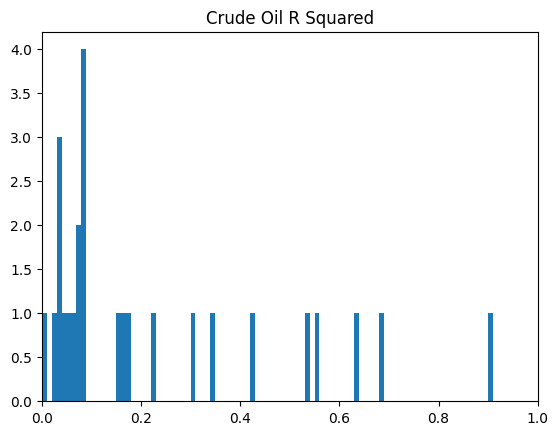

277 230


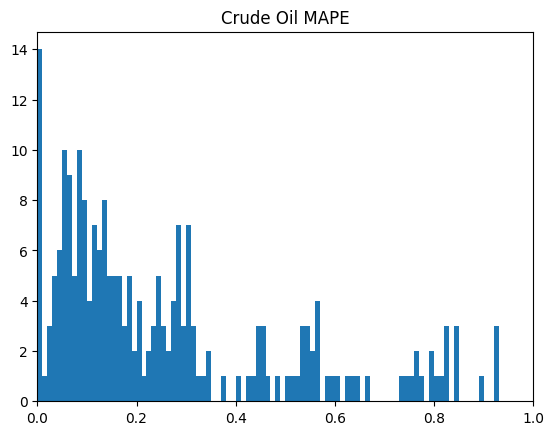

277 214


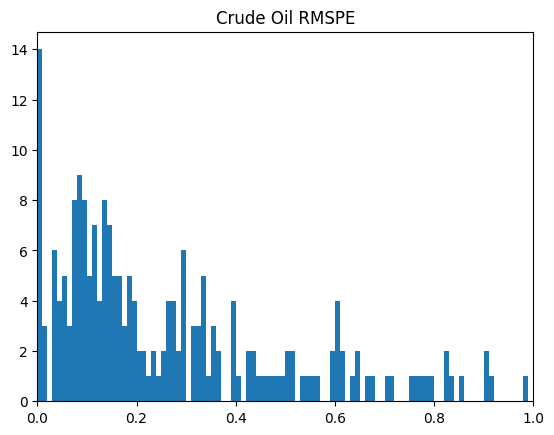

In [ ]:
# Extract data series of crude oil by filtering
cat_df_arima = accuracy_score_df_arima[accuracy_score_df_arima['category']=="crude_oil"]
print(cat_df_arima.shape[0],cat_df_arima[(cat_df_arima['r2_score']<=1) & (cat_df_arima['r2_score']>=0)].shape[0])

# Histograms of all crude oil accuracy measures
plt.hist(cat_df_arima['r2_score'], bins=np.arange(0, 1, 0.01))
plt.title("Crude Oil R Squared") 
plt.xlim(left=0, right = 1)
plt.show()
plt.hist(cat_df_arima['MAPE'], bins = np.arange(0, 1, 0.01))
print(cat_df_arima.shape[0], cat_df_arima[(cat_df_arima['MAPE']<=1) & (cat_df_arima['MAPE']>=0)].shape[0])
plt.title("Crude Oil MAPE") 
plt.xlim(left=0, right = 1)
plt.show()
plt.hist(cat_df_arima['RMSPE'], bins = np.arange(0, 1, 0.01))
print(cat_df_arima.shape[0], cat_df_arima[(cat_df_arima['RMSPE']<=1) & (cat_df_arima['RMSPE']>=0)].shape[0])
plt.title("Crude Oil RMSPE") 
plt.xlim(left=0, right = 1)
plt.show()

# Oil Products

277 39


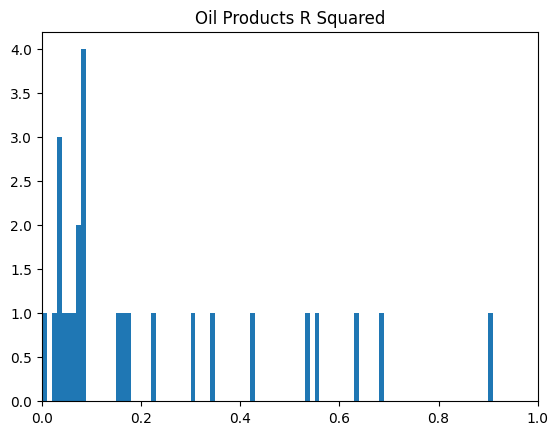

277 230


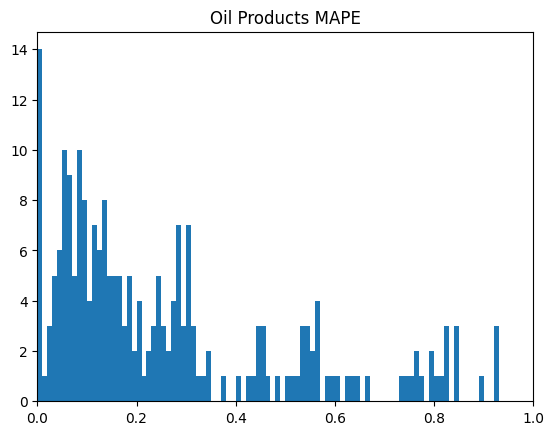

277 214


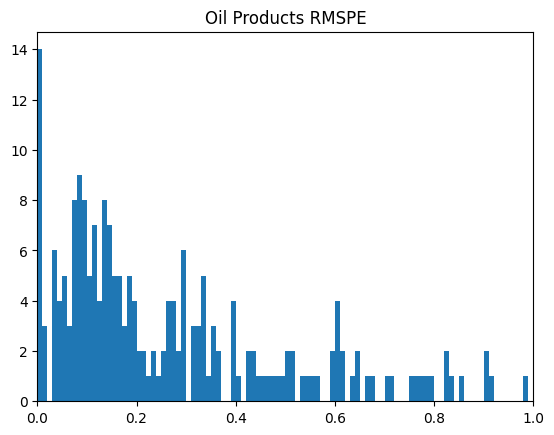

In [ ]:
# Extract data series of oil products by filtering
cat_df_arima_arima = accuracy_score_df_arima[accuracy_score_df_arima['category']=="oil_products"]
print(cat_df_arima.shape[0],cat_df_arima[(cat_df_arima['r2_score']<=1) & (cat_df_arima['r2_score']>=0)].shape[0])

# Histogram of all oil products accuracy measures
plt.hist(cat_df_arima['r2_score'], bins=np.arange(0, 1, 0.01))
plt.title("Oil Products R Squared") 
plt.xlim(left=0, right = 1)
plt.show()
plt.hist(cat_df_arima['MAPE'], bins = np.arange(0, 1, 0.01))
print(cat_df_arima.shape[0], cat_df_arima[(cat_df_arima['MAPE']<=1) & (cat_df_arima['MAPE']>=0)].shape[0])
plt.title("Oil Products MAPE") 
plt.xlim(left=0, right = 1)
plt.show()
plt.hist(cat_df_arima['RMSPE'], bins = np.arange(0, 1, 0.01))
print(cat_df_arima.shape[0], cat_df_arima[(cat_df_arima['RMSPE']<=1) & (cat_df_arima['RMSPE']>=0)].shape[0])
plt.title("Oil Products RMSPE") 
plt.xlim(left=0, right = 1)
plt.show()

# NGLs

25 9


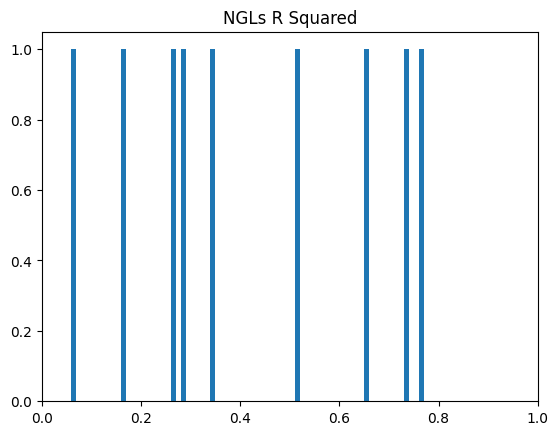

25 24


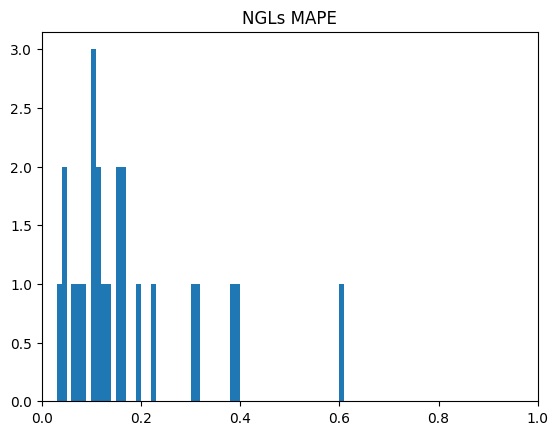

25 24


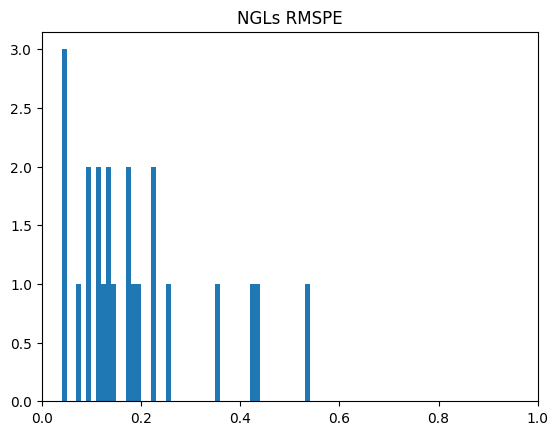

In [ ]:
# Extract NGLs data by filtering
cat_df_arima = accuracy_score_df_arima[accuracy_score_df_arima['category']=="NGLs"]
print(cat_df_arima.shape[0],cat_df_arima[(cat_df_arima['r2_score']<=1) & (cat_df_arima['r2_score']>=0)].shape[0])

# Histogram of all NGLs accuracy measures
plt.hist(cat_df_arima['r2_score'], bins=np.arange(0, 1, 0.01))
plt.title("NGLs R Squared") 
plt.xlim(left=0, right = 1)
plt.show()
plt.hist(cat_df_arima['MAPE'], bins = np.arange(0, 1, 0.01))
print(cat_df_arima.shape[0], cat_df_arima[(cat_df_arima['MAPE']<=1) & (cat_df_arima['MAPE']>=0)].shape[0])
plt.title("NGLs MAPE") 
plt.xlim(left=0, right = 1)
plt.show()
plt.hist(cat_df_arima['RMSPE'], bins = np.arange(0, 1, 0.01))
print(cat_df_arima.shape[0], cat_df_arima[(cat_df_arima['RMSPE']<=1) & (cat_df_arima['RMSPE']>=0)].shape[0])
plt.title("NGLs RMSPE") 
plt.xlim(left=0, right = 1)
plt.show()

# Liquids

12 2


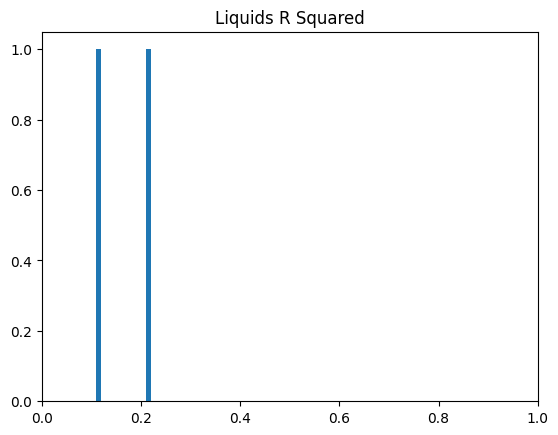

12 12


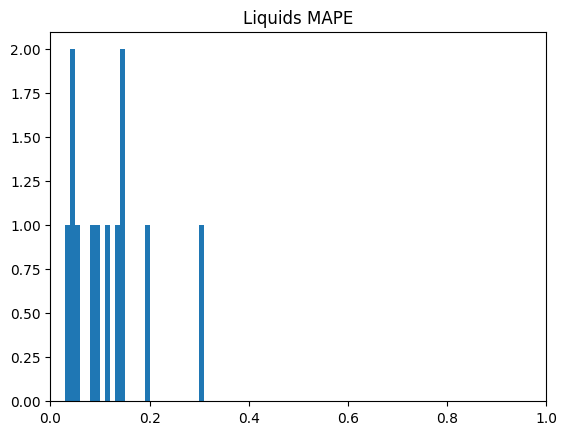

12 12


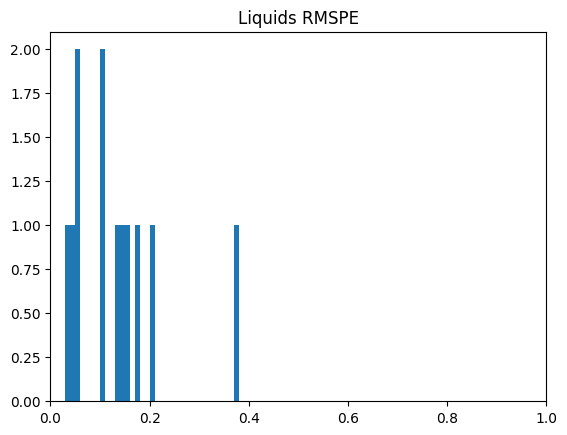

In [ ]:
# Extract Liquids data by filtering
cat_df_arima = accuracy_score_df_arima[accuracy_score_df_arima['category']=="liquids"]
print(cat_df_arima.shape[0],cat_df_arima[(cat_df_arima['r2_score']<=1) & (cat_df_arima['r2_score']>=0)].shape[0])

# Histograms of Liquids' accuracy measures
plt.hist(cat_df_arima['r2_score'], bins=np.arange(0, 1, 0.01))
plt.title("Liquids R Squared") 
plt.xlim(left=0, right = 1)
plt.show()
plt.hist(cat_df_arima['MAPE'], bins = np.arange(0, 1, 0.01))
print(cat_df_arima.shape[0], cat_df_arima[(cat_df_arima['MAPE']<=1) & (cat_df_arima['MAPE']>=0)].shape[0])
plt.title("Liquids MAPE") 
plt.xlim(left=0, right = 1)
plt.show()
plt.hist(cat_df_arima['RMSPE'], bins = np.arange(0, 1, 0.01))
print(cat_df_arima.shape[0], cat_df_arima[(cat_df_arima['RMSPE']<=1) & (cat_df_arima['RMSPE']>=0)].shape[0])
plt.title("Liquids RMSPE") 
plt.xlim(left=0, right = 1)
plt.show()

# Condensate

3 0


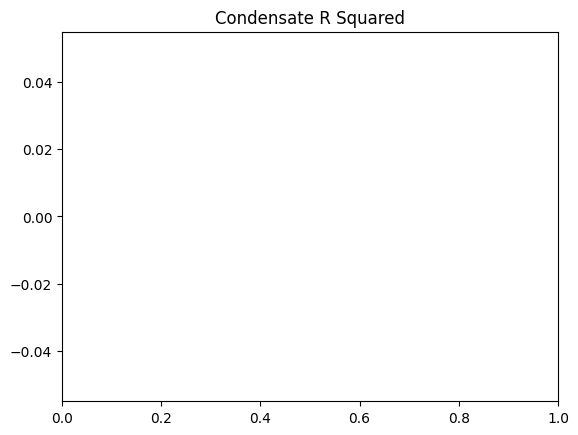

3 2


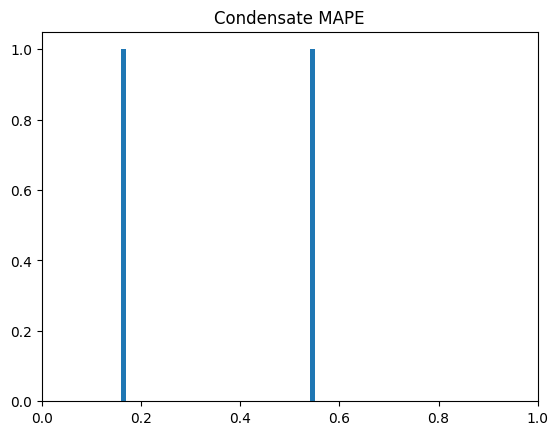

3 2


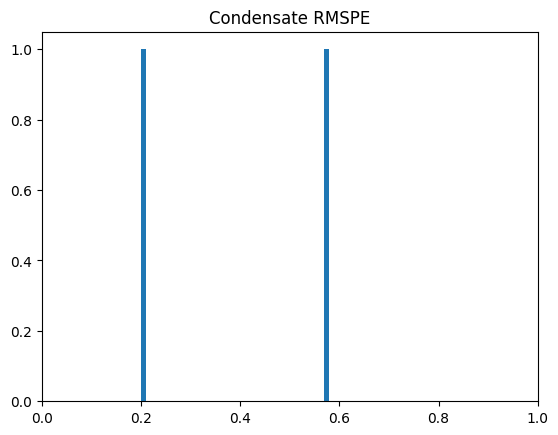

In [ ]:
# Extract data of Condensate by filtering
cat_df_arima = accuracy_score_df_arima[accuracy_score_df_arima['category']=="condensate"]
print(cat_df_arima.shape[0],cat_df_arima[(cat_df_arima['r2_score']<=1) & (cat_df_arima['r2_score']>=0)].shape[0])

# Histograms of all Condensate's accuracy measures
plt.hist(cat_df_arima['r2_score'], bins=np.arange(0, 1, 0.01))
plt.title("Condensate R Squared") 
plt.xlim(left=0, right = 1)
plt.show()
plt.hist(cat_df_arima['MAPE'], bins = np.arange(0, 1, 0.01))
print(cat_df_arima.shape[0], cat_df_arima[(cat_df_arima['MAPE']<=1) & (cat_df_arima['MAPE']>=0)].shape[0])
plt.title("Condensate MAPE") 
plt.xlim(left=0, right = 1)
plt.show()
plt.hist(cat_df_arima['RMSPE'], bins = np.arange(0, 1, 0.01))
print(cat_df_arima.shape[0], cat_df_arima[(cat_df_arima['RMSPE']<=1) & (cat_df_arima['RMSPE']>=0)].shape[0])
plt.title("Condensate RMSPE") 
plt.xlim(left=0, right = 1)
plt.show()

# Biofuels

3 1


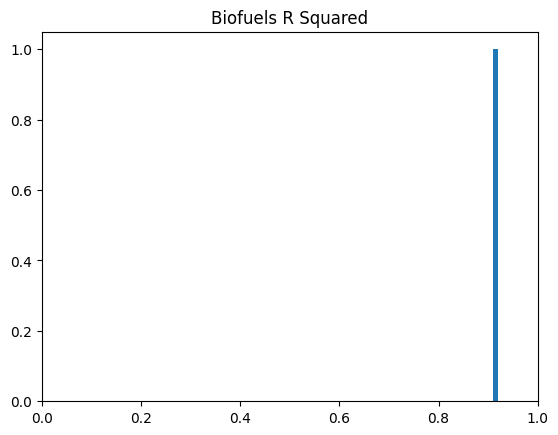

3 3


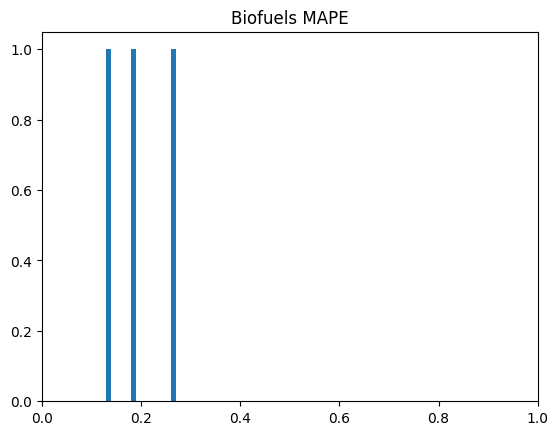

3 3


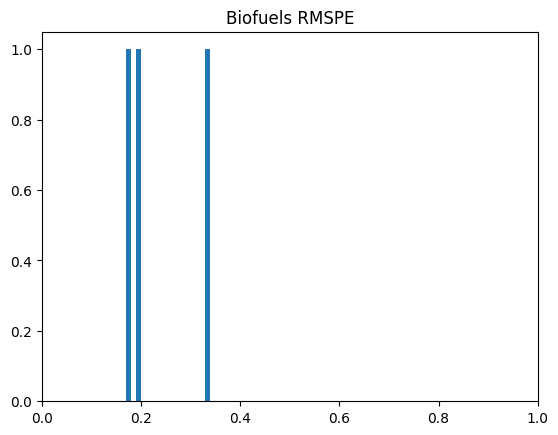

In [ ]:
# Extract all Biofuels data by filtering
cat_df_arima = accuracy_score_df_arima[accuracy_score_df_arima['category']=="biofuels"]
print(cat_df_arima.shape[0],cat_df_arima[(cat_df_arima['r2_score']<=1) & (cat_df_arima['r2_score']>=0)].shape[0])

# Histogram of all Biofuels accuracy measures
plt.hist(cat_df_arima['r2_score'], bins=np.arange(0, 1, 0.01))
plt.title("Biofuels R Squared") 
plt.xlim(left=0, right = 1)
plt.show()
plt.hist(cat_df_arima['MAPE'], bins = np.arange(0, 1, 0.01))
print(cat_df_arima.shape[0], cat_df_arima[(cat_df_arima['MAPE']<=1) & (cat_df_arima['MAPE']>=0)].shape[0])
plt.title("Biofuels MAPE") 
plt.xlim(left=0, right = 1)
plt.show()
plt.hist(cat_df_arima['RMSPE'], bins = np.arange(0, 1, 0.01))
print(cat_df_arima.shape[0], cat_df_arima[(cat_df_arima['RMSPE']<=1) & (cat_df_arima['RMSPE']>=0)].shape[0])
plt.title("Biofuels RMSPE") 
plt.xlim(left=0, right = 1)
plt.show()

# Power

9 2


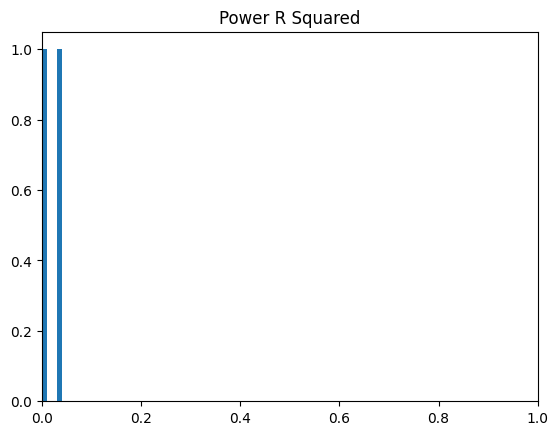

9 9


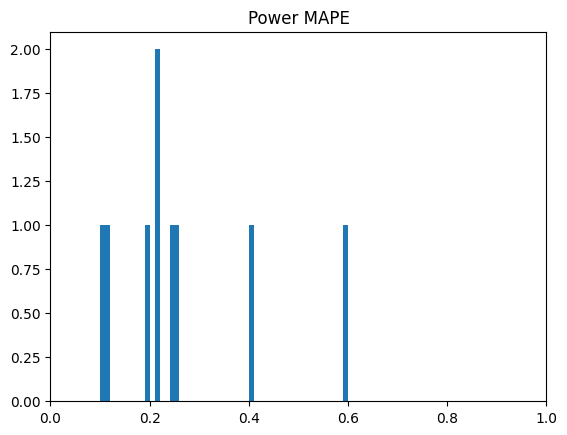

9 8


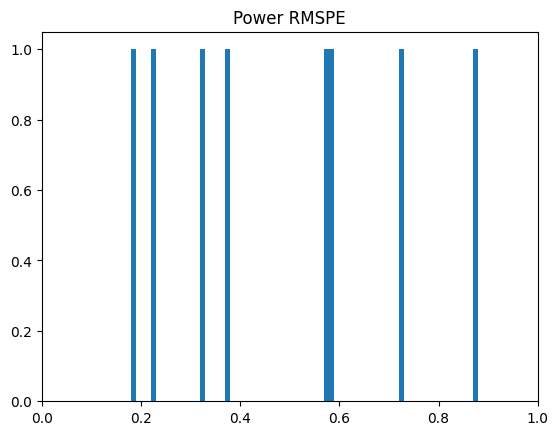

In [ ]:
# Extract Power data by flitering
cat_df_arima = accuracy_score_df_arima[accuracy_score_df_arima['category']=="power"]
print(cat_df_arima.shape[0],cat_df_arima[(cat_df_arima['r2_score']<=1) & (cat_df_arima['r2_score']>=0)].shape[0])

# Histogram of all Power accuracy measures
plt.hist(cat_df_arima['r2_score'], bins=np.arange(0, 1, 0.01))
plt.title("Power R Squared") 
plt.xlim(left=0, right = 1)
plt.show()
plt.hist(cat_df_arima['MAPE'], bins = np.arange(0, 1, 0.01))
print(cat_df_arima.shape[0], cat_df_arima[(cat_df_arima['MAPE']<=1) & (cat_df_arima['MAPE']>=0)].shape[0])
plt.title("Power MAPE") 
plt.xlim(left=0, right = 1)
plt.show()
plt.hist(cat_df_arima['RMSPE'], bins = np.arange(0, 1, 0.01))
print(cat_df_arima.shape[0], cat_df_arima[(cat_df_arima['RMSPE']<=1) & (cat_df_arima['RMSPE']>=0)].shape[0])
plt.title("Power RMSPE") 
plt.xlim(left=0, right = 1)
plt.show()

Below is an example of applying ARIMA to predict the value on a rolling basis

In [ ]:
# Extract one data series as an example to run ARIMA on a rolling basis  
df_sample = get_data(dataset_ids=[1560], date_from="2000-01-01")
df_sample = df_sample.set_index("Date")

print(df_sample.shape)

median_data = df_sample.median()[0]
    
min_allowed = median_data/100
df_sample.iloc[(df_sample.iloc[:,0]<=min_allowed),0] = np.nan
    
df_sample = df_sample.bfill().ffill()
df_lens_sample = df_sample.shape[0]
predictions = []

train_end = 100
test = df.iloc[:,train_end]

for i in range(train_end,df_lens_sample):
    train_df = df_sample.iloc[:i]
    model = ARIMA(train_df.iloc[:,0], order = (1,1,1))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    print(yhat)
    predictions.append(yhat)
   

https://api.energyaspects.com/data/timeseries/csv?api_key=71d5f5dd-78a5-4a12-a950-5994cf6d7a71&dataset_id=1560&date_from=2000-01-01
(1298, 1)


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  median_data = df_sample.median()[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareF

1012796.575609918
1008469.5176691937


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1003149.8907510217
996172.3252455669


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

993014.3746708662


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

998802.4366076622
998593.0591687524


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1000544.5008400695
1001882.3580997189


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1000515.5181330122
1000419.9963389776


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

993779.0304455034


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

988140.973462026


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

984733.4749254625


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

983375.3286420233


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

982605.9802708788
973498.4148092363


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

979896.9405439618
982206.1284321101


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

975889.1547559724
980804.7954806729


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

987790.3690446523


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

989995.5563558402
990599.3290792257


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

998645.1184193502


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1002155.4043302239
1008093.0303887214


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1010040.6345129546
1014724.3709931894


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1013138.7665169182


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1014881.413051682


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1011575.8933417457
1015976.4647882859


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1013791.7756132066
1012265.9997449644


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1008767.0104051937
996322.3793713135


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

997607.8193170142


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

996859.0521532309
990806.3075685899


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

993762.5404863195
988170.3428660571


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

986714.2893963581
978264.207280203


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

966120.5665482418


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

963766.6977214435
966010.2068077346


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

962786.8345961135
967282.3474452272


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

962341.3365369553
964151.4319691772


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

959864.2390062077
960835.2638544746


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

965366.3938733783


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

960400.4049449979


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

954818.9335022023
938980.8906160278


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

937005.3145592711


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

935256.661634527


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

929123.9074093144


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

919426.5372803381


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

902665.0032554532


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

896588.5299418963
889842.1894449363


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

882152.4921243028
879178.921268684


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

868491.1648497574
865802.5786292711


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

870401.2923882577


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

875801.8753359391
868345.8708788763


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

871144.4862188135


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

882664.0614549791


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

889366.2298902798


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

889022.594776489


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

888549.0846701051


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

895897.1511035985
896503.9364524824


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

905495.703375558
907846.9959742271


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

913778.2662852606
912698.3685867736


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

908470.0401366295
909095.5420589981


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

914388.0790758664


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

912225.3025956923
914859.8797406971


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

920473.193159878


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

915907.2030997467
916669.3435870361


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

913560.5214622008


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

918780.6391389784


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

923115.1015769723


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

933872.0403705839


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

942172.6471390771


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

947255.1191067621


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

949894.4673975926


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

949013.7063430394


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

948943.6071098145


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

952432.5195530631
949480.7099088192


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

944558.4527392363
942995.5508911101


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

935927.7777570819


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

936750.0065636244
932723.717600477


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

921148.1737813796


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

918103.3427486272
912986.4339559326


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

915609.1945597893
912049.4203504135


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

911008.023084748
899105.4088529818


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

896291.4887415057


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

885700.8258124641


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

884067.2642552407


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

879361.7364964805


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

882018.5748701359


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

888750.9356037206
890515.4790097774


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

896266.6465115272


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

902083.4547686651


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

896818.0287517451


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

891715.3619932041


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

896215.2694324902


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

902929.6344551684


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

910930.0350833348
913821.1164549442


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

917353.3862139139


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

918528.9799412901


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

927233.4202772714


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

930864.5659579743


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

935470.6747573243
940116.6339801215


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Se

944193.7521439304


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

950217.7185574567


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

950650.3397106715


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

952373.8028281772
959592.82326105


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

962268.5304566248
960380.6306719765


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

961878.8062670454
963110.1739116063


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

962207.0952505018


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

962589.9297491079


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

958992.8673267594
946016.6990013457


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

946545.9883887923


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

946315.1483380155


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

945481.3272300592


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

942470.4318386386


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

943712.3202636177


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

947563.5482898754


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

950376.3211468058
948479.1218664335


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

950334.1078794298
956630.1401537899


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

962194.5570911487


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

959283.8966997222


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

958645.4582613484
951887.7465945596


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

949465.3694964697


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

944538.117904568


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

947414.621642533
945156.8909753251


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

942032.4570952236
936658.6388320387


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

935146.3328410265


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

934522.1408109331


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

934927.9247869563


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

936264.4623130286


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

931150.3748764221


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

931341.4717615416


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

936883.5834553075
939970.4963338407


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

945729.1070020738


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

944531.9518816676


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

951180.6220136784


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

956177.0593698953


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

962875.0705274801


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

970994.1485003582
974999.7031578476


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

982410.2084662836


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

982407.9935830578


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

985240.7877090028


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

988146.0539787705


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

997495.3112351554
999376.048535475
1000358.1343701201


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1002808.2542154947


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1000570.2355168236


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1005444.2597417937


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1008823.4154739078


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1005546.5031621866


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1005987.848978595


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1008437.6714737287
993655.9159620745


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

989543.9232726472
996326.6117083173


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

998820.5086455706


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

988982.5111765245


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

981988.7926318762


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

988191.3840284707


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

987961.5375682866


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

989491.7895502561


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1000971.8100593799


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

999944.186637032


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1001552.2304657263


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1003722.1162839928


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1009540.1832119842


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1010836.1366668831


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1003024.9905341805


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

995720.4796849489


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

993558.8802688307


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

995120.064997723


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1000314.6887669057


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1004171.1877489848


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1006019.6307812457


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1008802.3672209455


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1012951.9212056564
1010925.0244109731


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1007004.2571666269


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1008129.2529829417


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1005110.2081404639


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

999644.4931354353


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

996351.872022673


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

991745.6747253778


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

988970.5305775661
983137.5005432571


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

985903.9639741366


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

988075.6223872722


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

993504.4952619271


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

995288.2363971781
998879.5184736805


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1006962.3758632734


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1013430.7371944239


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1020078.1022932704


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1027909.3579470484
1028490.9926251572


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1028778.9173907491


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1026964.1602016255


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1033583.5109244102


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1036112.4130334116


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1041242.254991315
1039226.7008532473


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1040391.1854838314
1044643.5193801108


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1048646.3906344515


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1050505.2405822605


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1054939.7268437326


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1059196.6713841124


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1068327.2143219889


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1072359.364520634


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1072624.9987194978


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1066886.5321573843


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1055607.4636043943


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1052272.7650727413


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1045523.1642637528


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1036533.3094451535


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1040368.0959875103


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1032845.4867676423
1028478.202943074


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1021026.8346139113


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1013111.0759017334
1005749.667503948


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1007514.9365862884
1014108.8518552405


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1023110.6554246659


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1024566.1717881978
1024870.1675999867


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1014426.3082669413
1003180.1916150595


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

992151.2097702374
983286.4874907909


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

967430.9014518651


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

964839.1550172138
961909.3795199078


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

962275.8529328033


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

964892.0601975687


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

964792.5489556774


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

965005.5055279492
964879.4763028714


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

965033.8845877004
971273.1783998129


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

978166.523743835


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

984526.5356122676
986270.7007041211


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

990037.9677739372
990715.2449635161
1000566.4226109214


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1001143.759762506
1009365.1175369214


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1011814.8514035756
1013075.2490478737


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1017809.9245642701
1017085.6687261248


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1016975.0519665782
1012494.9449497564


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1013006.0740445661
1010857.0388180077


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1005461.6931121399
1002108.2364604503


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

999248.7085388891
1003407.817946503


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1004352.4592897056
1003834.5692764985


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1006357.9670930416
998545.3896826861
997458.6002215807


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

996411.0711975879
997046.9738206054


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

990193.293086835
988408.3567753


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]


984623.8752718627
983073.8936275434


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Se

974746.5861779703
964313.5814036332


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

956960.8605088897
949125.4787490193


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

952702.2857356808


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

954830.4442369238
953872.6142180312


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

963186.8533164866
963961.6613811976


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Se

960270.5287587311
962916.9809384856


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

958476.9820979498
965255.9444193665


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

962359.4943672047


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Se

955851.5051418593


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

957340.4597154654
948708.0219615331


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

940722.9712599459
941494.7159439321


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

950282.2989329826


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

955751.0168161767


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

960777.322875426
960368.7251707845


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

950669.8598978707


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

950926.2433373588


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

951154.1606459282


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

951741.6105094482


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

957192.8786286159


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

959428.4262736796


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

956303.2770757722


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

963763.8865821003
965727.069251559


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

968261.99156504


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

970790.4636465887
965358.3827410038


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

973610.2604277898


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

975871.2933866715
972279.7723479259


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

957146.4606110564


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

945080.1113644866
927379.9981544663


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

927704.0457586464


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

947412.7137288869


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

959130.1953247528


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

968618.4947342067


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

975318.40844894


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

980472.4861907271


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

981530.0448086566


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

984310.915357774


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

993983.4701935952


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

993615.7730014384


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1000230.178435359


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

997520.513188066


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

995946.4071828184


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

991829.6653441736


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

998840.8031460892


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1007109.6138292769


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1018873.3014225174


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1022413.5941061784


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1023848.3563950739


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1026353.6757952461


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1020197.8416502823


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1017268.2087994962


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1018300.1904096393


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1020686.8708674269


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1023731.4826984


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1026563.1980851442


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1032963.0831851137


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1035638.575423035


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1043786.7237581689


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1055102.8371278415


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1060528.511073132


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1068862.000766903


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1067636.9109034045


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1066888.860128353


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1069095.7462261603


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1084140.541056737


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1082433.4895138412


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1080902.472584432


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1086210.048401765


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1090594.9704766124


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1095923.9662028754


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1097434.2558794862


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1099296.057441044


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1104873.6452286586


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1102133.251753403


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1103482.298388452


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1090726.3903769986


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1087591.2505119164


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1083137.570936091


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1078126.3797304588


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1074854.6317949553


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1082874.285054659


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1087470.7946794874


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1091056.20358487


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1085273.9058343095


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1081144.8907823998


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1079540.3436443


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1071167.260948694


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1072126.8730321133


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1067973.0287670444


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1067093.645983434


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1072491.711789209


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1068247.1910856704


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1055599.0225884863


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1041480.9057179195


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1033356.8197036621


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1028391.0173941996


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1031910.4579599664


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1030323.9240609691


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1024595.1872958617


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1025354.4145474146


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1027105.1373843635


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1024689.6238664621


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1026123.9027071871


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1025771.417396679


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1020503.6315579396


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1018061.5977796364


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1018406.5297089604


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1021600.3831026686


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1028907.8069590157


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1028626.3251994142


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1039346.6257263952


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1052216.6579177289


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1061998.9337491323


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1065404.3883612922


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1066612.460453282


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1072446.5079364222


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1070196.8207580114


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1069911.2956200996


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1074343.2184598448


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1077023.5769862786


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1080597.5504438167


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1080882.999181451


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1084067.0020351557


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1089191.2446804729


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1098178.4018192324


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1104279.4096986866


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1104736.5304873404


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1109748.422281056


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1118661.4641970766


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1122702.0429817634


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1122991.9938670464


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1120085.9724044162


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1123380.9458599824


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1118280.573578405


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1118122.6513366934


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1113458.0304000692


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1111438.9616105212


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1112022.6931232568


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1106571.774480479


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1094498.9728868473


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1085408.9628413068


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1085143.634934413


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1085095.0310198003


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1079469.108314553


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1064012.749431866


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1057842.3310597364


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1048684.5877925619


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1042483.1460575785


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1043049.6980248399


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1045406.7419245447


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1047796.4749753927


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1053325.70160693


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1056430.2481855834


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1047987.1804487369


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1035964.0379848916


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1029434.3412273733
1023021.7777445166


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1017898.7913918783
1016999.6483606179


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1020327.5045671383


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1020233.3481306958
1015282.7398202406


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1008543.6159568765


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1011474.1974723572


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1019023.9734678272


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1025290.9628746932


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1025177.8278771731


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1031991.7696334677


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1039230.057541795


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1040879.2754487902


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1040242.8403274617


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1043365.2539761331


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1043016.0830185165


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1043516.7565146873


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1047858.8798313395


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1051651.7436997457
1063057.948250515


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1065627.825521354


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1057470.7052867084


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1062054.8011788754
1066000.7570033742


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1070348.9342304675
1066011.0012985002


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1061384.338280753


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1056128.2787062186


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1057259.6049475493
1052610.1136387514


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1051100.687446973
1040168.1005648678


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1040876.4177370084
1042688.3068344168


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1027013.1585596934


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1018444.9863046842


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1014501.9406974835


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1022251.4053915549


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1031537.810082171
1033538.047425557


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1015328.6243610053


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1018450.2885613967
1021860.952159415


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1028176.9196802654


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1026103.8358242885
1021819.1975835257


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1029891.68924871
1034051.1969809886


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1030066.6181145828
1033324.9681723396


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Se

1033861.0972592868


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1032455.4766242533
1028004.2646039434


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1029555.4445264272
1035888.5253105527


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1048274.7773602797
1044097.3876380149


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1041864.0967236405
1041845.5086628386


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1043755.7555271016
1046931.6082202701


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1049805.447722157
1050859.5128723532


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1056363.433349253
1061499.9736554886


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1062649.1276515797
1073747.504785677


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1076335.8287306586
1072241.6739720188
1075041.9498617228


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1076471.643638759
1086620.5761935317


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1079369.3932967025
1078278.4279133212


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Se

1073688.7800163233


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1070683.015709599
1075360.5691512963


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1065728.0398957229
1068511.6745942072


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1079938.0175858843
1077255.2104125195


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1074816.9571705468
1070282.9696450692


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1067608.5271443503
1071591.6333706358


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1071487.1198925395


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1071986.568579225
1067248.2955196556


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1061029.7214851296


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1059608.2391622358
1065558.6568703968


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Se

1070779.8383876912
1068823.1288702108


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1071830.0356488577
1061781.8967917527
1072334.8519652763


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1075771.7056346114
1073123.4456049325


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1075099.4650535008
1074892.8879287418


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1067515.0354260462
1066270.037873234


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1060368.501544149
1057848.230064483
1052261.9326938035


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1050811.3881124537
1048902.3776162574


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1048795.824012626
1054294.8333385636


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1056924.1195219667
1054975.9350489774


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1067353.0033204802
1070959.9237090552


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1073607.9208148476
1077836.7558968132


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1087597.2017415953
1086405.905162599


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1099334.6574191984
1106096.8890097914


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1115417.7128124672
1100708.6123927922


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Se

1093599.4053197834
1093398.6815928654


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1091117.4065766346
1092741.8483729865


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1093386.215694706
1091527.2594514699


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1088703.1542189298
1090878.461163084


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1092646.9444252981


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1096340.8013925452
1090246.3460932423


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1091734.1450609774
1096777.063203663


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1098429.6865507474
1098314.2672053382


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1102018.9407892588
1096211.1692410852


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1087410.3366986944
1081482.9761544908


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1069735.0028572725
1068110.6369488072


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1061019.5421525745
1055879.0455556435


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1043265.1778479366


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1030500.1274589335


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1023934.5584617585


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1025791.708171817


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1015428.2991904671


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1011524.8872010448


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1007755.4955454239


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1002430.3168883318


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1004326.4485642853


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1001785.8673551681


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1001306.7810726234


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1003510.6979922093


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1001605.6596920688


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1001107.4904906291


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1006617.0435254461


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1005284.474074195


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1010724.6068063991


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1025259.4055275258


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1037259.4982593606


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1045137.5517977488


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1052555.3273134222


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1055968.9441191403


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1058034.5765795356


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1061240.19808527


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1070085.5441014576


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1076110.2156329919


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1082154.8620156753


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1087319.6402285828


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1086828.9896682857


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1091407.149465523


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1092602.3236539909


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1097876.2903403623


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1097330.5447139002


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1089154.5465359958


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1090762.4343994674


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1090058.474517018


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1091500.1749242968


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1092977.0907419606


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1102807.2448464136


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1107663.4031270926


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1108551.6695009945


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1102673.718208524


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1106469.2410055685


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1107487.80357748


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1111910.8663149332


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1103322.4855206972


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1100951.5290416414


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1094634.1787072916


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1094728.3790878186


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1090007.8988807972


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1088904.3935938147


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1096271.5703504498


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1097399.5561923422


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1103882.5171517348


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1106672.8342638714


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1111847.8150047588


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1121875.3836604338


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1123906.418208553


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1125873.984028007


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1138213.636191224


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1139777.2709449215


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1138892.8099213257


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1141141.9742526682


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1143439.1339511182


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1146556.7343244308


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1153578.9693934552


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1164090.218824692


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1167224.5372076933


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1182204.410858421


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1189377.4385418005


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1198542.3520968854


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1206062.6934619087


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1212263.1792993923


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1206591.4776860287


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1204132.0240180686


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1206410.963310671


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1213890.4821461344


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1213871.015749089


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1216637.0566413258


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1209963.3832297823


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1220463.2135197294


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1231044.2163304558


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1233927.3322463227


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1236908.915942181


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFou

1237006.521382349


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1236991.8829496272


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1243069.2701550429


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1243971.9968706588


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1246936.422145699


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1252582.3530512995


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1255836.3356317678


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1264333.1390122683


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1261188.6561402597


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1264742.4814659967


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1267265.7397986013


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1270633.9607815512


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1272079.2072554664


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1268626.1081580773


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1266737.5089660275


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1269144.6034914062


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1269363.7035922618


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1271729.5281659986


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1273862.6957689002


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1270240.5450921494


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1275142.046641598


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1269884.2571795047


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1269770.7106517393


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1278133.4144696342


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1288180.5111517548


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1294676.0565504036


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1293500.7775962048


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1303190.8254501203


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1303523.848130759


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1307114.1571368854


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1301967.5112765916


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1312241.1981052281


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1311748.4595663033


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1313393.372446068


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1320278.3892507486


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1321589.499396162


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1322022.870624976


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1328778.8218947595


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1328300.5072150743


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1333744.446445074


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1335873.3851369177


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1334007.028718038


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1333244.6635465687


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1332369.8372034312


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1329719.7436733171


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1334122.2539535428


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1333632.3031979906


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1339152.6679241627


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1337921.8268132594


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1341305.5634349477


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1348542.2908963722


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1351201.8165281767


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1354120.707262672


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1356324.3564706973


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1359033.4804800504


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1360665.4104103323


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1367417.108160323


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1371892.7195650544


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1357843.3009248734


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1364003.3625160344


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1357820.8488919735


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1357498.7266302623
1315514.4288807055


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1341437.4455925834


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1337377.8192258505


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1328178.052321681


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1337120.3521222915
1330088.6269535278


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1336999.9773238783


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1336700.4256173698


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1336758.4563451244


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1338129.2350902057


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1335985.1136263562


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1324022.6983422574


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1311033.3744919673


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1317306.270958107


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1331010.363473803


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1329094.5317892544


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1338143.0545094279


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1343683.8082307822


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1345356.680257872


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1356905.670100862


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1345973.6626472587


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1346698.353053461


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1344435.309918959


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1336479.745225516


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1337885.028372657


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1333852.9416539858


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1334984.5289454372


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1330312.8598900551


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1328532.4489983665


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1335055.8316897196


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1336043.4126239025


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1332255.1003053193


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1336578.0680360412


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1333072.1348079012


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1327910.09901883


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1343797.606992231


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1350531.085188907


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1348531.7116277686


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1349389.4686689745


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1335781.9175846449


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1332050.0779011787


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1321722.5233251401


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1312582.9112490064


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1313560.174700083


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1308830.5993449746
1301627.0195305806


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1301636.5302671038
1300509.404365284


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1307042.3070397796


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1308785.9739660795


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1302369.4852894256


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1297412.36887414


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1291053.4767658866


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1289694.7954726212


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1281104.9590041782
1269125.9484997138


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1263484.4721289342
1254371.6705112874


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1257162.7788025641


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1257120.3454323662


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1249539.2261028383


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1247000.2385673234
1244539.4234805058


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1230246.3161774778
1221328.6485878732


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1222686.228022572
1217235.2873460418


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]


1203407.3187458287
1200305.0347760995


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Se

1202093.8689021382


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1206469.7736603625
1203567.2994869212


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1195581.4950325433
1199237.8833065045


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1199318.3430273675


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Se

1194676.206354632


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1188039.7048425446


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1186556.6541403658
1182711.5231143169


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1188746.6417280922


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1178322.361718306
1179564.7046244538


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1184951.6374640563


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1183235.5909588244
1182607.6683839401


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1189484.194438055
1191043.3389507988


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1206854.6935416136


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1205134.706873501


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1205494.0138186014
1201073.650174247


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1204597.0665759074
1197376.2805262709


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1203214.7835301887
1193272.617566886


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]


1203839.0589707673


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Se

1207034.2644552314


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1224414.6449641918


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1221703.2346778868


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1219921.0201551071


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1223806.1759778482


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1233963.8609310656


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1234556.5653270546


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1238996.5504059289
1246639.0205384558


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1258034.4233867028


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1260643.3001965398


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1252124.6547991955


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1245304.6718964728


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1249737.2574569671


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1248044.5406969942


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1248229.6709334746


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1250137.4690997973


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1241360.2368243982


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1235408.541980458


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1224824.1663797647


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1222695.2411227126


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1237215.9625665098


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1250460.054860075


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1255015.9028061766


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1261484.449644065


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1256457.5373840346


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1253194.0038147008


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1259431.8871443756


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1256544.0617408357


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1238355.0223789713


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1238096.2804148584


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1228042.9262105504


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1215517.7353549846


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1215831.1525349622


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1222908.7643674237


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1227079.921979371


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1229624.2794014143


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1238706.9959603106


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1251794.2564984357


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1249854.9689940189


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1264808.503793891


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1281721.4016475554


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1280244.9769207903


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1303191.392940565


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1312467.3333439946


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1311956.2626515783


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1299803.4815750108


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1302507.8424694669


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1298890.8354739754


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1311023.5240001262


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1304403.3978426948


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1294275.4166090458


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1304870.7913322358


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1307372.1748859019


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1311264.5715531874


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1299817.4671967824


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1294876.3701203936


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1291857.6977295508


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1292673.6460286186


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1293245.2048971506


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1292301.8630041718


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1283893.8935644275


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1282133.1475580365


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1272989.5201565446


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1270499.279371974


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1274834.9601764672


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1268769.9400015217


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1263500.1312857321


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1263543.5351455025


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1258439.0009453327


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1275820.0562959362


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1274639.8776906733


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1264084.4109410192


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFou

1261032.8795140611


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1275878.8903837113


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1290323.4119863631


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1288463.872491358


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1289761.6962645547


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1289031.6303647754


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1288031.310471226


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1286957.207983645


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1284988.0109457837


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1273069.8791459722


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1265424.4258791686


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1257897.781700837


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1260304.6081763792


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1281506.7881493517


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1314720.405274629


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1341941.5582958478


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1367484.7924610144


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1377701.9763895087


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1395695.7808500733


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1394911.491840197


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1399991.8704539575


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1414998.5812272066


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1430174.9618984286


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1439815.4850753439


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1446853.1080861788


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1450733.2741974785


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1451808.1487150723


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1461766.6065499524


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1452236.118955742


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1461264.6503986758


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1454607.2512944099


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1452528.6135509952


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1446325.782508638


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1443755.7679679033


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1435917.5061310367


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1428151.3521776646


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1424789.6060201123


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1429211.4720194286


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1421586.5231331661


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1421085.331476955


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1419101.3808734964


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1402093.2603221214


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1394954.625398


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1391140.7097075786


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1376319.006599582


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1364856.1242454168


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1354720.8574376686


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1353789.1193923776


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1353950.631635185


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1374179.0358322535


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1367608.4951582307


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1356805.0542074179


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1341786.8130643682


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1343672.7085413055


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1334125.5299926742


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1333551.2475343833


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1321700.5458204132


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1324808.7191789837


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1313468.5408492535


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1298320.5767196086


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1284503.2485693947


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1281881.7654054868


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1283298.1347997203


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1286939.3100426565


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1291755.8503788174


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1290320.6246958757


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1292666.92614125


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1283451.5249148773


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1287173.3609537245


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1285501.1468395125


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFou

1279849.3325260687


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1283864.166416778


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1283594.5312852538


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1275809.150785366


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1277851.5915275495


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1293544.918980498


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1288638.913959014


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1282765.5757517244


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1278189.4277808517


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1268194.8395327285


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1270859.3896116547


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1275345.5299228937


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1268742.153474412


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1267623.9017648632


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1267512.802926811


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1262143.0654818532


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1257348.132426492


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1243590.3617655956


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1233219.0522305598


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1224462.9713653943


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1221984.0057898695


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1233140.9224683668


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1233835.5264750442


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1238797.1708369195


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1228772.6388342471


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1233333.30157339


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1233939.890252539


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1232722.3899603835


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1223725.3097180654


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1217766.1495231586


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1222196.6924739392


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1226428.303406565


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1210259.6434855652


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1203346.1451325302


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1184257.5950568838


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1194842.0946623066


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1190077.9843367285


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1188595.2020766945


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1184618.1405299455


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1178797.120077667


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1170620.3872937507


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1160695.9332791993


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1158879.1168639492


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1154941.7525982922


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1146955.139686991


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1143426.9717186675


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1136690.8352239511


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1138651.711178742


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1143917.7229383807


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1151059.534265923


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1143007.7595264234


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1143819.2544287897


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1146473.6849424771


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1156487.255815205


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1153383.9472479322


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1154058.9073944883


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1154680.35227953


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1165793.7321695073


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1170681.9052487602


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1174376.361953089


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1180759.172380854


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1185873.76912259


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1207881.205312389


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1208748.2220095126


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1205364.2910473791


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1208969.539842042
1222134.359839868


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1212807.4387992017


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1214171.930418533


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1213965.9176119738


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1225280.165211225


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1230762.6146668002


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1240053.4552415858
1230999.1732597745


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1220783.211853899
1229026.4979342278


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1226457.2061451604


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1224789.7656557295


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1224077.1474642395
1223263.358724902


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1216663.242918165
1220068.0131443746


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1211212.7511351663


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1217251.9698551958
1231308.7251079842


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1219482.076131729


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1208236.8314480379


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1205127.72305672


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1227989.9092803427


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1230127.1956704366


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1234099.1861114036


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1235654.186009299


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1239028.5087732682
1258440.327888083


C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1261682.2275291104


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1258469.4488203838


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1260372.8057510736


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1258395.5300260654


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1247813.7311401272


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1237093.4238341348


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1226029.9131418432


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1234753.4461932213


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1234242.8084660626


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1233834.56587943


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1234261.9840118901


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1234747.9552601194


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1242475.8525181694


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1231433.6979312613


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1243067.197443452


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1255948.2559811308


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1268097.508118395


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1269247.6053462904


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1263856.0260976544


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1261102.2743346745


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1278398.782214612


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1277021.8106547552


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1276496.5221592826


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1265890.8639041774


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1273251.1121544018


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1265671.1595353277


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1262711.0801098219


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1254607.1635703577


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1255129.1431781752


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1265722.1313983952


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1268621.333269575


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1267040.4644085928


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1271759.540232151


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1278106.1952356359


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1265938.784158252


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1265572.76116038


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1262505.4954912968


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1263733.5688449377


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1263666.5159123954


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1268200.2455140825


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1271095.2239785215


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1269306.3536319921


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1259154.1545015427


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1262033.871065442


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1243958.7149593316


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1251177.4218945552


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1260830.4678729072


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1263518.2712385806


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1240779.7327880608


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1231304.6947620204


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1226951.9202856428


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1232313.7983709138


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1231488.1478096712


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1228280.024184812


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1222725.1640248534


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1218002.219478415


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1211830.617831531


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1217337.0144382515


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1215066.4709736372


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1227694.496477543


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1237719.391345677


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1233728.1650876433


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1241733.8588053188


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1239470.1075808285


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1243053.2914384734


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1250626.0156000704


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1263414.7349810046


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1276905.0097696076


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1288342.6876065207


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1287910.790232483


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1296168.8364828627


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1282882.233513775


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1285630.3709302908


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1296203.9197633928


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1291424.8084633409


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1288977.0080632886


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1290245.4741411712


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1287083.2763372338


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1281176.6985061176


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1278157.3944482189


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1270073.4952027965


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1279303.2732977197


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1282646.4182105856


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1267763.0610566975


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1267019.5539433707


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1258837.3982429765


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1251814.6018380339


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1257928.801488746


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1248225.9112976752


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Elain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3

1247191.560539187
1240648.0713762029


C:\Users\Elain\AppData\Local\Temp\ipykernel_26652\1206794243.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  yhat = output[0]


We then run a plot to evaluate the performance of forecast results via ARIMA on a rolling basis on the example time series

In [ ]:
# Define MAPE calculation
def calculate_mape(actual, predicted):
    if not all([isinstance(actual, np.ndarray), isinstance(predicted, np.ndarray)]): 
        actual, predicted = np.array(actual), np.array(predicted)
        
    # Calculate the MAPE value and return 
    return round(np.mean(np.abs((actual - predicted) / actual)), 2)

# Combine actual historical data with the forecast data series 
df_sample.index = pd.to_datetime(df_sample.index)
pred_index = df_sample.index[train_end:]
pred_index
pred_df_arima_wtpiUS = pd.DataFrame(predictions)
pred_df_arima_wtpiUS.set_index(pred_index, inplace= True)

# Calculate MAPE of the forecasts of the ARIMA model trained on rolling basis
mape_arima_testing = calculate_mape(df_sample.iloc[:,0][train_end:], predictions)
mape_arima_testing

0.0

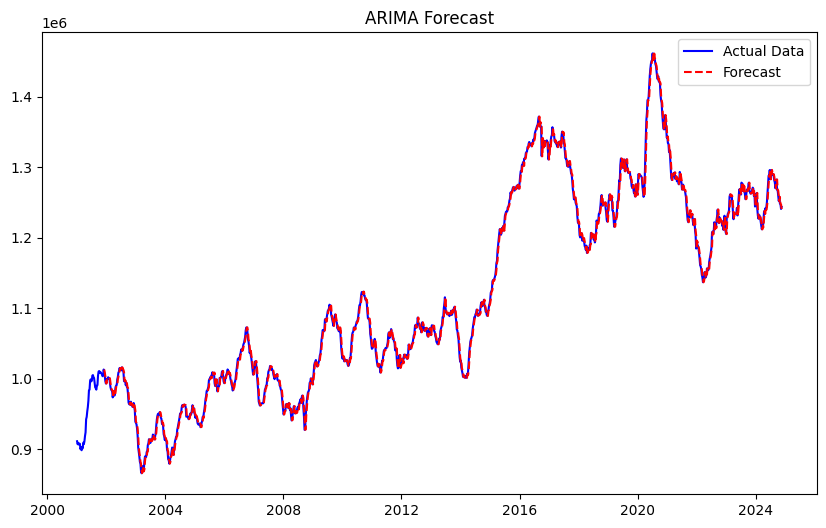

In [ ]:
# Plot the actual values vs the predicted values by time series
import matplotlib.pyplot as plt

# Convert index to time series
df_wtpiUS.index = pd.to_datetime(df_wtpiUS.index)

plt.figure(figsize=(10, 6))
plt.plot(df_wtpiUS.iloc[:,0], label='Actual Data', color='blue')
plt.plot(pred_df_arima_wtpiUS, label='Forecast', color='red', linestyle='--')
plt.title("ARIMA Forecast")
plt.legend()
plt.show()

# c_wtpiUS

# Conclusion
We evaluated the performance of forecasting power of RBEAST and auto-ARIMA and then forecast a sample database by ARIMA model trained on a rolling basis and plot the forecasted values vs actual values for evaluation.

RBEAST is the optimal model out of three in balancing accuracy and computational power required. 

# The End